In [1]:
%load_ext autoreload 
%autoreload 2
%matplotlib inline
import json, os, cv2
from pathlib import Path
import numpy as np
import pandas as pd
from tqdm import tqdm
from scipy.interpolate import interp1d
from scipy import signal
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages
from sklearn.cluster import KMeans
import matplotlib.colors as mcolors
from matplotlib.backends.backend_pdf import PdfPages
from matplotlib.gridspec import GridSpec
import glob 
import seaborn as sns
from brokenaxes import brokenaxes
from frechetdist import frdist
from scipy.ndimage import gaussian_filter
from dipy.segment.metricspeed import AveragePointwiseEuclideanMetric
import ast


import sys
sys.path.insert(0, 'C:/Users/nlab/Documents/GitHub/obstacle_avoidance')

import warnings
warnings.filterwarnings('ignore')
from streamline_clustering.clustering import pair_elements,create_streamlines
from src.base import BaseInput
from src.topcam import Topcam
from src.utils.auxiliary import find_index_in_list,flatten_series
from pipeline.helper_functions import list_columns,interpolate_array,flatten_list_of_arrays,calculate_quartiles,create_df_by_type,split_range_into_parts,get_mean_of_df,get_median_of_df,drop_nans_in_columns,create_consective_df_new,assign_date_index,symmetrize_y_axis,edge_outliers,create_df_by_type_nostart,find_consecutive_repeats,largest_sequentially_increasing_by_one_subarray,create_color_dict,smooth
from pipeline.oa_calculations import distance_calcs,heading_calcs,cluster_obstacle,calculate_distances,df_tortuosity,calculate_speed,deveation,lateral_error,start,redo_ts_trace,compute_tortuosity,angular_velocity_head,turn_direction,turn_to_obstacle,get_head_angle,head_angle_velocity,intial_lateral_error,avg_lateral_error,check_trial_for_obstalce_cross_df,distance_at_head_turn,ts_angle_to_open_corner,zero_out_angle,zero_out_angle_target_port
from pipeline.oa_plotting_funcs import plot_arena,plot_orginal_obstacle,plot_obstacle_from_row
from pipeline.batch_process_oa import plot_oa

Loading DLC 2.3.0...
DLC loaded in light mode; you cannot use any GUI (labeling, relabeling and standalone GUI)


In [76]:

font = {'family' : 'arial',
        'weight' : 'normal',
        'size'   : 20}

plt.rc( 'font',**font);

In [3]:
light = pd.read_hdf(r"D:\obstacle_avoidance\metadata\SFN\data\light_092524_oa.h5")
dark = pd.read_hdf(r"D:\obstacle_avoidance\metadata\SFN\data\dark_092524_oa.h5")
joint = pd.concat([light,dark])
con_df = create_consective_df_new(joint)

long_nostart,short_nostart,middle_nostart = create_df_by_type_nostart(joint)
long_con_nostart,short_con_nostart,middle_con_nostart = create_df_by_type_nostart(con_df)

long,short,middle = create_df_by_type(joint)
long_con,short_con,middle_con = create_df_by_type(con_df)

In [3]:
light = pd.read_hdf(r"D:\obstacle_avoidance\metadata\SFN\data\light_oa.h5")
dark = pd.read_hdf(r"D:\obstacle_avoidance\metadata\SFN\data\dark_oa.h5")
joint = pd.concat([light,dark])

In [82]:

joint = joint.drop(columns=['level_0'])
joint = joint.reset_index()
intial_lateral_error(joint)
avg_lateral_error(joint)
ts_angle_to_open_corner(joint)
zero_out_angle(joint)
get_head_angle(joint)
zero_out_angle_target_port(joint)
angular_velocity_head(joint)
turn_direction(joint)
turn_to_obstacle(joint)
check_trial_for_obstalce_cross_df(joint)
distance_at_head_turn(joint)


In [96]:
zero_out_angle_target_port(joint)

In [100]:
light = joint[joint.task == 'oa']
dark = joint[joint.task == 'oadark']
light.to_hdf(r"D:\obstacle_avoidance\metadata\SFN\data\light_092524_oa.h5",'w')
dark.to_hdf(r"D:\obstacle_avoidance\metadata\SFN\data\dark_092524_oa.h5",'w')

In [97]:
joint.ts_zero_out_angle_to_target_port[0]

array([7.429573008006076, 3.8913678278574193, 6.650287968271964,
       6.820503366117259, 8.14585131429632, 14.06203466629239,
       11.381552254285404, 15.905027561082147, 5.209467282517597,
       2.4578162621517645, 5.167121397788309, 7.007077456194128,
       5.258658399494186, 16.44722828235559, 22.653980793034545,
       20.654339592530228, 20.868063474480593, 20.912208323316086,
       22.021516814454692, 18.997684049915566, 12.91245137329686,
       19.359378683584648, 24.21530976900592, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0], dtype=object)

In [5]:
con_df = create_consective_df_new(joint)

In [6]:
long_nostart,short_nostart,middle_nostart = create_df_by_type_nostart(joint)
long_con_nostart,short_con_nostart,middle_con_nostart = create_df_by_type_nostart(con_df)

In [7]:
long,short,middle = create_df_by_type(joint)
long_con,short_con,middle_con = create_df_by_type(con_df)

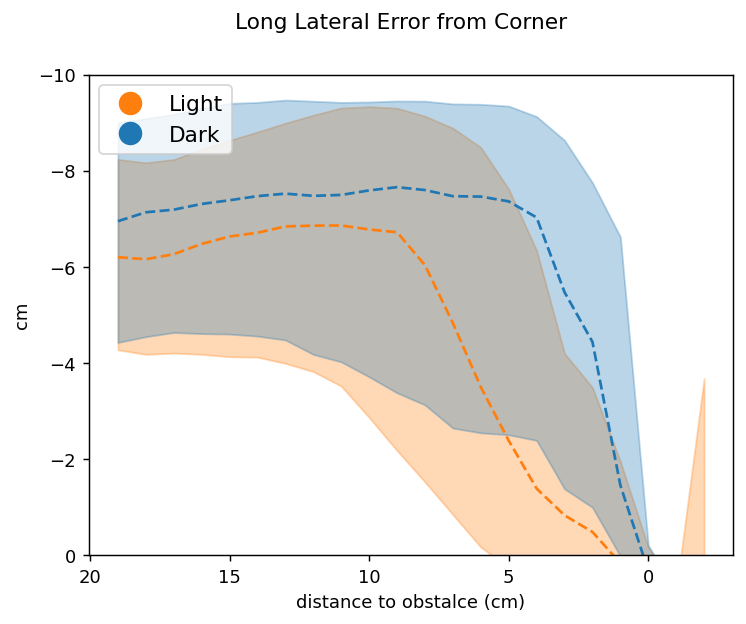

In [35]:

xnew =  np.arange(-2, 20, 1)
xnew= np.flip(xnew)
fig,ax = plt.subplots(dpi = 130)
fig.suptitle('Long Lateral Error from Corner')
ax.invert_xaxis()
ax.invert_yaxis()
ax.set_ylim((0,-10))
data = long
data = drop_nans_in_columns(data,'obstacle_devations')
data = drop_nans_in_columns(data,'lateral_error')
data = drop_nans_in_columns(data,'speed')
for date,date_df in  data.groupby(['task']):
  
   
    rows = date_df.shape[0]
    angle_array = np.empty([rows,xnew.size])
    angle_array[:] =np.nan 
    for i,row in enumerate(date_df.iterrows()):
        interpolater = interp1d(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float),row[1]['lateral_error'][:int(row[1]['obstacle_ind'])].astype(float),bounds_error=False)
        #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['ts_zero_out_angle_to_corner'])
        ynew = interpolater(xnew)
        angle_array[i] = ynew

    date_angle_mean = np.nanmean(angle_array,axis = 0)
    date_angle_median= np.nanmedian(angle_array,axis = 0)

        

    median, q1, q3, iqr = calculate_quartiles(angle_array)
 
    if date == 'oa':
        light_array = angle_array
        ax.fill_between(xnew, q1, q3, color='tab:orange', alpha=0.3, label='IQR')
        #ax.plot(xnew,date_angle_mean,c = 'tab:orange',alpha = 1)
        ax.plot(xnew,date_angle_median,'--',c = 'tab:orange',alpha = 1)
    else:
        ax.fill_between(xnew, q1, q3, color='tab:blue', alpha=0.3, label='IQR')
        #ax.plot(xnew,date_angle_mean,c = 'tab:blue',alpha = 1)
        ax.plot(xnew,date_angle_median,'--',c = 'tab:blue',alpha = 1)
ax.set_ylabel('cm')
ax.set_xlabel('distance to obstalce (cm)')
   
markers = [plt.Line2D([0,0],[0,0],color=color, marker='o', linestyle='',markersize=12) for color in ['tab:orange','tab:blue']]
ax.legend(markers, ['Light','Dark'], numpoints=1,loc = 'upper left',fontsize=12)

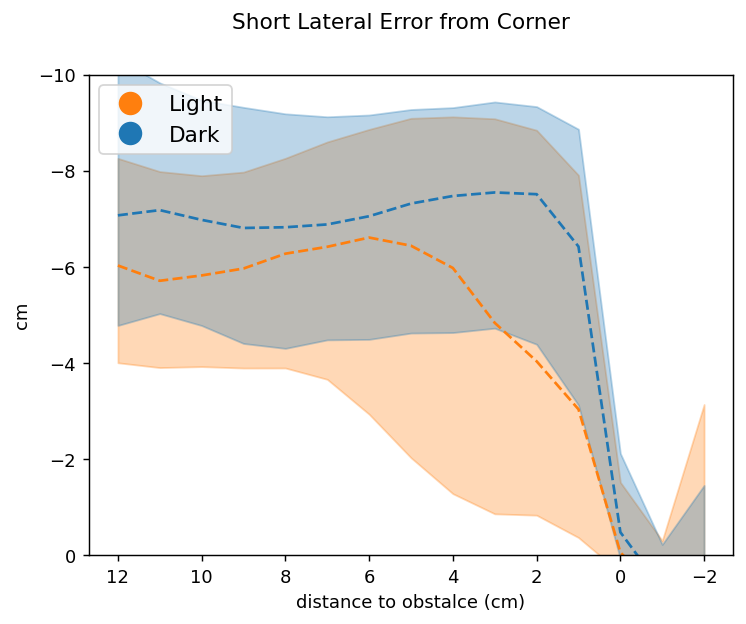

In [40]:

xnew =  np.arange(-2, 13, 1)
xnew= np.flip(xnew)
fig,ax = plt.subplots(dpi = 130)
fig.suptitle('Short Lateral Error from Corner')
ax.invert_xaxis()
ax.invert_yaxis()
ax.set_ylim((0,-10))
data = short
data = drop_nans_in_columns(data,'obstacle_devations')
data = drop_nans_in_columns(data,'lateral_error')
data = drop_nans_in_columns(data,'speed')
for date,date_df in  data.groupby(['task']):
  
   
    rows = date_df.shape[0]
    angle_array = np.empty([rows,xnew.size])
    angle_array[:] =np.nan 
    for i,row in enumerate(date_df.iterrows()):
        interpolater = interp1d(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float),row[1]['lateral_error'][:int(row[1]['obstacle_ind'])].astype(float),bounds_error=False)
        #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['ts_zero_out_angle_to_corner'])
        ynew = interpolater(xnew)
        angle_array[i] = ynew

    date_angle_mean = np.nanmean(angle_array,axis = 0)
    date_angle_median= np.nanmedian(angle_array,axis = 0)

        

    median, q1, q3, iqr = calculate_quartiles(angle_array)
 
    if date == 'oa':
        light_array = angle_array
        ax.fill_between(xnew, q1, q3, color='tab:orange', alpha=0.3, label='IQR')
        #ax.plot(xnew,date_angle_mean,c = 'tab:orange',alpha = 1)
        ax.plot(xnew,date_angle_median,'--',c = 'tab:orange',alpha = 1)
    else:
        ax.fill_between(xnew, q1, q3, color='tab:blue', alpha=0.3, label='IQR')
        #ax.plot(xnew,date_angle_mean,c = 'tab:blue',alpha = 1)
        ax.plot(xnew,date_angle_median,'--',c = 'tab:blue',alpha = 1)
ax.set_ylabel('cm')
ax.set_xlabel('distance to obstalce (cm)')
   
markers = [plt.Line2D([0,0],[0,0],color=color, marker='o', linestyle='',markersize=12) for color in ['tab:orange','tab:blue']]
ax.legend(markers, ['Light','Dark'], numpoints=1,loc = 'upper left',fontsize=12)

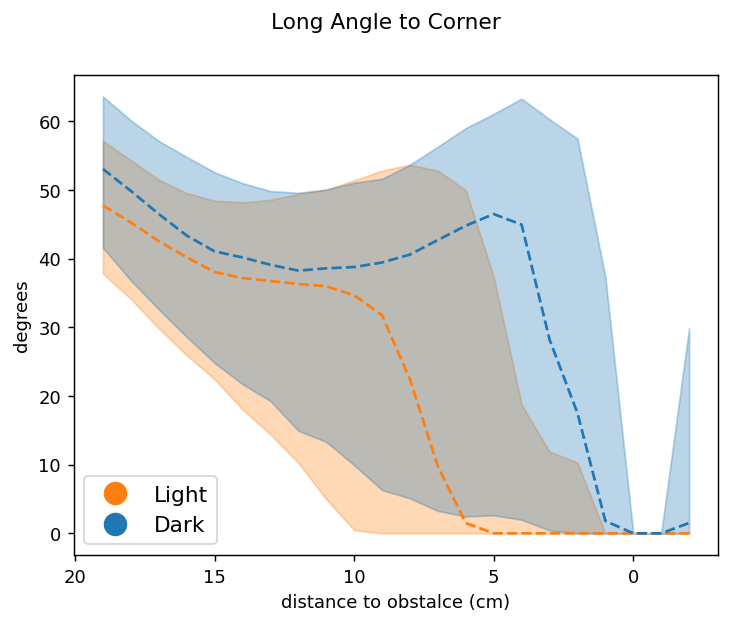

In [341]:

xnew =  np.arange(-2, 20, 1)
xnew= np.flip(xnew)
fig,ax = plt.subplots(dpi = 130)
fig.suptitle('Long Angle to Corner')
ax.invert_xaxis()
data = long
data = drop_nans_in_columns(data,'obstacle_devations')
data = drop_nans_in_columns(data,'lateral_error')
data = drop_nans_in_columns(data,'speed')
for date,date_df in  data.groupby(['task']):
  
   
    rows = date_df.shape[0]
    angle_array = np.empty([rows,len(xnew)])
    angle_array[:] =np.nan 
    for i,row in enumerate(date_df.iterrows()):
        x = row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float)
        y = row[1]['ts_zero_out_angle_to_corner'][:int(row[1]['obstacle_ind'])].astype(float)
        if sum(y) == 0:
            continue
        else:
            #x = resample(x,20)
            #y = resample(np.flip(np.unique(y)),len(x))
            #y = resample(y,len(x))
            interpolater = interp1d(x,y,bounds_error=False)
            #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['ts_zero_out_angle_to_corner'])
            ynew = interpolater(xnew)
            angle_array[i] = ynew

    date_angle_mean = np.nanmean(angle_array,axis = 0)
    date_angle_median= np.nanmedian(angle_array,axis = 0)

        

    median, q1, q3, iqr = calculate_quartiles(angle_array)
 
    if date == 'oa':
        light_array = angle_array
        ax.fill_between(xnew, q1, q3, color='tab:orange', alpha=0.3, label='IQR')
        #ax.plot(xnew,date_angle_mean,c = 'tab:orange',alpha = 1)
        ax.plot(xnew,date_angle_median,'--',c = 'tab:orange',alpha = 1)
    else:
        ax.fill_between(xnew, q1, q3, color='tab:blue', alpha=0.3, label='IQR')
        #ax.plot(xnew,date_angle_mean,c = 'tab:blue',alpha = 1)
        ax.plot(xnew,date_angle_median,'--',c = 'tab:blue',alpha = 1)
        
ax.set_ylabel('degrees')
ax.set_xlabel('distance to obstalce (cm)')
   
markers = [plt.Line2D([0,0],[0,0],color=color, marker='o', linestyle='',markersize=12) for color in ['tab:orange','tab:blue']]
ax.legend(markers, ['Light','Dark'], numpoints=1,loc = 'lower left',fontsize=12)

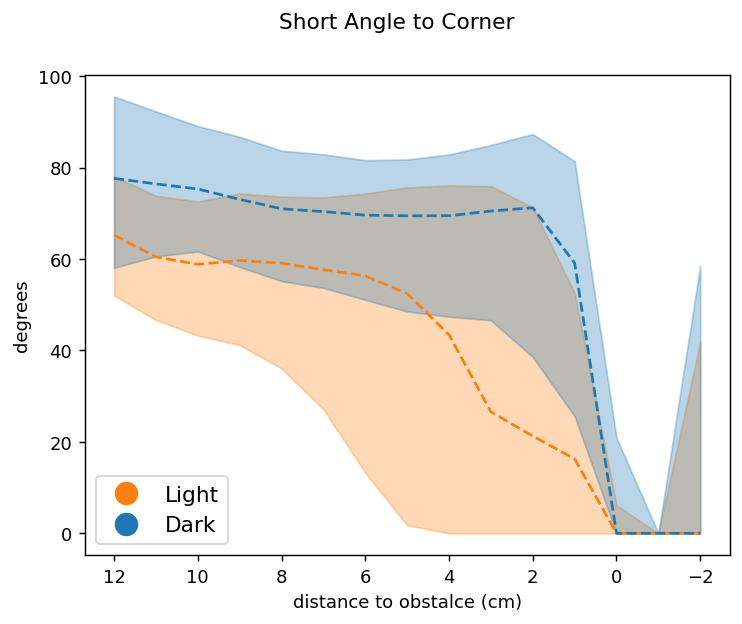

In [42]:

xnew =  np.arange(-2, 13, 1)
xnew= np.flip(xnew)
fig,ax = plt.subplots(dpi = 130)
fig.suptitle('Short Angle to Corner')
ax.invert_xaxis()
data = short
data = drop_nans_in_columns(data,'obstacle_devations')
data = drop_nans_in_columns(data,'lateral_error')
data = drop_nans_in_columns(data,'speed')
for date,date_df in  data.groupby(['task']):
  
   
    rows = date_df.shape[0]
    angle_array = np.empty([rows,len(xnew)])
    angle_array[:] =np.nan 
    for i,row in enumerate(date_df.iterrows()):
        x = row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float)
        y = row[1]['ts_zero_out_angle_to_corner'][:int(row[1]['obstacle_ind'])].astype(float)
        if sum(y) == 0:
            continue
        else:
            #x = resample(x,20)
            #y = resample(np.flip(np.unique(y)),len(x))
            #y = resample(y,len(x))
            interpolater = interp1d(x,y,bounds_error=False)
            #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['ts_zero_out_angle_to_corner'])
            ynew = interpolater(xnew)
            angle_array[i] = ynew

    date_angle_mean = np.nanmean(angle_array,axis = 0)
    date_angle_median= np.nanmedian(angle_array,axis = 0)

        

    median, q1, q3, iqr = calculate_quartiles(angle_array)
 
    if date == 'oa':
        light_array = angle_array
        ax.fill_between(xnew, q1, q3, color='tab:orange', alpha=0.3, label='IQR')
        #ax.plot(xnew,date_angle_mean,c = 'tab:orange',alpha = 1)
        ax.plot(xnew,date_angle_median,'--',c = 'tab:orange',alpha = 1)
    else:
        ax.fill_between(xnew, q1, q3, color='tab:blue', alpha=0.3, label='IQR')
        #ax.plot(xnew,date_angle_mean,c = 'tab:blue',alpha = 1)
        ax.plot(xnew,date_angle_median,'--',c = 'tab:blue',alpha = 1)
        
ax.set_ylabel('degrees')
ax.set_xlabel('distance to obstalce (cm)')
   
markers = [plt.Line2D([0,0],[0,0],color=color, marker='o', linestyle='',markersize=12) for color in ['tab:orange','tab:blue']]
ax.legend(markers, ['Light','Dark'], numpoints=1,loc = 'lower left',fontsize=12)

In [1]:
test = long.sample(10)
for ind,row in test.iterrows():
    
        
    fig,ax = plt.subplots(1,3,figsize=(18,5))
    ax[0].set_xticks([])
    ax[0].set_yticks([])
   
    #ax[1].set_xlim(20,0)
    ax[2].invert_xaxis()
   # ax[2].set_xlim(20,0)
    if row.task == 'oadark':
        ax[0].set_facecolor('grey') 
        ax[0].patch.set_alpha(.4)
    else:
        None


    trial_df = test.loc[[ind]]
    plot_arena(test,ax[0])
    plot_orginal_obstacle(trial_df,ax[0],int(row.obstacle_cluster))



    #ax[0].set_title()
   
    ax[1].set_title('angular velocity head frame')
    ax[2].set_title('angular velocity head distance from obstacle')
   
    #ax[1].set_ylim(-12,2)

    

  
    ax[0].plot((row.ts_nose_x_cm,row.ts_spine_x_cm),(row.ts_nose_y_cm,row.ts_spine_y_cm),color = 'tab:orange')
    #ax[1].plot(row.ts_distance_from_edge[:int(row.obstacle_ind)],row.head_velocity_at_turn_trace,color = 'tab:orange')
    ax[2].plot( row.ts_distance_from_edge[:int(row.obstacle_ind)],row.head_corner_angle_velocity[:int(row.obstacle_ind)],color = 'tab:orange')
    thresh = row.head_corner_angle_velocity[:int(row.obstacle_ind)].argmin()
    thresh_ind = np.argwhere(row.head_corner_angle_velocity[:int(row.obstacle_ind)] == row.head_corner_angle_velocity[:int(row.obstacle_ind)][thresh])[0][0]
    ax[1].scatter(thresh_ind,row.head_corner_angle_velocity[:int(row.obstacle_ind)][thresh],c = 'black')
    ax[2].scatter(row.ts_distance_from_edge[:int(row.obstacle_ind)][thresh],row.head_corner_angle_velocity[:int(row.obstacle_ind)][thresh],c = 'black')
    ax[0].scatter(row.ts_nose_x_cm[:int(row.obstacle_ind)][thresh],row.ts_nose_y_cm[:int(row.obstacle_ind)][thresh],c = 'black')
    ax[1].plot(row.head_corner_angle_velocity[:int(row.obstacle_ind)],color = 'tab:orange')

NameError: name 'long' is not defined

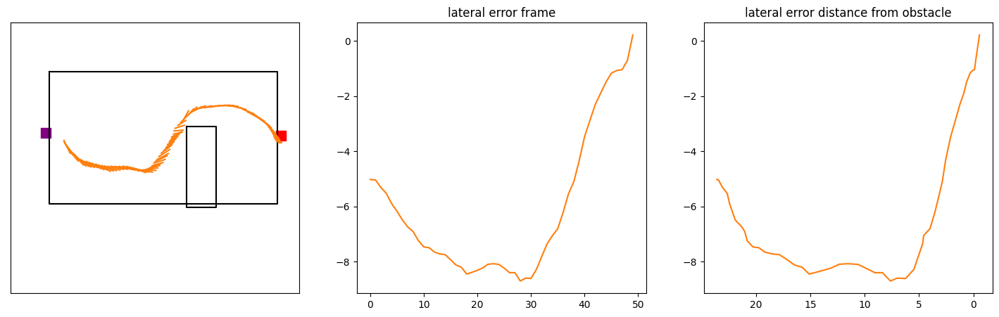

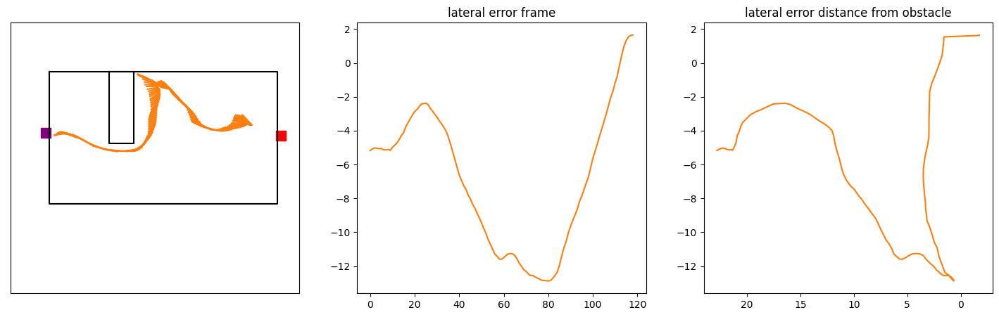

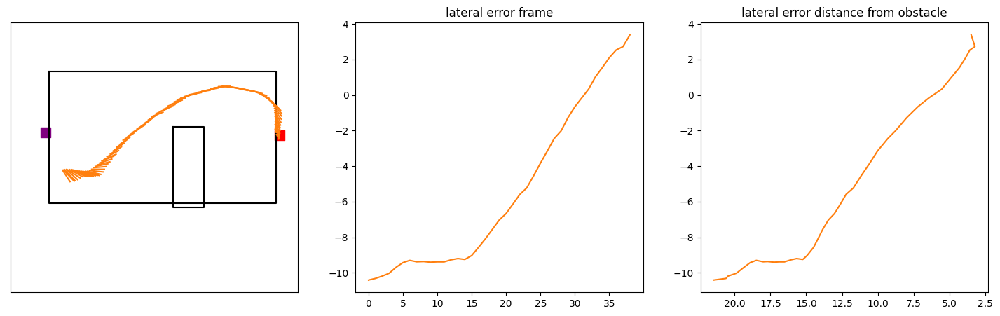

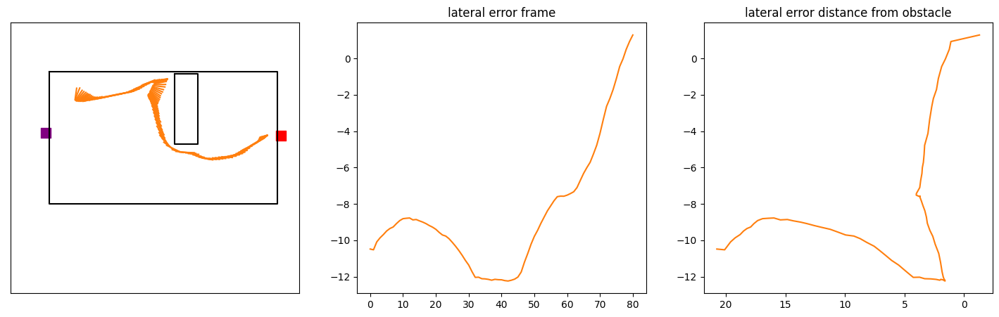

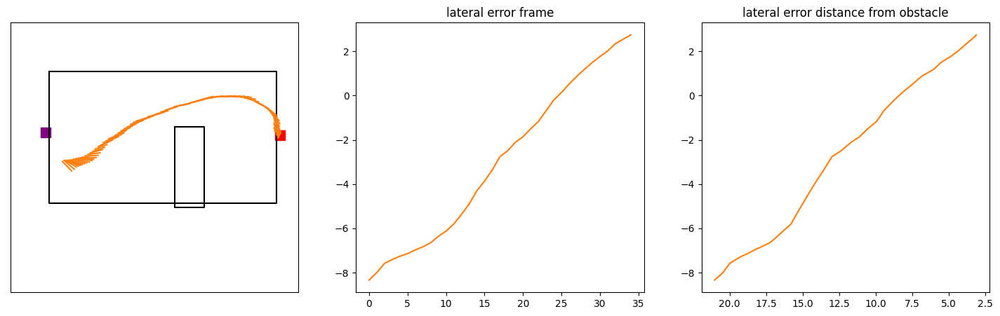

...

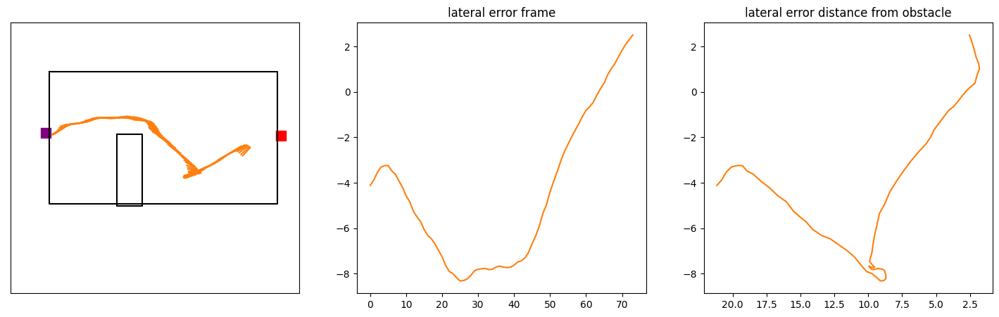

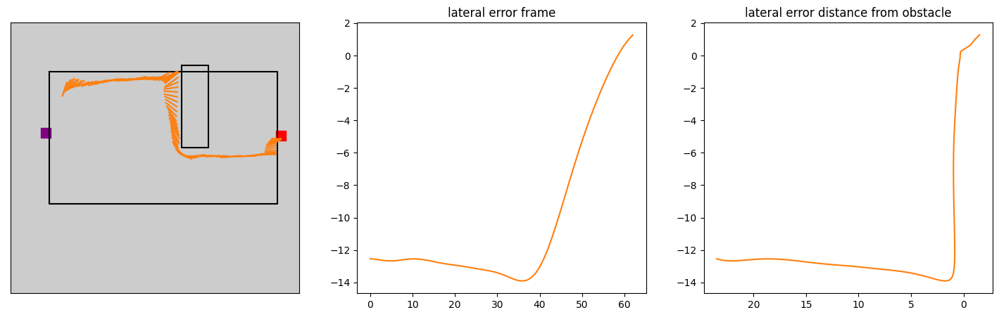

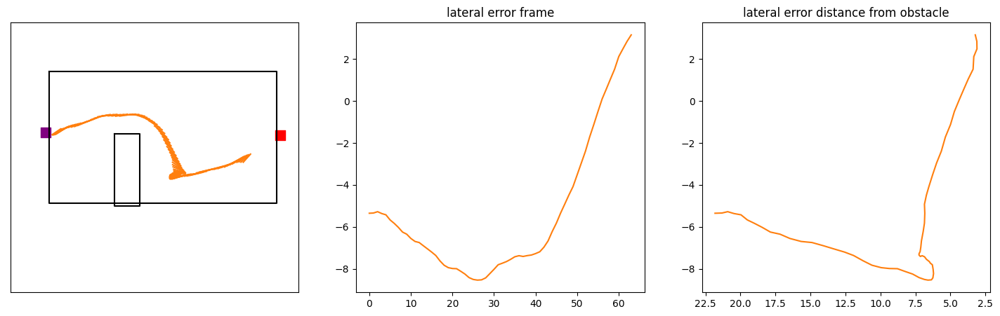

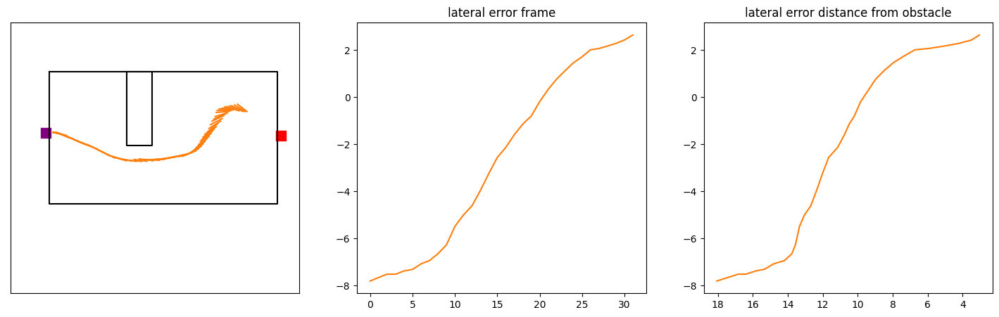

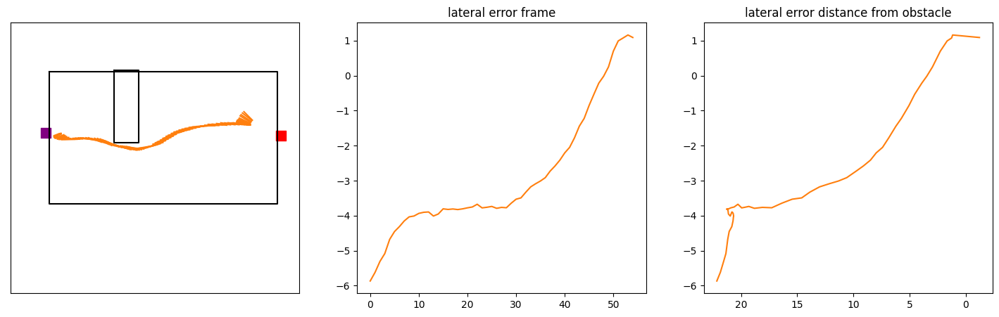

In [64]:
test = long[long.date_index == 3.0].sample(15)
for ind,row in test.iterrows():
    
        
    fig,ax = plt.subplots(1,3,figsize=(18,5))
    ax[0].set_xticks([])
    ax[0].set_yticks([])
   
    #ax[1].set_xlim(20,0)
    ax[2].invert_xaxis()
   # ax[2].set_xlim(20,0)
    if row.task == 'oadark':
        ax[0].set_facecolor('grey') 
        ax[0].patch.set_alpha(.4)
    else:
        None


    trial_df = test.loc[[ind]]
    plot_arena(test,ax[0])
    plot_orginal_obstacle(trial_df,ax[0],int(row.obstacle_cluster))



    #ax[0].set_title()
   
    ax[1].set_title('lateral error frame')
    ax[2].set_title('lateral error distance from obstacle')
   
    #ax[1].set_ylim(-12,2)

    

  
    ax[0].plot((row.ts_nose_x_cm,row.ts_spine_x_cm),(row.ts_nose_y_cm,row.ts_spine_y_cm),color = 'tab:orange')
    #ax[1].plot(row.ts_distance_from_edge[:int(row.obstacle_ind)],row.head_velocity_at_turn_trace,color = 'tab:orange')
    ax[2].plot( row.ts_distance_from_edge[:int(row.obstacle_ind)],row.lateral_error[:int(row.obstacle_ind)],color = 'tab:orange')
    thresh = row.head_corner_angle_velocity[:int(row.obstacle_ind)].argmin()
    thresh_ind = np.argwhere(row.head_corner_angle_velocity[:int(row.obstacle_ind)] == row.head_corner_angle_velocity[:int(row.obstacle_ind)][thresh])[0][0]
    #ax[1].scatter(thresh_ind,row.head_corner_angle_velocity[:int(row.obstacle_ind)][thresh],c = 'black')
    #ax[2].scatter(row.ts_distance_from_edge[:int(row.obstacle_ind)][thresh],row.head_corner_angle_velocity[:int(row.obstacle_ind)][thresh],c = 'black')
    #ax[0].scatter(row.ts_nose_x_cm[:int(row.obstacle_ind)][thresh],row.ts_nose_y_cm[:int(row.obstacle_ind)][thresh],c = 'black')
    ax[1].plot(row.lateral_error[:int(row.obstacle_ind)],color = 'tab:orange')

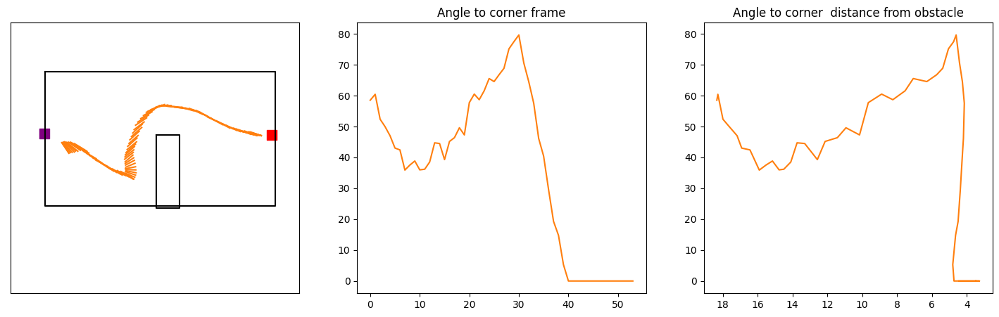

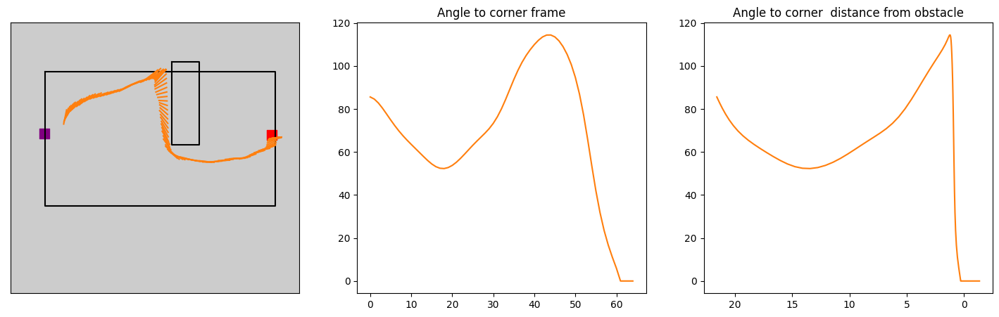

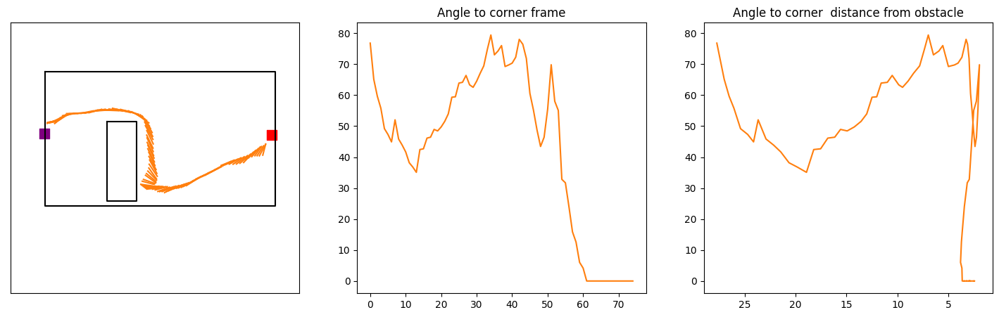

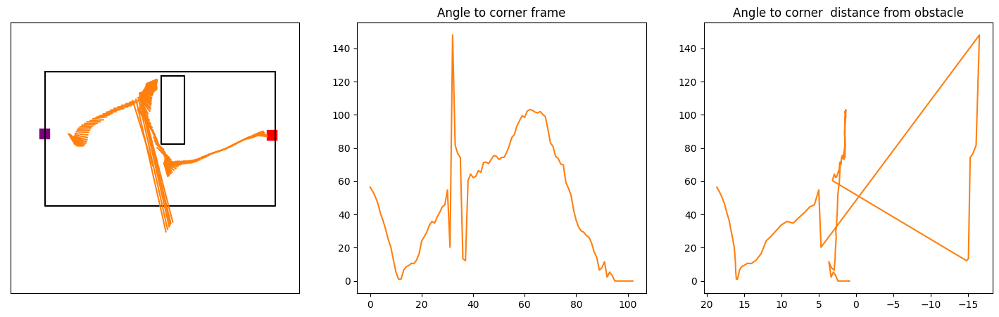

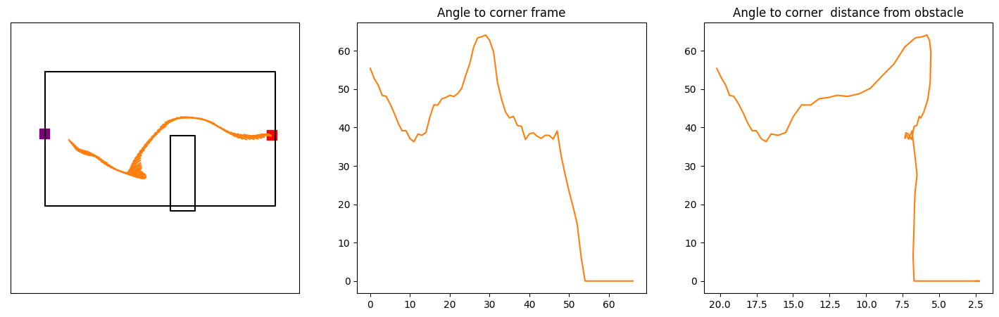

...

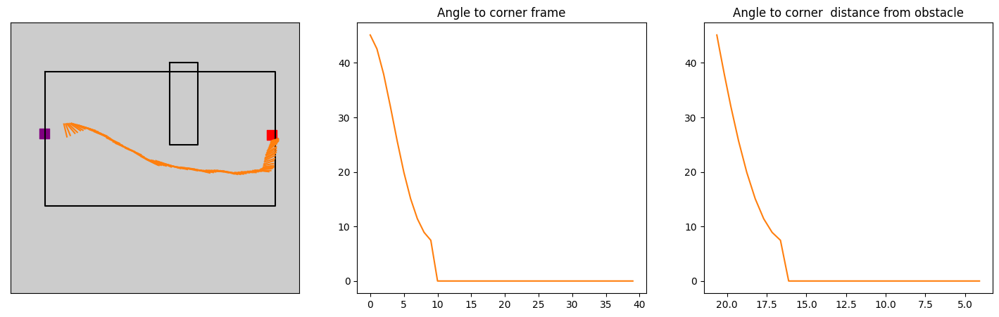

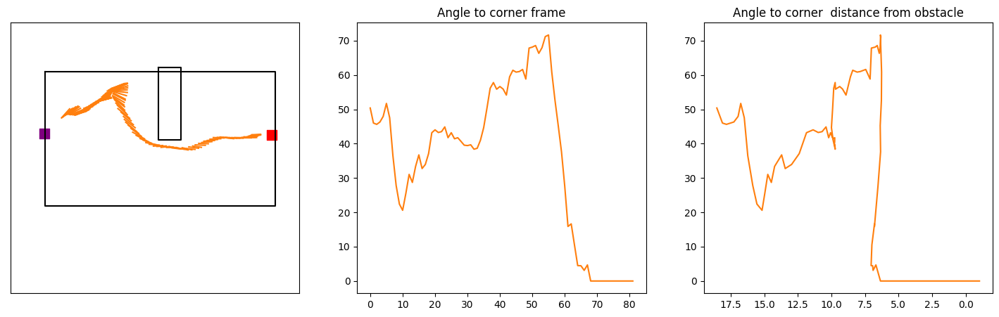

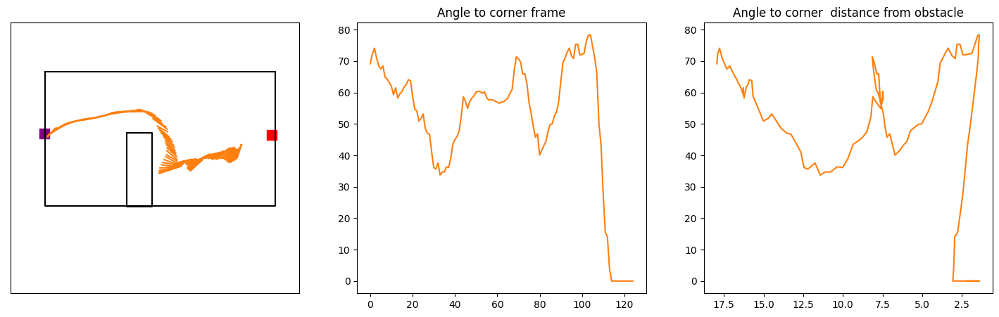

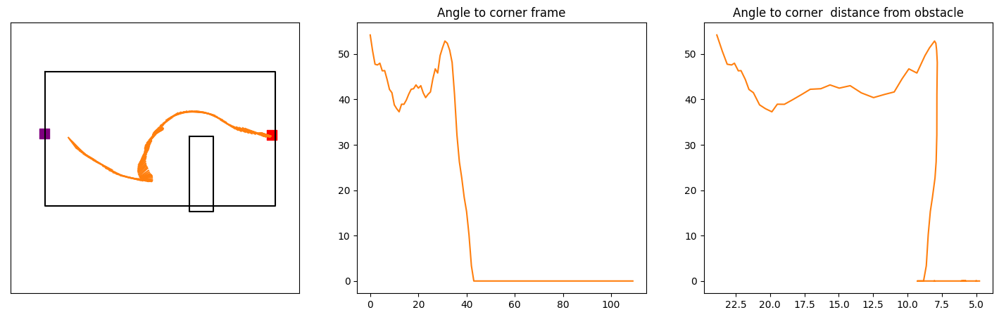

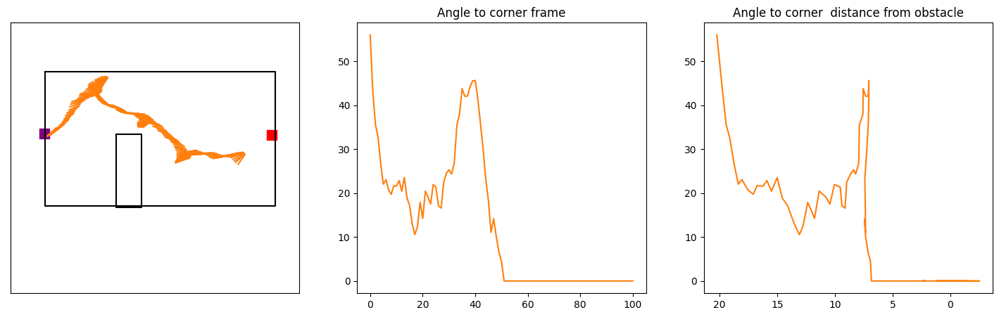

In [65]:
test = long[long.date_index == 3.0].sample(15)
for ind,row in test.iterrows():
    
        
    fig,ax = plt.subplots(1,3,figsize=(18,5))
    ax[0].set_xticks([])
    ax[0].set_yticks([])
   
    #ax[1].set_xlim(20,0)
    ax[2].invert_xaxis()
   # ax[2].set_xlim(20,0)
    if row.task == 'oadark':
        ax[0].set_facecolor('grey') 
        ax[0].patch.set_alpha(.4)
    else:
        None


    trial_df = test.loc[[ind]]
    plot_arena(test,ax[0])
    plot_orginal_obstacle(trial_df,ax[0],int(row.obstacle_cluster))



    #ax[0].set_title()
   
    ax[1].set_title('Angle to corner frame')
    ax[2].set_title('Angle to corner  distance from obstacle')
   
    #ax[1].set_ylim(-12,2)

    

  
    ax[0].plot((row.ts_nose_x_cm,row.ts_spine_x_cm),(row.ts_nose_y_cm,row.ts_spine_y_cm),color = 'tab:orange')
    #ax[1].plot(row.ts_distance_from_edge[:int(row.obstacle_ind)],row.head_velocity_at_turn_trace,color = 'tab:orange')
    ax[2].plot( row.ts_distance_from_edge[:int(row.obstacle_ind)],row.ts_zero_out_angle_to_corner[:int(row.obstacle_ind)],color = 'tab:orange')
    thresh = row.head_corner_angle_velocity[:int(row.obstacle_ind)].argmin()
    thresh_ind = np.argwhere(row.head_corner_angle_velocity[:int(row.obstacle_ind)] == row.head_corner_angle_velocity[:int(row.obstacle_ind)][thresh])[0][0]
    #ax[1].scatter(thresh_ind,row.head_corner_angle_velocity[:int(row.obstacle_ind)][thresh],c = 'black')
    #ax[2].scatter(row.ts_distance_from_edge[:int(row.obstacle_ind)][thresh],row.head_corner_angle_velocity[:int(row.obstacle_ind)][thresh],c = 'black')
    #ax[0].scatter(row.ts_nose_x_cm[:int(row.obstacle_ind)][thresh],row.ts_nose_y_cm[:int(row.obstacle_ind)][thresh],c = 'black')
    ax[1].plot(row.ts_zero_out_angle_to_corner[:int(row.obstacle_ind)],color = 'tab:orange')

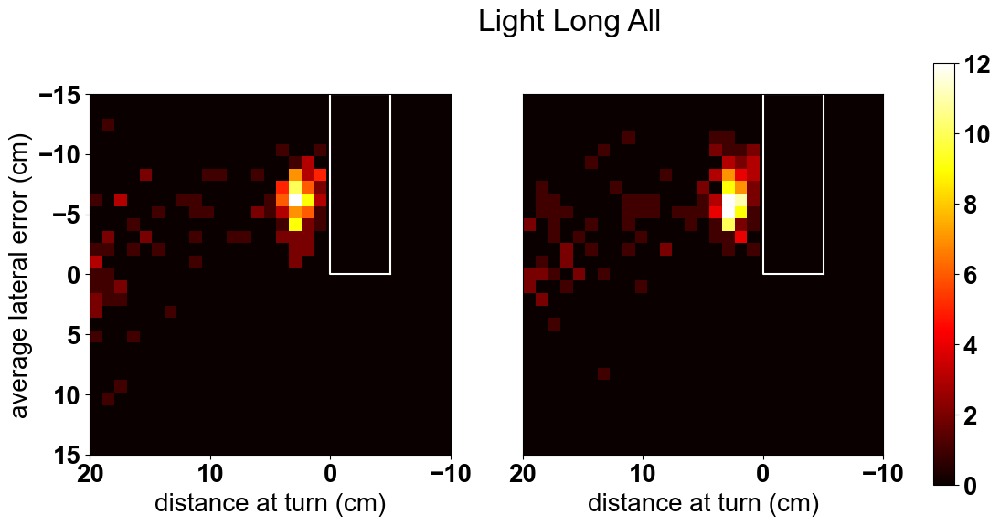

In [114]:
"""plot heat map of distance at turn torwards the opening comparing the first and seconed time seing the obstacle"""


font = {'family' : 'arial',
        'weight' : 'bold',
        'size'   : 20}

plt.rc( 'font',**font);
data = pd.concat([long_con_nostart])
long_short = pd.concat([long_con_nostart,short_con_nostart])

first_trial = data[(data.task == 'oadark')&(data.consective_type == 0) &(data.turn_to_obstacle == 'towards') &(data.distance_at_head_turn >= 0)]
ind = first_trial.index.to_numpy()+2
third_trial = data[(data.task == 'oadark')&(data.consective_type == 2) &(data.turn_to_obstacle == 'towards') &(data.distance_at_head_turn >= 0)]



fig,axs = plt.subplots( 1,2, figsize = (14,6),sharey = False,)
fig.suptitle('Light Long All')
axs[1].set_yticks([])
axs[0].set_ylabel('average lateral error (cm)')
axs[0].set_xlabel('distance at turn (cm)')
axs[1].set_xlabel('distance at turn (cm)')
ymin,ymax = -10,20
xmin,xmax = -15,15


first_head_turn,first_lateral_error = first_trial.distance_at_head_turn.to_numpy(),first_trial.avg_lateral_error.to_numpy()

first_array ,first_xedges ,first_yedges   = np.histogram2d(first_lateral_error.astype(float), first_head_turn.astype(float), range = [[xmin,xmax],[ymin,ymax ]],bins=(list(range(xmin,xmax,1)), list(range(ymin,ymax,1)),))

axs[0].imshow(first_array[::-1], vmax=np.nanmax(first_array), cmap='hot',extent=[ymin,ymax,xmin,xmax])
#fig.colorbar(axs[1].imshow(first_array[::-1], vmax=np.nanmax(first_array), cmap='hot',extent=[ymin,ymax,xmin,xmax]),ax = axs)






third_head_turn,third_lateral_error = third_trial.distance_at_head_turn.to_numpy(),third_trial.avg_lateral_error.to_numpy()

third_array ,third_xedges ,third_yedges   = np.histogram2d(third_lateral_error.astype(float), third_head_turn.astype(float), range = [[xmin,xmax],[ymin,ymax ]],bins=(list(range(xmin,xmax,1)), list(range(ymin,ymax,1)),))
axs[1].imshow(third_array[::-1], vmax=np.nanmax(first_array), cmap='hot',extent=[ymin,ymax,xmin,xmax])
fig.colorbar(axs[1].imshow(third_array[::-1], vmax=np.nanmax(first_array),cmap='hot',extent=[ymin,ymax,xmin,xmax]),ax = axs)

axs[1].plot( [-5,0,0,-5,-5], [0,0,-15,-15,0],c ='white')
axs[0].plot( [-5,0,0,-5,-5], [0,0,-15,-15,0],c ='white')

axs[0].invert_xaxis()
axs[0].invert_yaxis()

axs[1].invert_xaxis()
axs[1].invert_yaxis()

In [7]:
plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['ps.fonttype'] = 42

In [ ]:
first_trial = data[(data.task == 'oa')&(data.consective_type == 0) &(data.turn_to_obstacle == 'towards') &(data.distance_at_head_turn >= 0)]

In [88]:
first_trial

,level_0,first_poke,second_poke,trial_timestamps,trial_vidframes,nose_x,nose_y,leftear_x,leftear_y,rightear_x,...,turn_direction,turn_direction_end,turn_to_obstacle,obstacle_cross,head_corner_angle_velocity_at_head_turn,angle_at_head_turn,distance_traveled_at_head_turn,ts_zero_out_angle_to_target_port,consective_inds,consective_type


Text(0.5, 1.0, '2nd')

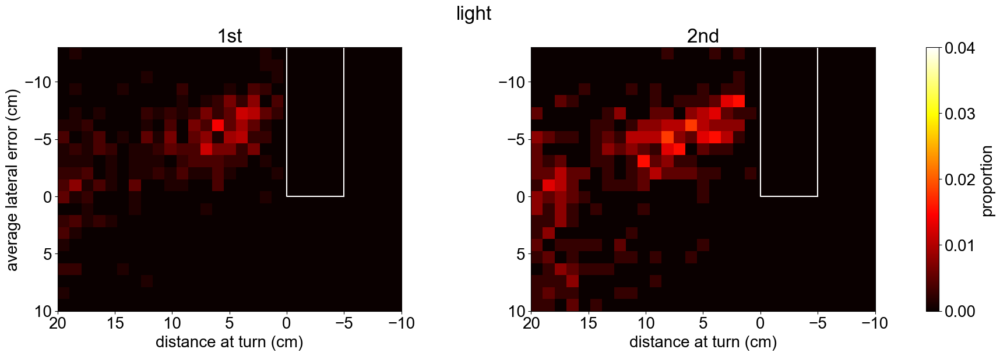

In [90]:
data = pd.concat([long_con_nostart])
long_short = pd.concat([long_con_nostart,short_con_nostart])
first_trial = data[(data.task == 'oa')&(data.consective_type == 0) &(data.turn_to_obstacle == 'towards') &(data.distance_at_head_turn >= 0)]
ind = first_trial.index.to_numpy()+2
third_trial = long_short.loc[ind.tolist()]
fig,axs = plt.subplots( 1,2, figsize = (18,6),layout = 'constrained')

axs[0].set_ylabel('average lateral error (cm)')
axs[0].set_xlabel('distance at turn (cm)')
axs[1].set_xlabel('distance at turn (cm)')
ymin,ymax = -10,20
xmin,xmax = -13,10


first_head_turn,first_lateral_error = first_trial.distance_at_head_turn.to_numpy(),first_trial.avg_lateral_error.to_numpy()

first_array ,first_xedges ,first_yedges   = np.histogram2d(first_lateral_error.astype(float), first_head_turn.astype(float), range = [[xmin,xmax],[ymin,ymax ]],bins=(list(range(xmin,xmax,1)), list(range(ymin,ymax,1)),))

axs[0].imshow(first_array[::-1]/len(first_trial), vmax=.08, cmap='hot',extent=[ymin,ymax,xmin,xmax])
#fig.colorbar(axs[1].imshow(first_array[::-1], vmax=np.nanmax(first_array), cmap='hot',extent=[ymin,ymax,xmin,xmax]),ax = axs)






third_head_turn,third_lateral_error = third_trial.distance_at_head_turn.to_numpy(),third_trial.avg_lateral_error.to_numpy()

third_array ,third_xedges ,third_yedges   = np.histogram2d(third_lateral_error.astype(float), third_head_turn.astype(float), range = [[xmin,xmax],[ymin,ymax ]],bins=(list(range(xmin,xmax,1)), list(range(ymin,ymax,1)),))
#axs[1].imshow(third_array[::-1], vmax=np.nanmax(first_array), cmap='hot',extent=[ymin,ymax,xmin,xmax])


cbar = fig.colorbar(axs[1].imshow(third_array[::-1]/len(third_trial),cmap='hot',vmax = .04,extent=[ymin,ymax,xmin,xmax]),ax = axs,fraction=0.05, pad=0.04)
#cbar = fig.colorbar(axs[1].imshow(third_array[::-1]/len(third_trial),cmap='hot',vmax = .08,extent=[ymin,ymax,xmin,xmax]),ax = axs,fraction=0.05, pad=0.04)
cbar.set_label('proportion')
cbar.ax.locator_params(nbins=5)
axs[1].plot( [-5,0,0,-5,-5], [0,0,-13,-13,0],c ='white')
axs[0].plot( [-5,0,0,-5,-5], [0,0,-13,-13,0],c ='white')

fig.suptitle('light')

axs[0].invert_xaxis()
axs[0].invert_yaxis()

axs[1].invert_xaxis()
axs[1].invert_yaxis()
axs[0].set_title('1st')
axs[1].set_title('2nd')

Text(0.5, 1.0, '2nd')

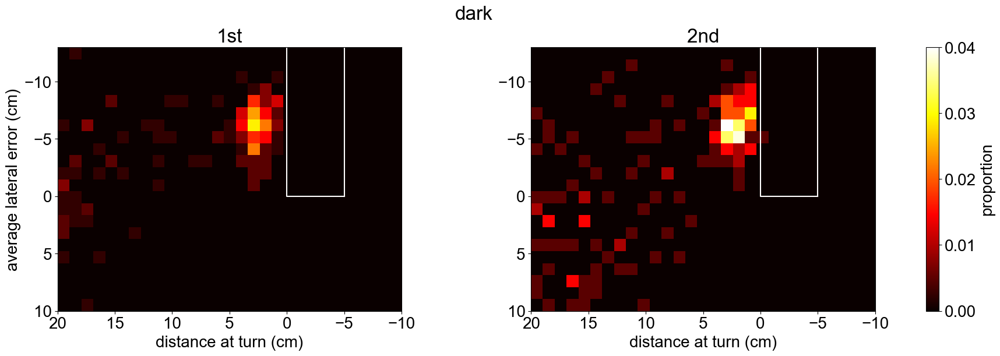

In [93]:
first_trial = data[(data.task == 'oadark')&(data.consective_type == 0) &(data.distance_at_head_turn >= 0)]
ind = first_trial.index.to_numpy()+2
third_trial = long_short.loc[ind.tolist()]
fig,axs = plt.subplots( 1,2, figsize = (18,6),layout = 'constrained')

axs[0].set_ylabel('average lateral error (cm)')
axs[0].set_xlabel('distance at turn (cm)')
axs[1].set_xlabel('distance at turn (cm)')
ymin,ymax = -10,20
xmin,xmax = -13,10


first_head_turn,first_lateral_error = first_trial.distance_at_head_turn.to_numpy(),first_trial.avg_lateral_error.to_numpy()

first_array ,first_xedges ,first_yedges   = np.histogram2d(first_lateral_error.astype(float), first_head_turn.astype(float), range = [[xmin,xmax],[ymin,ymax ]],bins=(list(range(xmin,xmax,1)), list(range(ymin,ymax,1)),))

axs[0].imshow(first_array[::-1]/len(first_trial), vmax=.08, cmap='hot',extent=[ymin,ymax,xmin,xmax])
#fig.colorbar(axs[1].imshow(first_array[::-1], vmax=np.nanmax(first_array), cmap='hot',extent=[ymin,ymax,xmin,xmax]),ax = axs)






third_head_turn,third_lateral_error = third_trial.distance_at_head_turn.to_numpy(),third_trial.avg_lateral_error.to_numpy()

third_array ,third_xedges ,third_yedges   = np.histogram2d(third_lateral_error.astype(float), third_head_turn.astype(float), range = [[xmin,xmax],[ymin,ymax ]],bins=(list(range(xmin,xmax,1)), list(range(ymin,ymax,1)),))
#axs[1].imshow(third_array[::-1], vmax=np.nanmax(first_array), cmap='hot',extent=[ymin,ymax,xmin,xmax])


cbar = fig.colorbar(axs[1].imshow(third_array[::-1]/len(third_trial),cmap='hot',vmax = .04,extent=[ymin,ymax,xmin,xmax]),ax = axs,fraction=0.05, pad=0.04)
#cbar = fig.colorbar(axs[1].imshow(third_array[::-1]/len(third_trial),cmap='hot',vmax = .08,extent=[ymin,ymax,xmin,xmax]),ax = axs,fraction=0.05, pad=0.04)
cbar.set_label('proportion')
cbar.ax.locator_params(nbins=5)
axs[1].plot( [-5,0,0,-5,-5], [0,0,-13,-13,0],c ='white')
axs[0].plot( [-5,0,0,-5,-5], [0,0,-13,-13,0],c ='white')

fig.suptitle('dark')

axs[0].invert_xaxis()
axs[0].invert_yaxis()

axs[1].invert_xaxis()
axs[1].invert_yaxis()
axs[0].set_title('1st')
axs[1].set_title('2nd')

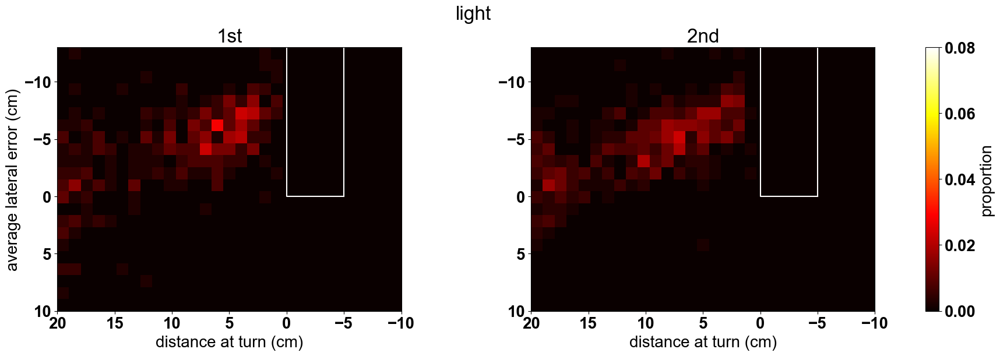

In [36]:
"""plot heat map of distance at turn torwards the opening comparing the first and seconed time seing the obstacle"""


font = {'family' : 'arial',
        'weight' : 'bold',
        'size'   : 20}

plt.rc( 'font',**font);
data = pd.concat([long_con_nostart])
long_short = pd.concat([long_con_nostart,short_con_nostart])

first_trial = data[(data.task == 'oa')&(data.consective_type == 0) &(data.turn_to_obstacle == 'towards') &(data.distance_at_head_turn >= 0)]
#ind = first_trial.index.to_numpy()+2
third_trial = data[(data.task == 'oa')&(data.consective_type == 2) &(data.turn_to_obstacle == 'towards') &(data.distance_at_head_turn >= 0)]



fig,axs = plt.subplots( 1,2, figsize = (18,6),layout = 'constrained')

axs[0].set_ylabel('average lateral error (cm)')
axs[0].set_xlabel('distance at turn (cm)')
axs[1].set_xlabel('distance at turn (cm)')
ymin,ymax = -10,20
xmin,xmax = -13,10


first_head_turn,first_lateral_error = first_trial.distance_at_head_turn.to_numpy(),first_trial.avg_lateral_error.to_numpy()

first_array ,first_xedges ,first_yedges   = np.histogram2d(first_lateral_error.astype(float), first_head_turn.astype(float), range = [[xmin,xmax],[ymin,ymax ]],bins=(list(range(xmin,xmax,1)), list(range(ymin,ymax,1)),))

axs[0].imshow(first_array[::-1]/len(first_trial), vmax=.08, cmap='hot',extent=[ymin,ymax,xmin,xmax])
#fig.colorbar(axs[1].imshow(first_array[::-1], vmax=np.nanmax(first_array), cmap='hot',extent=[ymin,ymax,xmin,xmax]),ax = axs)






third_head_turn,third_lateral_error = third_trial.distance_at_head_turn.to_numpy(),third_trial.avg_lateral_error.to_numpy()

third_array ,third_xedges ,third_yedges   = np.histogram2d(third_lateral_error.astype(float), third_head_turn.astype(float), range = [[xmin,xmax],[ymin,ymax ]],bins=(list(range(xmin,xmax,1)), list(range(ymin,ymax,1)),))
#axs[1].imshow(third_array[::-1], vmax=np.nanmax(first_array), cmap='hot',extent=[ymin,ymax,xmin,xmax])


cbar = fig.colorbar(axs[1].imshow(third_array[::-1]/len(third_trial),cmap='hot',vmax = .08,extent=[ymin,ymax,xmin,xmax]),ax = axs,fraction=0.05, pad=0.04)
#cbar = fig.colorbar(axs[1].imshow(third_array[::-1]/len(third_trial),cmap='hot',vmax = .08,extent=[ymin,ymax,xmin,xmax]),ax = axs,fraction=0.05, pad=0.04)
cbar.set_label('proportion')
cbar.ax.locator_params(nbins=5)
axs[1].plot( [-5,0,0,-5,-5], [0,0,-13,-13,0],c ='white')
axs[0].plot( [-5,0,0,-5,-5], [0,0,-13,-13,0],c ='white')



axs[0].invert_xaxis()
axs[0].invert_yaxis()

axs[1].invert_xaxis()
axs[1].invert_yaxis()
axs[0].set_title('1st')
axs[1].set_title('2nd')

fig.suptitle('light')
fig.savefig(r'd:\obstacle_avoidance\figures\SFN\consecutive\light_heatmap.png',dpi = 300,transparent=True)
#fig.savefig(r'd:\obstacle_avoidance\figures\SFN\consecutive\light_heatmap.eps',dpi = 300)
fig.savefig(r'd:\obstacle_avoidance\figures\SFN\consecutive\light_heatmap.svg',dpi = 300)


<AxesSubplot: xlabel='consective_type', ylabel='distance_at_head_turn'>

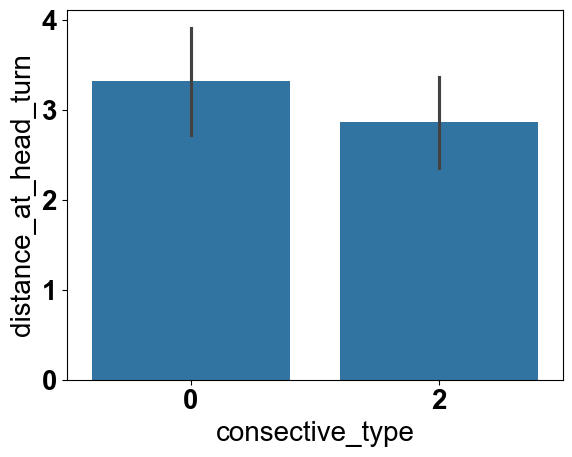

In [72]:
data = pd.concat([long_con_nostart])
first_trial = data[(data.task == 'oadark')&(data.consective_type == 0) &(data.turn_to_obstacle == 'towards') &(data.distance_at_head_turn >= 0)]
third_trial = data[(data.task == 'oadark')&(data.consective_type == 2) &(data.turn_to_obstacle == 'towards') &(data.distance_at_head_turn >= 0)]
data = pd.concat([first_trial,third_trial])

sns.barplot(data = data, x ='consective_type',y = 'distance_at_head_turn',estimator='median',errorbar='se')

<AxesSubplot: xlabel='consective_type', ylabel='distance_at_head_turn'>

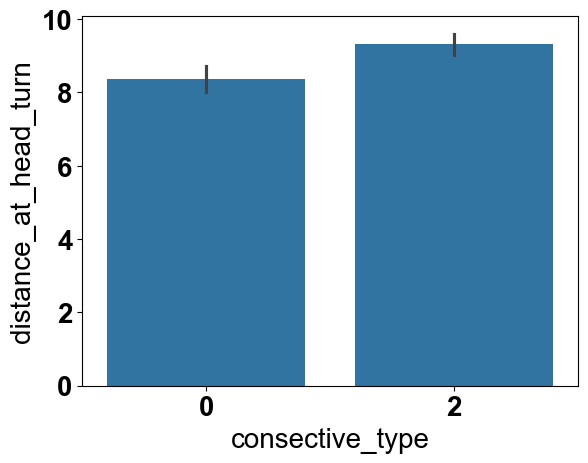

In [50]:
data = pd.concat([long_con_nostart])
first_trial = data[(data.task == 'oa')&(data.consective_type == 0) &(data.turn_to_obstacle == 'towards') &(data.distance_at_head_turn >= 0)]
third_trial = data[(data.task == 'oa')&(data.consective_type == 2) &(data.turn_to_obstacle == 'towards') &(data.distance_at_head_turn >= 0)]
data = pd.concat([first_trial,third_trial])

sns.barplot(data = data, x ='consective_type',y = 'distance_at_head_turn',estimator='median',errorbar='se')


Text(0.5, 1.0, 'light')

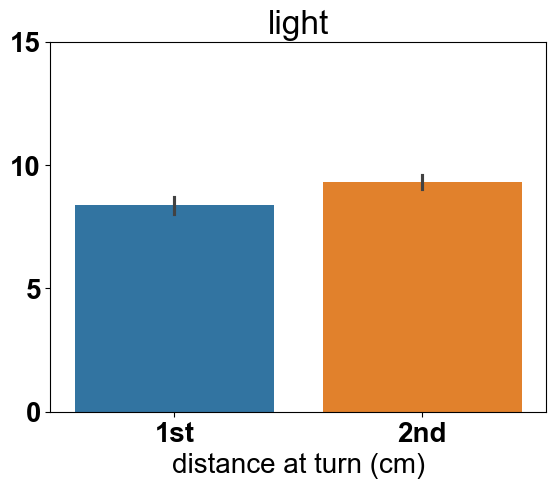

In [95]:
data = pd.concat([long_con_nostart])
long_short = pd.concat([long_con_nostart,short_con_nostart])

first_trial = data[(data.task == 'oa')&(data.consective_type == 0) &(data.turn_to_obstacle == 'towards') &(data.distance_at_head_turn >= 0)]
ind = first_trial.index.to_numpy()+2
third_trial = data[(data.task == 'oa')&(data.consective_type == 2) &(data.turn_to_obstacle == 'towards') &(data.distance_at_head_turn >= 0)]
data = pd.concat([first_trial,third_trial])

sns.barplot(data = data, x ='consective_type',y = 'distance_at_head_turn',estimator='median',errorbar='se',palette = ['tab:blue','tab:orange'])
plt.xticks([0,1],['1st','2nd'])
plt.yticks([0,5,10,15])
plt.ylabel('')
plt.xlabel('distance at turn (cm)')
plt.title('light')

Text(0.5, 1.0, 'light')

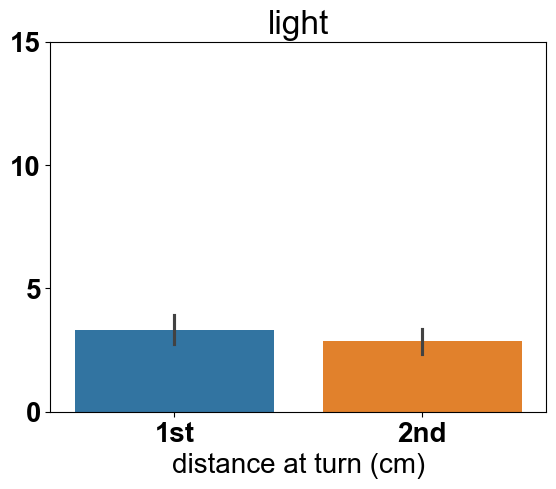

In [96]:
data = pd.concat([long_con_nostart])
long_short = pd.concat([long_con_nostart,short_con_nostart])

first_trial = data[(data.task == 'oadark')&(data.consective_type == 0) &(data.turn_to_obstacle == 'towards') &(data.distance_at_head_turn >= 0)]
ind = first_trial.index.to_numpy()+2
third_trial = data[(data.task == 'oadark')&(data.consective_type == 2) &(data.turn_to_obstacle == 'towards') &(data.distance_at_head_turn >= 0)]
data = pd.concat([first_trial,third_trial])

sns.barplot(data = data, x ='consective_type',y = 'distance_at_head_turn',estimator='median',errorbar='se',palette = ['tab:blue','tab:orange'])
plt.xticks([0,1],['1st','2nd'])
plt.yticks([0,5,10,15])
plt.ylabel('')
plt.xlabel('distance at turn (cm)')
plt.title('light')

Text(0.5, 1.0, 'dark')

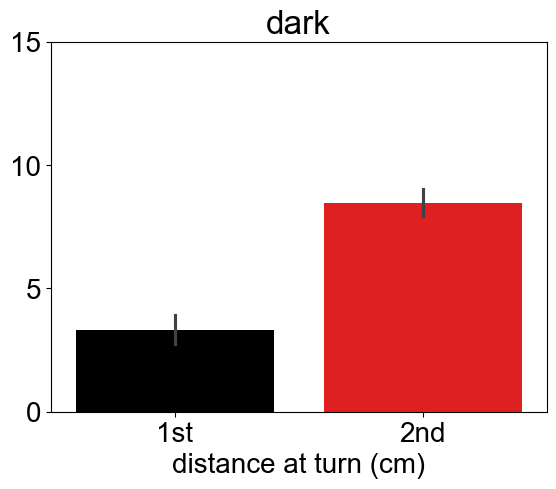

In [92]:
data = pd.concat([long_con_nostart])
long_short = pd.concat([long_con_nostart,short_con_nostart])

first_trial = data[(data.task == 'oadark')&(data.consective_type == 0) &(data.turn_to_obstacle == 'towards') &(data.distance_at_head_turn >= 0)]
ind = first_trial.index.to_numpy()+2
third_trial = long_short.loc[ind.tolist()]
data = pd.concat([first_trial,third_trial])

sns.barplot(data = data, x ='consective_type',y = 'distance_at_head_turn',estimator='median',errorbar='se',palette = ['black','red'])
plt.xticks([0,1],['1st','2nd'])
plt.yticks([0,5,10,15])
plt.ylabel('')
plt.xlabel('distance at turn (cm)')
plt.title('dark')


<AxesSubplot: xlabel='consective_type', ylabel='distance_at_head_turn'>

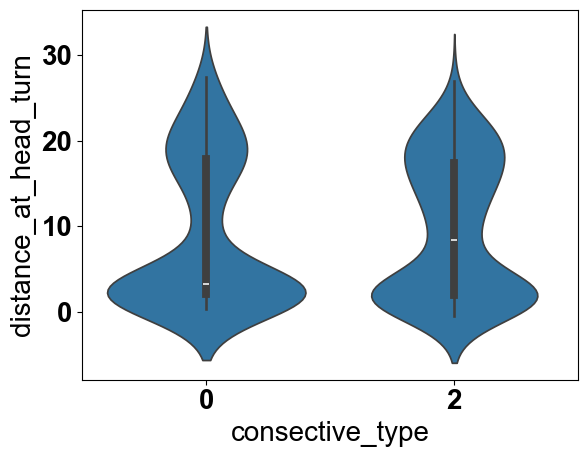

In [75]:
data = pd.concat([long_con_nostart])
long_short = pd.concat([long_con_nostart,short_con_nostart])

first_trial = data[(data.task == 'oadark')&(data.consective_type == 0) &(data.turn_to_obstacle == 'towards') &(data.distance_at_head_turn >= 0)]
ind = first_trial.index.to_numpy()+2
third_trial = long_short.loc[ind.tolist()]
data = pd.concat([first_trial,third_trial])

sns.violinplot(data = data, x ='consective_type',y = 'distance_at_head_turn')

<AxesSubplot: xlabel='consective_type', ylabel='distance_at_head_turn'>

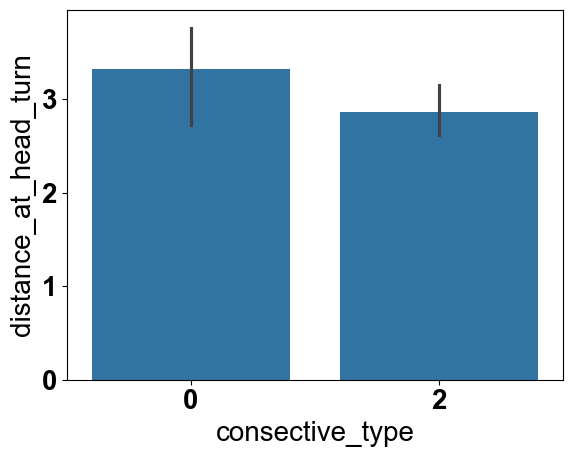

In [49]:
data = pd.concat([long_con_nostart])
first_trial = data[(data.task == 'oadark')&(data.consective_type == 0) &(data.turn_to_obstacle == 'towards') &(data.distance_at_head_turn >= 0)]
third_trial = data[(data.task == 'oadark')&(data.consective_type == 2) &(data.turn_to_obstacle == 'towards') &(data.distance_at_head_turn >= 0)]
data = pd.concat([first_trial,third_trial])

sns.barplot(data = data, x ='consective_type',y = 'distance_at_head_turn',estimator='median')


<AxesSubplot: xlabel='consective_type', ylabel='linearity'>

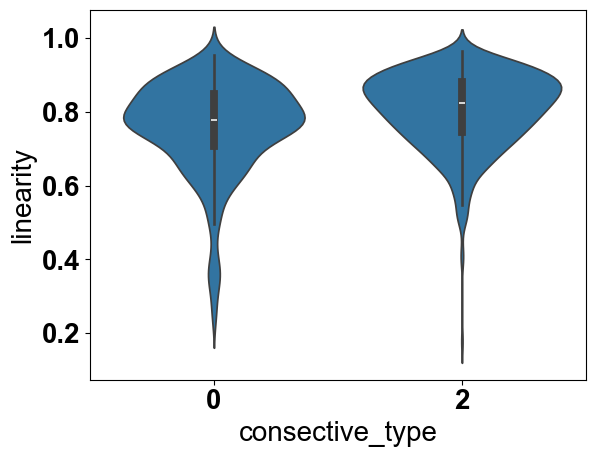

In [45]:
data = pd.concat([long_con_nostart])
first_trial = data[(data.task == 'oa')&(data.consective_type == 0) &(data.turn_to_obstacle == 'towards') &(data.distance_at_head_turn >= 0)]
third_trial = data[(data.task == 'oa')&(data.consective_type == 2) &(data.turn_to_obstacle == 'towards') &(data.distance_at_head_turn >= 0)]
data = pd.concat([first_trial,third_trial])

sns.violinplot(data = data, x ='consective_type',y = 'linearity')



<AxesSubplot: xlabel='consective_type', ylabel='linearity'>

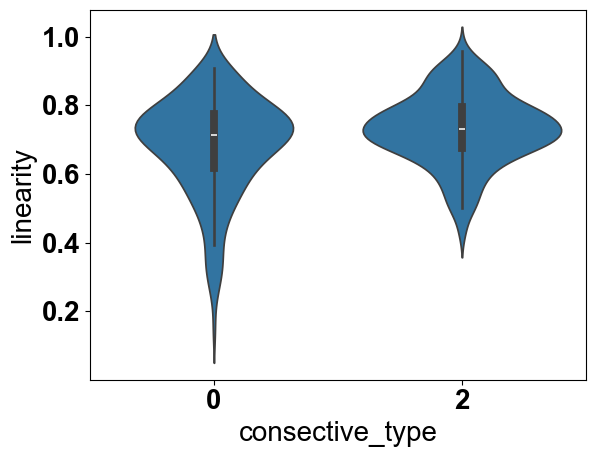

In [44]:
data = pd.concat([long_con_nostart])
first_trial = data[(data.task == 'oadark')&(data.consective_type == 0) &(data.turn_to_obstacle == 'towards') &(data.distance_at_head_turn >= 0)]
third_trial = data[(data.task == 'oadark')&(data.consective_type == 2) &(data.turn_to_obstacle == 'towards') &(data.distance_at_head_turn >= 0)]
data = pd.concat([first_trial,third_trial])

sns.violinplot(data = data, x ='consective_type',y = 'linearity')


PermissionError: [Errno 13] Permission denied: 'd:\\obstacle_avoidance\\figures\\SFN\\consecutive\\first_light_heatmap.pdf'

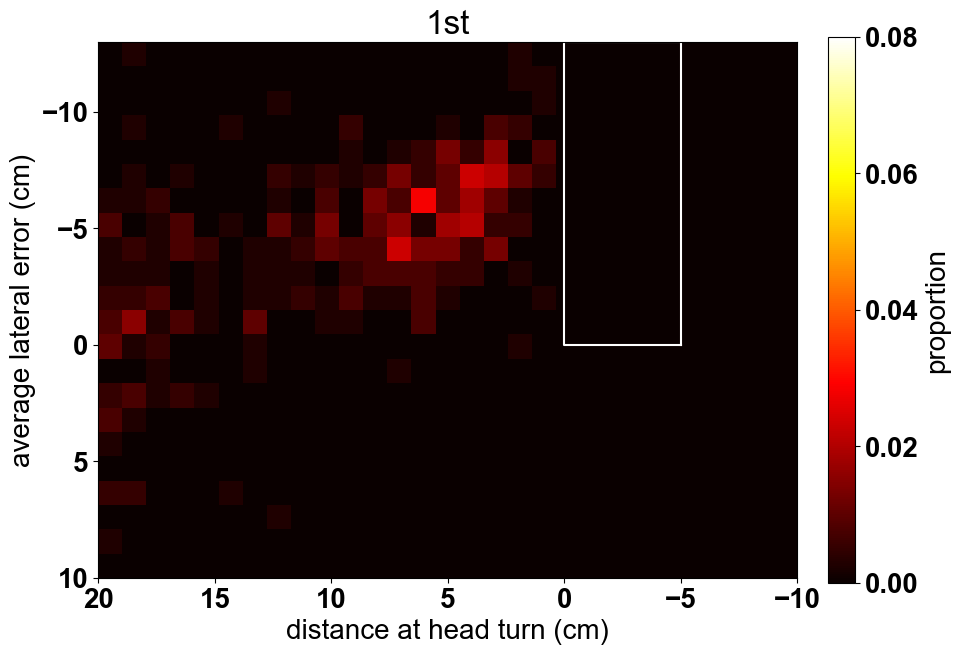

In [27]:

font = {'family' : 'arial',
        'weight' : 'bold',
        'size'   : 20}

plt.rc( 'font',**font);

fig,ax = plt.subplots(layout = 'tight',figsize=(10,7))


#gs = GridSpec(ncols=6, nrows=6,figure=fig)


ax.set_xlabel('distance at head turn (cm)')
ax.set_ylabel('average lateral error (cm)')
data = pd.concat([long_con_nostart])
data = data[(data.task == 'oa')&(data.consective_type == 0) &(data.turn_to_obstacle == 'towards') &(data.distance_at_head_turn >= 0)]


data = data[(data.distance_at_head_turn >= 0) ]
ymin,ymax = -10,20
xmin,xmax = -13,10

head_turn,lateral_error = data.distance_at_head_turn.to_numpy(),data.avg_lateral_error.to_numpy()

array ,xedges ,yedges   = np.histogram2d(lateral_error.astype(float), head_turn.astype(float), range = [[xmin,xmax],[ymin,ymax ]],bins=(list(range(xmin,xmax,1)), list(range(ymin,ymax,1)),))

#ax.imshow(array[::-1]/len(data),vmax = .18,cmap='hot',extent=[ymin,ymax,xmin,xmax])

ax.plot( [-5,0,0,-5,-5], [0,0,-13,-13,0],c ='white')
cbar = fig.colorbar(ax.imshow(array[::-1]/len(data),vmax = .08,cmap='hot',extent=[ymin,ymax,xmin,xmax]),fraction=0.046, pad=0.04)
cbar.set_label('proportion')
cbar.ax.locator_params(nbins=5)
ax.invert_xaxis()
ax.invert_yaxis()
ax.set_title('1st')
fig.savefig(r'd:\obstacle_avoidance\figures\SFN\consecutive\first_light_heatmap.pdf',dpi = 300)

#fig.savefig(r'd:\obstacle_avoidance\figures\SFN\distance_at_head_turn/distance_at_head_turn_light_heatmap.pdf')

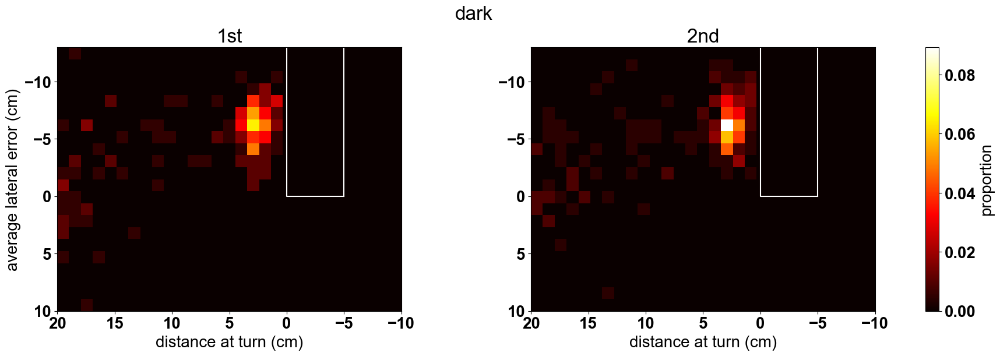

In [38]:
"""plot heat map of distance at turn torwards the opening comparing the first and seconed time seing the obstacle"""


font = {'family' : 'arial',
        'weight' : 'bold',
        'size'   : 20}

plt.rc( 'font',**font);
data = pd.concat([long_con_nostart])
long_short = pd.concat([long_con_nostart,short_con_nostart])

first_trial = data[(data.task == 'oadark')&(data.consective_type == 0) &(data.turn_to_obstacle == 'towards') &(data.distance_at_head_turn >= 0)]
#ind = first_trial.index.to_numpy()+2
third_trial = data[(data.task == 'oadark')&(data.consective_type == 2) &(data.turn_to_obstacle == 'towards') &(data.distance_at_head_turn >= 0)]



fig,axs = plt.subplots( 1,2, figsize = (18,6),layout = 'constrained')

axs[0].set_ylabel('average lateral error (cm)')
axs[0].set_xlabel('distance at turn (cm)')
axs[1].set_xlabel('distance at turn (cm)')
ymin,ymax = -10,20
xmin,xmax = -13,10


first_head_turn,first_lateral_error = first_trial.distance_at_head_turn.to_numpy(),first_trial.avg_lateral_error.to_numpy()

first_array ,first_xedges ,first_yedges   = np.histogram2d(first_lateral_error.astype(float), first_head_turn.astype(float), range = [[xmin,xmax],[ymin,ymax ]],bins=(list(range(xmin,xmax,1)), list(range(ymin,ymax,1)),))

axs[0].imshow(first_array[::-1]/len(first_trial), vmax=.08, cmap='hot',extent=[ymin,ymax,xmin,xmax])
#fig.colorbar(axs[1].imshow(first_array[::-1], vmax=np.nanmax(first_array), cmap='hot',extent=[ymin,ymax,xmin,xmax]),ax = axs)






third_head_turn,third_lateral_error = third_trial.distance_at_head_turn.to_numpy(),third_trial.avg_lateral_error.to_numpy()

third_array ,third_xedges ,third_yedges   = np.histogram2d(third_lateral_error.astype(float), third_head_turn.astype(float), range = [[xmin,xmax],[ymin,ymax ]],bins=(list(range(xmin,xmax,1)), list(range(ymin,ymax,1)),))
#axs[1].imshow(third_array[::-1], vmax=np.nanmax(first_array), cmap='hot',extent=[ymin,ymax,xmin,xmax])


cbar = fig.colorbar(axs[1].imshow(third_array[::-1]/len(third_trial),cmap='hot',extent=[ymin,ymax,xmin,xmax]),ax = axs,fraction=0.05, pad=0.04)
#cbar = fig.colorbar(axs[1].imshow(third_array[::-1]/len(third_trial),cmap='hot',vmax = .08,extent=[ymin,ymax,xmin,xmax]),ax = axs,fraction=0.05, pad=0.04)
cbar.set_label('proportion')
axs[1].plot( [-5,0,0,-5,-5], [0,0,-13,-13,0],c ='white')
axs[0].plot( [-5,0,0,-5,-5], [0,0,-13,-13,0],c ='white')



axs[0].invert_xaxis()
axs[0].invert_yaxis()

axs[1].invert_xaxis()
axs[1].invert_yaxis()
axs[0].set_title('1st')
axs[1].set_title('2nd')
fig.suptitle('dark')
fig.savefig(r'd:\obstacle_avoidance\figures\SFN\consecutive/dark_heatmap.png',dpi = 300,transparent=True)
fig.savefig(r'd:\obstacle_avoidance\figures\SFN\consecutive\dark_heatmap.svg',dpi = 300,transparent=True)


Text(0.5, 1.0, '2nd')

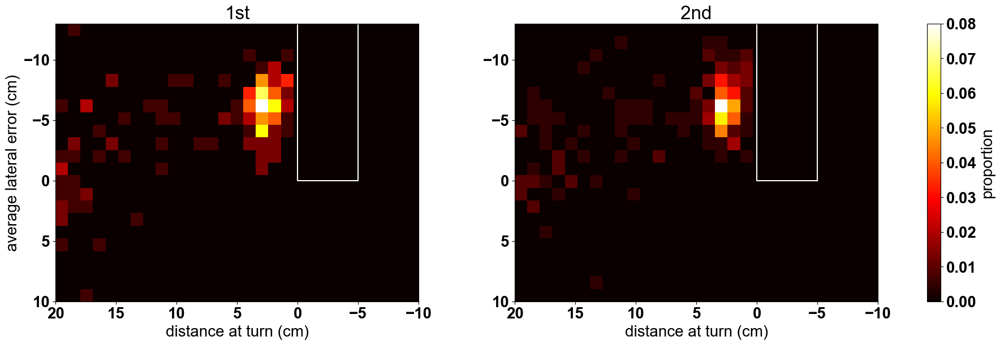

In [94]:
"""plot heat map of distance at turn torwards the opening comparing the first and seconed time seing the obstacle"""


font = {'family' : 'arial',
        'weight' : 'bold',
        'size'   : 20}

plt.rc( 'font',**font);
data = pd.concat([long_con_nostart])
long_short = pd.concat([long_con_nostart,short_con_nostart])

first_trial = data[(data.task == 'oadark')&(data.consective_type == 0) &(data.turn_to_obstacle == 'towards') &(data.distance_at_head_turn >= 0)]
#ind = first_trial.index.to_numpy()+2
third_trial = data[(data.task == 'oadark')&(data.consective_type == 2) &(data.turn_to_obstacle == 'towards') &(data.distance_at_head_turn >= 0)]



fig,axs = plt.subplots( 1,2, figsize = (18,6),layout = 'constrained')

axs[0].set_ylabel('average lateral error (cm)')
axs[0].set_xlabel('distance at turn (cm)')
axs[1].set_xlabel('distance at turn (cm)')
ymin,ymax = -10,20
xmin,xmax = -13,10


first_head_turn,first_lateral_error = first_trial.distance_at_head_turn.to_numpy(),first_trial.avg_lateral_error.to_numpy()

first_array ,first_xedges ,first_yedges   = np.histogram2d(first_lateral_error.astype(float), first_head_turn.astype(float), range = [[xmin,xmax],[ymin,ymax ]],bins=(list(range(xmin,xmax,1)), list(range(ymin,ymax,1)),))

axs[0].imshow(first_array[::-1], vmax=np.nanmax(first_array), cmap='hot',extent=[ymin,ymax,xmin,xmax])
#fig.colorbar(axs[1].imshow(first_array[::-1], vmax=np.nanmax(first_array), cmap='hot',extent=[ymin,ymax,xmin,xmax]),ax = axs)






third_head_turn,third_lateral_error = third_trial.distance_at_head_turn.to_numpy(),third_trial.avg_lateral_error.to_numpy()

third_array ,third_xedges ,third_yedges   = np.histogram2d(third_lateral_error.astype(float), third_head_turn.astype(float), range = [[xmin,xmax],[ymin,ymax ]],bins=(list(range(xmin,xmax,1)), list(range(ymin,ymax,1)),))
#axs[1].imshow(third_array[::-1], vmax=np.nanmax(first_array), cmap='hot',extent=[ymin,ymax,xmin,xmax])


cbar = fig.colorbar(axs[1].imshow(third_array[::-1]/len(third_trial),cmap='hot',vmax = .08,extent=[ymin,ymax,xmin,xmax]),ax = axs,fraction=0.05, pad=0.04)
cbar.set_label('proportion')
axs[1].plot( [-5,0,0,-5,-5], [0,0,-13,-13,0],c ='white')
axs[0].plot( [-5,0,0,-5,-5], [0,0,-13,-13,0],c ='white')



axs[0].invert_xaxis()
axs[0].invert_yaxis()

axs[1].invert_xaxis()
axs[1].invert_yaxis()

axs[0].set_title('1st')
axs[1].set_title('2nd')


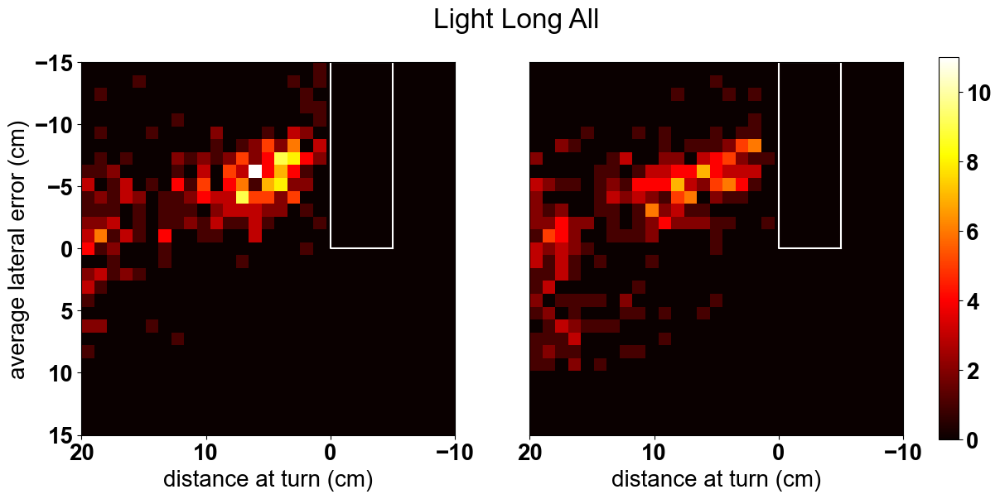

In [133]:
"""plot heat map of distance at turn torwards the opening comparing the first and seconed time seing the obstacle"""


font = {'family' : 'arial',
        'weight' : 'bold',
        'size'   : 20}

plt.rc( 'font',**font);
data = pd.concat([long_con_nostart])
long_short = pd.concat([long_con_nostart,short_con_nostart])

first_trial = data[(data.task == 'oa')&(data.consective_type == 0) &(data.turn_to_obstacle == 'towards') &(data.distance_at_head_turn >= 0)]
ind = first_trial.index.to_numpy()+2
third_trial = long_short.loc[ind.tolist()]



fig,axs = plt.subplots( 1,2, figsize = (14,6),sharey = False,)
fig.suptitle('Light Long All')
axs[1].set_yticks([])
axs[0].set_ylabel('average lateral error (cm)')
axs[0].set_xlabel('distance at turn (cm)')
axs[1].set_xlabel('distance at turn (cm)')
ymin,ymax = -10,20
xmin,xmax = -15,15


first_head_turn,first_lateral_error = first_trial.distance_at_head_turn.to_numpy(),first_trial.avg_lateral_error.to_numpy()

first_array ,first_xedges ,first_yedges   = np.histogram2d(first_lateral_error.astype(float), first_head_turn.astype(float), range = [[xmin,xmax],[ymin,ymax ]],bins=(list(range(xmin,xmax,1)), list(range(ymin,ymax,1)),))

axs[0].imshow(first_array[::-1], vmax=np.nanmax(first_array), cmap='hot',extent=[ymin,ymax,xmin,xmax])
#fig.colorbar(axs[1].imshow(first_array[::-1], vmax=np.nanmax(first_array), cmap='hot',extent=[ymin,ymax,xmin,xmax]),ax = axs)






third_head_turn,third_lateral_error = third_trial.distance_at_head_turn.to_numpy(),third_trial.avg_lateral_error.to_numpy()

third_array ,third_xedges ,third_yedges   = np.histogram2d(third_lateral_error.astype(float), third_head_turn.astype(float), range = [[xmin,xmax],[ymin,ymax ]],bins=(list(range(xmin,xmax,1)), list(range(ymin,ymax,1)),))
axs[1].imshow(third_array[::-1], vmax=np.nanmax(first_array), cmap='hot',extent=[ymin,ymax,xmin,xmax])
fig.colorbar(axs[1].imshow(third_array[::-1], vmax=np.nanmax(first_array),cmap='hot',extent=[ymin,ymax,xmin,xmax]),ax = axs,fraction=0.046, pad=0.04)

axs[1].plot( [-5,0,0,-5,-5], [0,0,-15,-15,0],c ='white')
axs[0].plot( [-5,0,0,-5,-5], [0,0,-15,-15,0],c ='white')

axs[0].invert_xaxis()
axs[0].invert_yaxis()

axs[1].invert_xaxis()
axs[1].invert_yaxis()



meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped


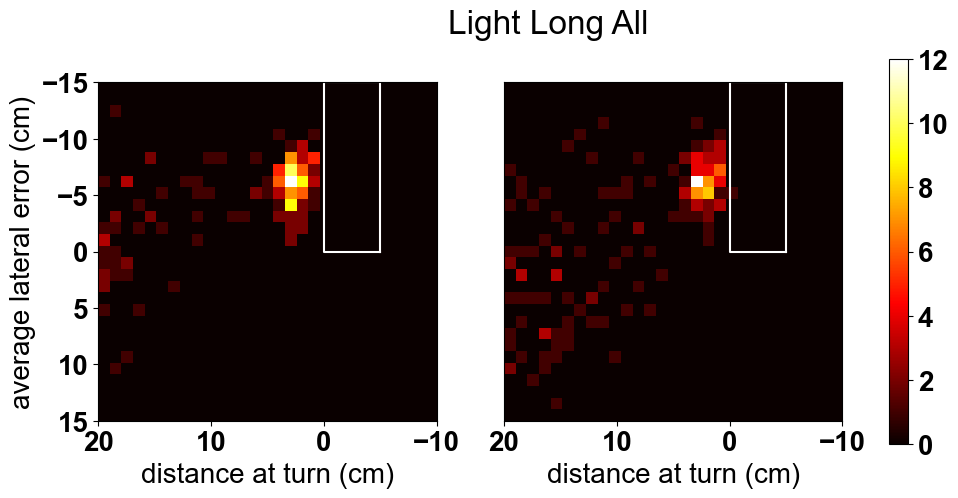

In [14]:
"""plot heat map of distance at turn torwards the opening comparing the first and seconed time seing the obstacle"""


font = {'family' : 'arial',
        'weight' : 'bold',
        'size'   : 20}

plt.rc( 'font',**font);
data = pd.concat([long_con_nostart])
long_short = pd.concat([long_con_nostart,short_con_nostart])

first_trial = data[(data.task == 'oadark')&(data.consective_type == 0) &(data.turn_to_obstacle == 'towards') &(data.distance_at_head_turn >= 0)]
ind = first_trial.index.to_numpy()+2
third_trial = long_short.loc[ind.tolist()]



fig,axs = plt.subplots( 1,2, figsize = (12,5),sharey = False,)
fig.suptitle('Light Long All')
axs[1].set_yticks([])
axs[0].set_ylabel('average lateral error (cm)')
axs[0].set_xlabel('distance at turn (cm)')
axs[1].set_xlabel('distance at turn (cm)')
ymin,ymax = -10,20
xmin,xmax = -15,15


first_head_turn,first_lateral_error = first_trial.distance_at_head_turn.to_numpy(),first_trial.avg_lateral_error.to_numpy()

first_array ,first_xedges ,first_yedges   = np.histogram2d(first_lateral_error.astype(float), first_head_turn.astype(float), range = [[xmin,xmax],[ymin,ymax ]],bins=(list(range(xmin,xmax,1)), list(range(ymin,ymax,1)),))

axs[0].imshow(first_array[::-1], vmax=np.nanmax(first_array), cmap='hot',extent=[ymin,ymax,xmin,xmax])
#fig.colorbar(axs[1].imshow(first_array[::-1], vmax=np.nanmax(first_array), cmap='hot',extent=[ymin,ymax,xmin,xmax]),ax = axs)






third_head_turn,third_lateral_error = third_trial.distance_at_head_turn.to_numpy(),third_trial.avg_lateral_error.to_numpy()

third_array ,third_xedges ,third_yedges   = np.histogram2d(third_lateral_error.astype(float), third_head_turn.astype(float), range = [[xmin,xmax],[ymin,ymax ]],bins=(list(range(xmin,xmax,1)), list(range(ymin,ymax,1)),))
axs[1].imshow(third_array[::-1], vmax=np.nanmax(first_array), cmap='hot',extent=[ymin,ymax,xmin,xmax])
fig.colorbar(axs[1].imshow(third_array[::-1], vmax=np.nanmax(first_array),cmap='hot',extent=[ymin,ymax,xmin,xmax]),ax = axs)

axs[1].plot( [-5,0,0,-5,-5], [0,0,-15,-15,0],c ='white')
axs[0].plot( [-5,0,0,-5,-5], [0,0,-15,-15,0],c ='white')

axs[0].invert_xaxis()
axs[0].invert_yaxis()

axs[1].invert_xaxis()
axs[1].invert_yaxis()
fig.savefig(r'd:\obstacle_avoidance\figures\SFN\consecutive/test.pdf',dpi = 300)


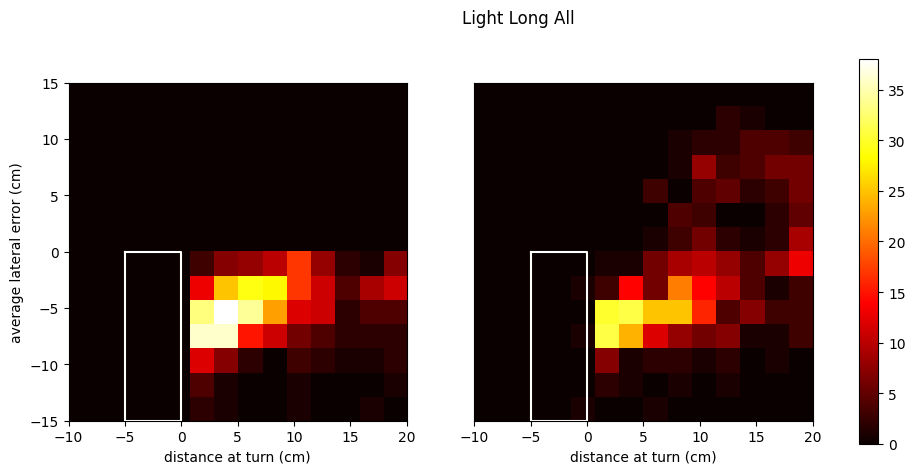

In [19]:
"""plot heat map of distance at turn torwards the opening comparing the first and seconed time seing the obstacle"""
data = long_short
first_trial = data[(data.task == 'oa')&(data.consective_type == 0) &(data.avg_lateral_error <= -2) &(data.distance_at_head_turn >= 0)]
ind = first_trial.index.to_numpy()+2
third_trial = data.loc[ind.tolist()]



fig,axs = plt.subplots( 1,2, figsize = (12,5),sharey = False)
fig.suptitle('Light Long All')
axs[1].set_yticks([])
axs[0].set_ylabel('average lateral error (cm)')
axs[0].set_xlabel('distance at turn (cm)')
axs[1].set_xlabel('distance at turn (cm)')
ymin,ymax = -10,20
xmin,xmax = -15,15


first_head_turn,first_lateral_error = first_trial.distance_at_head_turn.to_numpy(),first_trial.avg_lateral_error.to_numpy()

first_array ,first_xedges ,first_yedges   = np.histogram2d(first_lateral_error.astype(float), first_head_turn.astype(float), range = [[xmin,xmax],[ymin,ymax ]],bins=(list(range(xmin,xmax,2)), list(range(ymin,ymax,2)),))

axs[0].imshow(first_array[::-1], vmax=np.nanmax(first_array), cmap='hot',extent=[ymin,ymax,xmin,xmax])
#fig.colorbar(axs[1].imshow(first_array[::-1], vmax=np.nanmax(first_array), cmap='hot',extent=[ymin,ymax,xmin,xmax]),ax = axs)






third_head_turn,third_lateral_error = third_trial.distance_at_head_turn.to_numpy(),third_trial.avg_lateral_error.to_numpy()

third_array ,third_xedges ,third_yedges   = np.histogram2d(third_lateral_error.astype(float), third_head_turn.astype(float), range = [[xmin,xmax],[ymin,ymax ]],bins=(list(range(xmin,xmax,2)), list(range(ymin,ymax,2)),))
axs[1].imshow(third_array[::-1], vmax=np.nanmax(first_array), cmap='hot',extent=[ymin,ymax,xmin,xmax])
fig.colorbar(axs[1].imshow(third_array[::-1], vmax=np.nanmax(first_array),cmap='hot',extent=[ymin,ymax,xmin,xmax]),ax = axs)

axs[1].plot( [-5,0,0,-5,-5], [0,0,-15,-15,0],c ='white')
axs[0].plot( [-5,0,0,-5,-5], [0,0,-15,-15,0],c ='white')

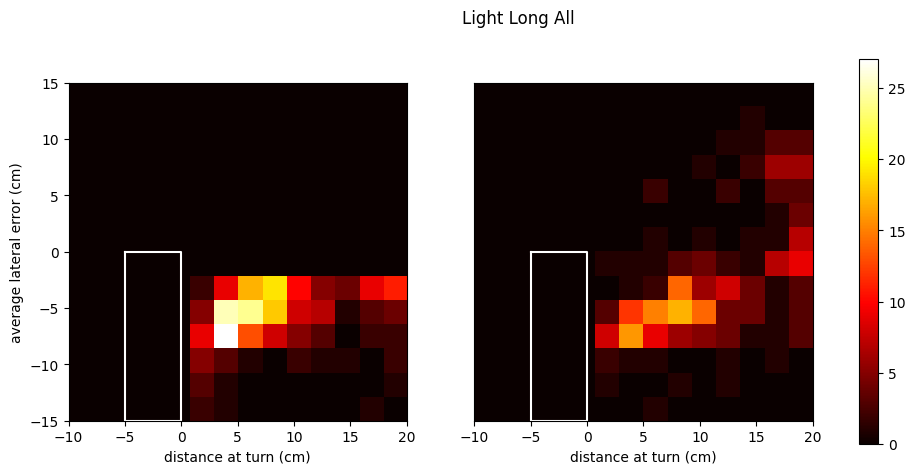

In [20]:
"""plot heat map of distance at turn torwards the opening comparing the first and seconed time seing the obstacle"""
data = pd.concat([long_con])
first_trial = data[(data.task == 'oa')&(data.consective_type == 0) &(data.avg_lateral_error <= -3) &(data.distance_at_head_turn >= 0)]
ind = first_trial.index.to_numpy()+2
third_trial = long_short.loc[ind.tolist()]



fig,axs = plt.subplots( 1,2, figsize = (12,5),sharey = False)
fig.suptitle('Light Long All')
axs[1].set_yticks([])
axs[0].set_ylabel('average lateral error (cm)')
axs[0].set_xlabel('distance at turn (cm)')
axs[1].set_xlabel('distance at turn (cm)')
ymin,ymax = -10,20
xmin,xmax = -15,15


first_head_turn,first_lateral_error = first_trial.distance_at_head_turn.to_numpy(),first_trial.avg_lateral_error.to_numpy()

first_array ,first_xedges ,first_yedges   = np.histogram2d(first_lateral_error.astype(float), first_head_turn.astype(float), range = [[xmin,xmax],[ymin,ymax ]],bins=(list(range(xmin,xmax,2)), list(range(ymin,ymax,2)),))

axs[0].imshow(first_array[::-1], vmax=np.nanmax(first_array), cmap='hot',extent=[ymin,ymax,xmin,xmax])
#fig.colorbar(axs[1].imshow(first_array[::-1], vmax=np.nanmax(first_array), cmap='hot',extent=[ymin,ymax,xmin,xmax]),ax = axs)






third_head_turn,third_lateral_error = third_trial.distance_at_head_turn.to_numpy(),third_trial.avg_lateral_error.to_numpy()

third_array ,third_xedges ,third_yedges   = np.histogram2d(third_lateral_error.astype(float), third_head_turn.astype(float), range = [[xmin,xmax],[ymin,ymax ]],bins=(list(range(xmin,xmax,2)), list(range(ymin,ymax,2)),))
axs[1].imshow(third_array[::-1], vmax=np.nanmax(first_array), cmap='hot',extent=[ymin,ymax,xmin,xmax])
fig.colorbar(axs[1].imshow(third_array[::-1], vmax=np.nanmax(first_array),cmap='hot',extent=[ymin,ymax,xmin,xmax]),ax = axs)

axs[1].plot( [-5,0,0,-5,-5], [0,0,-15,-15,0],c ='white')
axs[0].plot( [-5,0,0,-5,-5], [0,0,-15,-15,0],c ='white')

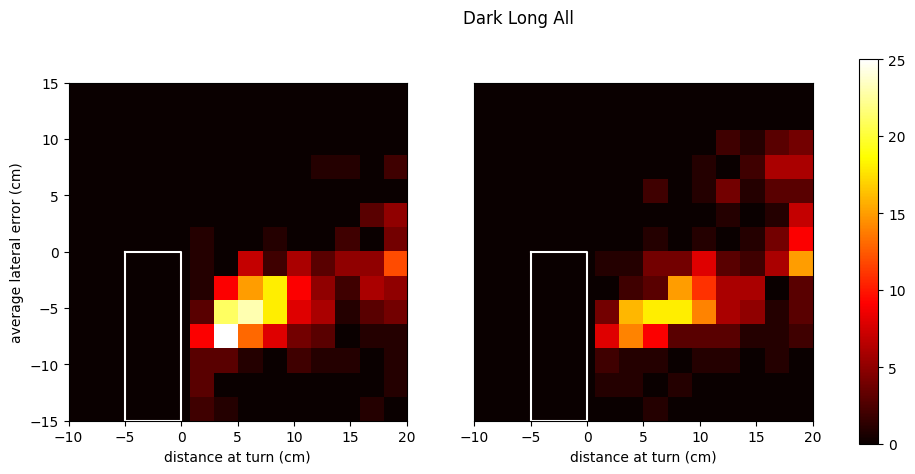

In [204]:
"""plot heat map of distance at turn torwards the opening comparing the first and seconed time seing the obstacle"""
data = pd.concat([long_con_nostart])
first_trial = data[(data.task == 'oa')&(data.consective_type == 0) &(data.turn_to_obstacle =='towards') &(data.distance_at_head_turn >= 0)]
long_short = pd.concat([long_con_nostart,short_con_nostart])
ind = first_trial.index.to_numpy()+2
third_trial = long_short.loc[ind.tolist()]



fig,axs = plt.subplots( 1,2, figsize = (12,5),sharey = False)
fig.suptitle('Dark Long All')
axs[1].set_yticks([])
axs[0].set_ylabel('average lateral error (cm)')
axs[0].set_xlabel('distance at turn (cm)')
axs[1].set_xlabel('distance at turn (cm)')
ymin,ymax = -10,20
xmin,xmax = -15,15


first_head_turn,first_lateral_error = first_trial.distance_at_head_turn.to_numpy(),first_trial.avg_lateral_error.to_numpy()

first_array ,first_xedges ,first_yedges   = np.histogram2d(first_lateral_error.astype(float), first_head_turn.astype(float), range = [[xmin,xmax],[ymin,ymax ]],bins=(list(range(xmin,xmax,2)), list(range(ymin,ymax,2)),))

axs[0].imshow(first_array[::-1], vmax=np.nanmax(first_array), cmap='hot',extent=[ymin,ymax,xmin,xmax])
#fig.colorbar(axs[1].imshow(first_array[::-1], vmax=np.nanmax(first_array), cmap='hot',extent=[ymin,ymax,xmin,xmax]),ax = axs)






third_head_turn,third_lateral_error = third_trial.distance_at_head_turn.to_numpy(),third_trial.avg_lateral_error.to_numpy()

third_array ,third_xedges ,third_yedges   = np.histogram2d(third_lateral_error.astype(float), third_head_turn.astype(float), range = [[xmin,xmax],[ymin,ymax ]],bins=(list(range(xmin,xmax,2)), list(range(ymin,ymax,2)),))
axs[1].imshow(third_array[::-1], vmax=np.nanmax(first_array), cmap='hot',extent=[ymin,ymax,xmin,xmax])
fig.colorbar(axs[1].imshow(third_array[::-1], vmax=np.nanmax(first_array),cmap='hot',extent=[ymin,ymax,xmin,xmax]),ax = axs)

axs[1].plot( [-5,0,0,-5,-5], [0,0,-15,-15,0],c ='white')
axs[0].plot( [-5,0,0,-5,-5], [0,0,-15,-15,0],c ='white')

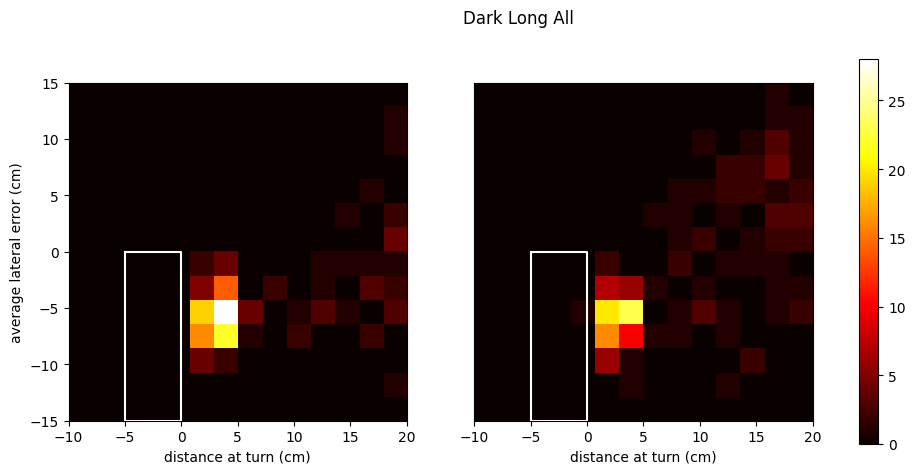

In [203]:
"""plot heat map of distance at turn torwards the opening comparing the first and seconed time seing the obstacle"""
data = pd.concat([long_con_nostart])
first_trial = data[(data.task == 'oadark')&(data.consective_type == 0) &(data.turn_to_obstacle =='towards') &(data.distance_at_head_turn >= 0)]
long_short = pd.concat([long_con_nostart,short_con_nostart])
ind = first_trial.index.to_numpy()+2
third_trial = long_short.loc[ind.tolist()]



fig,axs = plt.subplots( 1,2, figsize = (12,5),sharey = False)
fig.suptitle('Dark Long All')
axs[1].set_yticks([])
axs[0].set_ylabel('average lateral error (cm)')
axs[0].set_xlabel('distance at turn (cm)')
axs[1].set_xlabel('distance at turn (cm)')
ymin,ymax = -10,20
xmin,xmax = -15,15


first_head_turn,first_lateral_error = first_trial.distance_at_head_turn.to_numpy(),first_trial.avg_lateral_error.to_numpy()

first_array ,first_xedges ,first_yedges   = np.histogram2d(first_lateral_error.astype(float), first_head_turn.astype(float), range = [[xmin,xmax],[ymin,ymax ]],bins=(list(range(xmin,xmax,2)), list(range(ymin,ymax,2)),))

axs[0].imshow(first_array[::-1], vmax=np.nanmax(first_array), cmap='hot',extent=[ymin,ymax,xmin,xmax])
#fig.colorbar(axs[1].imshow(first_array[::-1], vmax=np.nanmax(first_array), cmap='hot',extent=[ymin,ymax,xmin,xmax]),ax = axs)






third_head_turn,third_lateral_error = third_trial.distance_at_head_turn.to_numpy(),third_trial.avg_lateral_error.to_numpy()

third_array ,third_xedges ,third_yedges   = np.histogram2d(third_lateral_error.astype(float), third_head_turn.astype(float), range = [[xmin,xmax],[ymin,ymax ]],bins=(list(range(xmin,xmax,2)), list(range(ymin,ymax,2)),))
axs[1].imshow(third_array[::-1], vmax=np.nanmax(first_array), cmap='hot',extent=[ymin,ymax,xmin,xmax])
fig.colorbar(axs[1].imshow(third_array[::-1], vmax=np.nanmax(first_array),cmap='hot',extent=[ymin,ymax,xmin,xmax]),ax = axs)

axs[1].plot( [-5,0,0,-5,-5], [0,0,-15,-15,0],c ='white')
axs[0].plot( [-5,0,0,-5,-5], [0,0,-15,-15,0],c ='white')

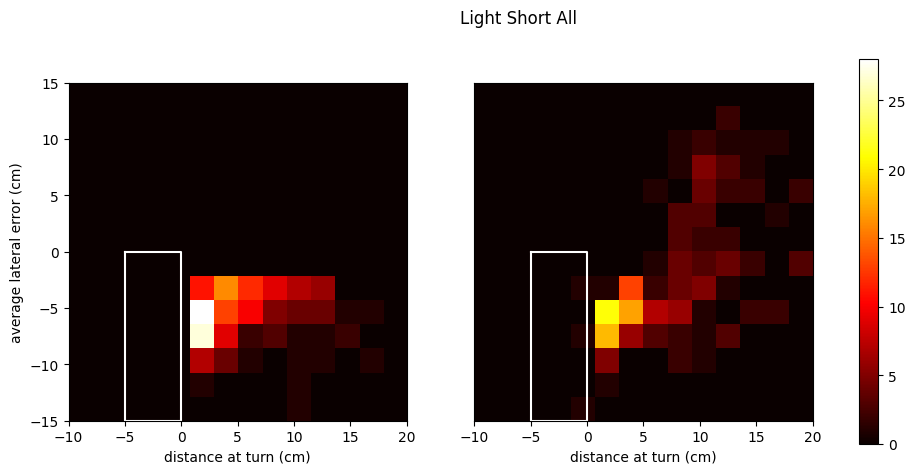

In [661]:
"""plot heat map of distance at turn torwards the opening comparing the first and seconed time seing the obstacle"""
data = pd.concat([short_con])
first_trial = data[(data.task == 'oa')&(data.consective_type == 0) &(data.avg_lateral_error <= -3) &(data.distance_at_head_turn >= 0)]
ind = first_trial.index.to_numpy()+2
long_short = pd.concat([long_con,short_con])
third_trial = long_short.loc[ind.tolist()]



fig,axs = plt.subplots( 1,2, figsize = (12,5),sharey = False)
fig.suptitle('Light Short All')
axs[1].set_yticks([])
axs[0].set_ylabel('average lateral error (cm)')
axs[0].set_xlabel('distance at turn (cm)')
axs[1].set_xlabel('distance at turn (cm)')
ymin,ymax = -10,20
xmin,xmax = -15,15


first_head_turn,first_lateral_error = first_trial.distance_at_head_turn.to_numpy(),first_trial.avg_lateral_error.to_numpy()

first_array ,first_xedges ,first_yedges   = np.histogram2d(first_lateral_error.astype(float), first_head_turn.astype(float), range = [[xmin,xmax],[ymin,ymax ]],bins=(list(range(xmin,xmax,2)), list(range(ymin,ymax,2)),))

axs[0].imshow(first_array[::-1], vmax=np.nanmax(first_array), cmap='hot',extent=[ymin,ymax,xmin,xmax])
#fig.colorbar(axs[1].imshow(first_array[::-1], vmax=np.nanmax(first_array), cmap='hot',extent=[ymin,ymax,xmin,xmax]),ax = axs)






third_head_turn,third_lateral_error = third_trial.distance_at_head_turn.to_numpy(),third_trial.avg_lateral_error.to_numpy()

third_array ,third_xedges ,third_yedges   = np.histogram2d(third_lateral_error.astype(float), third_head_turn.astype(float), range = [[xmin,xmax],[ymin,ymax ]],bins=(list(range(xmin,xmax,2)), list(range(ymin,ymax,2)),))
axs[1].imshow(third_array[::-1], vmax=np.nanmax(first_array), cmap='hot',extent=[ymin,ymax,xmin,xmax])
fig.colorbar(axs[1].imshow(third_array[::-1], vmax=np.nanmax(first_array),cmap='hot',extent=[ymin,ymax,xmin,xmax]),ax = axs)

axs[1].plot( [-5,0,0,-5,-5], [0,0,-15,-15,0],c ='white')
axs[0].plot( [-5,0,0,-5,-5], [0,0,-15,-15,0],c ='white')

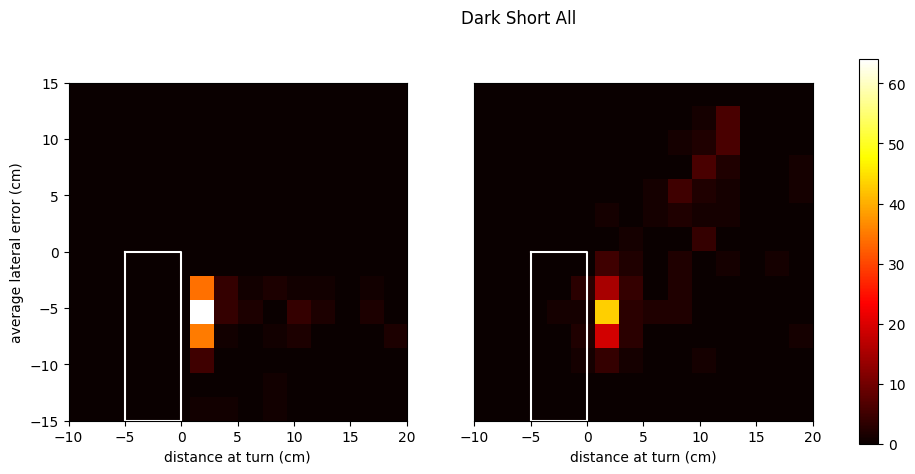

In [664]:
"""plot heat map of distance at turn torwards the opening comparing the first and seconed time seing the obstacle"""
data = pd.concat([short_con])
first_trial = data[(data.task == 'oadark')&(data.consective_type == 0) &(data.avg_lateral_error <= -3) &(data.distance_at_head_turn >= 0)]
ind = first_trial.index.to_numpy()+2
long_short = pd.concat([long_con,short_con])
third_trial = long_short.loc[ind.tolist()]



fig,axs = plt.subplots( 1,2, figsize = (12,5),sharey = False)
fig.suptitle('Dark Short All')
axs[1].set_yticks([])
axs[0].set_ylabel('average lateral error (cm)')
axs[0].set_xlabel('distance at turn (cm)')
axs[1].set_xlabel('distance at turn (cm)')
ymin,ymax = -10,20
xmin,xmax = -15,15


first_head_turn,first_lateral_error = first_trial.distance_at_head_turn.to_numpy(),first_trial.avg_lateral_error.to_numpy()

first_array ,first_xedges ,first_yedges   = np.histogram2d(first_lateral_error.astype(float), first_head_turn.astype(float), range = [[xmin,xmax],[ymin,ymax ]],bins=(list(range(xmin,xmax,2)), list(range(ymin,ymax,2)),))

axs[0].imshow(first_array[::-1], vmax=np.nanmax(first_array), cmap='hot',extent=[ymin,ymax,xmin,xmax])
#fig.colorbar(axs[1].imshow(first_array[::-1], vmax=np.nanmax(first_array), cmap='hot',extent=[ymin,ymax,xmin,xmax]),ax = axs)






third_head_turn,third_lateral_error = third_trial.distance_at_head_turn.to_numpy(),third_trial.avg_lateral_error.to_numpy()

third_array ,third_xedges ,third_yedges   = np.histogram2d(third_lateral_error.astype(float), third_head_turn.astype(float), range = [[xmin,xmax],[ymin,ymax ]],bins=(list(range(xmin,xmax,2)), list(range(ymin,ymax,2)),))
axs[1].imshow(third_array[::-1], vmax=np.nanmax(first_array), cmap='hot',extent=[ymin,ymax,xmin,xmax])
fig.colorbar(axs[1].imshow(third_array[::-1], vmax=np.nanmax(first_array),cmap='hot',extent=[ymin,ymax,xmin,xmax]),ax = axs)

axs[1].plot( [-5,0,0,-5,-5], [0,0,-15,-15,0],c ='white')
axs[0].plot( [-5,0,0,-5,-5], [0,0,-15,-15,0],c ='white')

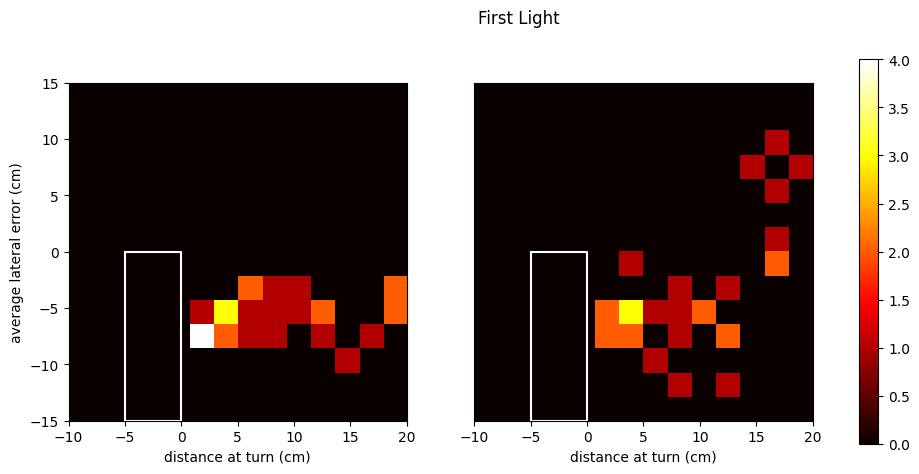

In [597]:
"""plot heat map of distance at turn torwards the opening comparing the first and seconed time seing the obstacle"""
data = pd.concat([long_con,short_con])
first_trial = data[(data.task == 'oa')&(data.consective_type == 0)&(data.date_index == 0)  &(data.avg_lateral_error <= -3) &(data.distance_at_head_turn >= 0)]
ind = first_trial.index.to_numpy()+2
third_trial = long_short.loc[ind.tolist()]



fig,axs = plt.subplots( 1,2, figsize = (12,5),sharey = False)
fig.suptitle('First Light')
axs[1].set_yticks([])
axs[0].set_ylabel('average lateral error (cm)')
axs[0].set_xlabel('distance at turn (cm)')
axs[1].set_xlabel('distance at turn (cm)')
ymin,ymax = -10,20
xmin,xmax = -15,15


first_head_turn,first_lateral_error = first_trial.distance_at_head_turn.to_numpy(),first_trial.avg_lateral_error.to_numpy()

first_array ,first_xedges ,first_yedges   = np.histogram2d(first_lateral_error.astype(float), first_head_turn.astype(float), range = [[xmin,xmax],[ymin,ymax ]],bins=(list(range(xmin,xmax,2)), list(range(ymin,ymax,2)),))

axs[0].imshow(first_array[::-1], vmax=np.nanmax(first_array), cmap='hot',extent=[ymin,ymax,xmin,xmax])
#fig.colorbar(axs[1].imshow(first_array[::-1], vmax=np.nanmax(first_array), cmap='hot',extent=[ymin,ymax,xmin,xmax]),ax = axs)






third_head_turn,third_lateral_error = third_trial.distance_at_head_turn.to_numpy(),third_trial.avg_lateral_error.to_numpy()

third_array ,third_xedges ,third_yedges   = np.histogram2d(third_lateral_error.astype(float), third_head_turn.astype(float), range = [[xmin,xmax],[ymin,ymax ]],bins=(list(range(xmin,xmax,2)), list(range(ymin,ymax,2)),))
axs[1].imshow(third_array[::-1], vmax=np.nanmax(first_array), cmap='hot',extent=[ymin,ymax,xmin,xmax])
fig.colorbar(axs[1].imshow(third_array[::-1], vmax=np.nanmax(first_array),cmap='hot',extent=[ymin,ymax,xmin,xmax]),ax = axs)

axs[1].plot( [-5,0,0,-5,-5], [0,0,-15,-15,0],c ='white')
axs[0].plot( [-5,0,0,-5,-5], [0,0,-15,-15,0],c ='white')

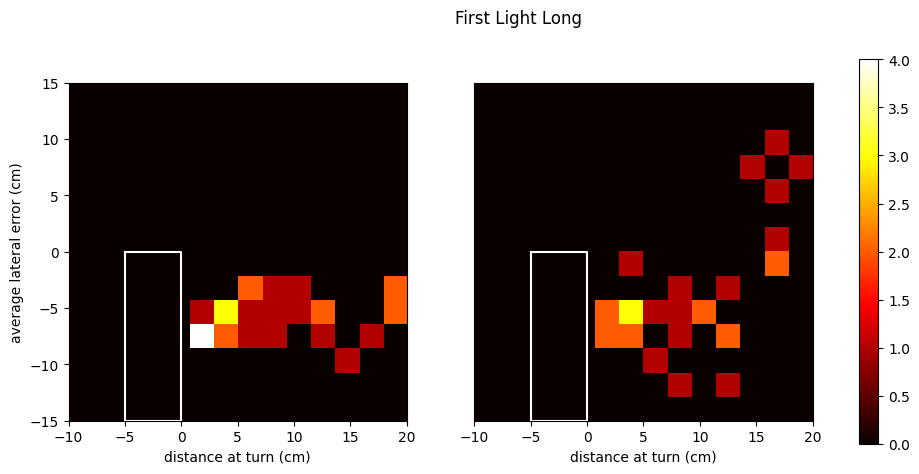

In [600]:
"""plot heat map of distance at turn torwards the opening comparing the first and seconed time seing the obstacle"""
data = pd.concat([long_con])
first_trial = data[(data.task == 'oa')&(data.consective_type == 0)&(data.date_index == 0)  &(data.avg_lateral_error <= -3) &(data.distance_at_head_turn >= 0)]
ind = first_trial.index.to_numpy()+2
third_trial = long_short.loc[ind.tolist()]



fig,axs = plt.subplots( 1,2, figsize = (12,5),sharey = False)
fig.suptitle('First Light Long')
axs[1].set_yticks([])
axs[0].set_ylabel('average lateral error (cm)')
axs[0].set_xlabel('distance at turn (cm)')
axs[1].set_xlabel('distance at turn (cm)')
ymin,ymax = -10,20
xmin,xmax = -15,15


first_head_turn,first_lateral_error = first_trial.distance_at_head_turn.to_numpy(),first_trial.avg_lateral_error.to_numpy()

first_array ,first_xedges ,first_yedges   = np.histogram2d(first_lateral_error.astype(float), first_head_turn.astype(float), range = [[xmin,xmax],[ymin,ymax ]],bins=(list(range(xmin,xmax,2)), list(range(ymin,ymax,2)),))

axs[0].imshow(first_array[::-1], vmax=np.nanmax(first_array), cmap='hot',extent=[ymin,ymax,xmin,xmax])
#fig.colorbar(axs[1].imshow(first_array[::-1], vmax=np.nanmax(first_array), cmap='hot',extent=[ymin,ymax,xmin,xmax]),ax = axs)






third_head_turn,third_lateral_error = third_trial.distance_at_head_turn.to_numpy(),third_trial.avg_lateral_error.to_numpy()

third_array ,third_xedges ,third_yedges   = np.histogram2d(third_lateral_error.astype(float), third_head_turn.astype(float), range = [[xmin,xmax],[ymin,ymax ]],bins=(list(range(xmin,xmax,2)), list(range(ymin,ymax,2)),))
axs[1].imshow(third_array[::-1], vmax=np.nanmax(first_array), cmap='hot',extent=[ymin,ymax,xmin,xmax])
fig.colorbar(axs[1].imshow(third_array[::-1], vmax=np.nanmax(first_array),cmap='hot',extent=[ymin,ymax,xmin,xmax]),ax = axs)

axs[1].plot( [-5,0,0,-5,-5], [0,0,-15,-15,0],c ='white')
axs[0].plot( [-5,0,0,-5,-5], [0,0,-15,-15,0],c ='white')

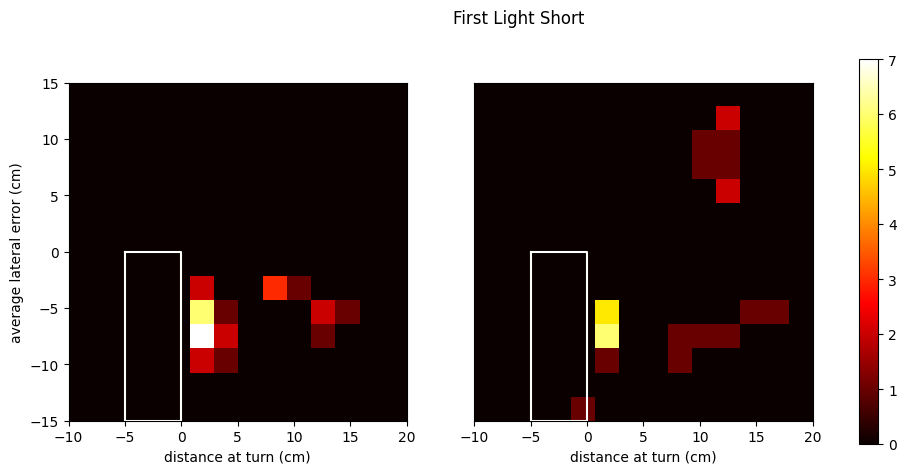

In [601]:
"""plot heat map of distance at turn torwards the opening comparing the first and seconed time seing the obstacle"""
data = pd.concat([short_con])
first_trial = data[(data.task == 'oa')&(data.consective_type == 0)&(data.date_index == 0)  &(data.avg_lateral_error <= -3) &(data.distance_at_head_turn >= 0)]
ind = first_trial.index.to_numpy()+2
third_trial = long_short.loc[ind.tolist()]



fig,axs = plt.subplots( 1,2, figsize = (12,5),sharey = False)
fig.suptitle('First Light Short')
axs[1].set_yticks([])
axs[0].set_ylabel('average lateral error (cm)')
axs[0].set_xlabel('distance at turn (cm)')
axs[1].set_xlabel('distance at turn (cm)')
ymin,ymax = -10,20
xmin,xmax = -15,15


first_head_turn,first_lateral_error = first_trial.distance_at_head_turn.to_numpy(),first_trial.avg_lateral_error.to_numpy()

first_array ,first_xedges ,first_yedges   = np.histogram2d(first_lateral_error.astype(float), first_head_turn.astype(float), range = [[xmin,xmax],[ymin,ymax ]],bins=(list(range(xmin,xmax,2)), list(range(ymin,ymax,2)),))

axs[0].imshow(first_array[::-1], vmax=np.nanmax(first_array), cmap='hot',extent=[ymin,ymax,xmin,xmax])
#fig.colorbar(axs[1].imshow(first_array[::-1], vmax=np.nanmax(first_array), cmap='hot',extent=[ymin,ymax,xmin,xmax]),ax = axs)






third_head_turn,third_lateral_error = third_trial.distance_at_head_turn.to_numpy(),third_trial.avg_lateral_error.to_numpy()

third_array ,third_xedges ,third_yedges   = np.histogram2d(third_lateral_error.astype(float), third_head_turn.astype(float), range = [[xmin,xmax],[ymin,ymax ]],bins=(list(range(xmin,xmax,2)), list(range(ymin,ymax,2)),))
axs[1].imshow(third_array[::-1], vmax=np.nanmax(first_array), cmap='hot',extent=[ymin,ymax,xmin,xmax])
fig.colorbar(axs[1].imshow(third_array[::-1], vmax=np.nanmax(first_array),cmap='hot',extent=[ymin,ymax,xmin,xmax]),ax = axs)

axs[1].plot( [-5,0,0,-5,-5], [0,0,-15,-15,0],c ='white')
axs[0].plot( [-5,0,0,-5,-5], [0,0,-15,-15,0],c ='white')

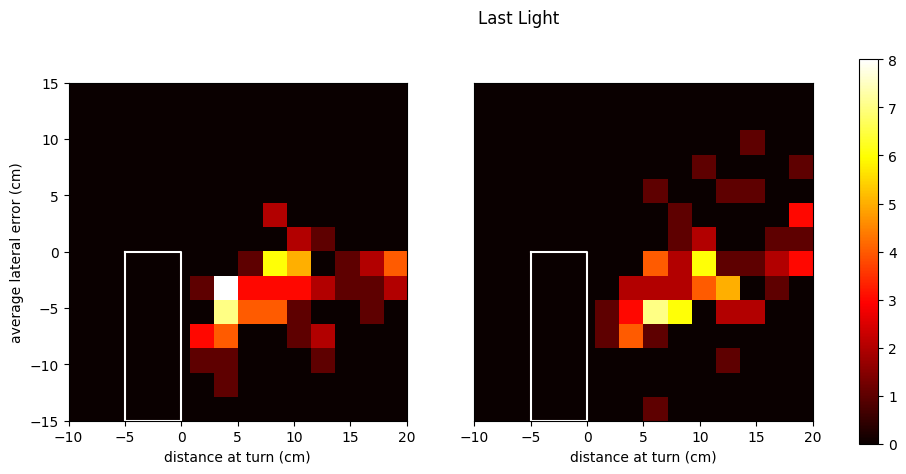

In [695]:
"""plot heat map of distance at turn torwards the opening comparing the first and seconed time seing the obstacle"""
data = pd.concat([long_con,short_con])
first_trial = data[(data.task == 'oa')&(data.consective_type == 0)&(data.date_index == 6)  &(data.intial_lateral_error <= -3) &(data.distance_at_head_turn >= 0)]
ind = first_trial.index.to_numpy()+2
third_trial = long_short.loc[ind.tolist()]



fig,axs = plt.subplots( 1,2, figsize = (12,5),sharey = False)
fig.suptitle('Last Light')
axs[1].set_yticks([])
axs[0].set_ylabel('average lateral error (cm)')
axs[0].set_xlabel('distance at turn (cm)')
axs[1].set_xlabel('distance at turn (cm)')
ymin,ymax = -10,20
xmin,xmax = -15,15


first_head_turn,first_lateral_error = first_trial.distance_at_head_turn.to_numpy(),first_trial.avg_lateral_error.to_numpy()

first_array ,first_xedges ,first_yedges   = np.histogram2d(first_lateral_error.astype(float), first_head_turn.astype(float), range = [[xmin,xmax],[ymin,ymax ]],bins=(list(range(xmin,xmax,2)), list(range(ymin,ymax,2)),))

axs[0].imshow(first_array[::-1], vmax=np.nanmax(first_array), cmap='hot',extent=[ymin,ymax,xmin,xmax])
#fig.colorbar(axs[1].imshow(first_array[::-1], vmax=np.nanmax(first_array), cmap='hot',extent=[ymin,ymax,xmin,xmax]),ax = axs)






third_head_turn,third_lateral_error = third_trial.distance_at_head_turn.to_numpy(),third_trial.avg_lateral_error.to_numpy()

third_array ,third_xedges ,third_yedges   = np.histogram2d(third_lateral_error.astype(float), third_head_turn.astype(float), range = [[xmin,xmax],[ymin,ymax ]],bins=(list(range(xmin,xmax,2)), list(range(ymin,ymax,2)),))
axs[1].imshow(third_array[::-1], vmax=np.nanmax(first_array), cmap='hot',extent=[ymin,ymax,xmin,xmax])
fig.colorbar(axs[1].imshow(third_array[::-1], vmax=np.nanmax(first_array),cmap='hot',extent=[ymin,ymax,xmin,xmax]),ax = axs)

axs[1].plot( [-5,0,0,-5,-5], [0,0,-15,-15,0],c ='white')
axs[0].plot( [-5,0,0,-5,-5], [0,0,-15,-15,0],c ='white')


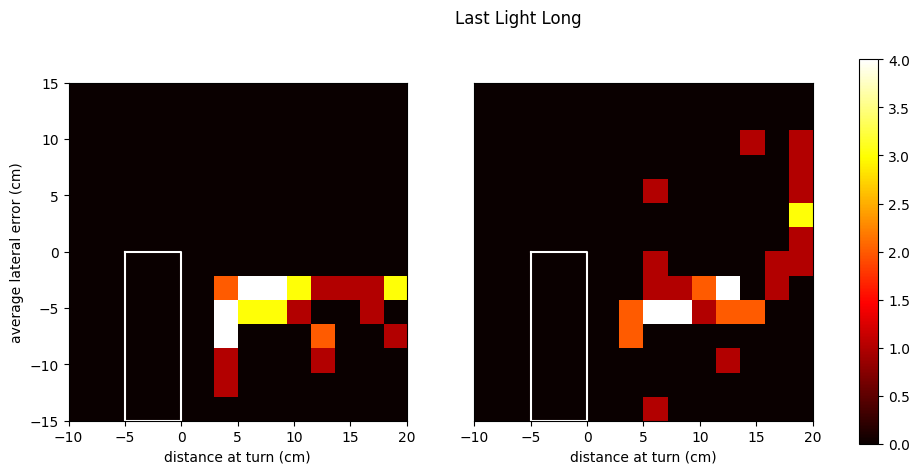

In [602]:
"""plot heat map of distance at turn torwards the opening comparing the first and seconed time seing the obstacle"""
data = pd.concat([long_con])
first_trial = data[(data.task == 'oa')&(data.consective_type == 0)&(data.date_index == 6)  &(data.avg_lateral_error <= -3) &(data.distance_at_head_turn >= 0)]
ind = first_trial.index.to_numpy()+2
third_trial = long_short.loc[ind.tolist()]



fig,axs = plt.subplots( 1,2, figsize = (12,5),sharey = False)
fig.suptitle('Last Light Long')
axs[1].set_yticks([])
axs[0].set_ylabel('average lateral error (cm)')
axs[0].set_xlabel('distance at turn (cm)')
axs[1].set_xlabel('distance at turn (cm)')
ymin,ymax = -10,20
xmin,xmax = -15,15


first_head_turn,first_lateral_error = first_trial.distance_at_head_turn.to_numpy(),first_trial.avg_lateral_error.to_numpy()

first_array ,first_xedges ,first_yedges   = np.histogram2d(first_lateral_error.astype(float), first_head_turn.astype(float), range = [[xmin,xmax],[ymin,ymax ]],bins=(list(range(xmin,xmax,2)), list(range(ymin,ymax,2)),))

axs[0].imshow(first_array[::-1], vmax=np.nanmax(first_array), cmap='hot',extent=[ymin,ymax,xmin,xmax])
#fig.colorbar(axs[1].imshow(first_array[::-1], vmax=np.nanmax(first_array), cmap='hot',extent=[ymin,ymax,xmin,xmax]),ax = axs)






third_head_turn,third_lateral_error = third_trial.distance_at_head_turn.to_numpy(),third_trial.avg_lateral_error.to_numpy()

third_array ,third_xedges ,third_yedges   = np.histogram2d(third_lateral_error.astype(float), third_head_turn.astype(float), range = [[xmin,xmax],[ymin,ymax ]],bins=(list(range(xmin,xmax,2)), list(range(ymin,ymax,2)),))
axs[1].imshow(third_array[::-1], vmax=np.nanmax(first_array), cmap='hot',extent=[ymin,ymax,xmin,xmax])
fig.colorbar(axs[1].imshow(third_array[::-1], vmax=np.nanmax(first_array),cmap='hot',extent=[ymin,ymax,xmin,xmax]),ax = axs)

axs[1].plot( [-5,0,0,-5,-5], [0,0,-15,-15,0],c ='white')
axs[0].plot( [-5,0,0,-5,-5], [0,0,-15,-15,0],c ='white')

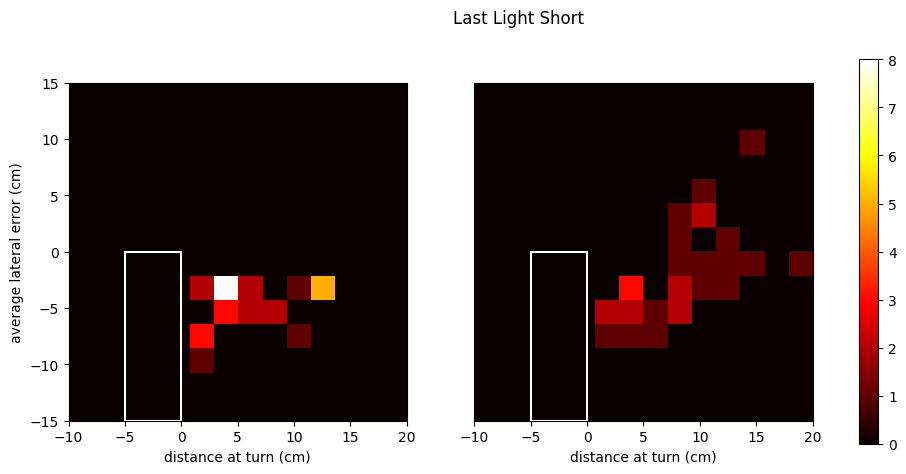

In [604]:
"""plot heat map of distance at turn torwards the opening comparing the first and seconed time seing the obstacle"""
data = pd.concat([short_con])
first_trial = data[(data.task == 'oa')&(data.consective_type == 0)&(data.date_index == 6)  &(data.avg_lateral_error <= -3) &(data.distance_at_head_turn >= 0)]
ind = first_trial.index.to_numpy()+2
third_trial = long_short.loc[ind.tolist()]



fig,axs = plt.subplots( 1,2, figsize = (12,5),sharey = False)
fig.suptitle('Last Light Short')
axs[1].set_yticks([])
axs[0].set_ylabel('average lateral error (cm)')
axs[0].set_xlabel('distance at turn (cm)')
axs[1].set_xlabel('distance at turn (cm)')
ymin,ymax = -10,20
xmin,xmax = -15,15


first_head_turn,first_lateral_error = first_trial.distance_at_head_turn.to_numpy(),first_trial.avg_lateral_error.to_numpy()

first_array ,first_xedges ,first_yedges   = np.histogram2d(first_lateral_error.astype(float), first_head_turn.astype(float), range = [[xmin,xmax],[ymin,ymax ]],bins=(list(range(xmin,xmax,2)), list(range(ymin,ymax,2)),))

axs[0].imshow(first_array[::-1], vmax=np.nanmax(first_array), cmap='hot',extent=[ymin,ymax,xmin,xmax])
#fig.colorbar(axs[1].imshow(first_array[::-1], vmax=np.nanmax(first_array), cmap='hot',extent=[ymin,ymax,xmin,xmax]),ax = axs)






third_head_turn,third_lateral_error = third_trial.distance_at_head_turn.to_numpy(),third_trial.avg_lateral_error.to_numpy()

third_array ,third_xedges ,third_yedges   = np.histogram2d(third_lateral_error.astype(float), third_head_turn.astype(float), range = [[xmin,xmax],[ymin,ymax ]],bins=(list(range(xmin,xmax,2)), list(range(ymin,ymax,2)),))
axs[1].imshow(third_array[::-1], vmax=np.nanmax(first_array), cmap='hot',extent=[ymin,ymax,xmin,xmax])
fig.colorbar(axs[1].imshow(third_array[::-1], vmax=np.nanmax(first_array),cmap='hot',extent=[ymin,ymax,xmin,xmax]),ax = axs)

axs[1].plot( [-5,0,0,-5,-5], [0,0,-15,-15,0],c ='white')
axs[0].plot( [-5,0,0,-5,-5], [0,0,-15,-15,0],c ='white')

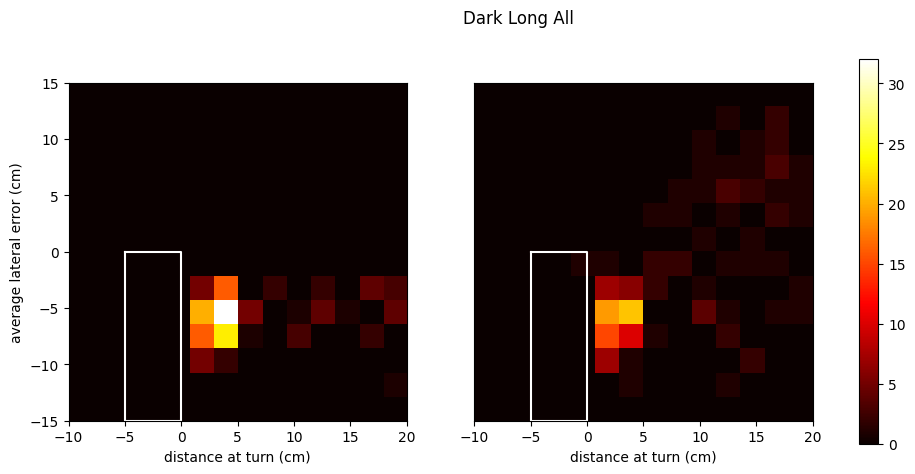

In [614]:
"""plot heat map of distance at turn torwards the opening comparing the first and seconed time seing the obstacle"""
data = pd.concat([long_con])
first_trial = data[(data.task == 'oadark')&(data.consective_type == 0)  &(data.avg_lateral_error <= -3) &(data.distance_at_head_turn >= 0)]
ind = first_trial.index.to_numpy()+2
third_trial = long_short.loc[ind.tolist()]



fig,axs = plt.subplots( 1,2, figsize = (12,5),sharey = False)
fig.suptitle('Dark Long All')
axs[1].set_yticks([])
axs[0].set_ylabel('average lateral error (cm)')
axs[0].set_xlabel('distance at turn (cm)')
axs[1].set_xlabel('distance at turn (cm)')
ymin,ymax = -10,20
xmin,xmax = -15,15


first_head_turn,first_lateral_error = first_trial.distance_at_head_turn.to_numpy(),first_trial.avg_lateral_error.to_numpy()

first_array ,first_xedges ,first_yedges   = np.histogram2d(first_lateral_error.astype(float), first_head_turn.astype(float), range = [[xmin,xmax],[ymin,ymax ]],bins=(list(range(xmin,xmax,2)), list(range(ymin,ymax,2)),))

axs[0].imshow(first_array[::-1], vmax=np.nanmax(first_array), cmap='hot',extent=[ymin,ymax,xmin,xmax])
#fig.colorbar(axs[1].imshow(first_array[::-1], vmax=np.nanmax(first_array), cmap='hot',extent=[ymin,ymax,xmin,xmax]),ax = axs)






third_head_turn,third_lateral_error = third_trial.distance_at_head_turn.to_numpy(),third_trial.avg_lateral_error.to_numpy()

third_array ,third_xedges ,third_yedges   = np.histogram2d(third_lateral_error.astype(float), third_head_turn.astype(float), range = [[xmin,xmax],[ymin,ymax ]],bins=(list(range(xmin,xmax,2)), list(range(ymin,ymax,2)),))
axs[1].imshow(third_array[::-1], vmax=np.nanmax(first_array), cmap='hot',extent=[ymin,ymax,xmin,xmax])
fig.colorbar(axs[1].imshow(third_array[::-1], vmax=np.nanmax(first_array),cmap='hot',extent=[ymin,ymax,xmin,xmax]),ax = axs)

axs[1].plot( [-5,0,0,-5,-5], [0,0,-15,-15,0],c ='white')
axs[0].plot( [-5,0,0,-5,-5], [0,0,-15,-15,0],c ='white')

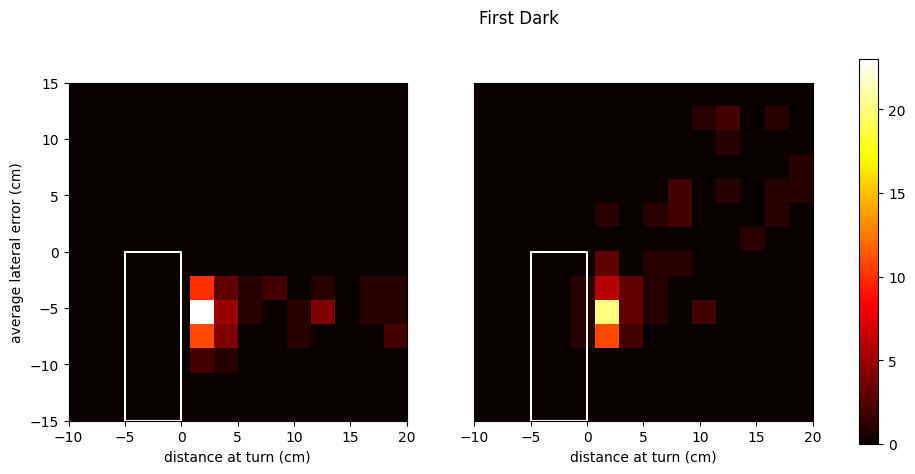

In [589]:
"""plot heat map of distance at turn torwards the opening comparing the first and seconed time seing the obstacle"""
data = pd.concat([long_con,short_con])
first_trial = data[(data.task == 'oadark')&(data.consective_type == 0)&(data.date_index == 0)  &(data.avg_lateral_error <= -3) &(data.distance_at_head_turn >= 0)]
ind = first_trial.index.to_numpy()+2
third_trial = long_short.loc[ind.tolist()]



fig,axs = plt.subplots( 1,2, figsize = (12,5),sharey = False)
fig.suptitle('First Dark')
axs[1].set_yticks([])
axs[0].set_ylabel('average lateral error (cm)')
axs[0].set_xlabel('distance at turn (cm)')
axs[1].set_xlabel('distance at turn (cm)')
ymin,ymax = -10,20
xmin,xmax = -15,15


first_head_turn,first_lateral_error = first_trial.distance_at_head_turn.to_numpy(),first_trial.avg_lateral_error.to_numpy()

first_array ,first_xedges ,first_yedges   = np.histogram2d(first_lateral_error.astype(float), first_head_turn.astype(float), range = [[xmin,xmax],[ymin,ymax ]],bins=(list(range(xmin,xmax,2)), list(range(ymin,ymax,2)),))

axs[0].imshow(first_array[::-1], vmax=np.nanmax(first_array), cmap='hot',extent=[ymin,ymax,xmin,xmax])
#fig.colorbar(axs[1].imshow(first_array[::-1], vmax=np.nanmax(first_array), cmap='hot',extent=[ymin,ymax,xmin,xmax]),ax = axs)






third_head_turn,third_lateral_error = third_trial.distance_at_head_turn.to_numpy(),third_trial.avg_lateral_error.to_numpy()

third_array ,third_xedges ,third_yedges   = np.histogram2d(third_lateral_error.astype(float), third_head_turn.astype(float), range = [[xmin,xmax],[ymin,ymax ]],bins=(list(range(xmin,xmax,2)), list(range(ymin,ymax,2)),))
axs[1].imshow(third_array[::-1], vmax=np.nanmax(first_array), cmap='hot',extent=[ymin,ymax,xmin,xmax])
fig.colorbar(axs[1].imshow(third_array[::-1], vmax=np.nanmax(first_array),cmap='hot',extent=[ymin,ymax,xmin,xmax]),ax = axs)

axs[1].plot( [-5,0,0,-5,-5], [0,0,-15,-15,0],c ='white')
axs[0].plot( [-5,0,0,-5,-5], [0,0,-15,-15,0],c ='white')

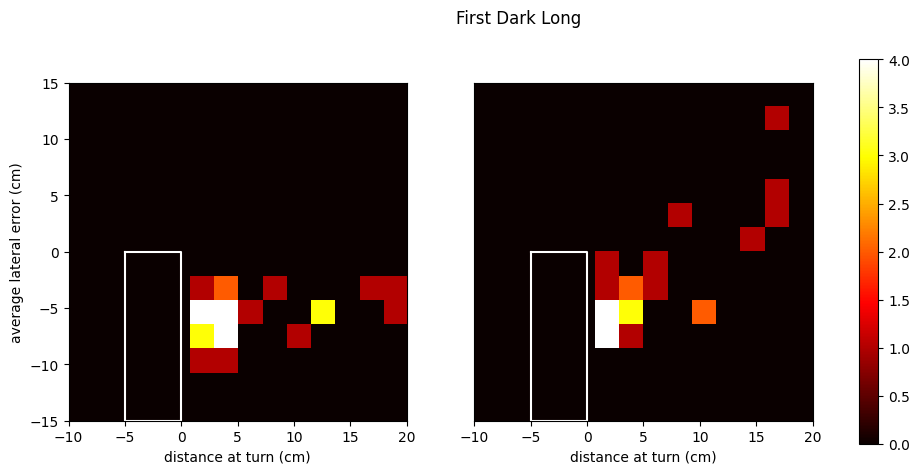

In [605]:
"""plot heat map of distance at turn torwards the opening comparing the first and seconed time seing the obstacle"""
data = pd.concat([long_con])
first_trial = data[(data.task == 'oadark')&(data.consective_type == 0)&(data.date_index == 0)  &(data.avg_lateral_error <= -3) &(data.distance_at_head_turn >= 0)]
ind = first_trial.index.to_numpy()+2
third_trial = long_short.loc[ind.tolist()]



fig,axs = plt.subplots( 1,2, figsize = (12,5),sharey = False)
fig.suptitle('First Dark Long')
axs[1].set_yticks([])
axs[0].set_ylabel('average lateral error (cm)')
axs[0].set_xlabel('distance at turn (cm)')
axs[1].set_xlabel('distance at turn (cm)')
ymin,ymax = -10,20
xmin,xmax = -15,15


first_head_turn,first_lateral_error = first_trial.distance_at_head_turn.to_numpy(),first_trial.avg_lateral_error.to_numpy()

first_array ,first_xedges ,first_yedges   = np.histogram2d(first_lateral_error.astype(float), first_head_turn.astype(float), range = [[xmin,xmax],[ymin,ymax ]],bins=(list(range(xmin,xmax,2)), list(range(ymin,ymax,2)),))

axs[0].imshow(first_array[::-1], vmax=np.nanmax(first_array), cmap='hot',extent=[ymin,ymax,xmin,xmax])
#fig.colorbar(axs[1].imshow(first_array[::-1], vmax=np.nanmax(first_array), cmap='hot',extent=[ymin,ymax,xmin,xmax]),ax = axs)






third_head_turn,third_lateral_error = third_trial.distance_at_head_turn.to_numpy(),third_trial.avg_lateral_error.to_numpy()

third_array ,third_xedges ,third_yedges   = np.histogram2d(third_lateral_error.astype(float), third_head_turn.astype(float), range = [[xmin,xmax],[ymin,ymax ]],bins=(list(range(xmin,xmax,2)), list(range(ymin,ymax,2)),))
axs[1].imshow(third_array[::-1], vmax=np.nanmax(first_array), cmap='hot',extent=[ymin,ymax,xmin,xmax])
fig.colorbar(axs[1].imshow(third_array[::-1], vmax=np.nanmax(first_array),cmap='hot',extent=[ymin,ymax,xmin,xmax]),ax = axs)

axs[1].plot( [-5,0,0,-5,-5], [0,0,-15,-15,0],c ='white')
axs[0].plot( [-5,0,0,-5,-5], [0,0,-15,-15,0],c ='white')

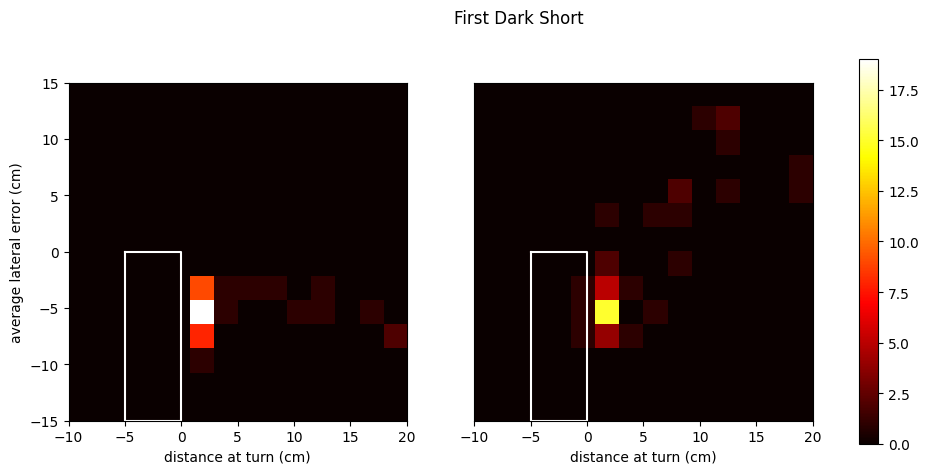

In [607]:
"""plot heat map of distance at turn torwards the opening comparing the first and seconed time seing the obstacle"""
data = pd.concat([short_con])
first_trial = data[(data.task == 'oadark')&(data.consective_type == 0)&(data.date_index == 0)  &(data.avg_lateral_error <= -3) &(data.distance_at_head_turn >= 0)]
ind = first_trial.index.to_numpy()+2
third_trial = long_short.loc[ind.tolist()]



fig,axs = plt.subplots( 1,2, figsize = (12,5),sharey = False)
fig.suptitle('First Dark Short')
axs[1].set_yticks([])
axs[0].set_ylabel('average lateral error (cm)')
axs[0].set_xlabel('distance at turn (cm)')
axs[1].set_xlabel('distance at turn (cm)')
ymin,ymax = -10,20
xmin,xmax = -15,15


first_head_turn,first_lateral_error = first_trial.distance_at_head_turn.to_numpy(),first_trial.avg_lateral_error.to_numpy()

first_array ,first_xedges ,first_yedges   = np.histogram2d(first_lateral_error.astype(float), first_head_turn.astype(float), range = [[xmin,xmax],[ymin,ymax ]],bins=(list(range(xmin,xmax,2)), list(range(ymin,ymax,2)),))

axs[0].imshow(first_array[::-1], vmax=np.nanmax(first_array), cmap='hot',extent=[ymin,ymax,xmin,xmax])
#fig.colorbar(axs[1].imshow(first_array[::-1], vmax=np.nanmax(first_array), cmap='hot',extent=[ymin,ymax,xmin,xmax]),ax = axs)






third_head_turn,third_lateral_error = third_trial.distance_at_head_turn.to_numpy(),third_trial.avg_lateral_error.to_numpy()

third_array ,third_xedges ,third_yedges   = np.histogram2d(third_lateral_error.astype(float), third_head_turn.astype(float), range = [[xmin,xmax],[ymin,ymax ]],bins=(list(range(xmin,xmax,2)), list(range(ymin,ymax,2)),))
axs[1].imshow(third_array[::-1], vmax=np.nanmax(first_array), cmap='hot',extent=[ymin,ymax,xmin,xmax])
fig.colorbar(axs[1].imshow(third_array[::-1], vmax=np.nanmax(first_array),cmap='hot',extent=[ymin,ymax,xmin,xmax]),ax = axs)

axs[1].plot( [-5,0,0,-5,-5], [0,0,-15,-15,0],c ='white')
axs[0].plot( [-5,0,0,-5,-5], [0,0,-15,-15,0],c ='white')

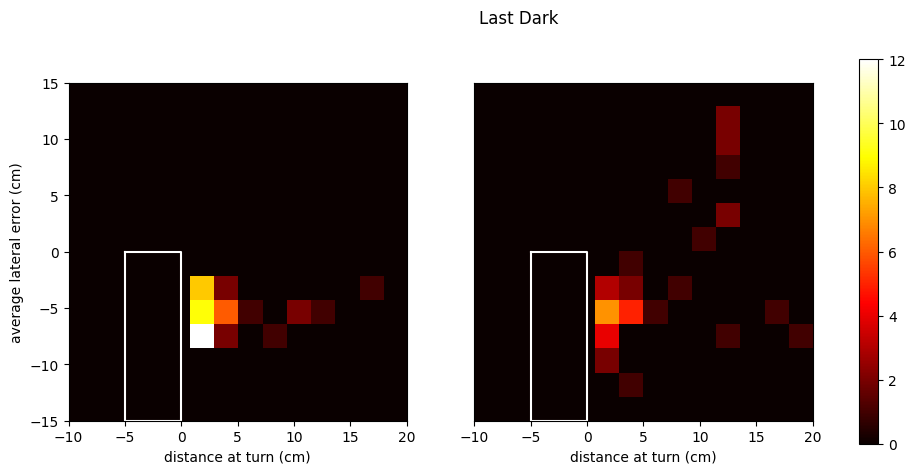

In [610]:
"""plot heat map of distance at turn torwards the opening comparing the first and seconed time seing the obstacle"""
data = pd.concat([long_con,short_con])
first_trial = data[(data.task == 'oadark')&(data.consective_type == 0)&(data.date_index == 5)  &(data.avg_lateral_error <= -3) &(data.distance_at_head_turn >= 0)]
ind = first_trial.index.to_numpy()+2
third_trial = long_short.loc[ind.tolist()]



fig,axs = plt.subplots( 1,2, figsize = (12,5),sharey = False)
fig.suptitle('Last Dark')
axs[1].set_yticks([])
axs[0].set_ylabel('average lateral error (cm)')
axs[0].set_xlabel('distance at turn (cm)')
axs[1].set_xlabel('distance at turn (cm)')
ymin,ymax = -10,20
xmin,xmax = -15,15


first_head_turn,first_lateral_error = first_trial.distance_at_head_turn.to_numpy(),first_trial.avg_lateral_error.to_numpy()

first_array ,first_xedges ,first_yedges   = np.histogram2d(first_lateral_error.astype(float), first_head_turn.astype(float), range = [[xmin,xmax],[ymin,ymax ]],bins=(list(range(xmin,xmax,2)), list(range(ymin,ymax,2)),))

axs[0].imshow(first_array[::-1], vmax=np.nanmax(first_array), cmap='hot',extent=[ymin,ymax,xmin,xmax])
#fig.colorbar(axs[1].imshow(first_array[::-1], vmax=np.nanmax(first_array), cmap='hot',extent=[ymin,ymax,xmin,xmax]),ax = axs)






third_head_turn,third_lateral_error = third_trial.distance_at_head_turn.to_numpy(),third_trial.avg_lateral_error.to_numpy()

third_array ,third_xedges ,third_yedges   = np.histogram2d(third_lateral_error.astype(float), third_head_turn.astype(float), range = [[xmin,xmax],[ymin,ymax ]],bins=(list(range(xmin,xmax,2)), list(range(ymin,ymax,2)),))
axs[1].imshow(third_array[::-1], vmax=np.nanmax(first_array), cmap='hot',extent=[ymin,ymax,xmin,xmax])
fig.colorbar(axs[1].imshow(third_array[::-1], vmax=np.nanmax(first_array),cmap='hot',extent=[ymin,ymax,xmin,xmax]),ax = axs)

axs[1].plot( [-5,0,0,-5,-5], [0,0,-15,-15,0],c ='white')
axs[0].plot( [-5,0,0,-5,-5], [0,0,-15,-15,0],c ='white')


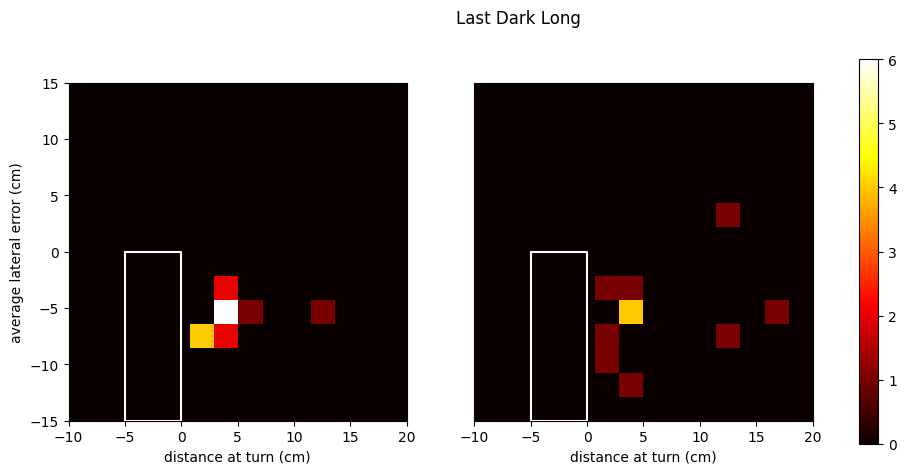

In [629]:
"""plot heat map of distance at turn torwards the opening comparing the first and seconed time seing the obstacle"""
data = pd.concat([long_con])
first_trial = data[(data.task == 'oadark')&(data.consective_type == 0)&(data.date_index == 5)  &(data.avg_lateral_error <= -3) &(data.distance_at_head_turn >= 0)]
ind = first_trial.index.to_numpy()+2
third_trial = long_short.loc[ind.tolist()]



fig,axs = plt.subplots( 1,2, figsize = (12,5),sharey = False)
fig.suptitle('Last Dark Long')
axs[1].set_yticks([])
axs[0].set_ylabel('average lateral error (cm)')
axs[0].set_xlabel('distance at turn (cm)')
axs[1].set_xlabel('distance at turn (cm)')
ymin,ymax = -10,20
xmin,xmax = -15,15


first_head_turn,first_lateral_error = first_trial.distance_at_head_turn.to_numpy(),first_trial.avg_lateral_error.to_numpy()

first_array ,first_xedges ,first_yedges   = np.histogram2d(first_lateral_error.astype(float), first_head_turn.astype(float), range = [[xmin,xmax],[ymin,ymax ]],bins=(list(range(xmin,xmax,2)), list(range(ymin,ymax,2)),))

axs[0].imshow(first_array[::-1], vmax=np.nanmax(first_array), cmap='hot',extent=[ymin,ymax,xmin,xmax])
#fig.colorbar(axs[1].imshow(first_array[::-1], vmax=np.nanmax(first_array), cmap='hot',extent=[ymin,ymax,xmin,xmax]),ax = axs)






third_head_turn,third_lateral_error = third_trial.distance_at_head_turn.to_numpy(),third_trial.avg_lateral_error.to_numpy()

third_array ,third_xedges ,third_yedges   = np.histogram2d(third_lateral_error.astype(float), third_head_turn.astype(float), range = [[xmin,xmax],[ymin,ymax ]],bins=(list(range(xmin,xmax,2)), list(range(ymin,ymax,2)),))
axs[1].imshow(third_array[::-1], vmax=np.nanmax(first_array), cmap='hot',extent=[ymin,ymax,xmin,xmax])
fig.colorbar(axs[1].imshow(third_array[::-1], vmax=np.nanmax(first_array),cmap='hot',extent=[ymin,ymax,xmin,xmax]),ax = axs)

axs[1].plot( [-5,0,0,-5,-5], [0,0,-15,-15,0],c ='white')
axs[0].plot( [-5,0,0,-5,-5], [0,0,-15,-15,0],c ='white')


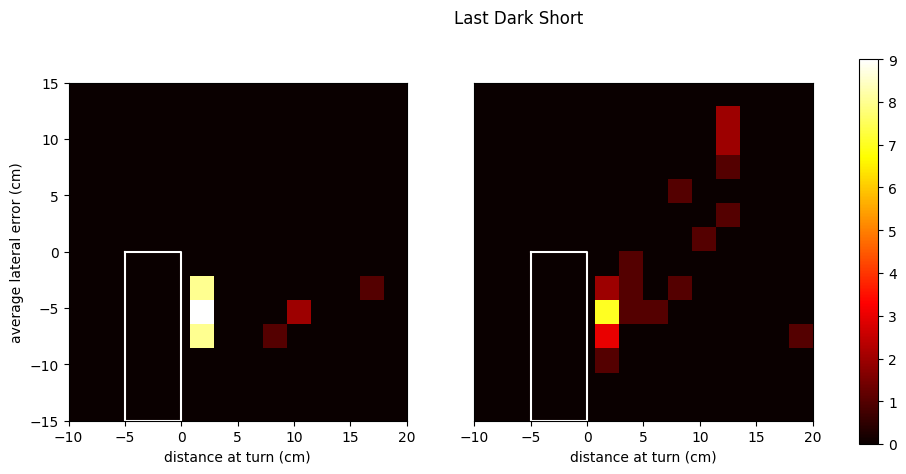

In [612]:
"""plot heat map of distance at turn torwards the opening comparing the first and seconed time seing the obstacle"""
data = pd.concat([short_con])
first_trial = data[(data.task == 'oadark')&(data.consective_type == 0)&(data.date_index == 5)  &(data.avg_lateral_error <= -3) &(data.distance_at_head_turn >= 0)]
ind = first_trial.index.to_numpy()+2
third_trial = long_short.loc[ind.tolist()]



fig,axs = plt.subplots( 1,2, figsize = (12,5),sharey = False)
fig.suptitle('Last Dark Short')
axs[1].set_yticks([])
axs[0].set_ylabel('average lateral error (cm)')
axs[0].set_xlabel('distance at turn (cm)')
axs[1].set_xlabel('distance at turn (cm)')
ymin,ymax = -10,20
xmin,xmax = -15,15


first_head_turn,first_lateral_error = first_trial.distance_at_head_turn.to_numpy(),first_trial.avg_lateral_error.to_numpy()

first_array ,first_xedges ,first_yedges   = np.histogram2d(first_lateral_error.astype(float), first_head_turn.astype(float), range = [[xmin,xmax],[ymin,ymax ]],bins=(list(range(xmin,xmax,2)), list(range(ymin,ymax,2)),))

axs[0].imshow(first_array[::-1], vmax=np.nanmax(first_array), cmap='hot',extent=[ymin,ymax,xmin,xmax])
#fig.colorbar(axs[1].imshow(first_array[::-1], vmax=np.nanmax(first_array), cmap='hot',extent=[ymin,ymax,xmin,xmax]),ax = axs)






third_head_turn,third_lateral_error = third_trial.distance_at_head_turn.to_numpy(),third_trial.avg_lateral_error.to_numpy()

third_array ,third_xedges ,third_yedges   = np.histogram2d(third_lateral_error.astype(float), third_head_turn.astype(float), range = [[xmin,xmax],[ymin,ymax ]],bins=(list(range(xmin,xmax,2)), list(range(ymin,ymax,2)),))
axs[1].imshow(third_array[::-1], vmax=np.nanmax(first_array), cmap='hot',extent=[ymin,ymax,xmin,xmax])
fig.colorbar(axs[1].imshow(third_array[::-1], vmax=np.nanmax(first_array),cmap='hot',extent=[ymin,ymax,xmin,xmax]),ax = axs)

axs[1].plot( [-5,0,0,-5,-5], [0,0,-15,-15,0],c ='white')
axs[0].plot( [-5,0,0,-5,-5], [0,0,-15,-15,0],c ='white')

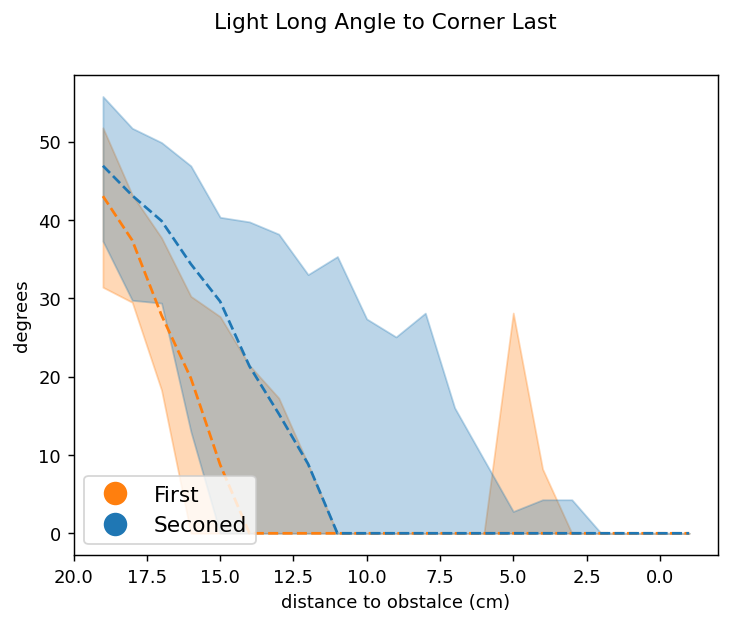

In [90]:
""" Angle to corner comparing fisr and third trials """
xnew =  np.arange(-2, 20, 1)
xnew= np.flip(xnew)
fig,ax = plt.subplots(dpi = 130)
fig.suptitle('Light Long Angle to Corner Last')
ax.invert_xaxis()
data = long_con
long_short = pd.concat([long_con,short_con])
data = drop_nans_in_columns(data,'obstacle_devations')
data = drop_nans_in_columns(data,'lateral_error')
data = drop_nans_in_columns(data,'speed')

first_trial = data[(data.task == 'oa')&(data.consective_type == 0)&(data.date_index == 6)  &(data.avg_lateral_error >= 0) &(data.distance_at_head_turn >= 0)]
ind = first_trial.index.to_numpy()+2
third_trial = long_short.loc[ind.tolist()]


first_rows = first_trial.shape[0]
first_angle_array = np.empty([first_rows,len(xnew)])
first_angle_array[:] =np.nan 
for i,row in enumerate(first_trial.iterrows()):
    x = row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float)
    y = row[1]['ts_zero_out_angle_to_corner'][:int(row[1]['obstacle_ind'])].astype(float)
    if sum(y) == 0:
        continue
    else:
        #x = resample(x,20)
        #y = resample(np.flip(np.unique(y)),len(x))
        #y = resample(y,len(x))
        interpolater = interp1d(x,y,bounds_error=False)
        #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['ts_zero_out_angle_to_corner'])
        ynew = interpolater(xnew)
        first_angle_array[i] = ynew
first_angle_mean = np.nanmean(first_angle_array,axis = 0)
first_angle_median= np.nanmedian(first_angle_array,axis = 0)
    
median, q1, q3, iqr = calculate_quartiles(first_angle_array)


ax.fill_between(xnew, q1, q3, color='tab:orange', alpha=0.3, label='IQR')
ax.plot(xnew,first_angle_median,'--',c = 'tab:orange',alpha = 1)

third_rows = third_trial.shape[0]
third_angle_array = np.empty([third_rows,len(xnew)])
third_angle_array[:] =np.nan 
for i,row in enumerate(third_trial.iterrows()):
    x = row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float)
    y = row[1]['ts_zero_out_angle_to_corner'][:int(row[1]['obstacle_ind'])].astype(float)
    if sum(y) == 0:
        continue
    else:
        #x = resample(x,20)
        #y = resample(np.flip(np.unique(y)),len(x))
        #y = resample(y,len(x))
        interpolater = interp1d(x,y,bounds_error=False)
        #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['ts_zero_out_angle_to_corner'])
        ynew = interpolater(xnew)
        third_angle_array[i] = ynew
third_angle_mean = np.nanmean(third_angle_array,axis = 0)
third_angle_median= np.nanmedian(third_angle_array,axis = 0)
    
median, q1, q3, iqr = calculate_quartiles(third_angle_array)


ax.fill_between(xnew, q1, q3, color='tab:blue', alpha=0.3, label='IQR')
#ax.plot(xnew,third_angle_mean,c = 'tab:orange',alpha = 1)
ax.plot(xnew,third_angle_median,'--',c = 'tab:blue',alpha = 1)





ax.set_ylabel('degrees')
ax.set_xlabel('distance to obstalce (cm)')
   
markers = [plt.Line2D([0,0],[0,0],color=color, marker='o', linestyle='',markersize=12) for color in ['tab:orange','tab:blue']]
ax.legend(markers, ['First','Seconed'], numpoints=1,loc = 'lower left',fontsize=12)

KeyError: '[5346, 8762, 8199, 8226, 2511, 5160, 5230, 4989, 2664, 5272, 8318, 8639, 8651] not in index'

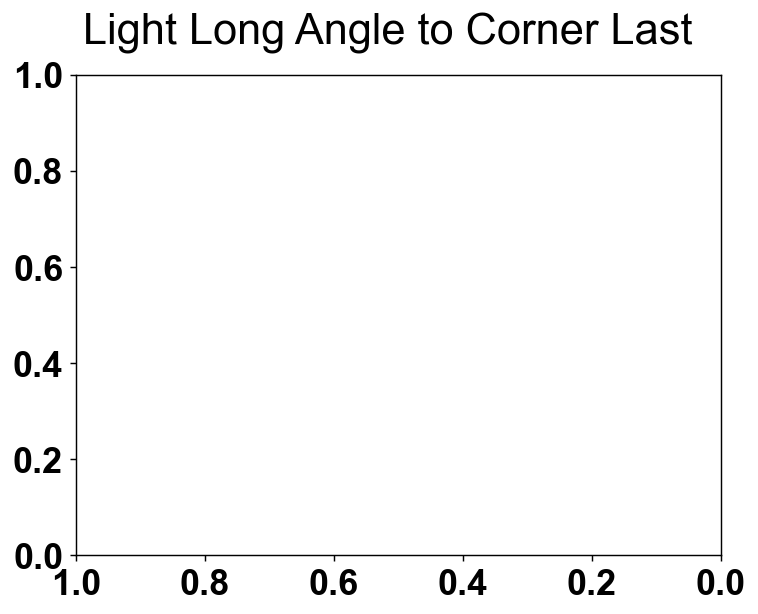

In [28]:
""" Angle to corner comparing fisr and third trials """
xnew =  np.arange(-2, 20, 1)
xnew= np.flip(xnew)
fig,ax = plt.subplots(dpi = 130)
fig.suptitle('Light Long Angle to Corner Last')
ax.invert_xaxis()
data = long_con_nostart
long_short = pd.concat([long_con_nostart,short_con])
data = drop_nans_in_columns(data,'obstacle_devations')
data = drop_nans_in_columns(data,'lateral_error')
data = drop_nans_in_columns(data,'speed')

first_trial = data[(data.task == 'oa')&(data.consective_type == 0)&(data.date_index == 6)  &(data.avg_lateral_error <= -3) &(data.distance_at_head_turn >= 0)]
ind = first_trial.index.to_numpy()+2
third_trial = long_short.loc[ind.tolist()]


first_rows = first_trial.shape[0]
first_angle_array = np.empty([first_rows,len(xnew)])
first_angle_array[:] =np.nan 
for i,row in enumerate(first_trial.iterrows()):
    x = row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float)
    y = row[1]['ts_zero_out_angle_to_corner'][:int(row[1]['obstacle_ind'])].astype(float)
    if sum(y) == 0:
        continue
    else:
        #x = resample(x,20)
        #y = resample(np.flip(np.unique(y)),len(x))
        #y = resample(y,len(x))
        interpolater = interp1d(x,y,bounds_error=False)
        #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['ts_zero_out_angle_to_corner'])
        ynew = interpolater(xnew)
        first_angle_array[i] = ynew
first_angle_mean = np.nanmean(first_angle_array,axis = 0)
first_angle_median= np.nanmedian(first_angle_array,axis = 0)
    
median, q1, q3, iqr = calculate_quartiles(first_angle_array)


ax.fill_between(xnew, q1, q3, color='tab:orange', alpha=0.3, label='IQR')
ax.plot(xnew,first_angle_median,'--',c = 'tab:orange',alpha = 1)

third_rows = third_trial.shape[0]
third_angle_array = np.empty([third_rows,len(xnew)])
third_angle_array[:] =np.nan 
for i,row in enumerate(third_trial.iterrows()):
    x = row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float)
    y = row[1]['ts_zero_out_angle_to_corner'][:int(row[1]['obstacle_ind'])].astype(float)
    if sum(y) == 0:
        continue
    else:
        #x = resample(x,20)
        #y = resample(np.flip(np.unique(y)),len(x))
        #y = resample(y,len(x))
        interpolater = interp1d(x,y,bounds_error=False)
        #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['ts_zero_out_angle_to_corner'])
        ynew = interpolater(xnew)
        third_angle_array[i] = ynew
third_angle_mean = np.nanmean(third_angle_array,axis = 0)
third_angle_median= np.nanmedian(third_angle_array,axis = 0)
    
median, q1, q3, iqr = calculate_quartiles(third_angle_array)


ax.fill_between(xnew, q1, q3, color='tab:blue', alpha=0.3, label='IQR')
#ax.plot(xnew,third_angle_mean,c = 'tab:orange',alpha = 1)
ax.plot(xnew,third_angle_median,'--',c = 'tab:blue',alpha = 1)





ax.set_ylabel('degrees')
ax.set_xlabel('distance to obstalce (cm)')
   
markers = [plt.Line2D([0,0],[0,0],color=color, marker='o', linestyle='',markersize=12) for color in ['tab:orange','tab:blue']]
ax.legend(markers, ['First','Seconed'], numpoints=1,loc = 'lower left',fontsize=12)

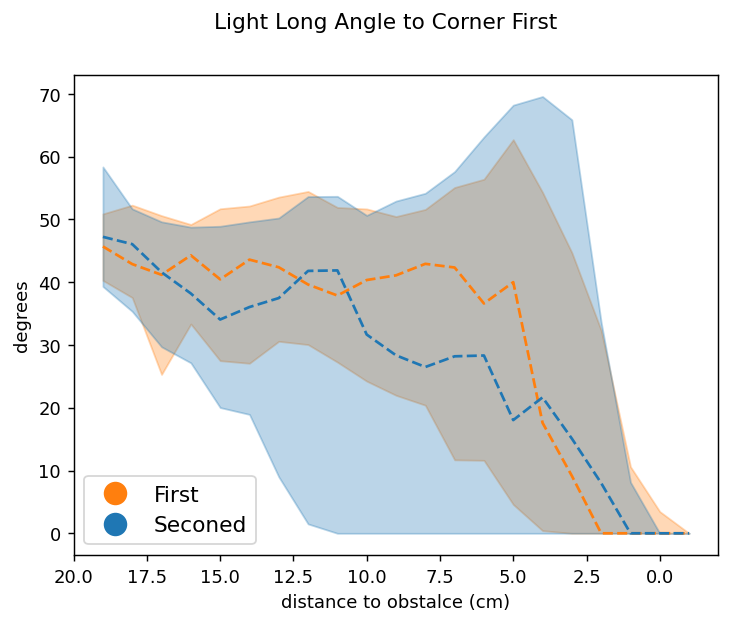

In [654]:
""" Angle to corner comparing fisr and third trials """
xnew =  np.arange(-2, 20, 1)
xnew= np.flip(xnew)
fig,ax = plt.subplots(dpi = 130)
fig.suptitle('Light Long Angle to Corner First')
ax.invert_xaxis()
data = long_con
long_short = pd.concat([long_con,short_con])
data = drop_nans_in_columns(data,'obstacle_devations')
data = drop_nans_in_columns(data,'lateral_error')
data = drop_nans_in_columns(data,'speed')

first_trial = data[(data.task == 'oa')&(data.consective_type == 0)&(data.date_index == 0)  &(data.avg_lateral_error <= -3) &(data.distance_at_head_turn >= 0)]
ind = first_trial.index.to_numpy()+2
third_trial = long_short.loc[ind.tolist()]


first_rows = first_trial.shape[0]
first_angle_array = np.empty([first_rows,len(xnew)])
first_angle_array[:] =np.nan 
for i,row in enumerate(first_trial.iterrows()):
    x = row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float)
    y = row[1]['ts_zero_out_angle_to_corner'][:int(row[1]['obstacle_ind'])].astype(float)
    if sum(y) == 0:
        continue
    else:
        #x = resample(x,20)
        #y = resample(np.flip(np.unique(y)),len(x))
        #y = resample(y,len(x))
        interpolater = interp1d(x,y,bounds_error=False)
        #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['ts_zero_out_angle_to_corner'])
        ynew = interpolater(xnew)
        first_angle_array[i] = ynew
first_angle_mean = np.nanmean(first_angle_array,axis = 0)
first_angle_median= np.nanmedian(first_angle_array,axis = 0)
    
median, q1, q3, iqr = calculate_quartiles(first_angle_array)


ax.fill_between(xnew, q1, q3, color='tab:orange', alpha=0.3, label='IQR')
ax.plot(xnew,first_angle_median,'--',c = 'tab:orange',alpha = 1)

third_rows = third_trial.shape[0]
third_angle_array = np.empty([third_rows,len(xnew)])
third_angle_array[:] =np.nan 
for i,row in enumerate(third_trial.iterrows()):
    x = row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float)
    y = row[1]['ts_zero_out_angle_to_corner'][:int(row[1]['obstacle_ind'])].astype(float)
    if sum(y) == 0:
        continue
    else:
        #x = resample(x,20)
        #y = resample(np.flip(np.unique(y)),len(x))
        #y = resample(y,len(x))
        interpolater = interp1d(x,y,bounds_error=False)
        #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['ts_zero_out_angle_to_corner'])
        ynew = interpolater(xnew)
        third_angle_array[i] = ynew
third_angle_mean = np.nanmean(third_angle_array,axis = 0)
third_angle_median= np.nanmedian(third_angle_array,axis = 0)
    
median, q1, q3, iqr = calculate_quartiles(third_angle_array)


ax.fill_between(xnew, q1, q3, color='tab:blue', alpha=0.3, label='IQR')
#ax.plot(xnew,third_angle_mean,c = 'tab:orange',alpha = 1)
ax.plot(xnew,third_angle_median,'--',c = 'tab:blue',alpha = 1)





ax.set_ylabel('degrees')
ax.set_xlabel('distance to obstalce (cm)')
   
markers = [plt.Line2D([0,0],[0,0],color=color, marker='o', linestyle='',markersize=12) for color in ['tab:orange','tab:blue']]
ax.legend(markers, ['First','Seconed'], numpoints=1,loc = 'lower left',fontsize=12)

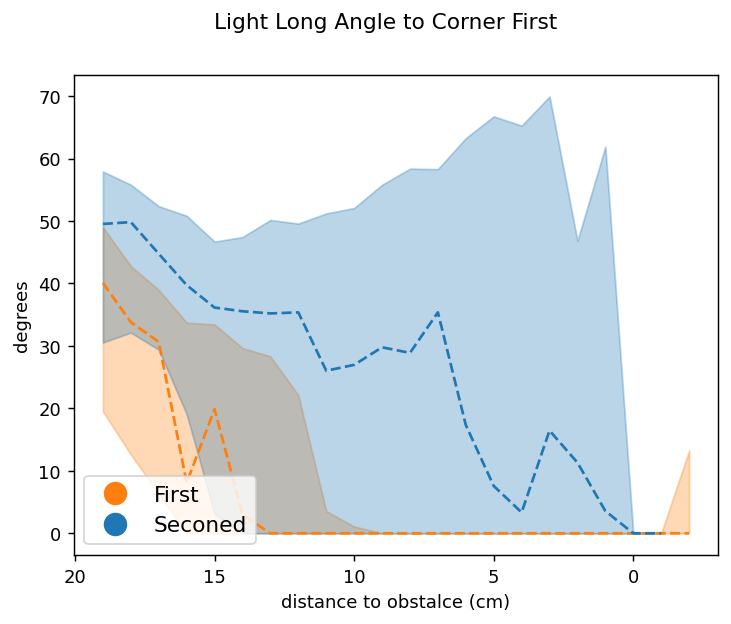

In [91]:
""" Angle to corner comparing fisr and third trials """
xnew =  np.arange(-2, 20, 1)
xnew= np.flip(xnew)
fig,ax = plt.subplots(dpi = 130)
fig.suptitle('Light Long Angle to Corner First')
ax.invert_xaxis()
data = long_con
long_short = pd.concat([long_con,short_con])
data = drop_nans_in_columns(data,'obstacle_devations')
data = drop_nans_in_columns(data,'lateral_error')
data = drop_nans_in_columns(data,'speed')

first_trial = data[(data.task == 'oa')&(data.consective_type == 0)&(data.date_index == 0)  &(data.avg_lateral_error >= 0) &(data.distance_at_head_turn >= 0)]
ind = first_trial.index.to_numpy()+2
third_trial = long_short.loc[ind.tolist()]


first_rows = first_trial.shape[0]
first_angle_array = np.empty([first_rows,len(xnew)])
first_angle_array[:] =np.nan 
for i,row in enumerate(first_trial.iterrows()):
    x = row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float)
    y = row[1]['ts_zero_out_angle_to_corner'][:int(row[1]['obstacle_ind'])].astype(float)
    if sum(y) == 0:
        continue
    else:
        #x = resample(x,20)
        #y = resample(np.flip(np.unique(y)),len(x))
        #y = resample(y,len(x))
        interpolater = interp1d(x,y,bounds_error=False)
        #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['ts_zero_out_angle_to_corner'])
        ynew = interpolater(xnew)
        first_angle_array[i] = ynew
first_angle_mean = np.nanmean(first_angle_array,axis = 0)
first_angle_median= np.nanmedian(first_angle_array,axis = 0)
    
median, q1, q3, iqr = calculate_quartiles(first_angle_array)


ax.fill_between(xnew, q1, q3, color='tab:orange', alpha=0.3, label='IQR')
ax.plot(xnew,first_angle_median,'--',c = 'tab:orange',alpha = 1)

third_rows = third_trial.shape[0]
third_angle_array = np.empty([third_rows,len(xnew)])
third_angle_array[:] =np.nan 
for i,row in enumerate(third_trial.iterrows()):
    x = row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float)
    y = row[1]['ts_zero_out_angle_to_corner'][:int(row[1]['obstacle_ind'])].astype(float)
    if sum(y) == 0:
        continue
    else:
        #x = resample(x,20)
        #y = resample(np.flip(np.unique(y)),len(x))
        #y = resample(y,len(x))
        interpolater = interp1d(x,y,bounds_error=False)
        #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['ts_zero_out_angle_to_corner'])
        ynew = interpolater(xnew)
        third_angle_array[i] = ynew
third_angle_mean = np.nanmean(third_angle_array,axis = 0)
third_angle_median= np.nanmedian(third_angle_array,axis = 0)
    
median, q1, q3, iqr = calculate_quartiles(third_angle_array)


ax.fill_between(xnew, q1, q3, color='tab:blue', alpha=0.3, label='IQR')
#ax.plot(xnew,third_angle_mean,c = 'tab:orange',alpha = 1)
ax.plot(xnew,third_angle_median,'--',c = 'tab:blue',alpha = 1)





ax.set_ylabel('degrees')
ax.set_xlabel('distance to obstalce (cm)')
   
markers = [plt.Line2D([0,0],[0,0],color=color, marker='o', linestyle='',markersize=12) for color in ['tab:orange','tab:blue']]
ax.legend(markers, ['First','Seconed'], numpoints=1,loc = 'lower left',fontsize=12)

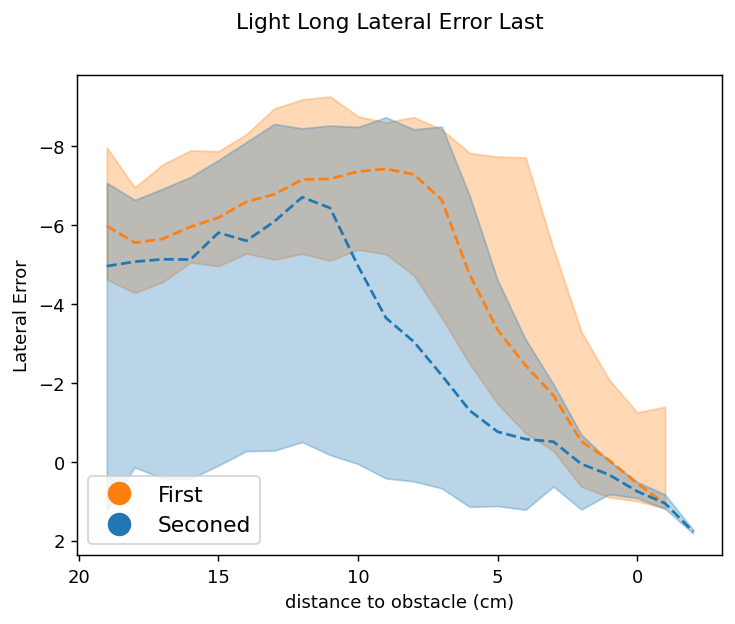

In [53]:
""" Angle to corner comparing fisr and third trials """
xnew =  np.arange(-2, 20, 1)
xnew= np.flip(xnew)
fig,ax = plt.subplots(dpi = 130)
fig.suptitle('Light Long Lateral Error Last')
ax.invert_xaxis()
ax.invert_yaxis()
data = long_con
long_short = pd.concat([long_con,short_con])
data = drop_nans_in_columns(data,'obstacle_devations')
data = drop_nans_in_columns(data,'lateral_error')
data = drop_nans_in_columns(data,'speed')

first_trial = data[(data.task == 'oa')&(data.consective_type == 0)&(data.date_index == 6)  &(data.avg_lateral_error <= -3) &(data.distance_at_head_turn >= 0)]
ind = first_trial.index.to_numpy()+2
third_trial = long_short.loc[ind.tolist()]


first_rows = first_trial.shape[0]
first_angle_array = np.empty([first_rows,len(xnew)])
first_angle_array[:] =np.nan 
for i,row in enumerate(first_trial.iterrows()):
    x = row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float)
    y = row[1]['lateral_error'][:int(row[1]['obstacle_ind'])].astype(float)
    if sum(y) == 0:
        continue
    else:
        #x = resample(x,20)
        #y = resample(np.flip(np.unique(y)),len(x))
        #y = resample(y,len(x))
        interpolater = interp1d(x,y,bounds_error=False)
        #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['lateral_error'])
        ynew = interpolater(xnew)
        first_angle_array[i] = ynew
first_angle_mean = np.nanmean(first_angle_array,axis = 0)
first_angle_median= np.nanmedian(first_angle_array,axis = 0)
    
median, q1, q3, iqr = calculate_quartiles(first_angle_array)


ax.fill_between(xnew, q1, q3, color='tab:orange', alpha=0.3, label='IQR')
ax.plot(xnew,first_angle_median,'--',c = 'tab:orange',alpha = 1)

third_rows = third_trial.shape[0]
third_angle_array = np.empty([third_rows,len(xnew)])
third_angle_array[:] =np.nan 
for i,row in enumerate(third_trial.iterrows()):
    x = row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float)
    y = row[1]['lateral_error'][:int(row[1]['obstacle_ind'])].astype(float)
    if sum(y) == 0:
        continue
    else:
        #x = resample(x,20)
        #y = resample(np.flip(np.unique(y)),len(x))
        #y = resample(y,len(x))
        interpolater = interp1d(x,y,bounds_error=False)
        #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['lateral_error'])
        ynew = interpolater(xnew)
        third_angle_array[i] = ynew
third_angle_mean = np.nanmean(third_angle_array,axis = 0)
third_angle_median= np.nanmedian(third_angle_array,axis = 0)
    
median, q1, q3, iqr = calculate_quartiles(third_angle_array)


ax.fill_between(xnew, q1, q3, color='tab:blue', alpha=0.3, label='IQR')
#ax.plot(xnew,third_angle_mean,c = 'tab:orange',alpha = 1)
ax.plot(xnew,third_angle_median,'--',c = 'tab:blue',alpha = 1)





ax.set_ylabel('Lateral Error')
ax.set_xlabel('distance to obstacle (cm)')
   
markers = [plt.Line2D([0,0],[0,0],color=color, marker='o', linestyle='',markersize=12) for color in ['tab:orange','tab:blue']]
ax.legend(markers, ['First','Seconed'], numpoints=1,loc = 'lower left',fontsize=12)

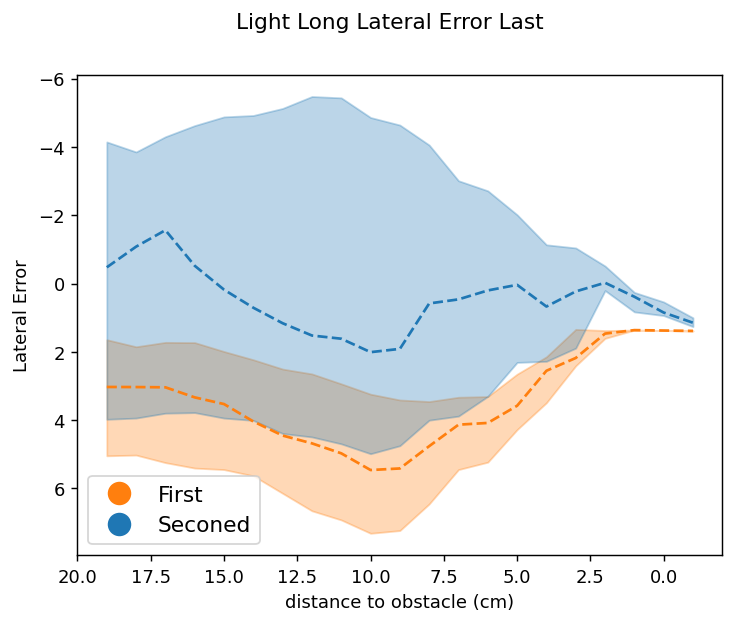

In [92]:
""" Angle to corner comparing fisr and third trials """
xnew =  np.arange(-2, 20, 1)
xnew= np.flip(xnew)
fig,ax = plt.subplots(dpi = 130)
fig.suptitle('Light Long Lateral Error Last')
ax.invert_xaxis()
ax.invert_yaxis()
data = long_con
long_short = pd.concat([long_con,short_con])
data = drop_nans_in_columns(data,'obstacle_devations')
data = drop_nans_in_columns(data,'lateral_error')
data = drop_nans_in_columns(data,'speed')

first_trial = data[(data.task == 'oa')&(data.consective_type == 0)&(data.date_index == 6)  &(data.avg_lateral_error >= 0) &(data.distance_at_head_turn >= 0)]
ind = first_trial.index.to_numpy()+2
third_trial = long_short.loc[ind.tolist()]


first_rows = first_trial.shape[0]
first_angle_array = np.empty([first_rows,len(xnew)])
first_angle_array[:] =np.nan 
for i,row in enumerate(first_trial.iterrows()):
    x = row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float)
    y = row[1]['lateral_error'][:int(row[1]['obstacle_ind'])].astype(float)
    if sum(y) == 0:
        continue
    else:
        #x = resample(x,20)
        #y = resample(np.flip(np.unique(y)),len(x))
        #y = resample(y,len(x))
        interpolater = interp1d(x,y,bounds_error=False)
        #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['lateral_error'])
        ynew = interpolater(xnew)
        first_angle_array[i] = ynew
first_angle_mean = np.nanmean(first_angle_array,axis = 0)
first_angle_median= np.nanmedian(first_angle_array,axis = 0)
    
median, q1, q3, iqr = calculate_quartiles(first_angle_array)


ax.fill_between(xnew, q1, q3, color='tab:orange', alpha=0.3, label='IQR')
ax.plot(xnew,first_angle_median,'--',c = 'tab:orange',alpha = 1)

third_rows = third_trial.shape[0]
third_angle_array = np.empty([third_rows,len(xnew)])
third_angle_array[:] =np.nan 
for i,row in enumerate(third_trial.iterrows()):
    x = row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float)
    y = row[1]['lateral_error'][:int(row[1]['obstacle_ind'])].astype(float)
    if sum(y) == 0:
        continue
    else:
        #x = resample(x,20)
        #y = resample(np.flip(np.unique(y)),len(x))
        #y = resample(y,len(x))
        interpolater = interp1d(x,y,bounds_error=False)
        #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['lateral_error'])
        ynew = interpolater(xnew)
        third_angle_array[i] = ynew
third_angle_mean = np.nanmean(third_angle_array,axis = 0)
third_angle_median= np.nanmedian(third_angle_array,axis = 0)
    
median, q1, q3, iqr = calculate_quartiles(third_angle_array)


ax.fill_between(xnew, q1, q3, color='tab:blue', alpha=0.3, label='IQR')
#ax.plot(xnew,third_angle_mean,c = 'tab:orange',alpha = 1)
ax.plot(xnew,third_angle_median,'--',c = 'tab:blue',alpha = 1)





ax.set_ylabel('Lateral Error')
ax.set_xlabel('distance to obstacle (cm)')
   
markers = [plt.Line2D([0,0],[0,0],color=color, marker='o', linestyle='',markersize=12) for color in ['tab:orange','tab:blue']]
ax.legend(markers, ['First','Seconed'], numpoints=1,loc = 'lower left',fontsize=12)

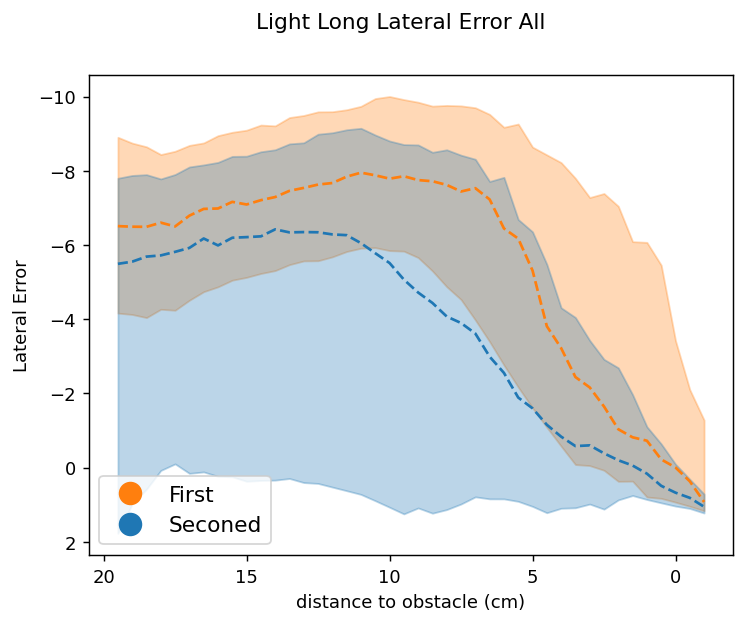

In [290]:
""" Angle to corner comparing fisr and third trials """
xnew =  np.arange(-1, 20, .5)
xnew= np.flip(xnew)
fig,ax = plt.subplots(dpi = 130)
fig.suptitle('Light Long Lateral Error All')
ax.invert_xaxis()
ax.invert_yaxis()
data = long_con
long_short = pd.concat([long_con,short_con])
data = drop_nans_in_columns(data,'obstacle_devations')
data = drop_nans_in_columns(data,'lateral_error')
data = drop_nans_in_columns(data,'speed')

first_trial = data[(data.task == 'oa')&(data.consective_type == 0)&(data.avg_lateral_error <= -3) &(data.distance_at_head_turn >= 0)]
ind = first_trial.index.to_numpy()+2
third_trial = long_short.loc[ind.tolist()]


first_rows = first_trial.shape[0]
first_angle_array = np.empty([first_rows,len(xnew)])
first_angle_array[:] =np.nan 
for i,row in enumerate(first_trial.iterrows()):
    x = row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float)
    y = row[1]['lateral_error'][:int(row[1]['obstacle_ind'])].astype(float)
    if sum(y) == 0:
        continue
    else:
        #x = resample(x,20)
        #y = resample(np.flip(np.unique(y)),len(x))
        #y = resample(y,len(x))
        interpolater = interp1d(x,y,bounds_error=False)
        #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['lateral_error'])
        ynew = interpolater(xnew)
        first_angle_array[i] = ynew
first_angle_mean = np.nanmean(first_angle_array,axis = 0)
first_angle_median= np.nanmedian(first_angle_array,axis = 0)
    
median, t1q1, t1q3, iqr = calculate_quartiles(first_angle_array)


ax.fill_between(xnew, edge_outliers(t1q1,1), t1q3, color='tab:orange', alpha=0.3, label='IQR')
ax.plot(xnew,edge_outliers(first_angle_median,1),'--',c = 'tab:orange',alpha = 1)

third_rows = third_trial.shape[0]
third_angle_array = np.empty([third_rows,len(xnew)])
third_angle_array[:] =np.nan 
for i,row in enumerate(third_trial.iterrows()):
    x = row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float)
    y = row[1]['lateral_error'][:int(row[1]['obstacle_ind'])].astype(float)
    if sum(y) == 0:
        continue
    else:
        #x = resample(x,20)
        #y = resample(np.flip(np.unique(y)),len(x))
        #y = resample(y,len(x))
        interpolater = interp1d(x,y,bounds_error=False)
        #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['lateral_error'])
        ynew = interpolater(xnew)
        third_angle_array[i] = ynew
third_angle_mean = np.nanmean(third_angle_array,axis = 0)
third_angle_median= np.nanmedian(third_angle_array,axis = 0)
    
median, q1, q3, iqr = calculate_quartiles(third_angle_array)


ax.fill_between(xnew, q1, q3, color='tab:blue', alpha=0.3, label='IQR')
#ax.plot(xnew,third_angle_mean,c = 'tab:orange',alpha = 1)
ax.plot(xnew,third_angle_median,'--',c = 'tab:blue',alpha = 1)





ax.set_ylabel('Lateral Error')
ax.set_xlabel('distance to obstacle (cm)')
   
markers = [plt.Line2D([0,0],[0,0],color=color, marker='o', linestyle='',markersize=12) for color in ['tab:orange','tab:blue']]
ax.legend(markers, ['First','Seconed'], numpoints=1,loc = 'lower left',fontsize=12)

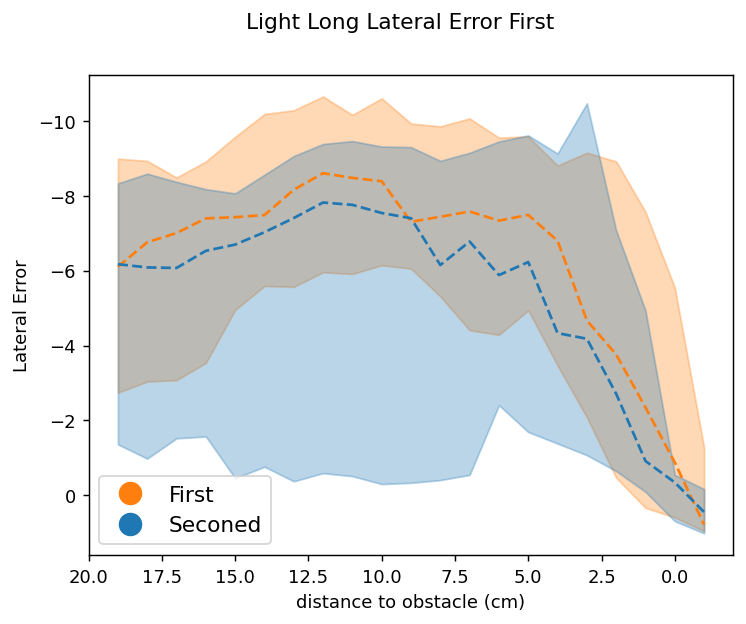

In [58]:
""" Angle to corner comparing fisr and third trials """
xnew =  np.arange(-2, 20, 1)
xnew= np.flip(xnew)
fig,ax = plt.subplots(dpi = 130)
fig.suptitle('Light Long Lateral Error First')
ax.invert_xaxis()
ax.invert_yaxis()
data = long_con
long_short = pd.concat([long_con,short_con])
data = drop_nans_in_columns(data,'obstacle_devations')
data = drop_nans_in_columns(data,'lateral_error')
data = drop_nans_in_columns(data,'speed')

first_trial = data[(data.task == 'oa')&(data.consective_type == 0)&(data.date_index == 0)  &(data.avg_lateral_error <= -3) &(data.distance_at_head_turn >= 0)]
ind = first_trial.index.to_numpy()+2
third_trial = long_short.loc[ind.tolist()]


first_rows = first_trial.shape[0]
first_angle_array = np.empty([first_rows,len(xnew)])
first_angle_array[:] =np.nan 
for i,row in enumerate(first_trial.iterrows()):
    x = row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float)
    y = row[1]['lateral_error'][:int(row[1]['obstacle_ind'])].astype(float)
    if sum(y) == 0:
        continue
    else:
        #x = resample(x,20)
        #y = resample(np.flip(np.unique(y)),len(x))
        #y = resample(y,len(x))
        interpolater = interp1d(x,y,bounds_error=False)
        #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['lateral_error'])
        ynew = interpolater(xnew)
        first_angle_array[i] = ynew
first_angle_mean = np.nanmean(first_angle_array,axis = 0)
first_angle_median= np.nanmedian(first_angle_array,axis = 0)
    
median, q1, q3, iqr = calculate_quartiles(first_angle_array)


ax.fill_between(xnew, q1, q3, color='tab:orange', alpha=0.3, label='IQR')
ax.plot(xnew,first_angle_median,'--',c = 'tab:orange',alpha = 1)

third_rows = third_trial.shape[0]
third_angle_array = np.empty([third_rows,len(xnew)])
third_angle_array[:] =np.nan 
for i,row in enumerate(third_trial.iterrows()):
    x = row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float)
    y = row[1]['lateral_error'][:int(row[1]['obstacle_ind'])].astype(float)
    if sum(y) == 0:
        continue
    else:
        #x = resample(x,20)
        #y = resample(np.flip(np.unique(y)),len(x))
        #y = resample(y,len(x))
        interpolater = interp1d(x,y,bounds_error=False)
        #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['lateral_error'])
        ynew = interpolater(xnew)
        third_angle_array[i] = ynew
third_angle_mean = np.nanmean(third_angle_array,axis = 0)
third_angle_median= np.nanmedian(third_angle_array,axis = 0)
    
median, q1, q3, iqr = calculate_quartiles(third_angle_array)


ax.fill_between(xnew, q1, q3, color='tab:blue', alpha=0.3, label='IQR')
#ax.plot(xnew,third_angle_mean,c = 'tab:orange',alpha = 1)
ax.plot(xnew,third_angle_median,'--',c = 'tab:blue',alpha = 1)





ax.set_ylabel('Lateral Error')
ax.set_xlabel('distance to obstacle (cm)')
   
markers = [plt.Line2D([0,0],[0,0],color=color, marker='o', linestyle='',markersize=12) for color in ['tab:orange','tab:blue']]
ax.legend(markers, ['First','Seconed'], numpoints=1,loc = 'lower left',fontsize=12)

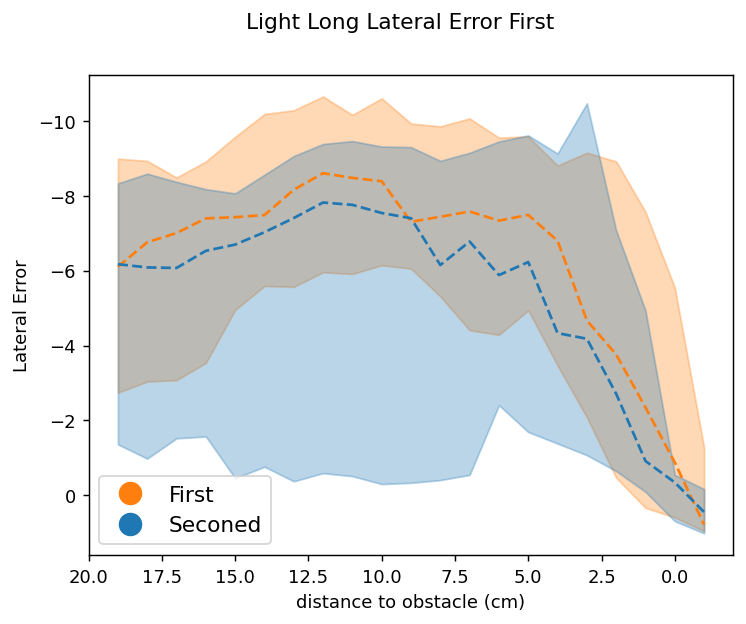

In [297]:
""" Angle to corner comparing fisr and third trials """
xnew =  np.arange(-2, 20, 1)
xnew= np.flip(xnew)
fig,ax = plt.subplots(dpi = 130)
fig.suptitle('Light Long Lateral Error First')
ax.invert_xaxis()
ax.invert_yaxis()
data = long_con
long_short = pd.concat([long_con,short_con])
data = drop_nans_in_columns(data,'obstacle_devations')
data = drop_nans_in_columns(data,'lateral_error')
data = drop_nans_in_columns(data,'speed')

first_trial = data[(data.task == 'oa')&(data.consective_type == 0)&(data.date_index == 0)  &(data.avg_lateral_error <= -3) &(data.distance_at_head_turn >= 0)]
ind = first_trial.index.to_numpy()+2
third_trial = long_short.loc[ind.tolist()]


first_rows = first_trial.shape[0]
first_angle_array = np.empty([first_rows,len(xnew)])
first_angle_array[:] =np.nan 
for i,row in enumerate(first_trial.iterrows()):
    x = row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float)
    y = row[1]['lateral_error'][:int(row[1]['obstacle_ind'])].astype(float)
    if sum(y) == 0:
        continue
    else:
        #x = resample(x,20)
        #y = resample(np.flip(np.unique(y)),len(x))
        #y = resample(y,len(x))
        interpolater = interp1d(x,y,bounds_error=False)
        #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['lateral_error'])
        ynew = interpolater(xnew)
        first_angle_array[i] = ynew
first_angle_mean = np.nanmean(first_angle_array,axis = 0)
first_angle_median= np.nanmedian(first_angle_array,axis = 0)
    
median, q1, q3, iqr = calculate_quartiles(first_angle_array)


ax.fill_between(xnew, q1, q3, color='tab:orange', alpha=0.3, label='IQR')
ax.plot(xnew,first_angle_median,'--',c = 'tab:orange',alpha = 1)

third_rows = third_trial.shape[0]
third_angle_array = np.empty([third_rows,len(xnew)])
third_angle_array[:] =np.nan 
for i,row in enumerate(third_trial.iterrows()):
    x = row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float)
    y = row[1]['lateral_error'][:int(row[1]['obstacle_ind'])].astype(float)
    if sum(y) == 0:
        continue
    else:
        #x = resample(x,20)
        #y = resample(np.flip(np.unique(y)),len(x))
        #y = resample(y,len(x))
        interpolater = interp1d(x,y,bounds_error=False)
        #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['lateral_error'])
        ynew = interpolater(xnew)
        third_angle_array[i] = ynew
third_angle_mean = np.nanmean(third_angle_array,axis = 0)
third_angle_median= np.nanmedian(third_angle_array,axis = 0)
    
median, q1, q3, iqr = calculate_quartiles(third_angle_array)


ax.fill_between(xnew, q1, q3, color='tab:blue', alpha=0.3, label='IQR')
#ax.plot(xnew,third_angle_mean,c = 'tab:orange',alpha = 1)
ax.plot(xnew,third_angle_median,'--',c = 'tab:blue',alpha = 1)





ax.set_ylabel('Lateral Error')
ax.set_xlabel('distance to obstacle (cm)')
   
markers = [plt.Line2D([0,0],[0,0],color=color, marker='o', linestyle='',markersize=12) for color in ['tab:orange','tab:blue']]
ax.legend(markers, ['First','Seconed'], numpoints=1,loc = 'lower left',fontsize=12)

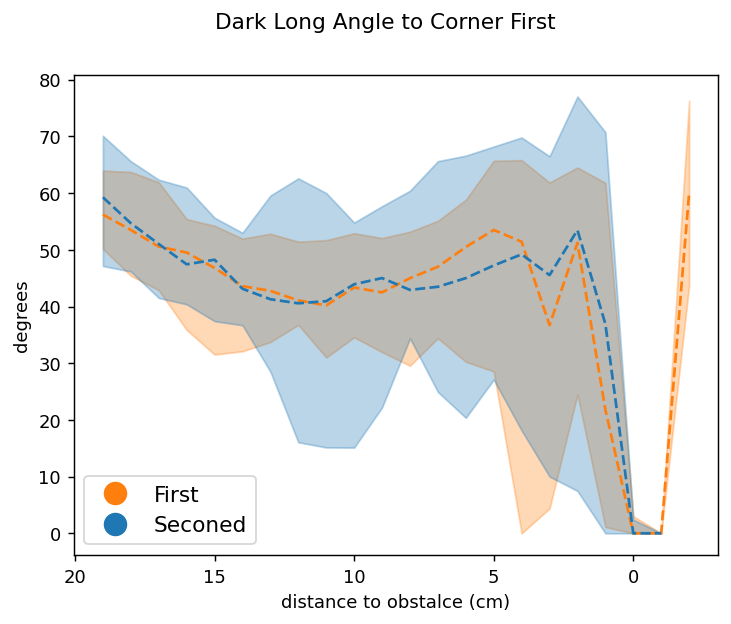

In [659]:
""" Angle to corner comparing fisr and third trials """
xnew =  np.arange(-2, 20, 1)
xnew= np.flip(xnew)
fig,ax = plt.subplots(dpi = 130)
fig.suptitle('Dark Long Angle to Corner First')
ax.invert_xaxis()
data = long_con
long_short = pd.concat([long_con,short_con])
data = drop_nans_in_columns(data,'obstacle_devations')
data = drop_nans_in_columns(data,'lateral_error')
data = drop_nans_in_columns(data,'speed')

first_trial = data[(data.task == 'oadark')&(data.consective_type == 0)&(data.date_index == 0)  &(data.avg_lateral_error <= -3) &(data.distance_at_head_turn >= 0)]
ind = first_trial.index.to_numpy()+2
third_trial = long_short.loc[ind.tolist()]


first_rows = first_trial.shape[0]
first_angle_array = np.empty([first_rows,len(xnew)])
first_angle_array[:] =np.nan 
for i,row in enumerate(first_trial.iterrows()):
    x = row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float)
    y = row[1]['ts_zero_out_angle_to_corner'][:int(row[1]['obstacle_ind'])].astype(float)
    if sum(y) == 0:
        continue
    else:
        #x = resample(x,20)
        #y = resample(np.flip(np.unique(y)),len(x))
        #y = resample(y,len(x))
        interpolater = interp1d(x,y,bounds_error=False)
        #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['ts_zero_out_angle_to_corner'])
        ynew = interpolater(xnew)
        first_angle_array[i] = ynew
first_angle_mean = np.nanmean(first_angle_array,axis = 0)
first_angle_median= np.nanmedian(first_angle_array,axis = 0)
    
median, q1, q3, iqr = calculate_quartiles(first_angle_array)


ax.fill_between(xnew, q1, q3, color='tab:orange', alpha=0.3, label='IQR')
ax.plot(xnew,first_angle_median,'--',c = 'tab:orange',alpha = 1)

third_rows = third_trial.shape[0]
third_angle_array = np.empty([third_rows,len(xnew)])
third_angle_array[:] =np.nan 
for i,row in enumerate(third_trial.iterrows()):
    x = row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float)
    y = row[1]['ts_zero_out_angle_to_corner'][:int(row[1]['obstacle_ind'])].astype(float)
    if sum(y) == 0:
        continue
    else:
        #x = resample(x,20)
        #y = resample(np.flip(np.unique(y)),len(x))
        #y = resample(y,len(x))
        interpolater = interp1d(x,y,bounds_error=False)
        #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['ts_zero_out_angle_to_corner'])
        ynew = interpolater(xnew)
        third_angle_array[i] = ynew
third_angle_mean = np.nanmean(third_angle_array,axis = 0)
third_angle_median= np.nanmedian(third_angle_array,axis = 0)
    
median, q1, q3, iqr = calculate_quartiles(third_angle_array)


ax.fill_between(xnew, q1, q3, color='tab:blue', alpha=0.3, label='IQR')
#ax.plot(xnew,third_angle_mean,c = 'tab:orange',alpha = 1)
ax.plot(xnew,third_angle_median,'--',c = 'tab:blue',alpha = 1)





ax.set_ylabel('degrees')
ax.set_xlabel('distance to obstalce (cm)')
   
markers = [plt.Line2D([0,0],[0,0],color=color, marker='o', linestyle='',markersize=12) for color in ['tab:orange','tab:blue']]
ax.legend(markers, ['First','Seconed'], numpoints=1,loc = 'lower left',fontsize=12)

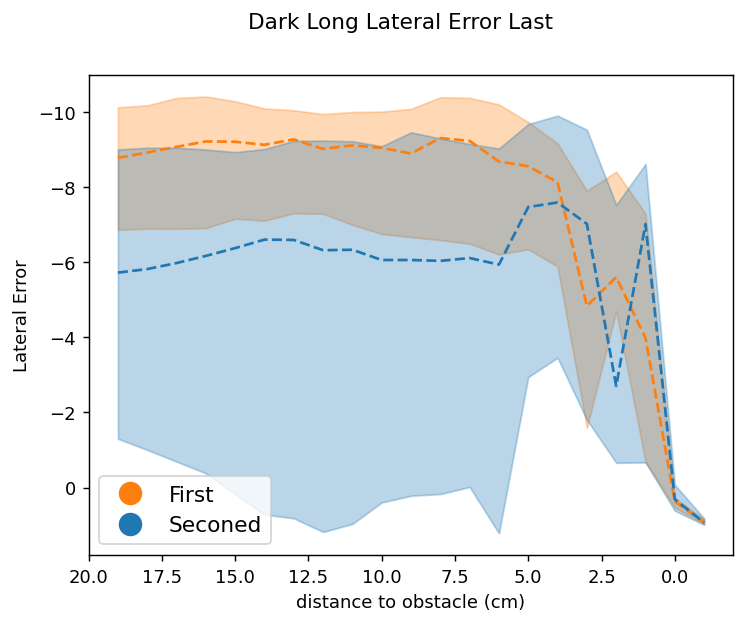

In [63]:
""" Angle to corner comparing fisr and third trials """
xnew =  np.arange(-2, 20, 1)
xnew= np.flip(xnew)
fig,ax = plt.subplots(dpi = 130)
fig.suptitle('Dark Long Lateral Error Last')
ax.invert_xaxis()
ax.invert_yaxis()
data = long_con
long_short = pd.concat([long_con,short_con])
data = drop_nans_in_columns(data,'obstacle_devations')
data = drop_nans_in_columns(data,'lateral_error')
data = drop_nans_in_columns(data,'speed')

first_trial = data[(data.task == 'oadark')&(data.consective_type == 0)&(data.date_index == 5)  &(data.avg_lateral_error <= -3) &(data.distance_at_head_turn >= 0)]
ind = first_trial.index.to_numpy()+2
third_trial = long_short.loc[ind.tolist()]


first_rows = first_trial.shape[0]
first_angle_array = np.empty([first_rows,len(xnew)])
first_angle_array[:] =np.nan 
for i,row in enumerate(first_trial.iterrows()):
    x = row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float)
    y = row[1]['lateral_error'][:int(row[1]['obstacle_ind'])].astype(float)
    if sum(y) == 0:
        continue
    else:
        #x = resample(x,20)
        #y = resample(np.flip(np.unique(y)),len(x))
        #y = resample(y,len(x))
        interpolater = interp1d(x,y,bounds_error=False)
        #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['lateral_error'])
        ynew = interpolater(xnew)
        first_angle_array[i] = ynew
first_angle_mean = np.nanmean(first_angle_array,axis = 0)
first_angle_median= np.nanmedian(first_angle_array,axis = 0)
    
median, q1, q3, iqr = calculate_quartiles(first_angle_array)


ax.fill_between(xnew, q1, q3, color='tab:orange', alpha=0.3, label='IQR')
ax.plot(xnew,first_angle_median,'--',c = 'tab:orange',alpha = 1)

third_rows = third_trial.shape[0]
third_angle_array = np.empty([third_rows,len(xnew)])
third_angle_array[:] =np.nan 
for i,row in enumerate(third_trial.iterrows()):
    x = row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float)
    y = row[1]['lateral_error'][:int(row[1]['obstacle_ind'])].astype(float)
    if sum(y) == 0:
        continue
    else:
        #x = resample(x,20)
        #y = resample(np.flip(np.unique(y)),len(x))
        #y = resample(y,len(x))
        interpolater = interp1d(x,y,bounds_error=False)
        #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['lateral_error'])
        ynew = interpolater(xnew)
        third_angle_array[i] = ynew
third_angle_mean = np.nanmean(third_angle_array,axis = 0)
third_angle_median= np.nanmedian(third_angle_array,axis = 0)
    
median, q1, q3, iqr = calculate_quartiles(third_angle_array)


ax.fill_between(xnew, q1, q3, color='tab:blue', alpha=0.3, label='IQR')
#ax.plot(xnew,third_angle_mean,c = 'tab:orange',alpha = 1)
ax.plot(xnew,third_angle_median,'--',c = 'tab:blue',alpha = 1)





ax.set_ylabel('Lateral Error')
ax.set_xlabel('distance to obstacle (cm)')
   
markers = [plt.Line2D([0,0],[0,0],color=color, marker='o', linestyle='',markersize=12) for color in ['tab:orange','tab:blue']]
ax.legend(markers, ['First','Seconed'], numpoints=1,loc = 'lower left',fontsize=12)

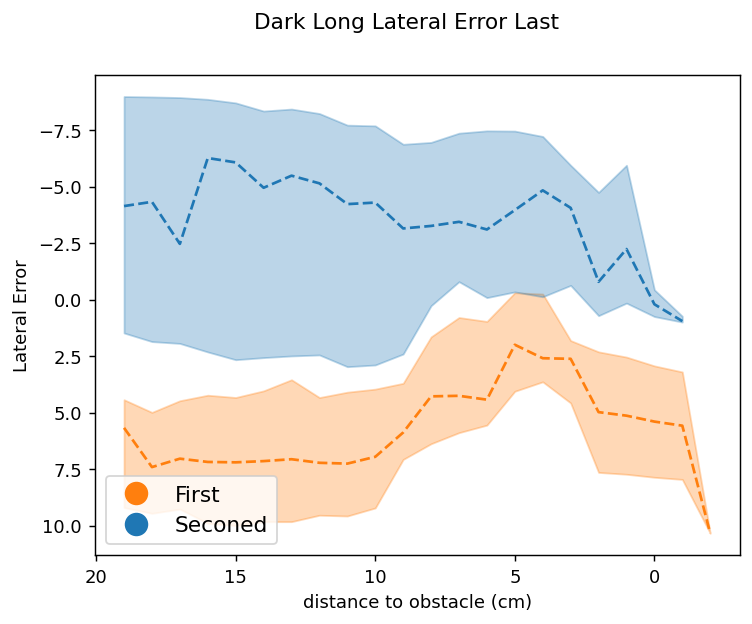

In [94]:
""" Angle to corner comparing fisr and third trials """
xnew =  np.arange(-2, 20, 1)
xnew= np.flip(xnew)
fig,ax = plt.subplots(dpi = 130)
fig.suptitle('Dark Long Lateral Error Last')
ax.invert_xaxis()
ax.invert_yaxis()
data = long_con
long_short = pd.concat([long_con,short_con])
data = drop_nans_in_columns(data,'obstacle_devations')
data = drop_nans_in_columns(data,'lateral_error')
data = drop_nans_in_columns(data,'speed')

first_trial = data[(data.task == 'oadark')&(data.consective_type == 0)&(data.date_index == 5)  &(data.avg_lateral_error >= 0) &(data.distance_at_head_turn >= 0)]
ind = first_trial.index.to_numpy()+2
third_trial = long_short.loc[ind.tolist()]


first_rows = first_trial.shape[0]
first_angle_array = np.empty([first_rows,len(xnew)])
first_angle_array[:] =np.nan 
for i,row in enumerate(first_trial.iterrows()):
    x = row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float)
    y = row[1]['lateral_error'][:int(row[1]['obstacle_ind'])].astype(float)
    if sum(y) == 0:
        continue
    else:
        #x = resample(x,20)
        #y = resample(np.flip(np.unique(y)),len(x))
        #y = resample(y,len(x))
        interpolater = interp1d(x,y,bounds_error=False)
        #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['lateral_error'])
        ynew = interpolater(xnew)
        first_angle_array[i] = ynew
first_angle_mean = np.nanmean(first_angle_array,axis = 0)
first_angle_median= np.nanmedian(first_angle_array,axis = 0)
    
median, q1, q3, iqr = calculate_quartiles(first_angle_array)


ax.fill_between(xnew, q1, q3, color='tab:orange', alpha=0.3, label='IQR')
ax.plot(xnew,first_angle_median,'--',c = 'tab:orange',alpha = 1)

third_rows = third_trial.shape[0]
third_angle_array = np.empty([third_rows,len(xnew)])
third_angle_array[:] =np.nan 
for i,row in enumerate(third_trial.iterrows()):
    x = row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float)
    y = row[1]['lateral_error'][:int(row[1]['obstacle_ind'])].astype(float)
    if sum(y) == 0:
        continue
    else:
        #x = resample(x,20)
        #y = resample(np.flip(np.unique(y)),len(x))
        #y = resample(y,len(x))
        interpolater = interp1d(x,y,bounds_error=False)
        #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['lateral_error'])
        ynew = interpolater(xnew)
        third_angle_array[i] = ynew
third_angle_mean = np.nanmean(third_angle_array,axis = 0)
third_angle_median= np.nanmedian(third_angle_array,axis = 0)
    
median, q1, q3, iqr = calculate_quartiles(third_angle_array)


ax.fill_between(xnew, q1, q3, color='tab:blue', alpha=0.3, label='IQR')
#ax.plot(xnew,third_angle_mean,c = 'tab:orange',alpha = 1)
ax.plot(xnew,third_angle_median,'--',c = 'tab:blue',alpha = 1)





ax.set_ylabel('Lateral Error')
ax.set_xlabel('distance to obstacle (cm)')
   
markers = [plt.Line2D([0,0],[0,0],color=color, marker='o', linestyle='',markersize=12) for color in ['tab:orange','tab:blue']]
ax.legend(markers, ['First','Seconed'], numpoints=1,loc = 'lower left',fontsize=12)

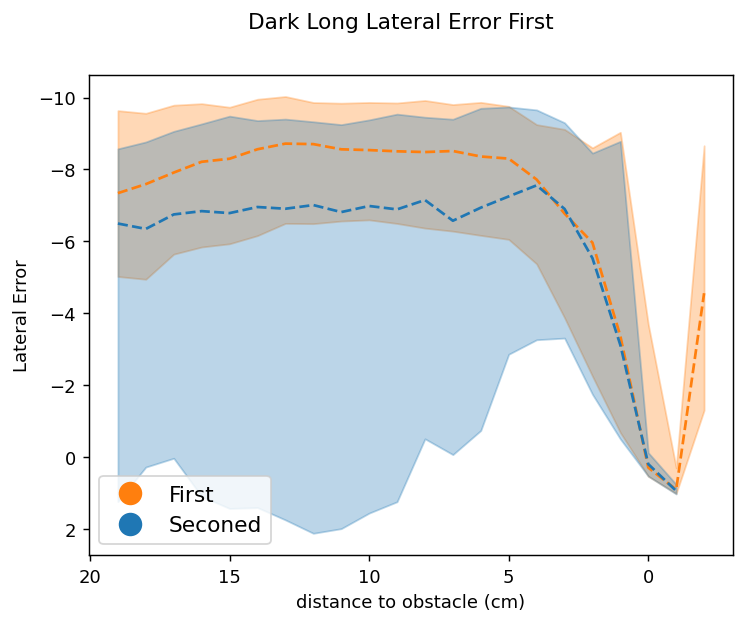

In [262]:
""" Angle to corner comparing fisr and third trials """
xnew =  np.arange(-2, 20, 1)
xnew= np.flip(xnew)
fig,ax = plt.subplots(dpi = 130)
fig.suptitle('Dark Long Lateral Error First')
ax.invert_xaxis()
ax.invert_yaxis()
data = long_con
long_short = pd.concat([long_con,short_con])
data = drop_nans_in_columns(data,'obstacle_devations')
data = drop_nans_in_columns(data,'lateral_error')
data = drop_nans_in_columns(data,'speed')

first_trial = data[(data.task == 'oadark')&(data.consective_type == 0) &(data.avg_lateral_error <= -3) &(data.distance_at_head_turn >= 0)]
ind = first_trial.index.to_numpy()+2
third_trial = long_short.loc[ind.tolist()]


first_rows = first_trial.shape[0]
first_angle_array = np.empty([first_rows,len(xnew)])
first_angle_array[:] =np.nan 
for i,row in enumerate(first_trial.iterrows()):
    x = row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float)
    y = row[1]['lateral_error'][:int(row[1]['obstacle_ind'])].astype(float)
    if sum(y) == 0:
        continue
    else:
        #x = resample(x,20)
        #y = resample(np.flip(np.unique(y)),len(x))
        #y = resample(y,len(x))
        interpolater = interp1d(x,y,bounds_error=False)
        #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['lateral_error'])
        ynew = interpolater(xnew)
        first_angle_array[i] = ynew
first_angle_mean = np.nanmean(first_angle_array,axis = 0)
first_angle_median= np.nanmedian(first_angle_array,axis = 0)
    
median, q1, q3, iqr = calculate_quartiles(first_angle_array)


ax.fill_between(xnew, q1, q3, color='tab:orange', alpha=0.3, label='IQR')
ax.plot(xnew,first_angle_median,'--',c = 'tab:orange',alpha = 1)

third_rows = third_trial.shape[0]
third_angle_array = np.empty([third_rows,len(xnew)])
third_angle_array[:] =np.nan 
for i,row in enumerate(third_trial.iterrows()):
    x = row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float)
    y = row[1]['lateral_error'][:int(row[1]['obstacle_ind'])].astype(float)
    if sum(y) == 0:
        continue
    else:
        #x = resample(x,20)
        #y = resample(np.flip(np.unique(y)),len(x))
        #y = resample(y,len(x))
        interpolater = interp1d(x,y,bounds_error=False)
        #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['lateral_error'])
        ynew = interpolater(xnew)
        third_angle_array[i] = ynew
third_angle_mean = np.nanmean(third_angle_array,axis = 0)
third_angle_median= np.nanmedian(third_angle_array,axis = 0)
    
median, q1, q3, iqr = calculate_quartiles(third_angle_array)


ax.fill_between(xnew, q1, q3, color='tab:blue', alpha=0.3, label='IQR')
#ax.plot(xnew,third_angle_mean,c = 'tab:orange',alpha = 1)
ax.plot(xnew,third_angle_median,'--',c = 'tab:blue',alpha = 1)





ax.set_ylabel('Lateral Error')
ax.set_xlabel('distance to obstacle (cm)')
   
markers = [plt.Line2D([0,0],[0,0],color=color, marker='o', linestyle='',markersize=12) for color in ['tab:orange','tab:blue']]
ax.legend(markers, ['First','Seconed'], numpoints=1,loc = 'lower left',fontsize=12)

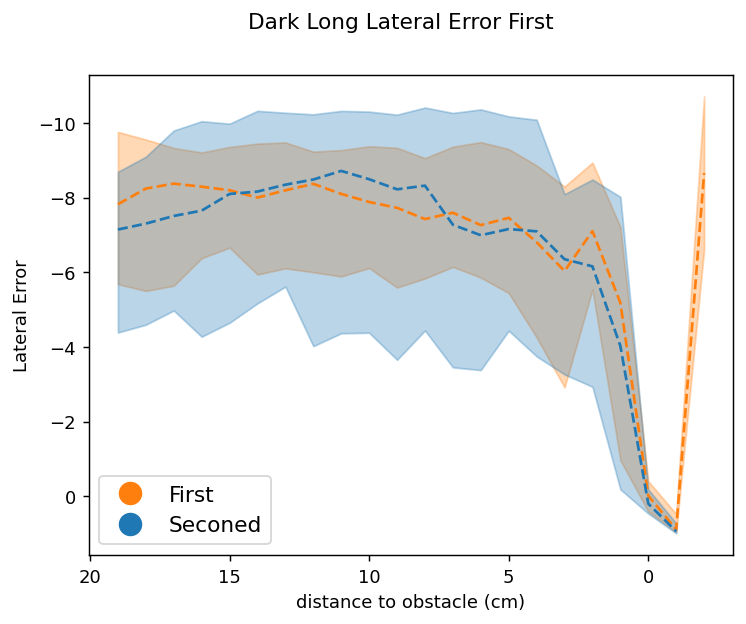

In [259]:
""" Angle to corner comparing fisr and third trials """
xnew =  np.arange(-2, 20, 1)
xnew= np.flip(xnew)
fig,ax = plt.subplots(dpi = 130)
fig.suptitle('Dark Long Lateral Error First')
ax.invert_xaxis()
ax.invert_yaxis()
data = long_con
long_short = pd.concat([long_con,short_con])
data = drop_nans_in_columns(data,'obstacle_devations')
data = drop_nans_in_columns(data,'lateral_error')
data = drop_nans_in_columns(data,'speed')

first_trial = data[(data.task == 'oadark')&(data.consective_type == 0)&(data.date_index == 0)  &(data.avg_lateral_error <= -3) &(data.distance_at_head_turn >= 0)]
ind = first_trial.index.to_numpy()+2
third_trial = long_short.loc[ind.tolist()]


first_rows = first_trial.shape[0]
first_angle_array = np.empty([first_rows,len(xnew)])
first_angle_array[:] =np.nan 
for i,row in enumerate(first_trial.iterrows()):
    x = row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float)
    y = row[1]['lateral_error'][:int(row[1]['obstacle_ind'])].astype(float)
    if sum(y) == 0:
        continue
    else:
        #x = resample(x,20)
        #y = resample(np.flip(np.unique(y)),len(x))
        #y = resample(y,len(x))
        interpolater = interp1d(x,y,bounds_error=False)
        #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['lateral_error'])
        ynew = interpolater(xnew)
        first_angle_array[i] = ynew
first_angle_mean = np.nanmean(first_angle_array,axis = 0)
first_angle_median= np.nanmedian(first_angle_array,axis = 0)
    
median, q1, q3, iqr = calculate_quartiles(first_angle_array)


ax.fill_between(xnew, q1, q3, color='tab:orange', alpha=0.3, label='IQR')
ax.plot(xnew,first_angle_median,'--',c = 'tab:orange',alpha = 1)

third_rows = third_trial.shape[0]
third_angle_array = np.empty([third_rows,len(xnew)])
third_angle_array[:] =np.nan 
for i,row in enumerate(third_trial.iterrows()):
    x = row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float)
    y = row[1]['lateral_error'][:int(row[1]['obstacle_ind'])].astype(float)
    if sum(y) == 0:
        continue
    else:
        #x = resample(x,20)
        #y = resample(np.flip(np.unique(y)),len(x))
        #y = resample(y,len(x))
        interpolater = interp1d(x,y,bounds_error=False)
        #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['lateral_error'])
        ynew = interpolater(xnew)
        third_angle_array[i] = ynew
third_angle_mean = np.nanmean(third_angle_array,axis = 0)
third_angle_median= np.nanmedian(third_angle_array,axis = 0)
    
median, q1, q3, iqr = calculate_quartiles(third_angle_array)


ax.fill_between(xnew, q1, q3, color='tab:blue', alpha=0.3, label='IQR')
#ax.plot(xnew,third_angle_mean,c = 'tab:orange',alpha = 1)
ax.plot(xnew,third_angle_median,'--',c = 'tab:blue',alpha = 1)





ax.set_ylabel('Lateral Error')
ax.set_xlabel('distance to obstacle (cm)')
   
markers = [plt.Line2D([0,0],[0,0],color=color, marker='o', linestyle='',markersize=12) for color in ['tab:orange','tab:blue']]
ax.legend(markers, ['First','Seconed'], numpoints=1,loc = 'lower left',fontsize=12)

In [ ]:
def con_df_prob_switch_obstacle_turn(df):
    "check consecutive trials switch to openside"
    dictlists = {key: [] for key in ['date_index','trials','switch','task','animal']}
    long_con, short_con,middle_con = create_df_by_type_nostart(df)
    long_short = pd.concat([long_con,short_con])
    for ani,animal_df in long_short.groupby(['animal']):
        for task,task_df in animal_df.groupby(['task']):
            for date,date_df in task_df.groupby(['date_index']):
                first_trial = date_df[(date_df.consective_type == 0) &(date_df.intial_lateral_error <= -2) &(date_df.distance_at_head_turn >= 0)]
                ind = first_trial.index.to_numpy()+2
                third_trial = long_short.loc[ind.tolist()]
                switch = []
                for ind,row in enumerate(first_trial.start.tolist()):
                    if row == third_trial.start.tolist()[ind]:
                        switch.append(0)
                    else:
                        switch.append(1)
                dictlists['date_index'].append(date)
                dictlists['trials'].append(len(date_df))
                dictlists['switch'].append(sum(switch)/len(first_trial))
                dictlists['task'].append(task)
                dictlists['animal'].append(ani)
    return pd.DataFrame.from_dict(dictlists)

In [27]:
def smooth(points,sigma = 3):
    filtered = gaussian_filter(points.astype(float),sigma = sigma)
    return filtered


In [165]:
def con_df_prob_switch_turn_obstacle(df):
    "check consecutive trials switch to openside"
    dictlists = {key: [] for key in ['date_index','trials','switch_sec_trial_ob','switch_third_trial_ob','task','animal']}
    long_con, short_con,middle_con = create_df_by_type_nostart(df)
    long_short = pd.concat([long_con,short_con])
    for ani,animal_df in long_short.groupby(['animal']):
        for task,task_df in animal_df.groupby(['task']):
            for date,date_df in task_df.groupby(['date_index']):
                first_trial = date_df[(date_df.consective_type == 0) &(date_df.intial_lateral_error <= -2) &(date_df.distance_at_head_turn >= 0)]
                ind_2 = first_trial.index.to_numpy()+1
                sec_trial = long_short.loc[ind_2.tolist()] 
                ind_3 = first_trial.index.to_numpy()+2
                third_trial = long_short.loc[ind_3.tolist()]
                switch_2 = []
                switch_3 = []
                for ind,row in enumerate(first_trial.turn_to_obstacle.tolist()):
                    if row == sec_trial.turn_to_obstacle.tolist()[ind]:
                        switch_2.append(0)
                    else:
                        switch_2.append(1)
                for ind,row in enumerate(sec_trial.turn_to_obstacle.tolist()):
                    
                    if row == third_trial.turn_to_obstacle.tolist()[ind]:
                        switch_3.append(0)
                    else:
                        switch_3.append(1)
                dictlists['date_index'].append(date)
                dictlists['trials'].append(len(date_df))
                dictlists['switch_sec_trial_ob'].append(sum(switch_2)/len(first_trial))
                dictlists['switch_third_trial_ob'].append(sum(switch_3)/len(first_trial))
                dictlists['task'].append(task)
                dictlists['animal'].append(ani)
    return pd.DataFrame.from_dict(dictlists)

In [171]:
def con_df_prob_switch_turn(df):
    "check consecutive trials switch to openside"
    dictlists = {key: [] for key in ['date_index','trials','switch_sec_trial','switch_third_trial','task','animal']}
    long_con, short_con,middle_con = create_df_by_type_nostart(df)
    long_short = pd.concat([long_con,short_con])
    for ani,animal_df in long_short.groupby(['animal']):
        for task,task_df in animal_df.groupby(['task']):
            for date,date_df in task_df.groupby(['date_index']):
                first_trial = date_df[(date_df.consective_type == 0) &(date_df.intial_lateral_error <= -2) &(date_df.distance_at_head_turn >= 0)]
                ind_2 = first_trial.index.to_numpy()+1
                sec_trial = long_short.loc[ind_2.tolist()]
                ind_3 = first_trial.index.to_numpy()+2
                third_trial = long_short.loc[ind_3.tolist()]
                switch_2 = []
                switch_3 = []
                for ind,row in enumerate(first_trial.turn_direction.tolist()):
                    if row == sec_trial.turn_direction.tolist()[ind]:
                        switch_2.append(1)
                    else:
                        switch_2.append(0)
                for ind,row in enumerate(sec_trial.turn_direction.tolist()):
                    
                    if row == third_trial.turn_direction.tolist()[ind]:
                        switch_3.append(1)
                    else:
                        switch_3.append(0)
                dictlists['date_index'].append(date)
                dictlists['trials'].append(len(date_df))
                dictlists['switch_sec_trial'].append(sum(switch_2)/len(first_trial))
                dictlists['switch_third_trial'].append(sum(switch_3)/len(first_trial))
                dictlists['task'].append(task)
                dictlists['animal'].append(ani)
    return pd.DataFrame.from_dict(dictlists)

In [108]:
def con_df_prob_switch_turn_type(df):
    "check consecutive trials switch to openside"
    dictlists = {key: [] for key in ['date_index','trials','switch_sec_trial_type','switch_sec_trial','switch_third_trial_type','switch_third_trial','task','animal','obstacle_cluster'
                                     ,'switch_type_all','switch_sec_trial_end','switch_sec_trial_type_end','switch_third_trial_end','switch_third_trial_type_end','trials_inds']}
    #long_con, short_con,middle_con = create_df_by_type_nostart(df)
    #df = pd.concat([long_con,short_con])
    for ani,animal_df in df.groupby(['animal']):
        for task,task_df in animal_df.groupby(['task']):
            for date,date_df in task_df.groupby(['date_index']):
                for i,inds in enumerate(date_df.consective_inds.unique().tolist()):
                    trials_ind = ast.literal_eval(date_df.consective_inds.unique()[i])
                    trials = date_df.loc[trials_ind]
                    dictlists['switch_sec_trial_type'].append(trials.iloc[0].turn_direction +'_' +trials.iloc[1].turn_direction )
                    if trials.iloc[0].turn_direction == trials.iloc[1].turn_direction:
                         dictlists['switch_sec_trial'].append(0)
                    else:
                         dictlists['switch_sec_trial'].append(1)

                    dictlists['switch_sec_trial_type_end'].append(trials.iloc[0].turn_direction_end +'_' +trials.iloc[1].turn_direction )
                    if trials.iloc[0].turn_direction_end == trials.iloc[1].turn_direction:
                         dictlists['switch_sec_trial_end'].append(0)
                    else:
                         dictlists['switch_sec_trial_end'].append(1)

                    

                    dictlists['switch_third_trial_type'].append(trials.iloc[1].turn_direction +'_' +trials.iloc[2].turn_direction)
                    if trials.iloc[1].turn_direction == trials.iloc[2].turn_direction:
                         dictlists['switch_third_trial'].append(0)
                    else:
                         dictlists['switch_third_trial'].append(1)

                    dictlists['switch_third_trial_type_end'].append(trials.iloc[1].turn_direction_end +'_' +trials.iloc[2].turn_direction )
                    if trials.iloc[1].turn_direction_end == trials.iloc[2].turn_direction:
                         dictlists['switch_third_trial_end'].append(0)
                    else:
                         dictlists['switch_third_trial_end'].append(1)

                    dictlists['switch_type_all'].append(trials.iloc[0].turn_direction + '_' + trials.iloc[1].turn_direction+'_' +trials.iloc[2].turn_direction)
                    dictlists['date_index'].append(date)
                    dictlists['trials'].append(len(trials_ind))
                    dictlists['obstacle_cluster'].append(trials.obstacle_cluster.unique()[0])
                    dictlists['task'].append(task)
                    dictlists['animal'].append(ani)
                    dictlists['trials_inds'].append(trials_ind)
    return pd.DataFrame.from_dict(dictlists)

In [10]:
def con_df_prob_switch_turn_obstacle_type(df):
    "check consecutive trials switch to openside"
    dictlists = {key: [] for key in ['date_index','trials','switch_sec_trial_type','switch_sec_trial','switch_third_trial_type','switch_third_trial','task','animal','obstacle_cluster'
                                     ,'switch_type_all','inital_turn','initial_linearity','trials_inds']}
    #long_con, short_con,middle_con = create_df_by_type_nostart(df)
    #df = pd.concat([long_con,short_con])
    for ani,animal_df in df.groupby(['animal']):
        for task,task_df in animal_df.groupby(['task']):
            for date,date_df in task_df.groupby(['date_index']):
                for i,inds in enumerate(date_df.consective_inds.unique().tolist()):
                    trials_ind = ast.literal_eval(date_df.consective_inds.unique()[i])
                    trials = date_df.loc[trials_ind]
                    dictlists['switch_sec_trial_type'].append(trials.iloc[0].turn_to_obstacle + '_' + trials.iloc[1].turn_to_obstacle )
                    if trials.iloc[0].turn_to_obstacle == trials.iloc[1].turn_to_obstacle:
                         dictlists['switch_sec_trial'].append(0)
                    else:
                         dictlists['switch_sec_trial'].append(1)

                    dictlists['switch_third_trial_type'].append(trials.iloc[1].turn_to_obstacle +'_' +trials.iloc[2].turn_to_obstacle)
                    if trials.iloc[1].turn_to_obstacle == trials.iloc[2].turn_to_obstacle:
                         dictlists['switch_third_trial'].append(0)
                    else:
                         dictlists['switch_third_trial'].append(1)
                    dictlists['switch_type_all'].append(trials.iloc[0].turn_to_obstacle + '_' + trials.iloc[1].turn_to_obstacle+'_' +trials.iloc[2].turn_to_obstacle)
                    dictlists['initial_linearity'].append(trials.iloc[0].linearity )
                    dictlists['trials_inds'].append(trials_ind)
                    dictlists['inital_turn'].append(trials.iloc[0].turn_to_obstacle )
                    dictlists['date_index'].append(date)
                    dictlists['trials'].append(len(trials_ind))
                    dictlists['obstacle_cluster'].append(trials.obstacle_cluster.unique()[0])
                    dictlists['task'].append(task)
                    dictlists['animal'].append(ani)
    return pd.DataFrame.from_dict(dictlists)

In [113]:
joint

,level_0,first_poke,second_poke,trial_timestamps,trial_vidframes,nose_x,nose_y,leftear_x,leftear_y,rightear_x,...,ts_speed,distance,ts_distance,total_distance,ts_total_distance,intial_head_angle_velocity,turn_direction,turn_to_obstacle,obstacle_cross,turn_direction_end
0,0,48054.835737,48059.792371,"[48054.850086, 48054.866291, 48054.883008, 480...","[[718, 719, 720, 721, 722, 723, 724, 725, 726,...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[646.5863647460938, 647.6791381835938, 647.953...","[256.8539123535156, 256.5686340332031, 256.810...","[655.6896362304688, 655.893798828125, 656.1171...",...,"[20.805212770043767, 20.0813240662182, 18.8413...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[0.5818250503552314, 0.7121183184211084, 0.417...",92.262601,87.506254,-2.506742,up,towards,True,down
1,1,48059.792371,48066.055564,"[48059.801369, 48059.818099, 48059.834739, 480...","[1015, 1016, 1017, 1018, 1019, 1020, 1021, 102...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[100.70337677001953, 100.96659851074219, 100.9...","[229.06690979003906, 229.2141571044922, 229.14...","[97.77118682861328, 97.44432830810547, 97.2664...",...,"[19.347470634770293, 19.188974589530158, 18.93...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[0.49179392024581503, 0.46890527965671325, 0.2...",117.150553,107.000585,2.681300,down,away,True,up
2,2,48066.055564,48070.369088,"[48066.070515, 48066.087513, 48066.103731, 480...","[[1391, 1392, 1393, 1394, 1395, 1396, 1397, 13...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[652.5042114257812, 653.2907104492188, 653.849...","[249.86825561523438, 249.44972229003906, 249.3...","[653.6144409179688, 655.35498046875, 655.19451...",...,"[9.400033011871137, 8.812916670123148, 7.79459...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[0.30727416096977933, 0.2162995114112256, 0.21...",97.647337,90.785809,-0.552292,down,towards,True,down
3,3,48070.369088,48076.550553,"[48070.37175, 48070.388352, 48070.40526, 48070...","[1649, 1650, 1651, 1652, 1653, 1654, 1655, 165...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[102.01713562011719, 102.3261489868164, 102.09...","[225.12435913085938, 225.2169189453125, 225.56...","[97.98050689697266, 98.4389877319336, 98.42494...",...,"[9.176296733715276, 9.428115151332422, 9.90487...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[0.17159447174484832, 0.1442775267931662, 0.17...",92.162377,84.845334,-0.355902,up,away,True,up
4,4,48076.550553,48079.610534,"[48076.557094, 48076.574464, 48076.590464, 480...","[[2020, 2021, 2022, 2023, 2024, 2025, 2026, 20...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[652.8433227539062, 653.4661254882812, 654.875...","[250.68643188476562, 250.68145751953125, 250.4...","[650.7364501953125, 652.0059814453125, 654.872...",...,"[26.63072448784748, 27.323899010710587, 28.707...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[0.4575697759512334, 0.4996207524695162, 0.568...",68.730339,62.204433,-1.234453,up,away,True,down
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14548,14548,56029.032947,56032.629555,"[56029.040921, 56029.057792, 56029.075737, 560...","[[20991, 20992, 20993, 20994, 20995, 20996, 20...","[673.8978271484375, 674.8469848632812, 674.964...","[262.5647277832031, 262.437255859375, 261.6487...","[663.4574584960938, 664.0390014648438, 664.742...","[247.28787231445312, 247.69454956054688, 247.2...","[662.2060546875, 662.8528442382812, 663.211303...",...,"[24.662233905462408, 25.210902679169408, 26.27...","[0.08069042460931897, 0.06787062161220803, 0.0...","[0.4161529912077242, 0.47135476557621914, 0.46...",81.856892,72.015526,2.651242,down,towards,True,up
14549,14549,5

In [109]:
con_switch_turn = con_df_prob_switch_turn_type(pd.concat([long_con_nostart,short_con_nostart]))

Text(0.5, 0, 'turn direction all')

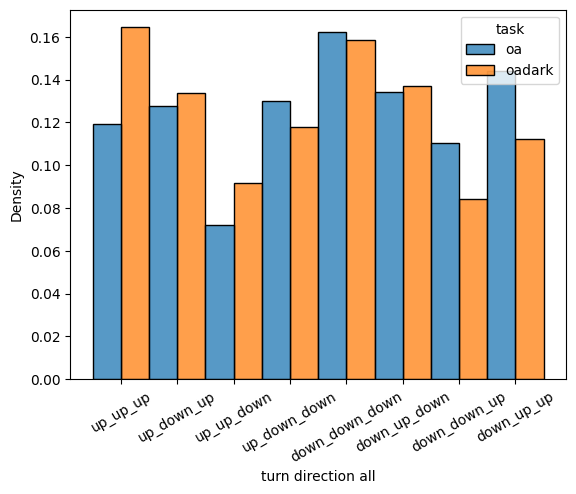

In [110]:
data = con_switch_turn

up_up_up = data[data.switch_type_all == 'up_up_up']
up_down_up = data[data.switch_type_all == 'up_down_up']
up_up_down = data[data.switch_type_all == 'up_up_down']
up_down_down = data[data.switch_type_all == 'up_down_down']
down_down_down = data[data.switch_type_all == 'down_down_down']
down_up_down = data[data.switch_type_all == 'down_up_down']
down_down_up = data[data.switch_type_all == 'down_down_up']
down_up_up = data[data.switch_type_all == 'down_up_up']

data = pd.concat([up_up_up,up_down_up,up_up_down,up_down_down,down_down_down,down_up_down,down_down_up,down_up_up])

sns.histplot(data=data,x='switch_type_all',stat='density',hue ='task',common_norm=False,multiple='dodge')
plt.xticks(rotation=30)
plt.xlabel('turn direction all')

Text(0.5, 0, 'turn direction 1st - 2nd')

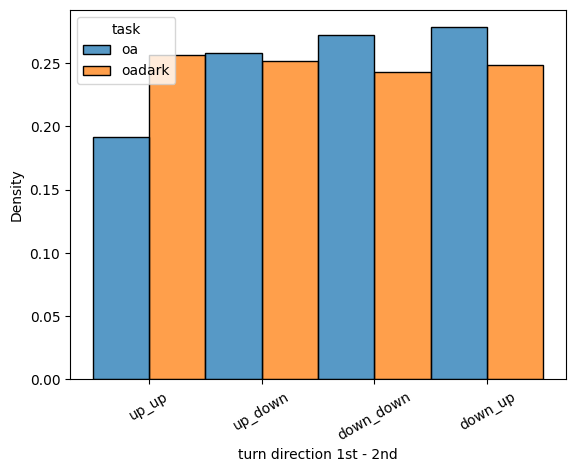

In [126]:
data = con_switch_turn

up_up = data[data.switch_sec_trial_type == 'up_up']
up_down = data[data.switch_sec_trial_type == 'up_down']
down_down = data[data.switch_sec_trial_type == 'down_down']
down_up = data[data.switch_sec_trial_type == 'down_up']

data = pd.concat([up_up,up_down,down_down,down_up])

sns.histplot(data=data,x='switch_sec_trial_type',stat='density',hue ='task',common_norm=False,multiple='dodge')
plt.xticks(rotation=30)
plt.xlabel('turn direction 1st - 2nd')

Text(0.5, 0, 'turn direction end 1st - 2nd')

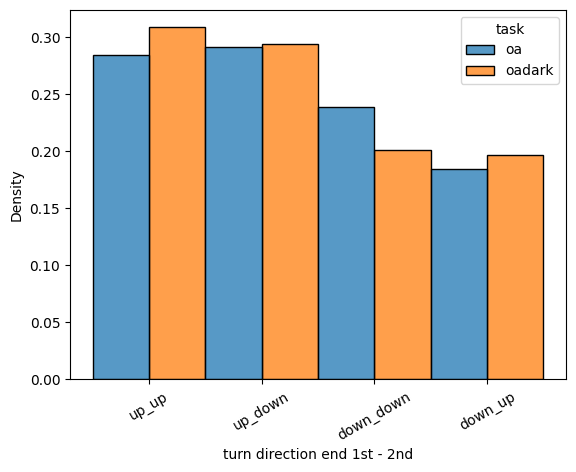

In [127]:
data = con_switch_turn

up_up = data[data.switch_sec_trial_type_end == 'up_up']
up_down = data[data.switch_sec_trial_type_end == 'up_down']
down_down = data[data.switch_sec_trial_type_end == 'down_down']
down_up = data[data.switch_sec_trial_type_end == 'down_up']

data = pd.concat([up_up,up_down,down_down,down_up])

sns.histplot(data=data,x='switch_sec_trial_type_end',stat='density',hue ='task',common_norm=False,multiple='dodge')
plt.xticks(rotation=30)
plt.xlabel('turn direction end 1st - 2nd')

Text(0.5, 0, 'turn direction 2nd - 3rd')

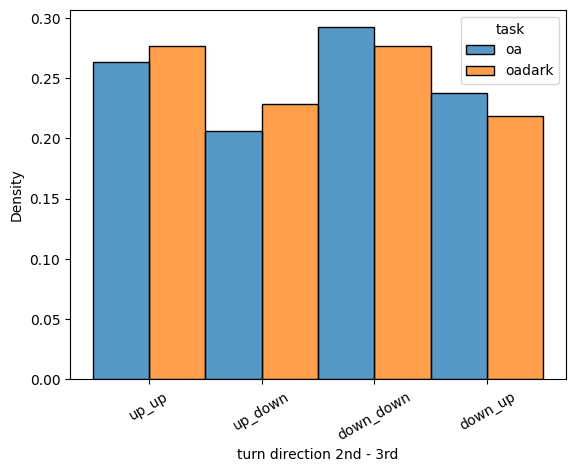

In [437]:
data = con_switch_turn

up_up = data[data.switch_third_trial_type == 'up_up']
up_down = data[data.switch_third_trial_type == 'up_down']
down_down = data[data.switch_third_trial_type == 'down_down']
down_up = data[data.switch_third_trial_type == 'down_up']

data = pd.concat([up_up,up_down,down_down,down_up])

sns.histplot(data=data,x='switch_third_trial_type',stat='density',hue ='task',common_norm=False,multiple='dodge')
plt.xticks(rotation=30)
plt.xlabel('turn direction 2nd - 3rd')

Text(0.5, 0, 'turn direction end 2nd - 3rd')

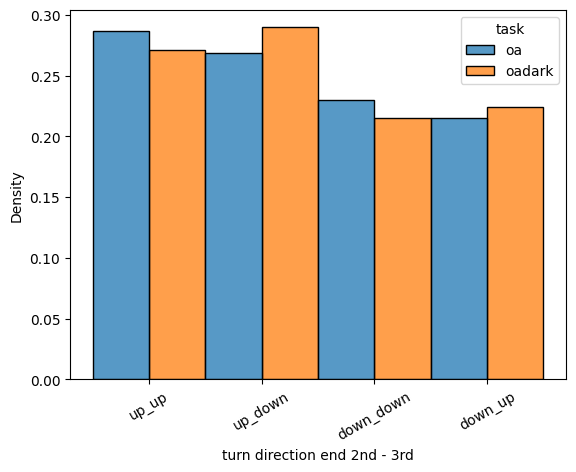

In [75]:
data = con_switch_turn

up_up = data[data.switch_third_trial_type_end == 'up_up']
up_down = data[data.switch_third_trial_type_end == 'up_down']
down_down = data[data.switch_third_trial_type_end == 'down_down']
down_up = data[data.switch_third_trial_type_end == 'down_up']

data = pd.concat([up_up,up_down,down_down,down_up])

sns.histplot(data=data,x='switch_third_trial_type_end',stat='density',hue ='task',common_norm=False,multiple='dodge')
plt.xticks(rotation=30)
plt.xlabel('turn direction end 2nd - 3rd')

Text(0.5, 0, 'turn direction end 2nd - 3rd')

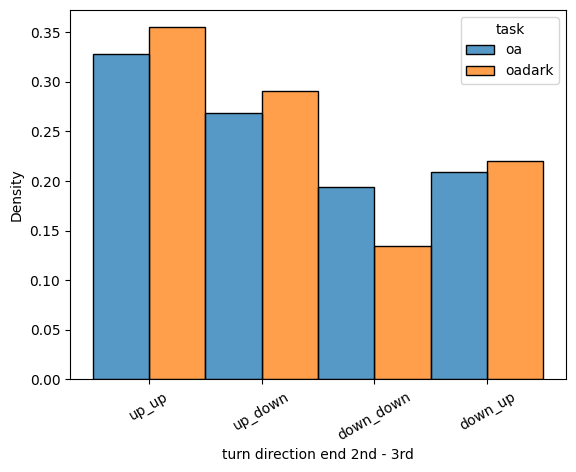

In [102]:
data = con_switch_turn

up_up = data[data.switch_third_trial_type_end == 'up_up']
up_down = data[data.switch_third_trial_type_end == 'up_down']
down_down = data[data.switch_third_trial_type_end == 'down_down']
down_up = data[data.switch_third_trial_type_end == 'down_up']

data = pd.concat([up_up,up_down,down_down,down_up])
data =data[data.date_index == 0]

sns.histplot(data=data,x='switch_third_trial_type_end',stat='density',hue ='task',common_norm=False,multiple='dodge')
plt.xticks(rotation=30)
plt.xlabel('turn direction end 2nd - 3rd')

([0, 1, 2, 3],
 [Text(0, 0, 'up_up'),
  Text(1, 0, 'up_down'),
  Text(2, 0, 'down_down'),
  Text(3, 0, 'down_up')])

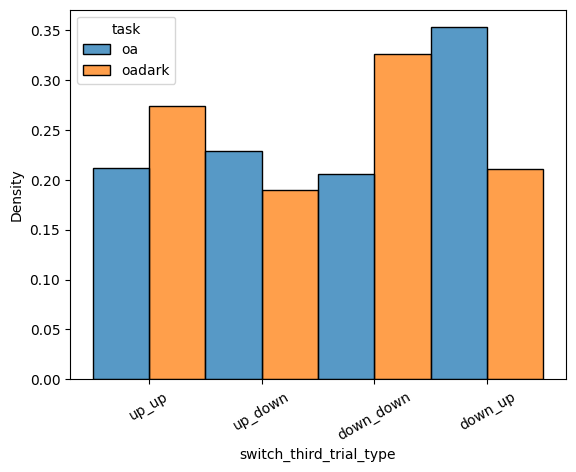

In [94]:
data = con_switch_turn

up_up = data[data.switch_third_trial_type == 'up_up']
up_down = data[data.switch_third_trial_type == 'up_down']
down_down = data[data.switch_third_trial_type == 'down_down']
down_up = data[data.switch_third_trial_type == 'down_up']

data = pd.concat([up_up,up_down,down_down,down_up])
data =data[data.date_index == 5]

sns.histplot(data=data,x='switch_third_trial_type',stat='density',hue ='task',common_norm=False,multiple='dodge')
plt.xticks(rotation=30)

([0, 1, 2, 3],
 [Text(0, 0, 'up_up'),
  Text(1, 0, 'up_down'),
  Text(2, 0, 'down_down'),
  Text(3, 0, 'down_up')])

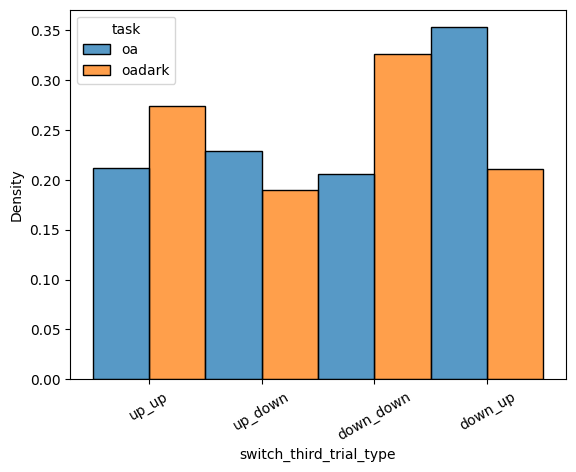

In [430]:
data = con_switch_turn

up_up = data[data.switch_third_trial_type == 'up_up']
up_down = data[data.switch_third_trial_type == 'up_down']
down_down = data[data.switch_third_trial_type == 'down_down']
down_up = data[data.switch_third_trial_type == 'down_up']

data = pd.concat([up_up,up_down,down_down,down_up])
data =data[data.date_index == 5]

sns.histplot(data=data,x='switch_third_trial_type',stat='density',hue ='task',common_norm=False,multiple='dodge')
plt.xticks(rotation=30)

<AxesSubplot: xlabel='switch_third_trial_type', ylabel='Density'>

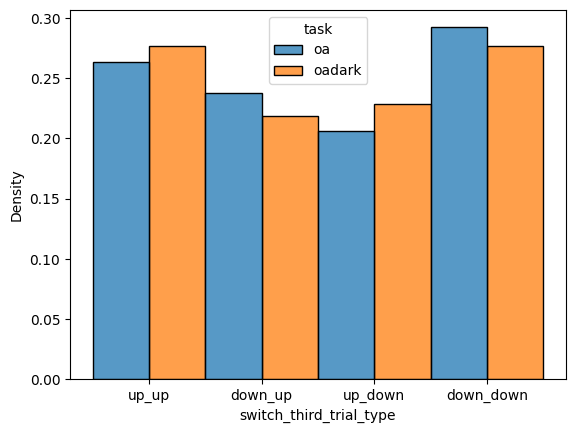

In [407]:
sns.histplot(data=con_switch_turn,x='switch_third_trial_type',stat='density',hue ='task',common_norm=False,multiple='dodge')

In [97]:
con_switch_turn

,date_index,trials,switch_sec_trial_type,switch_sec_trial,switch_third_trial_type,switch_third_trial,task,animal,obstacle_cluster,switch_type_all,switch_sec_trial_end,switch_sec_trial_type_end,switch_third_trial_end,switch_third_trial_type_end
0,0.0,6,up_up,0,up_up,0,oa,G8CK1LN,0,up_up_up,0,up_up,1,down_up
1,0.0,3,up_down,1,down_up,1,oa,G8CK1LN,1,up_down_up,1,up_down,0,up_up
2,0.0,3,up_down,1,down_up,1,oa,G8CK1LN,1,up_down_up,1,up_down,0,up_up
3,0.0,4,down_up,1,up_down,1,oa,G8CK1LN,1,down_up_down,0,up_up,1,up_down
4,0.0,3,down_up,1,up_down,1,oa,G8CK1LN,1,down_up_down,0,up_up,1,up_down
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1904,5.0,3,down_up,1,up_down,1,oadark,J704RT,5,down_up_down,1,down_up,0,down_down
1905,5.0,6,down_down,0,down_down,0,oadark,J704RT,5,down_down_down,0,down_down,0,down_down
1906,5.0,8,down_up,1,up_up,0,oadark,J704RT,5,down_up_up,1,down_up,0,up_up
1907,5.0,4,up_down,1,down_down,0,oadark,J704RT,5,up_down_down,0,down_down,1,up_down


<AxesSubplot: ylabel='switch_third_trial'>

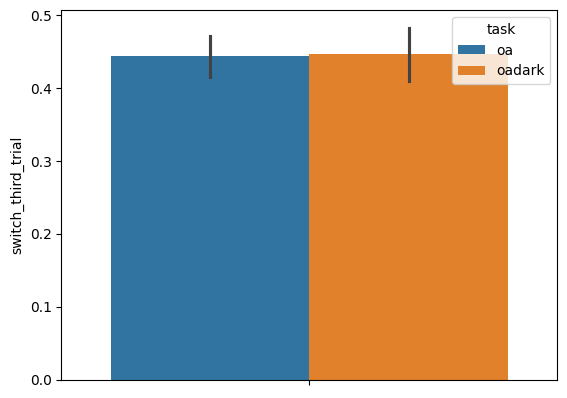

In [73]:
sns.barplot(data= con_switch_turn,y = 'switch_third_trial',hue = 'task')

<AxesSubplot: ylabel='switch_third_trial_end'>

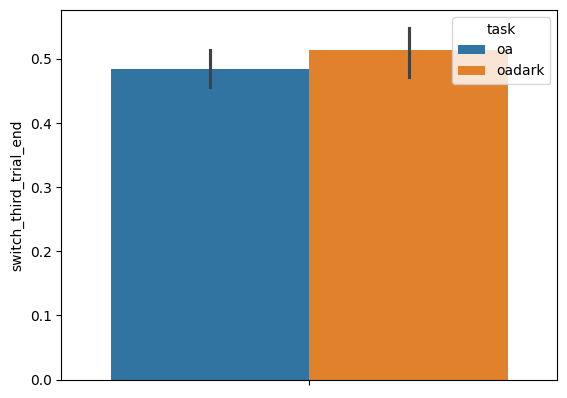

In [72]:
sns.barplot(data= con_switch_turn,y = 'switch_third_trial_end',hue = 'task')

<AxesSubplot: ylabel='switch_sec_trial'>

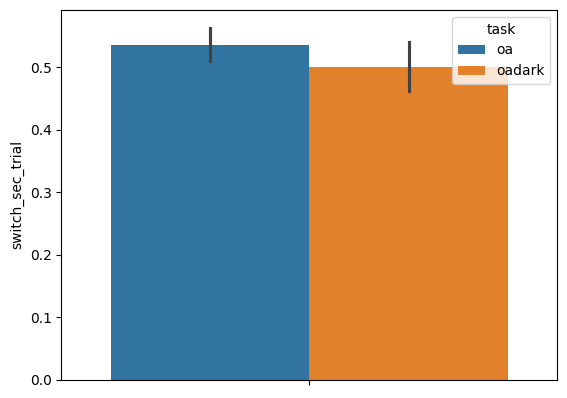

In [74]:
sns.barplot(data= con_switch_turn,y = 'switch_sec_trial',hue = 'task')

<AxesSubplot: ylabel='switch_sec_trial_end'>

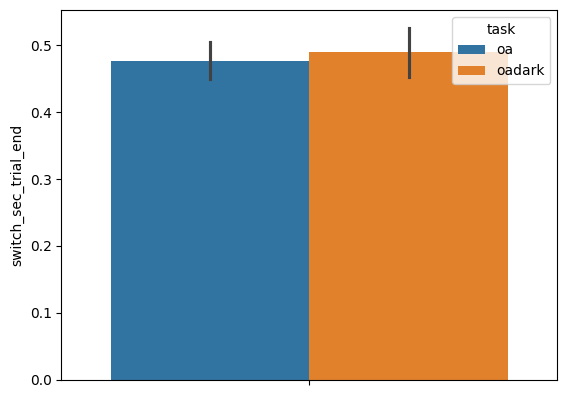

In [71]:
sns.barplot(data= con_switch_turn,y = 'switch_sec_trial_end',hue = 'task')

In [130]:
sum(short_nostart.turn_direction.to_numpy() == short_nostart.turn_direction_end.to_numpy())/len(short_nostart)

0.5106811769447803

In [88]:
sum(long_nostart.turn_direction.to_numpy() == long_nostart.turn_direction_end.to_numpy())/len(long_nostart)

0.5250236071765817

In [89]:
sum(middle.turn_direction.to_numpy() == middle.turn_direction_end.to_numpy())/len(middle)

0.4518156424581006

In [62]:
sum(con_df.turn_direction.to_numpy() == con_df.turn_direction_end.to_numpy())/len(con_df)

0.4945652173913043

<AxesSubplot: ylabel='switch_third_trial'>

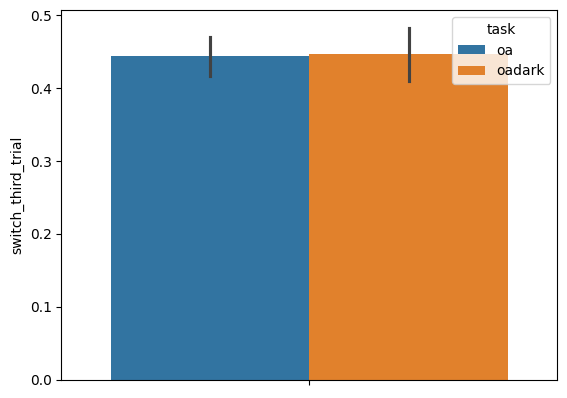

In [367]:
sns.barplot(data= con_switch_turn,y = 'switch_third_trial',hue = 'task')

In [132]:
long_short = pd.concat([long_con_nostart,short_con_nostart])
con_switch_turn_ob = con_df_prob_switch_turn_obstacle_type(long_short)

In [116]:
con_switch_turn_middle = con_df_prob_switch_turn_type(middle_con_nostart)

In [ ]:
con_df_prob_switch_turn

In [134]:
long_short

,level_0,first_poke,second_poke,trial_timestamps,trial_vidframes,nose_x,nose_y,leftear_x,leftear_y,rightear_x,...,ts_distance,total_distance,ts_total_distance,intial_head_angle_velocity,turn_direction,turn_to_obstacle,obstacle_cross,turn_direction_end,consective_inds,consective_type
3013,3013,51996.770688,52001.042969,"[51996.774412, 51996.792038, 51996.807859, 519...","[[16421, 16422, 16423, 16424, 16425, 16426, 16...","[691.1340942382812, 691.9711303710938, 692.290...","[272.3184509277344, 272.58721923828125, 272.62...","[677.164306640625, 679.0819702148438, 680.3773...","[267.57257080078125, 266.7694396972656, 266.04...","[682.9622192382812, 684.521484375, 685.1768188...",...,"[0.7389303934773643, 0.6365435909226562, 0.561...",92.921842,83.452507,-0.933311,up,towards,True,down,"[3012, 3013, 3014, 3015, 3016, 3017]",1
3015,3015,52004.119424,52007.330969,"[52004.126988, 52004.143846, 52004.160512, 520...","[[16862, 16863, 16864, 16865, 16866, 16867, 16...","[691.9703979492188, 692.141357421875, 692.0581...","[273.4132995605469, 272.8192443847656, 272.415...","[676.9120483398438, 678.29296875, 679.00909423...","[268.1648254394531, 266.4772033691406, 266.131...","[683.688232421875, 684.5943603515625, 685.2813...",...,"[0.16199401192909946, 0.08904713590844793, 0.2...",74.097614,59.733877,-0.054860,down,away,True,up,"[3012, 3013, 3014, 3015, 3016, 3017]",3
3017,3017,52010.354009,52013.492057,"[52010.362406, 52010.379865, 52010.396326, 520...","[[17236, 17237, 17238, 17239, 17240, 17241, 17...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[686.3831176757812, 687.662353515625, 688.4680...","[259.5020446777344, 259.82958984375, 259.37011...","[680.0253295898438, 681.4765014648438, 682.823...",...,"[0.5690614892623085, 0.5388497968785408, 0.740...",89.138607,76.103441,-1.650283,up,towards,True,up,"[3012, 3013, 3014, 3015, 3016, 3017]",5
3362,3362,54975.085056,54977.751884,"[54975.096614, 54975.113459, 54975.129996, 549...","[[6584, 6585, 6586, 6587, 6588, 6589, 6590, 65...","[692.3567504882812, 692.2962646484375, 692.520...","[272.50238037109375, 272.5284118652344, 272.45...","[678.6873779296875, 679.5926513671875, 680.531...","[266.2485046386719, 266.1864318847656, 265.873...","[684.0333251953125, 684.5537109375, 685.142028...",...,"[0.7276547166406182, 0.6707982985841863, 0.805...",84.964126,73.530732,-1.347415,up,towards,True,up,"[3362, 3363, 3364]",0
3364,3364,54979.873856,54982.462796,"[54979.881459, 54979.898393, 54979.915788, 549...","[[6871, 6872, 6873, 6874, 6875, 6876, 6877, 68...","[690.9060668945312, 691.1382446289062, 691.611...","[271.0107727050781, 270.8990478515625, 271.453...","[680.927001953125, 681.3095703125, 682.2862548...","[262.8451232910156, 262.5636291503906, 263.138...","[683.3098754882812, 683.7190551757812, 683.634...",...,"[0.7004533753641091, 0.41514555315285406, 0.45...",73.942408,62.086776,-1.136390,up,towards,True,up,"[3362, 3363, 3364]",2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11142,11142,44107.853760,44111.048857,"[44107.855872, 44107.871961, 44107.888691, 441...","[[23505, 23506, 23507, 23508, 23509, 23510, 23...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[636.0220336914062, 637.3818359375, 638.477111...","[259.07000732421875, 258.9283447265625, 259.96...","[635.5485229492188, 638.0135498046875, 639.890...",...,"[0.6516736975354505, 0.3113641535370135, 0.532...",69.405131,63.202714,-0.360520,up,away,True,down,"[11142, 11143, 11144, 11145]",0
11144,11144,44113.170764,44116.513267,"[44113.174297, 44113.190374, 44113.207296, 441...","[[23824, 23825, 23826, 23827, 23828, 23829, 23...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[640.9989013671875, 640.4378662109375, 639.137...","[265.95733642578125, 265.91607666015625, 265.0...","[638.6724243164062, 639.2753295898438, 640.

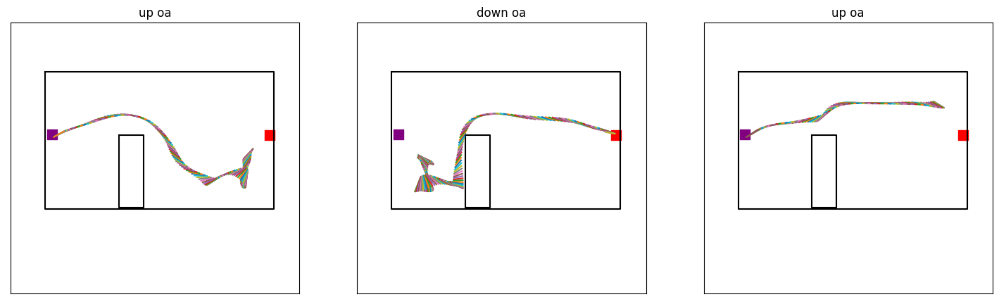

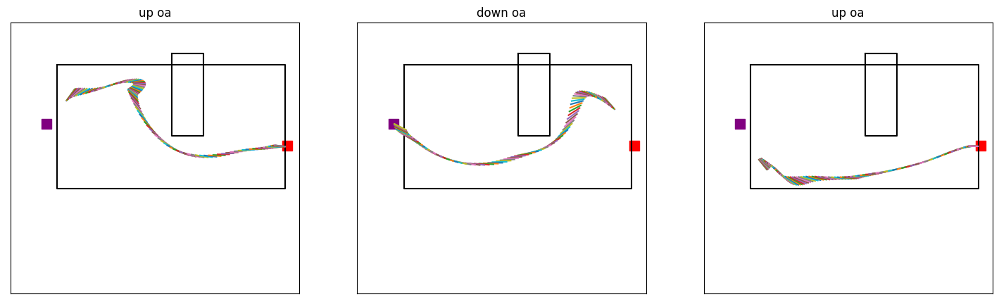

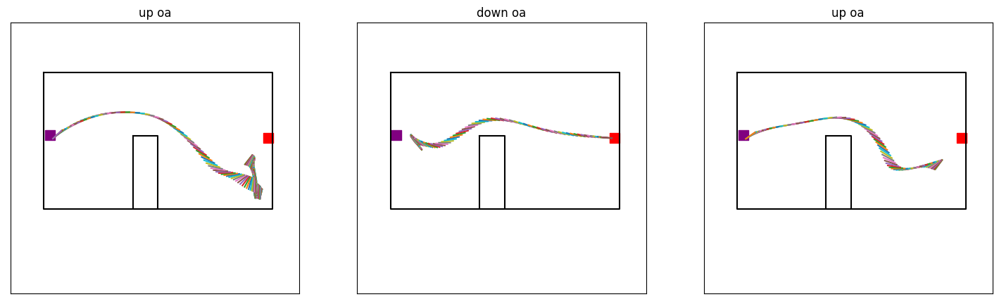

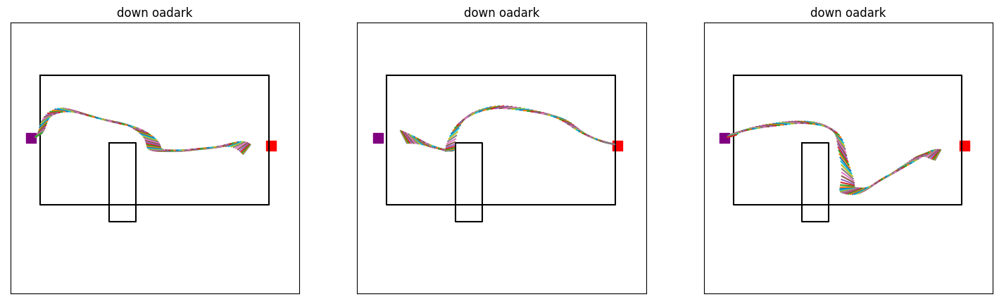

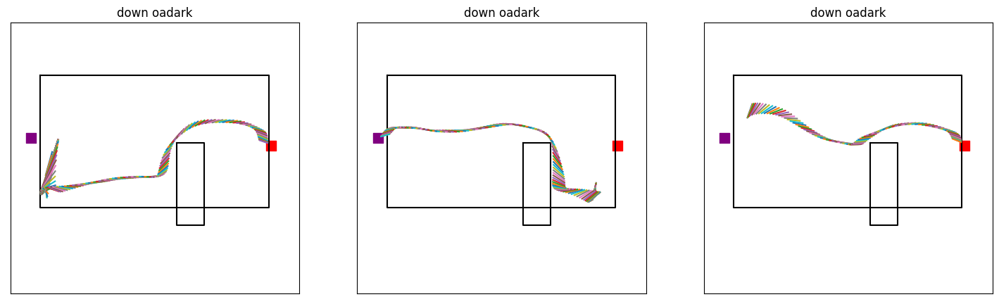

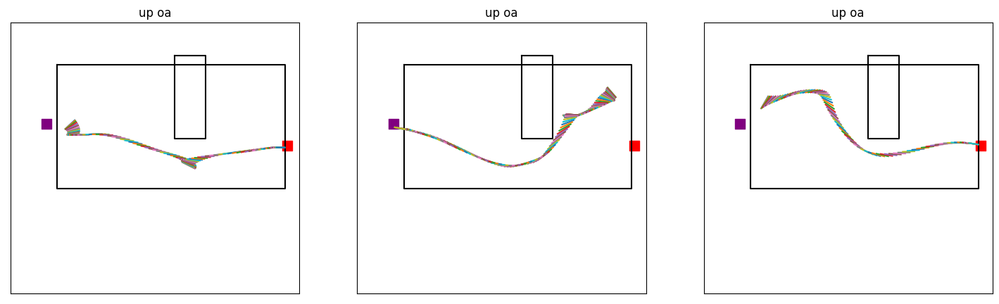

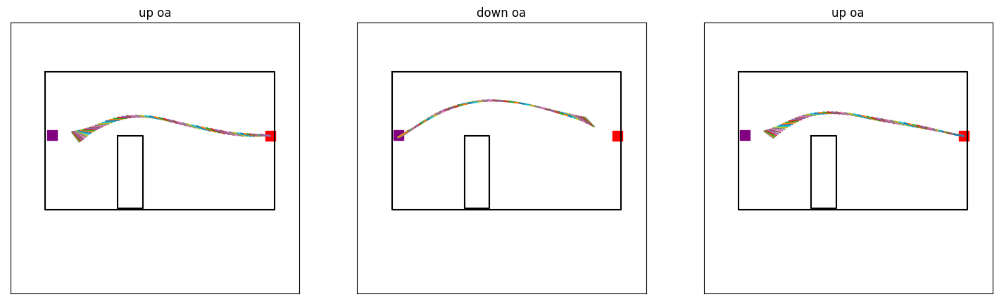

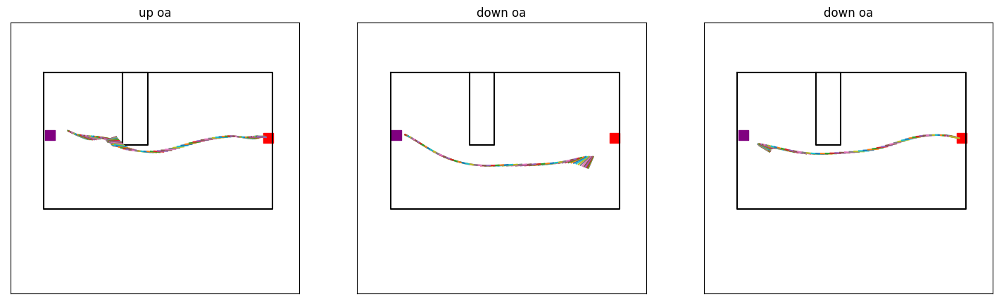

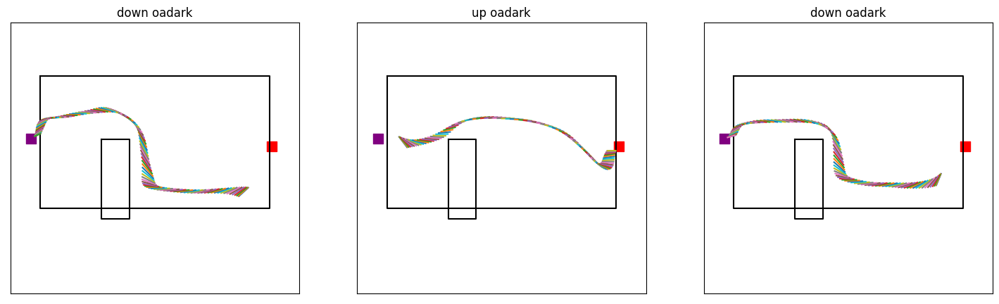

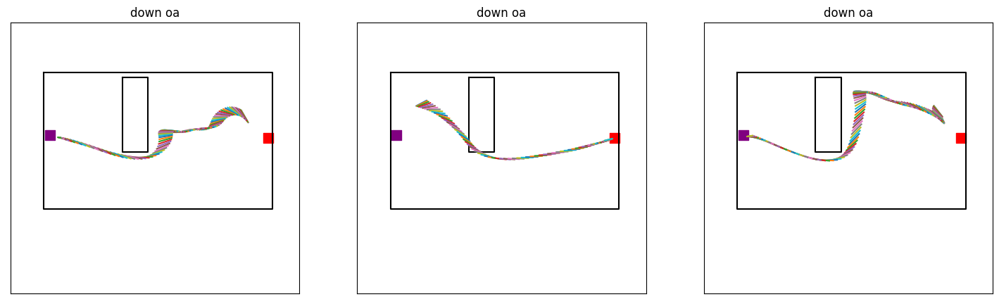

In [136]:
long_short = pd.concat([long_con_nostart,short_con_nostart])
inds = con_switch_turn_ob[con_switch_turn_ob.date_index == 5].sample(10).trials_inds.tolist()



for ind in inds:
    fig,ax = plt.subplots(1,3,figsize=(18,5))
    ax[0].set_xticks([])
    ax[0].set_yticks([])
    ax[1].set_xticks([])
    ax[1].set_yticks([])
    ax[2].set_xticks([])
    ax[2].set_yticks([])
    trials_df = long_short.loc[ind][:3]
    for i in range(3):
        plot_arena(trials_df,ax[i])
        plot_orginal_obstacle(trials_df,ax[i],0)
        ax[i].plot((smooth(trials_df.iloc[i].ts_nose_x_cm),smooth(trials_df.iloc[i].ts_spine_x_cm)),(smooth(trials_df.iloc[i].ts_nose_y_cm),smooth(trials_df.iloc[i].ts_spine_y_cm)))
        ax[i].set_title(trials_df.iloc[i].turn_direction_end + ' ' + trials_df.iloc[i].task )

In [ ]:
test = long_nostart[long_nostart.date_index == 6.0].sample(15)
for ind,row in test.iterrows():
    
        
    fig,ax = plt.subplots(1,3,figsize=(18,5))
    ax[0].set_xticks([])
    ax[0].set_yticks([])
   
    #ax[1].set_xlim(20,0)
    ax[2].invert_xaxis()
   # ax[2].set_xlim(20,0)
    if row.task == 'oadark':
        ax[0].set_facecolor('grey') 
        ax[0].patch.set_alpha(.4)
    else:
        None


    trial_df = test.loc[[ind]]
    plot_arena(test,ax[0])
    plot_orginal_obstacle(trial_df,ax[0],int(row.obstacle_cluster))



    #ax[0].set_title()
   
    ax[1].set_title('angular velocity head'+ str(row.intial_head_angle_velocity))
    ax[2].set_title('head angle')
   
    #ax[1].set_ylim(-12,2)
    ax[1].set_xlabel('distance to obstacle')
    

  
    ax[0].plot((row.ts_nose_x_cm,row.ts_spine_x_cm),(row.ts_nose_y_cm,row.ts_spine_y_cm),color = 'tab:orange')
    ax[1].plot(row.head_angle,color = 'tab:orange')
    max = np.nanargmax(row.head_angle_velocity)
    min = np.nanargmin(row.head_angle_velocity)

In [166]:
con_df.orginal_index == 234

2954     False
2955     False
2956     False
2957     False
2958     False
         ...  
11171    False
11172    False
11173    False
11174    False
11175    False
Name: orginal_index, Length: 10488, dtype: bool

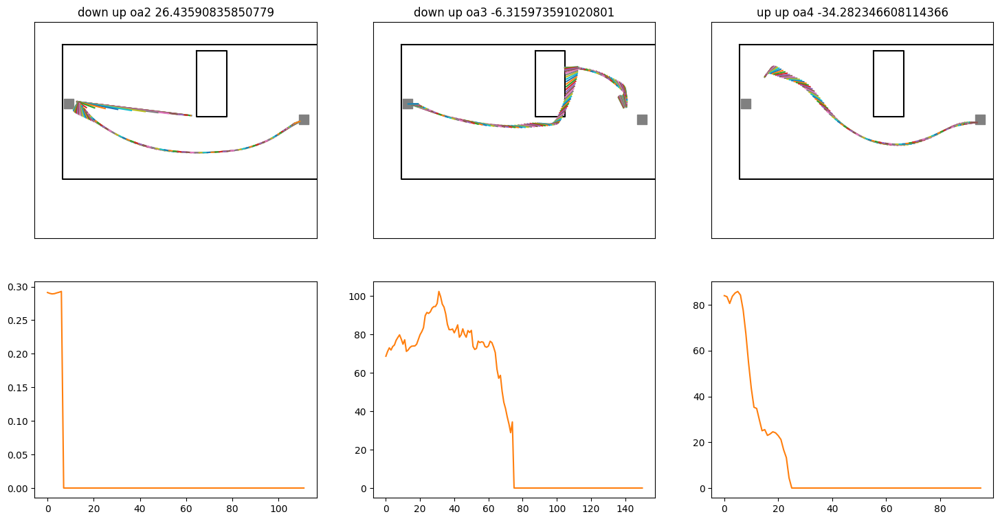

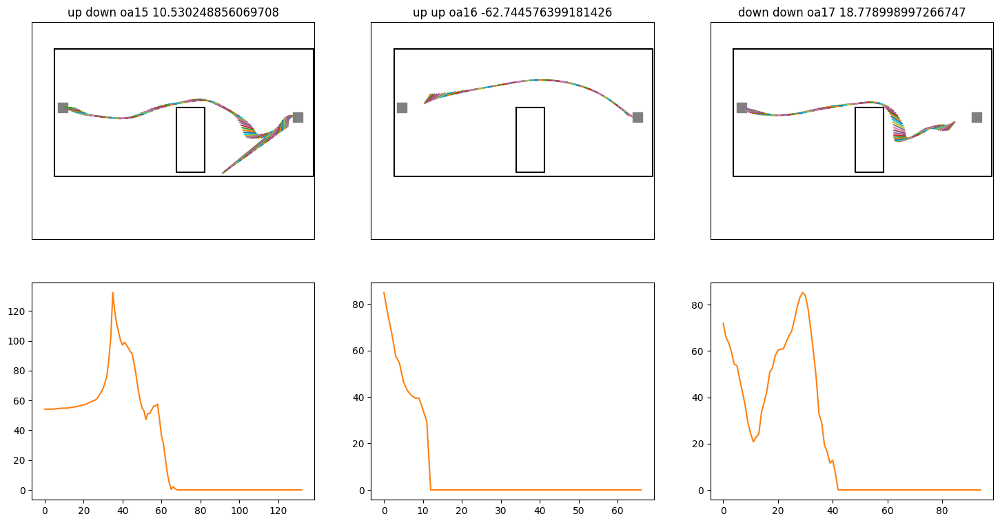

In [816]:
long_short = pd.concat([long_con_nostart,short_con_nostart])
inds = con_switch_turn_ob[con_switch_turn_ob.date_index == 5].sample(2).trials_inds.tolist()



for ind in inds:
    fig,ax = plt.subplots(2,3,figsize=(18,9))
    ax[0,0].set_xticks([])
    ax[0,0].set_yticks([])
    ax[0,1].set_xticks([])
    ax[0,1].set_yticks([])
    ax[0,2].set_xticks([])
    ax[0,2].set_yticks([])
    trials_df = long_short.loc[ind][:3]
    for i in range(3):
        plot_arena(trials_df,ax[0,i],outer=True)
        plot_orginal_obstacle(trials_df,ax[0,i],0)
        ax[0,i].plot((smooth(trials_df.iloc[i].ts_nose_x_cm),smooth(trials_df.iloc[i].ts_spine_x_cm)),(smooth(trials_df.iloc[i].ts_nose_y_cm),smooth(trials_df.iloc[i].ts_spine_y_cm)))
        ax[1,i].plot(trials_df.iloc[i].ts_zero_out_angle_to_corner,color = 'tab:orange')
        ax[0,i].set_title(trials_df.iloc[i].turn_direction + ' '+trials_df.iloc[i].turn_direction_end + ' ' + trials_df.iloc[i].task + str(trials_df.iloc[i].orginal_index) + ' ' + str(trials_df.iloc[i].head_angle[-1]))

<AxesSubplot: xlabel='inital_turn', ylabel='Density'>

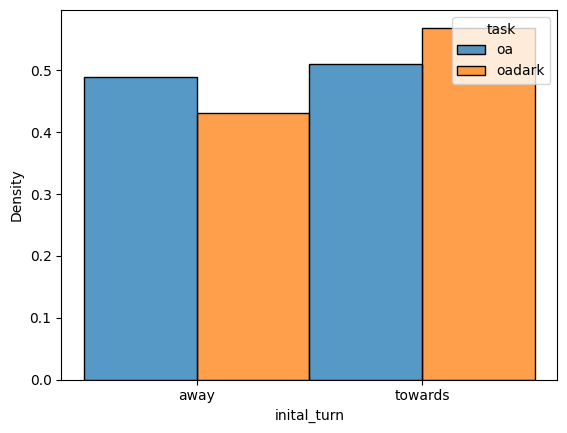

In [125]:
data = con_switch_turn_ob[con_switch_turn_ob.initial_linearity >= .7]
sns.histplot(data=data,x='inital_turn',stat='density',hue ='task',common_norm=False,multiple='dodge')

Text(0.5, 0, 'turn relative to obstacle all')

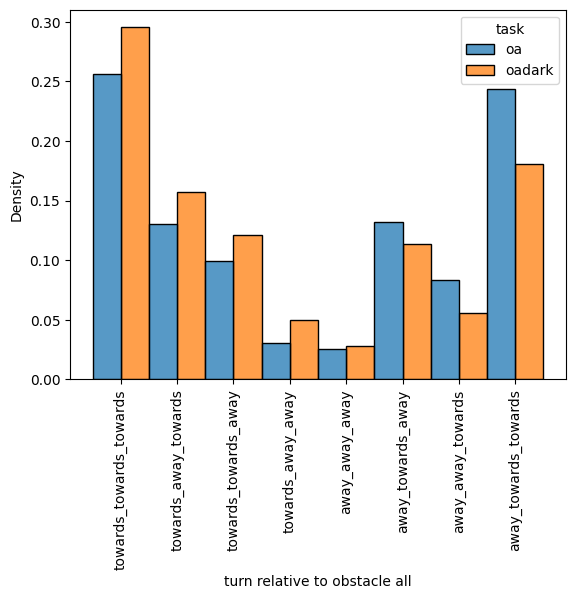

In [22]:
data = con_switch_turn_ob

towards_towards_towards = data[data.switch_type_all == 'towards_towards_towards']
towards_away_towards = data[data.switch_type_all == 'towards_away_towards']
towards_towards_away = data[data.switch_type_all == 'towards_towards_away']
towards_away_away = data[data.switch_type_all == 'towards_away_away']
away_away_away = data[data.switch_type_all == 'away_away_away']
away_towards_away = data[data.switch_type_all == 'away_towards_away']
away_away_towards = data[data.switch_type_all == 'away_away_towards']
away_towards_towards = data[data.switch_type_all == 'away_towards_towards']


data = pd.concat([towards_towards_towards,towards_away_towards,towards_towards_away,towards_away_away,away_away_away,away_towards_away,away_away_towards,away_towards_towards])

sns.histplot(data=data,x='switch_type_all',stat='density',hue ='task',common_norm=False,multiple='dodge')
plt.xticks(rotation=90)
plt.xlabel('turn relative to obstacle all')

Text(0.5, 0, 'turn relative to obstacle 1st - 2nd')

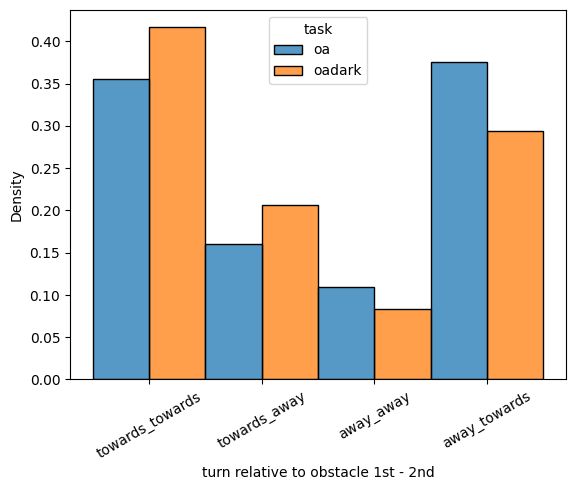

In [23]:
data = con_switch_turn_ob

towards_towards = data[data.switch_sec_trial_type == 'towards_towards']
towards_away = data[data.switch_sec_trial_type == 'towards_away']
away_away = data[data.switch_sec_trial_type == 'away_away']
away_towards = data[data.switch_sec_trial_type == 'away_towards']

data = pd.concat([towards_towards,towards_away,away_away,away_towards])

sns.histplot(data=data,x='switch_sec_trial_type',stat='density',hue ='task',common_norm=False,multiple='dodge')
plt.xticks(rotation=30)
plt.xlabel('turn relative to obstacle 1st - 2nd')

Text(0.5, 0, 'turn relative to obstacle 2nd - 3rd')

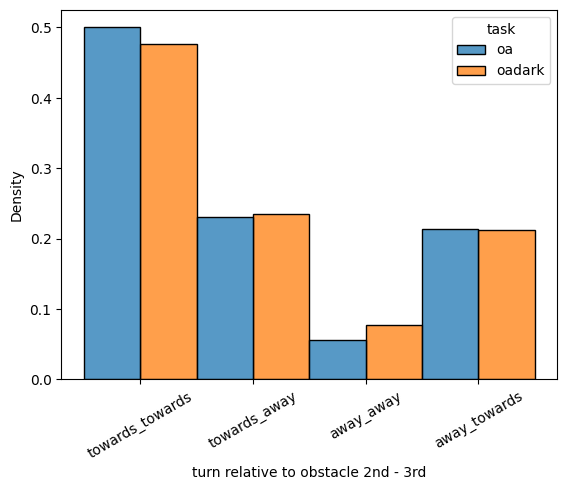

In [25]:
data = con_switch_turn_ob

towards_towards = data[data.switch_third_trial_type == 'towards_towards']
towards_away = data[data.switch_third_trial_type == 'towards_away']
away_away = data[data.switch_third_trial_type == 'away_away']
away_towards = data[data.switch_third_trial_type == 'away_towards']

data = pd.concat([towards_towards,towards_away,away_away,away_towards])

sns.histplot(data=data,x='switch_third_trial_type',stat='density',hue ='task',common_norm=False,multiple='dodge')
plt.xticks(rotation=30)
plt.xlabel('turn relative to obstacle 2nd - 3rd')

In [30]:
con_switch_turn_ob

,date_index,trials,switch_sec_trial_type,switch_sec_trial,switch_third_trial_type,switch_third_trial,task,animal,obstacle_cluster,switch_type_all,inital_turn,initial_linearity,trials_inds
0,0.0,6,towards_towards,0,towards_towards,0,oa,G8CK1LN,0,towards_towards_towards,towards,0.616566,"[3012, 3013, 3014, 3015, 3016, 3017]"
1,0.0,3,towards_away,1,away_towards,1,oa,G8CK1LN,1,towards_away_towards,towards,0.545848,"[2957, 2958, 2959]"
2,0.0,3,towards_away,1,away_towards,1,oa,G8CK1LN,1,towards_away_towards,towards,0.471582,"[2990, 2991, 2992]"
3,0.0,4,away_towards,1,towards_away,1,oa,G8CK1LN,1,away_towards_away,away,0.941291,"[3005, 3006, 3007, 3008]"
4,0.0,3,away_towards,1,towards_away,1,oa,G8CK1LN,1,away_towards_away,away,0.657261,"[3028, 3029, 3030]"
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1904,5.0,3,towards_away,1,away_towards,1,oadark,J704RT,5,towards_away_towards,towards,0.752838,"[11072, 11073, 11074]"
1905,5.0,6,towards_towards,0,towards_towards,0,oadark,J704RT,5,towards_towards_towards,towards,0.786354,"[11092, 11093, 11094, 11095, 11096, 11097]"
1906,5.0,8,towards_away,1,away_away,0,oadark,J704RT,5,towards_away_away,towards,0.753153,"[11117, 11118, 11119, 11120, 11121, 11122, 111..."
1907,5.0,4,away_towards,1,towards_towards,0,oadark,J704RT,5,away_towards_towards,away,0.861609,"[11142, 11143, 11144, 11145]"


([0, 1, 2, 3],
 [Text(0, 0, 'torwards_torwards'),
  Text(1, 0, 'torwards_away'),
  Text(2, 0, 'away_away'),
  Text(3, 0, 'away_torwards')])

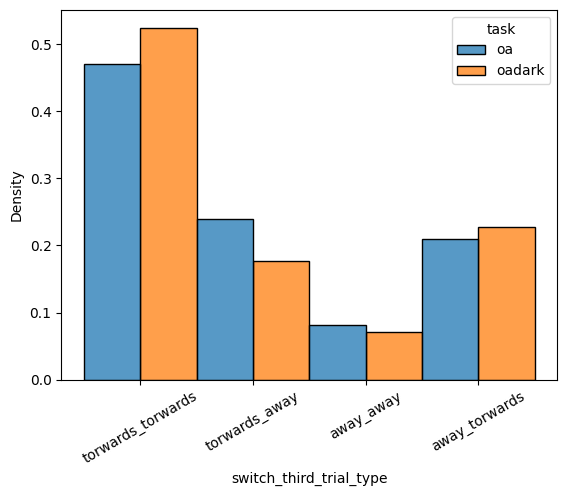

In [419]:
data = con_switch_turn_ob

towards_towards = data[data.switch_third_trial_type == 'torwards_torwards']
towards_away = data[data.switch_third_trial_type == 'torwards_away']
away_away = data[data.switch_third_trial_type == 'away_away']
away_torwards = data[data.switch_third_trial_type == 'away_torwards']

data = pd.concat([towards_towards,towards_away,away_away,away_torwards])
data = data[data.date_index == 0] 

sns.histplot(data=data,x='switch_third_trial_type',stat='density',hue ='task',common_norm=False,multiple='dodge')
plt.xticks(rotation=30)

In [36]:
towards_towards

,date_index,trials,switch_sec_trial_type,switch_sec_trial,switch_third_trial_type,switch_third_trial,task,animal,obstacle_cluster,switch_type_all,inital_turn,initial_linearity,trials_inds


([0, 1, 2, 3],
 [Text(0, 0, 'towards_towards'),
  Text(1, 0, 'towards_away'),
  Text(2, 0, 'away_away'),
  Text(3, 0, 'away_towards')])

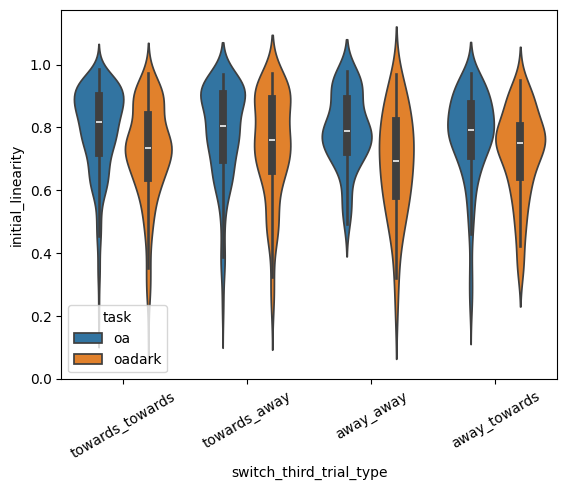

In [37]:
data = con_switch_turn_ob

towards_towards = data[data.switch_third_trial_type == 'towards_towards']
towards_away = data[data.switch_third_trial_type == 'towards_away']
away_away = data[data.switch_third_trial_type == 'away_away']
away_towards = data[data.switch_third_trial_type == 'away_towards']

data = pd.concat([towards_towards,towards_away,away_away,away_towards])


sns.violinplot(data=data,x='switch_third_trial_type',y='initial_linearity',hue ='task')
plt.xticks(rotation=30)

In [43]:
data

,date_index,trials,switch_sec_trial_type,switch_sec_trial,switch_third_trial_type,switch_third_trial,task,animal,obstacle_cluster,switch_type_all,inital_turn,initial_linearity,trials_inds
0,0.0,6,towards_towards,0,towards_towards,0,oa,G8CK1LN,0,towards_towards_towards,towards,0.616566,"[3012, 3013, 3014, 3015, 3016, 3017]"
10,1.0,3,away_towards,1,towards_towards,0,oa,G8CK1LN,0,away_towards_towards,away,0.897883,"[3383, 3384, 3385]"
12,1.0,3,away_towards,1,towards_towards,0,oa,G8CK1LN,0,away_towards_towards,away,0.746941,"[3427, 3428, 3429]"
13,1.0,3,away_towards,1,towards_towards,0,oa,G8CK1LN,0,away_towards_towards,away,0.760543,"[3450, 3451, 3452]"
20,1.0,3,towards_towards,0,towards_towards,0,oa,G8CK1LN,5,towards_towards_towards,towards,0.770428,"[3374, 3375, 3376]"
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1880,4.0,13,away_away,0,away_towards,1,oadark,J704RT,4,away_away_towards,away,0.787428,"[10685, 10686, 10687, 10688, 10689, 10690, 106..."
1881,4.0,3,towards_away,1,away_towards,1,oadark,J704RT,4,towards_away_towards,towards,0.823595,"[10740, 10741, 10742]"
1882,4.0,4,away_away,0,away_towards,1,oadark,J704RT,4,away_away_towards,away,0.471477,"[10765, 10766, 10767, 10768]"
1903,5.0,3,away_away,0,away_towards,1,oadark,J704RT,4,away_away_towards,away,0.744339,"[11167, 11168, 11169]"


([0, 1], [Text(0, 0, 'towards'), Text(1, 0, 'away')])

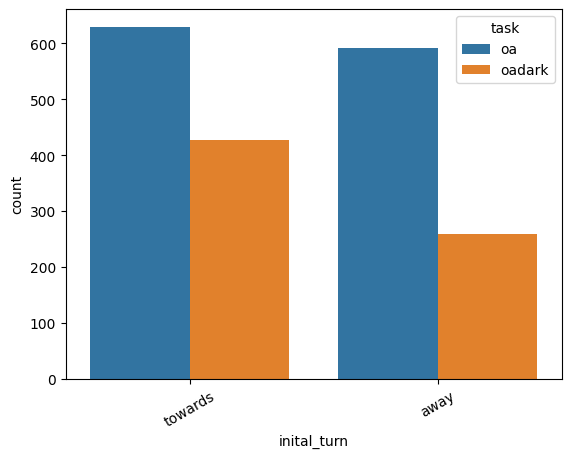

In [46]:
data = con_switch_turn_ob

towards_towards = data[data.switch_third_trial_type == 'towards_towards']
towards_away = data[data.switch_third_trial_type == 'towards_away']
away_away = data[data.switch_third_trial_type == 'away_away']
away_towards = data[data.switch_third_trial_type == 'away_towards']

data = pd.concat([towards_towards,towards_away,away_away,away_towards])


sns.countplot(data=data,x='inital_turn',hue ='task')
plt.xticks(rotation=30)

([0, 1, 2, 3],
 [Text(0, 0, 'torwards_torwards'),
  Text(1, 0, 'torwards_away'),
  Text(2, 0, 'away_away'),
  Text(3, 0, 'away_torwards')])

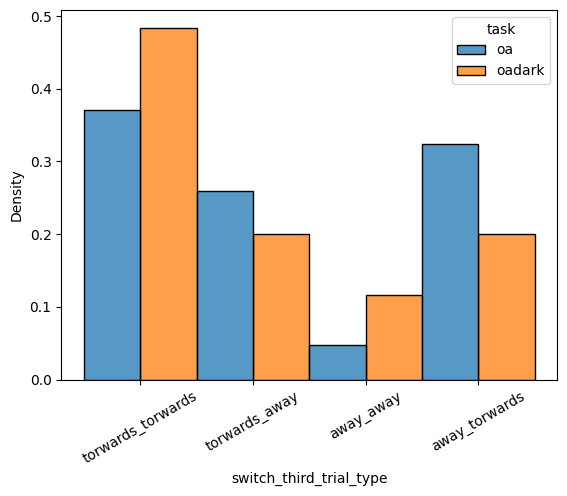

In [420]:
data = con_switch_turn_ob

towards_towards = data[data.switch_third_trial_type == 'torwards_torwards']
towards_away = data[data.switch_third_trial_type == 'torwards_away']
away_away = data[data.switch_third_trial_type == 'away_away']
away_torwards = data[data.switch_third_trial_type == 'away_torwards']

data = pd.concat([towards_towards,towards_away,away_away,away_torwards])
data = data[data.date_index == 5] 

sns.histplot(data=data,x='switch_third_trial_type',stat='density',hue ='task',common_norm=False,multiple='dodge')
plt.xticks(rotation=30)

<AxesSubplot: ylabel='switch_sec_trial'>

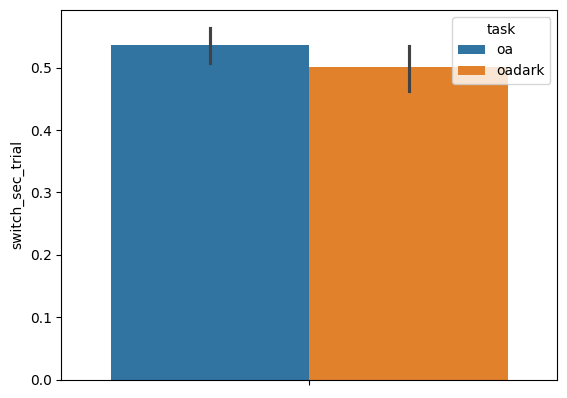

In [381]:
sns.barplot(data= con_switch_turn_ob,y = 'switch_sec_trial',hue = 'task')

<AxesSubplot: xlabel='switch_third_trial_type', ylabel='Density'>

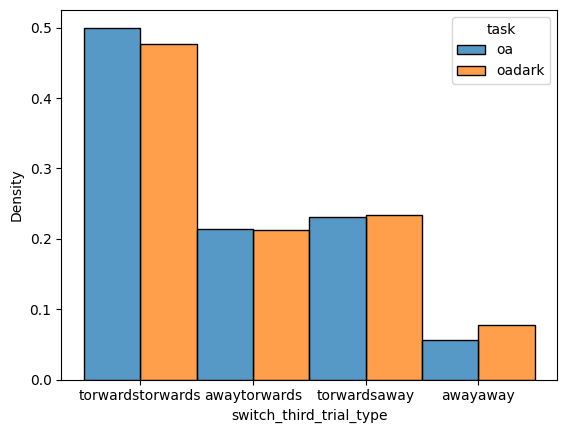

In [380]:
sns.histplot(data=con_switch_turn_ob,x='switch_third_trial_type',stat='density',hue ='task',common_norm=False,multiple='dodge')

<AxesSubplot: xlabel='switch_third_trial_type', ylabel='Density'>

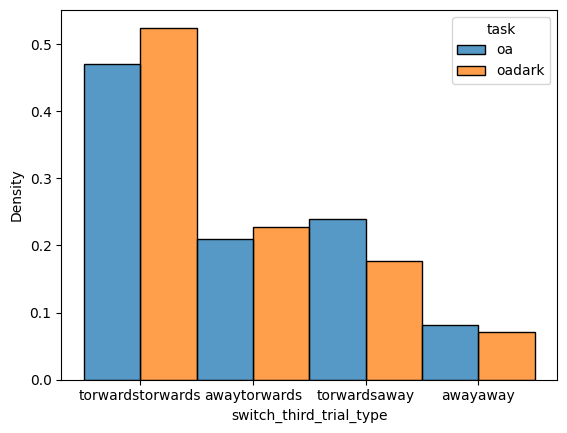

In [401]:

sns.histplot(data=con_switch_turn_ob[con_switch_turn_ob.date_index == 0],x='switch_third_trial_type',stat='density',hue ='task',common_norm=False,multiple='dodge')

<AxesSubplot: xlabel='switch_third_trial_type', ylabel='Density'>

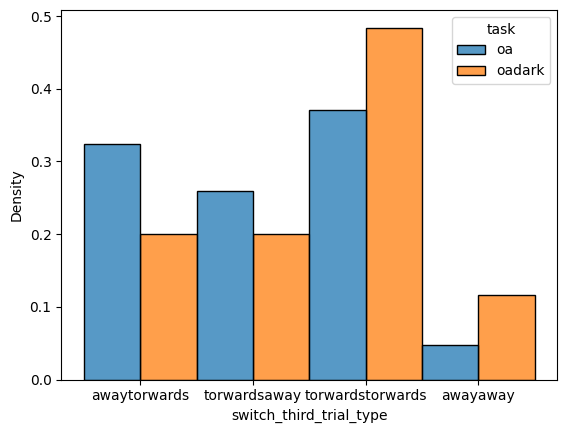

In [400]:

sns.histplot(data=con_switch_turn_ob[con_switch_turn_ob.date_index == 5],x='switch_third_trial_type',stat='density',hue ='task',common_norm=False,multiple='dodge')

<AxesSubplot: ylabel='switch_third_trial'>

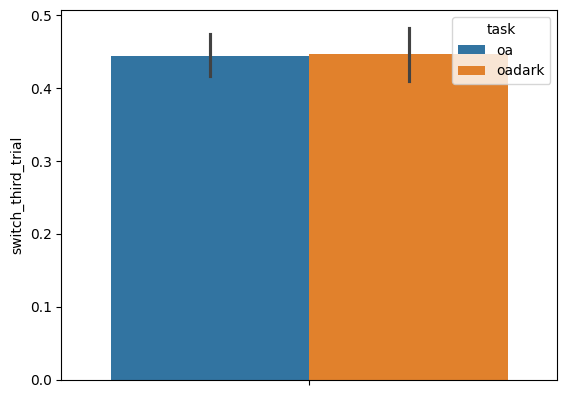

In [383]:
sns.barplot(data= con_switch_turn_ob,y = 'switch_third_trial',hue = 'task')

In [134]:
def con_df_prob_switch(df):
    "check consecutive trials switch to openside"
    dictlists = {key: [] for key in ['date_index','trials','switch','task','animal']}
    long_con, short_con,middle_con = create_df_by_type_nostart(df)
    long_short = pd.concat([long_con,short_con])
    for ani,animal_df in long_short.groupby(['animal']):
        for task,task_df in animal_df.groupby(['task']):
            for date,date_df in task_df.groupby(['date_index']):
                first_trial = date_df[(date_df.consective_type == 0) &(date_df.intial_lateral_error <= -2) &(date_df.distance_at_head_turn >= 0)]
                ind = first_trial.index.to_numpy()+2
                third_trial = long_short.loc[ind.tolist()]
                switch = []
                for ind,row in enumerate(first_trial.start.tolist()):
                    if row == third_trial.start.tolist()[ind]:
                        switch.append(0)
                    else:
                        switch.append(1)
                dictlists['date_index'].append(date)
                dictlists['trials'].append(len(date_df))
                dictlists['switch'].append(sum(switch)/len(first_trial))
                dictlists['task'].append(task)
                dictlists['animal'].append(ani)
    return pd.DataFrame.from_dict(dictlists)



    
    

In [5]:
def lateral_error(df):
    lateral_error_open_corner(df)
    ts_lateral_error_to_target_port(df)

In [198]:
lateral_error(joint_con_df)

In [32]:
def intial_lateral_error(df):
    for ind,row in df.iterrows():
        if type(row.lateral_error)==float:
            df.at[ind,'intial_lateral_error'] = np.nan
        else:
            df.at[ind,'intial_lateral_error'] = row.lateral_error[0]
         
def avg_lateral_error(df):
    for ind,row in df.iterrows():
        if type(row.lateral_error)==float:
            df.at[ind,'avg_lateral_error'] = np.nan
        else:
            df.at[ind,'avg_lateral_error'] = np.nanmean(row.lateral_error[:int(row.obstacle_ind)])
        
        

In [200]:
intial_lateral_error(joint_con_df)
avg_lateral_error(joint_con_df)

In [7]:
intial_lateral_error(joint)
avg_lateral_error(joint)

In [244]:
def con_df_prob_in_way(df):
    "check consecutive trials switch to openside"
    dictlists = {key: [] for key in ['date_index','trials','inway','task','animal','consective_type']}
    #long_con, short_con,middle_con = create_df_by_type_nostart(df)
    #long_short = pd.concat([long_con,short_con])
    data = df 
    data = drop_nans_in_columns(df,'avg_lateral_error')
    for ani,animal_df in data.groupby(['animal']):
        for task,task_df in animal_df.groupby(['task']):
            for date,date_df in task_df.groupby(['date_index']):
                for con,con_df in date_df.groupby(['consective_type']):
                    in_way_list =[]
                    for lateral_error in con_df.avg_lateral_error.tolist():
                        if lateral_error <0:
                            in_way_list.append(1)
                        
                        elif(lateral_error > 0):
                            in_way_list.append(0)                
                    dictlists['date_index'].append(date)
                    dictlists['trials'].append(len(con_df))
                    dictlists['inway'].append(sum(in_way_list)/len(in_way_list))
                    dictlists['task'].append(task)
                    dictlists['animal'].append(ani)
                    dictlists['consective_type'].append(con)
    return pd.DataFrame.from_dict(dictlists)

In [256]:
con_df_prob_in_way= con_df_prob_in_way(joint_con_df)

<AxesSubplot: >

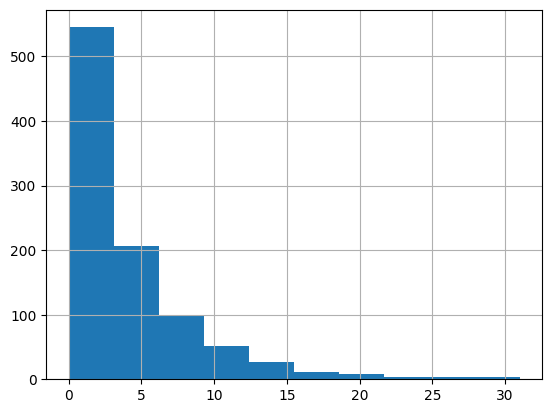

In [257]:
con_df_prob_in_way.consective_type.hist()

In [515]:
def intial_angle_to_corner(df):
    for ind,row in df.iterrows():
        df.at[ind,'intial_angle_to_corner'] = row.ts_zero_out_angle_to_corner[0]

<AxesSubplot: xlabel='consective_type', ylabel='inway'>

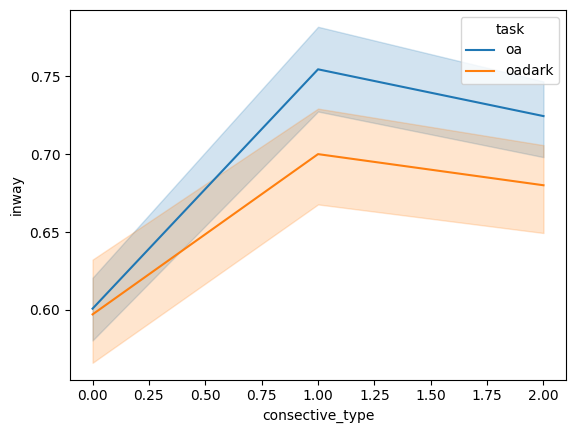

In [215]:
sns.lineplot(data= con_df_prob_in_way[con_df_prob_in_way.consective_type<=2],x = 'consective_type',y ='inway',hue = 'task' )



<AxesSubplot: xlabel='consective_type', ylabel='linearity'>

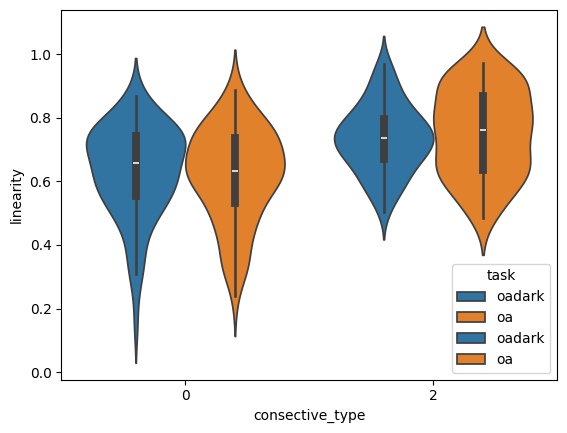

In [672]:
long_short = pd.concat([long_con,short_con])
first_trial = long_short[(long_short.consective_type == 0)&(long_short.date_index == 0)  &(long_short.avg_lateral_error <= -2) &(long_short.distance_at_head_turn >= 0)]
ind = first_trial.index.to_numpy()+2
third_trial = long_short.loc[ind.tolist()]
sns.violinplot(data= first_trial,x = 'consective_type',y = 'linearity',hue = 'task')
sns.violinplot(data= third_trial,x = 'consective_type',y = 'linearity',hue = 'task')

<AxesSubplot: xlabel='consective_type', ylabel='linearity'>

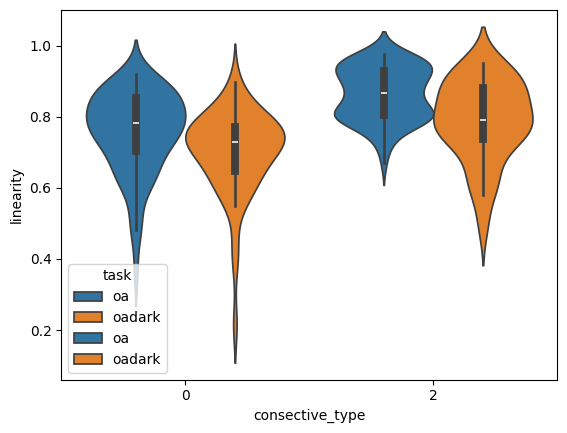

In [675]:
long_short = pd.concat([long_con,short_con])
first_trial = long_short[(long_short.consective_type == 0)&(long_short.date_index == 5)  &(long_short.avg_lateral_error <= -2) &(long_short.distance_at_head_turn >= 0)]
ind = first_trial.index.to_numpy()+2
third_trial = long_short.loc[ind.tolist()]
sns.violinplot(data= first_trial,x = 'consective_type',y = 'linearity',hue = 'task')
sns.violinplot(data= third_trial,x = 'consective_type',y = 'linearity',hue = 'task')

<AxesSubplot: xlabel='consective_type', ylabel='distance_at_head_turn'>

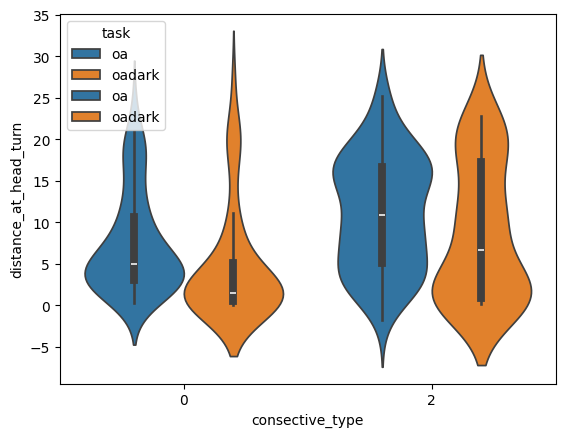

In [680]:
long_short = pd.concat([long_con,short_con])
first_trial = long_short[(long_short.consective_type == 0)&(long_short.date_index == 5)  &(long_short.avg_lateral_error <= -2) &(long_short.distance_at_head_turn >= 0)]
ind = first_trial.index.to_numpy()+2
third_trial = long_short.loc[ind.tolist()]
sns.violinplot(data= first_trial,x = 'consective_type',y = 'distance_at_head_turn',hue = 'task')
sns.violinplot(data= third_trial,x = 'consective_type',y = 'distance_at_head_turn',hue = 'task')

<AxesSubplot: xlabel='consective_type', ylabel='avg_lateral_error'>

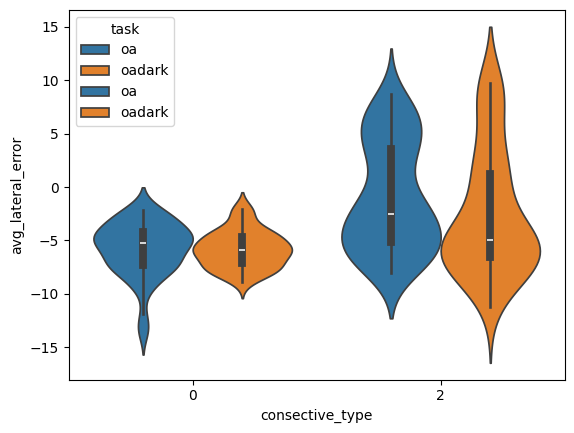

In [677]:
long_short = pd.concat([long_con,short_con])
first_trial = long_short[(long_short.consective_type == 0)&(long_short.date_index == 5)  &(long_short.avg_lateral_error <= -2) &(long_short.distance_at_head_turn >= 0)]
ind = first_trial.index.to_numpy()+2
third_trial = long_short.loc[ind.tolist()]
sns.violinplot(data= first_trial,x = 'consective_type',y = 'avg_lateral_error',hue = 'task')
sns.violinplot(data= third_trial,x = 'consective_type',y = 'avg_lateral_error',hue = 'task')

<AxesSubplot: xlabel='consective_type', ylabel='linearity'>

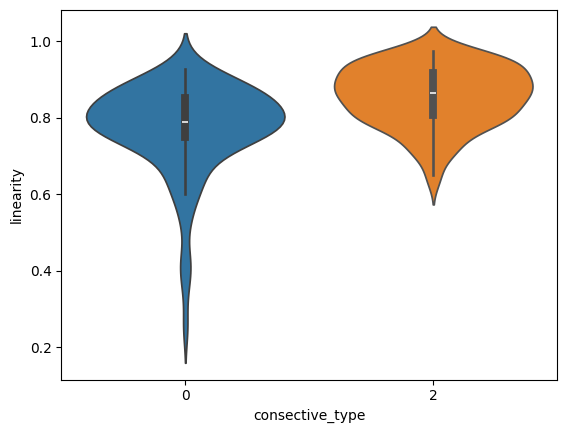

In [670]:
long_short = pd.concat([long_con,short_con])
first_trial = long_short[(long_short.task == 'oa')&(long_short.consective_type == 0)&(long_short.date_index == 6)  &(long_short.avg_lateral_error <= -2) &(long_short.distance_at_head_turn >= 0)]
ind = first_trial.index.to_numpy()+2
third_trial = long_short.loc[ind.tolist()]
sns.violinplot(data= first_trial,x = 'consective_type',y = 'linearity')
sns.violinplot(data= third_trial,x = 'consective_type',y = 'linearity')
#plt.gca().invert_yaxis()

<AxesSubplot: xlabel='consective_type', ylabel='linearity'>

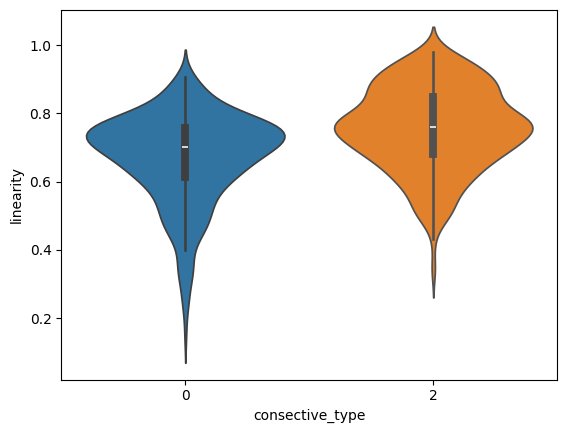

In [669]:
long_short = pd.concat([long_con,short_con])
first_trial = long_short[(long_short.task == 'oadark')&(long_short.consective_type == 0) &(long_short.avg_lateral_error <= -2) &(long_short.distance_at_head_turn >= 0)]
ind = first_trial.index.to_numpy()+2
third_trial = long_short.loc[ind.tolist()]
sns.violinplot(data= first_trial,x = 'consective_type',y = 'linearity')
sns.violinplot(data= third_trial,x = 'consective_type',y = 'linearity')
#plt.gca().invert_yaxis()

<AxesSubplot: xlabel='consective_type', ylabel='distance_at_head_turn'>

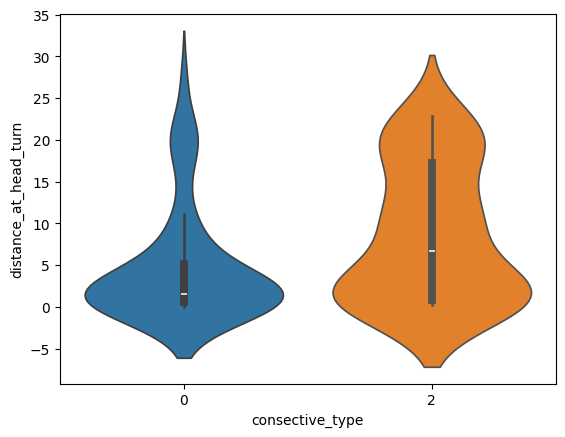

In [383]:
long_short = pd.concat([long_con,short_con])
first_trial = long_short[(long_short.task == 'oadark')&(long_short.consective_type == 0)&(long_short.date_index == 5)  &(long_short.avg_lateral_error <= -2) &(long_short.distance_at_head_turn >= 0)]
ind = first_trial.index.to_numpy()+2
third_trial = long_short.loc[ind.tolist()]
sns.violinplot(data= first_trial,x = 'consective_type',y = 'distance_at_head_turn')
sns.violinplot(data= third_trial,x = 'consective_type',y = 'distance_at_head_turn')
#plt.gca().invert_yaxis()

<AxesSubplot: xlabel='consective_type', ylabel='distance_at_head_turn'>

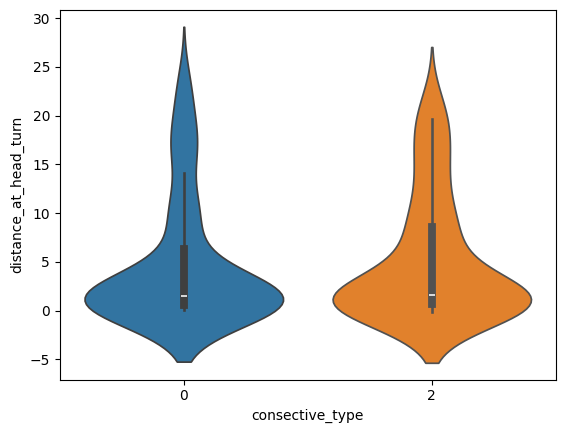

In [384]:
long_short = pd.concat([long_con,short_con])
first_trial = long_short[(long_short.task == 'oadark')&(long_short.consective_type == 0)&(long_short.date_index == 0)  &(long_short.avg_lateral_error <= -2) &(long_short.distance_at_head_turn >= 0)]
ind = first_trial.index.to_numpy()+2
third_trial = long_short.loc[ind.tolist()]
sns.violinplot(data= first_trial,x = 'consective_type',y = 'distance_at_head_turn')
sns.violinplot(data= third_trial,x = 'consective_type',y = 'distance_at_head_turn')

<AxesSubplot: xlabel='consective_type', ylabel='avg_lateral_error'>

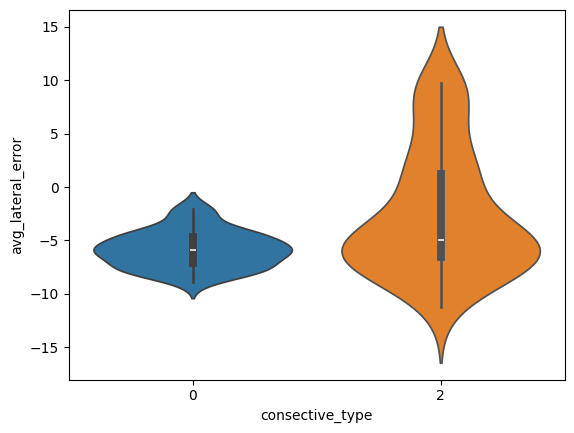

In [385]:
long_short = pd.concat([long_con,short_con])
first_trial = long_short[(long_short.task == 'oadark')&(long_short.consective_type == 0)&(long_short.date_index == 5)  &(long_short.avg_lateral_error <= -2) &(long_short.distance_at_head_turn >= 0)]
ind = first_trial.index.to_numpy()+2
third_trial = long_short.loc[ind.tolist()]
sns.violinplot(data= first_trial,x = 'consective_type',y = 'avg_lateral_error')
sns.violinplot(data= third_trial,x = 'consective_type',y = 'avg_lateral_error')

<AxesSubplot: xlabel='consective_type', ylabel='avg_lateral_error'>

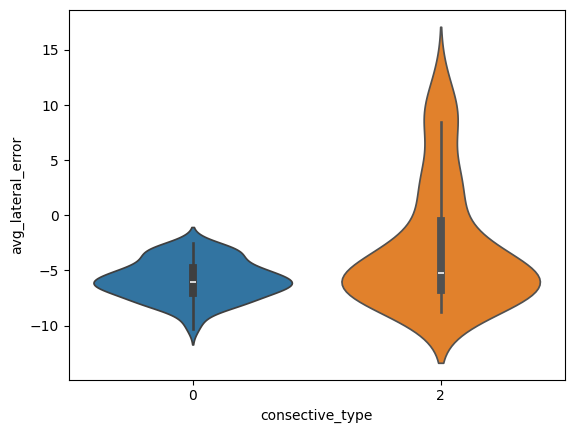

In [386]:
long_short = pd.concat([long_con,short_con])
first_trial = long_short[(long_short.task == 'oadark')&(long_short.consective_type == 0)&(long_short.date_index == 0)  &(long_short.avg_lateral_error <= -2) &(long_short.distance_at_head_turn >= 0)]
ind = first_trial.index.to_numpy()+2
third_trial = long_short.loc[ind.tolist()]
sns.violinplot(data= first_trial,x = 'consective_type',y = 'avg_lateral_error')
sns.violinplot(data= third_trial,x = 'consective_type',y = 'avg_lateral_error')

In [401]:
def get_head_angle(df):
        for ind, row in df.iterrows():
            leftear_x = row['ts_leftear_x_cm']
            leftear_y = row['ts_leftear_y_cm']
            rightear_x = row['ts_rightear_x_cm']
            rightear_y = row['ts_rightear_y_cm']
            nose_x = row['ts_nose_x_cm']
            nose_y = row['ts_nose_y_cm']
            angs = []
            if row.odd == 'left':
                for step in range(len(leftear_x)):
                    ang = np.arctan2(np.mean([leftear_y[step],rightear_y[step]])-nose_y[step],(np.mean([leftear_x[step],rightear_x[step]])-nose_x[step])*-1)
                    angs.append(ang)
            else:
                for step in range(len(leftear_x)):
                    ang = np.arctan2(np.mean([leftear_y[step],rightear_y[step]])-nose_y[step],(np.mean([leftear_x[step],rightear_x[step]])-nose_x[step]))
                    angs.append(ang)

            df.at[ind, 'head_angle'] = gaussian_filter(np.array(np.degrees(angs)),3,mode = 'reflect').astype(object)
def angular_velocity_head(df):
    for ind,row in df.iterrows():
        #filtered_head_angle = gaussian_filter(row.head_angle.astype(float),2)
        head_angle_velocity = calculate_angular_velocity(row.head_angle.astype(float),60).astype(object)
        df.at[ind,'head_angle_velocity'] = head_angle_velocity
        df.at[ind,'intial_head_angle_velocity'] = head_angle_velocity.astype(float)[np.isfinite(head_angle_velocity.astype(float))][0]

def calculate_angular_velocity(angles, frame_rate):
    # Convert angles to radians if they are given in degrees
    angles = np.radians(angles)

    # Calculate angular velocity using NumPy's array operations
    angular_displacements = np.diff(angles)
    angular_velocities = angular_displacements / (1 / frame_rate)
    np.angle(angular_velocities.astype(float))
    return angular_velocities

In [402]:
def turn_direction(df):
    for ind,row in df.iterrows():
        if np.nanmean(row.head_angle_velocity[:5]) < 0:
            df.at[ind,'turn_direction'] = 'up'
        elif np.nanmean(row.head_angle_velocity[:5])> 0:
            df.at[ind,'turn_direction'] = 'down'

def turn_to_obstacle(df):
    for ind,row in df.iterrows():
        if (row.obstacle_cluster ==  2) or  (row.obstacle_cluster ==  3):
            df.at[ind,'turn_to_obstacle'] = 'middle'
        elif (row.obstacle_cluster ==  0) or  (row.obstacle_cluster ==  1):
            if row.turn_direction == 'up':
                df.at[ind,'turn_to_obstacle'] = 'torwards'
            else:
                df.at[ind,'turn_to_obstacle'] = 'away'
        elif (row.obstacle_cluster ==  4) or  (row.obstacle_cluster ==  5):
            if row.turn_direction == 'up':
                df.at[ind,'turn_to_obstacle'] = 'away'
            else:
                df.at[ind,'turn_to_obstacle'] = 'torwards'




In [403]:
intial_lateral_error(joint)
avg_lateral_error(joint)
get_head_angle(joint)
angular_velocity_head(joint)
turn_direction(joint)
turn_to_obstacle(joint)

In [149]:
redo_ts_trace(joint)

corner
port


In [167]:
joint[joint.task == 'oa'].to_hdf(r"D:\obstacle_avoidance\metadata\SFN\data\light_91024.h5",'w')
joint[joint.task == 'oadark'].to_hdf(r"D:\obstacle_avoidance\metadata\SFN\data\dark_91024.h5",'w')

In [404]:
joint[joint.task == 'oa'].to_hdf(r"D:\obstacle_avoidance\metadata\SFN\data\light_91024_1.h5",'w')
joint[joint.task == 'oadark'].to_hdf(r"D:\obstacle_avoidance\metadata\SFN\data\dark_91024_1.h5",'w')

In [405]:
con_df = create_consective_df_new(joint)

In [406]:
long_con_nostart,short_con_nostart,middle_con_nostart = create_df_by_type_nostart(con_df)

In [407]:
long_nostart,short_nostart,middle_nostart = create_df_by_type_nostart(joint)

<AxesSubplot: xlabel='turn_direction', ylabel='Density'>

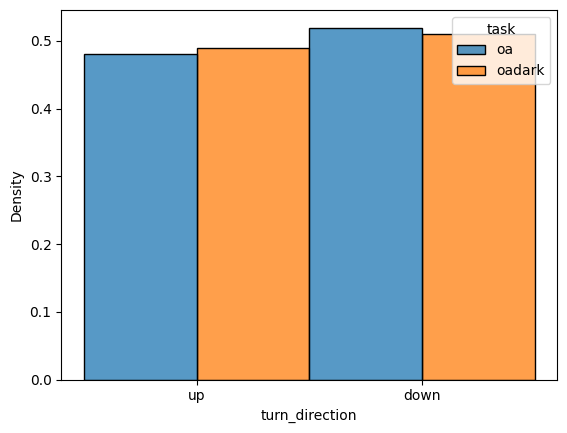

In [408]:
data = joint
#data = data[data.consective_type==2]
sns.histplot(data=data,x='turn_direction',stat='density',hue ='task',common_norm=False,multiple='dodge')

<AxesSubplot: xlabel='turn_to_obstacle', ylabel='Density'>

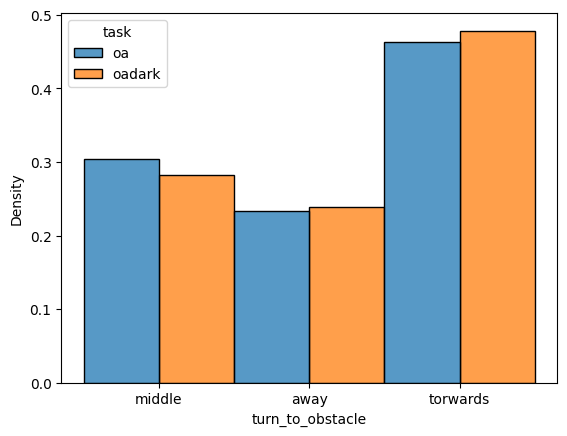

In [409]:
data = joint
#data = data[data.consective_type==2]
sns.histplot(data=data,x='turn_to_obstacle',stat='density',hue ='task',common_norm=False,multiple='dodge')

<AxesSubplot: xlabel='turn_to_obstacle', ylabel='Density'>

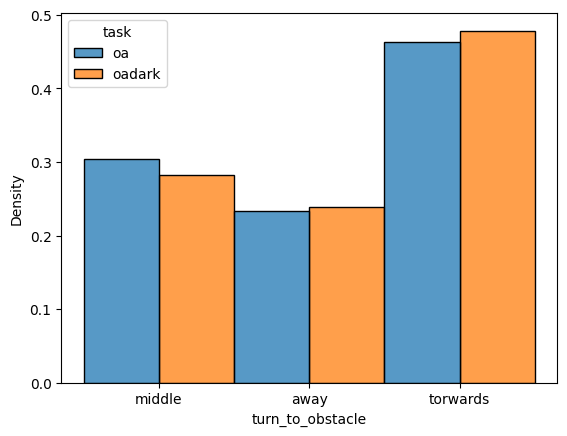

In [1233]:
data = joint
#data = data[data.consective_type==2]
sns.histplot(data=data,x='turn_to_obstacle',stat='density',hue ='task',common_norm=False,multiple='dodge')

<AxesSubplot: xlabel='turn_to_obstacle', ylabel='Density'>

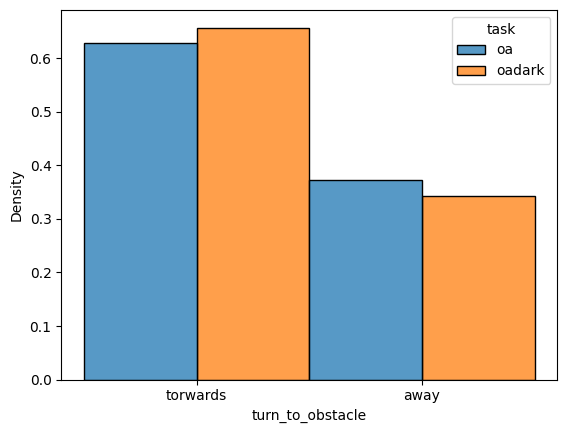

In [410]:
data = pd.concat([long_nostart])
#data = data[data.consective_type==2]
sns.histplot(data=data,x='turn_to_obstacle',stat='density',hue ='task',common_norm=False,multiple='dodge')

In [873]:
def con_df_prob_in_way(df):
    "check consecutive trials switch to openside"
    dictlists = {key: [] for key in ['date_index','trials','inway','task','animal','consective_type']}
    #long_con, short_con,middle_con = create_df_by_type_nostart(df)
    #long_short = pd.concat([long_con,short_con])
    data = df 
    data = drop_nans_in_columns(df,'avg_lateral_error')
    for ani,animal_df in data.groupby(['animal']):
        for task,task_df in animal_df.groupby(['task']):
            for date,date_df in task_df.groupby(['date_index']):
                for con,con_df in date_df.groupby(['consective_type']):
                    in_way_list =[]
                    for turn_to_obstacle in con_df.turn_to_obstacle.tolist():
                        if turn_to_obstacle =='torwards':
                            in_way_list.append(1)
                        
                        elif turn_to_obstacle =='away':
                            in_way_list.append(0)                
                    dictlists['date_index'].append(date)
                    dictlists['trials'].append(len(con_df))
                    dictlists['inway'].append(sum(in_way_list)/len(in_way_list))
                    dictlists['task'].append(task)
                    dictlists['animal'].append(ani)
                    dictlists['consective_type'].append(con)
    return pd.DataFrame.from_dict(dictlists)

In [992]:
def con_df_prob_switch(df):
    "check consecutive trials switch to openside"
    dictlists = {key: [] for key in ['date_index','trials','switch','task','animal']}
    long_con, short_con,middle_con = create_df_by_type_nostart(df)
    long_short = pd.concat([long_con,short_con])
    for ani,animal_df in long_short.groupby(['animal']):
        for task,task_df in animal_df.groupby(['task']):
            for date,date_df in task_df.groupby(['date_index']):
                first_trial = date_df[(date_df.consective_type == 0) &(date_df.intial_lateral_error <= -3) &(date_df.distance_at_head_turn >= 0)]
                ind = first_trial.index.to_numpy()+2
                third_trial = long_short.loc[ind.tolist()]
                switch = []
                for ind,row in enumerate(first_trial.turn_to_obstacle.tolist()):
                    if row == third_trial.turn_to_obstacle.tolist()[ind]:
                        switch.append(0)
                    else:
                        switch.append(1)
                dictlists['date_index'].append(date)
                dictlists['trials'].append(len(date_df))
                dictlists['switch'].append(sum(switch)/len(first_trial))
                dictlists['task'].append(task)
                dictlists['animal'].append(ani)
    return pd.DataFrame.from_dict(dictlists)

<AxesSubplot: xlabel='turn_direction', ylabel='Density'>

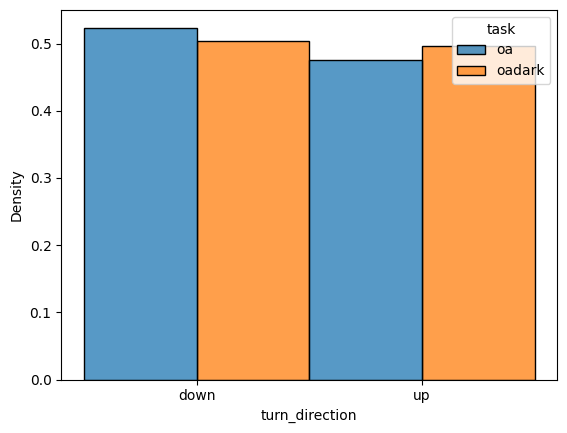

In [7]:
data = con_df
#data = data[data.consective_type==2]
sns.histplot(data=data,x='turn_direction',stat='density',hue ='task',common_norm=False,multiple='dodge')

<AxesSubplot: xlabel='turn_direction', ylabel='Density'>

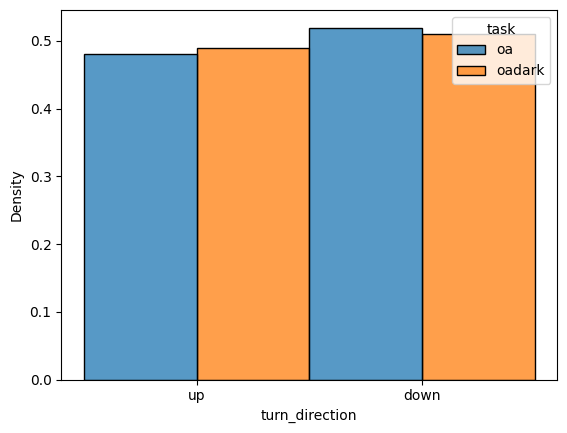

In [414]:
data = joint
#data = data[data.consective_type==2]
sns.histplot(data=data,x='turn_direction',stat='density',hue ='task',common_norm=False,multiple='dodge')

<AxesSubplot: xlabel='turn_to_obstacle', ylabel='Density'>

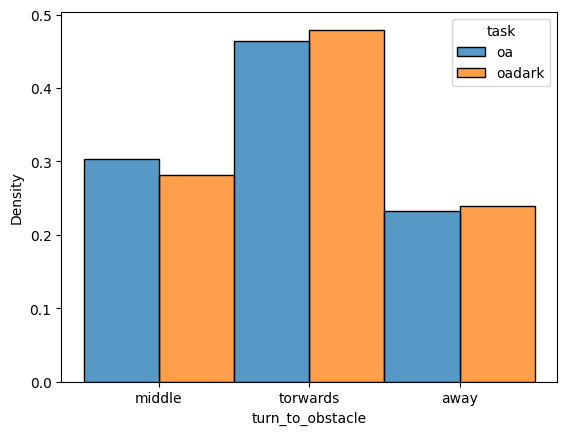

In [8]:
data = joint
#data = data[data.consective_type==2]
sns.histplot(data=data,x='turn_to_obstacle',stat='density',hue ='task',common_norm=False,multiple='dodge')

<AxesSubplot: xlabel='turn_direction', ylabel='Density'>

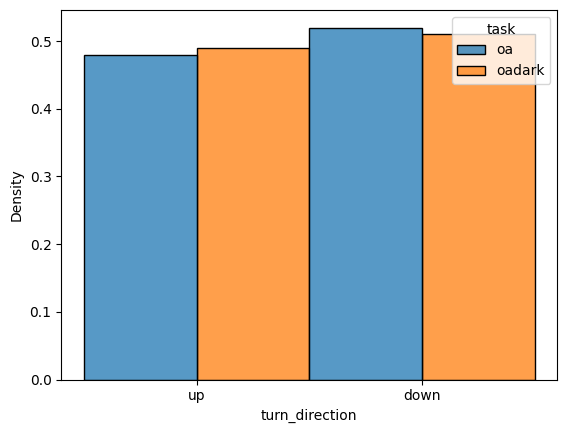

In [9]:
data = joint
#data = data[data.consective_type==2]
sns.histplot(data=data,x='turn_direction',stat='density',hue ='task',common_norm=False,multiple='dodge')

<AxesSubplot: xlabel='turn_to_obstacle', ylabel='Density'>

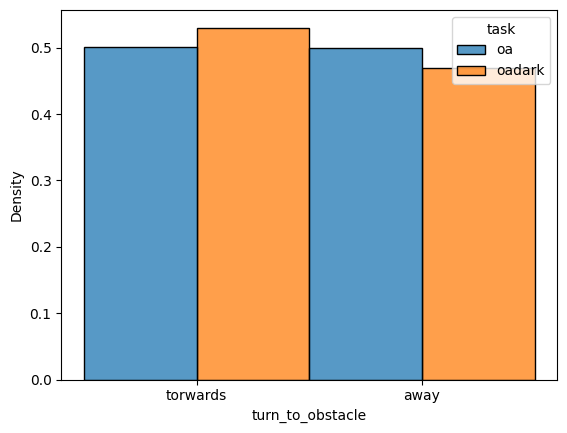

In [9]:
data = pd.concat([long_con_nostart,short_con_nostart])
data = data[(data.consective_type ==0) & (data.obstacle_cross ==True)& (data.linearity >.7)]
sns.histplot(data=data,x='turn_to_obstacle',stat='density',hue ='task',common_norm=False,multiple='dodge')

<AxesSubplot: xlabel='turn_to_obstacle', ylabel='Density'>

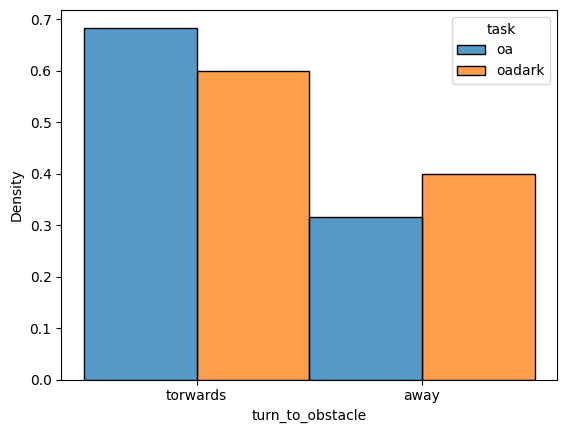

In [10]:
data = pd.concat([long_con_nostart,short_con_nostart])
data = data[(data.consective_type ==2) & (data.obstacle_cross ==True)& (data.linearity >.7)]
sns.histplot(data=data,x='turn_to_obstacle',stat='density',hue ='task',common_norm=False,multiple='dodge')

<AxesSubplot: xlabel='turn_to_obstacle', ylabel='Density'>

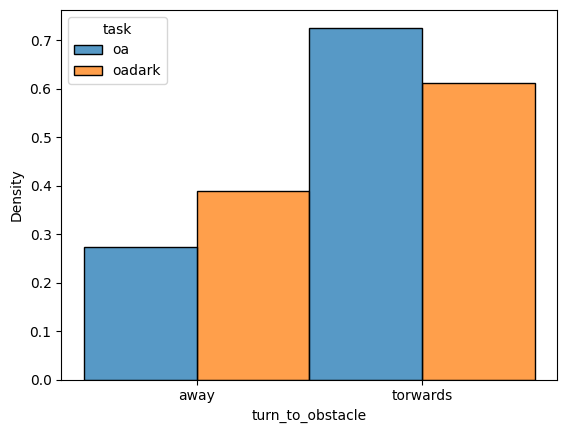

In [11]:
data = pd.concat([long_con_nostart,short_con_nostart])
data = data[(data.consective_type ==3) & (data.obstacle_cross ==True)& (data.linearity >.7)]
sns.histplot(data=data,x='turn_to_obstacle',stat='density',hue ='task',common_norm=False,multiple='dodge')

In [ ]:
sns.barplot(data = data,)

(0.0, 0.8)

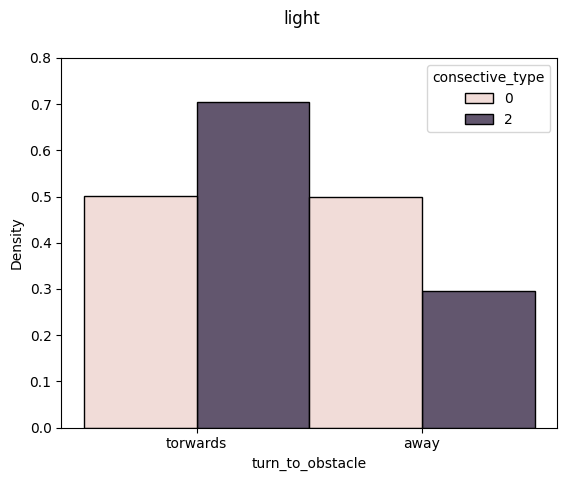

In [90]:
data = pd.concat([long_con_nostart,short_con_nostart])
data = data[(data.consective_type ==2) | (data.consective_type ==0) & (data.task =='oa')& (data.obstacle_cross ==True)& (data.linearity >.7)]
sns.histplot(data=data,x='turn_to_obstacle',stat='density',hue ='consective_type',common_norm=False,multiple='dodge')
plt.suptitle('light')
plt.ylim(0,.8)

In [18]:
sum(data.turn_to_obstacle == 'torwards')/len(data)

0.6511437908496732

In [40]:
np.array([first_porp,sec_porp,third_porp])

array([0.48148148, 0.67741935, 0.41935484])

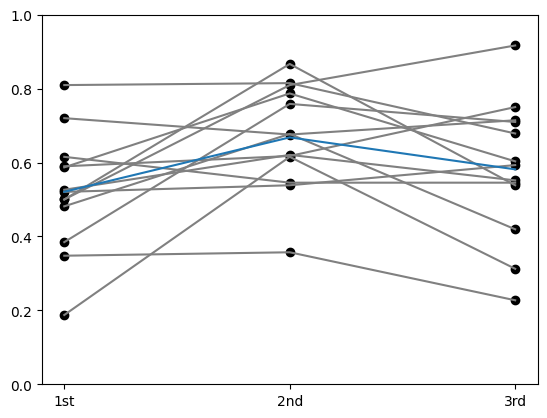

In [44]:
data = pd.concat([long_con_nostart,short_con_nostart])
data = data[(data.consective_type <=2)  & (data.task =='oadark')& (data.obstacle_cross ==True)& (data.linearity >.7)]
fig, ax = plt.subplots()
ax.set_xticks([0,1,2])
ax.set_xticklabels(['1st','2nd','3rd'])
ax.set_ylim(0,1)
animal_trace = []

for ani,ani_df in data.groupby(['animal']):
    first = ani_df[ani_df.consective_type ==0]
    first_porp = sum(first.turn_to_obstacle == 'torwards')/len(first)
    ax.scatter(0,first_porp,c = 'black')
    sec = ani_df[ani_df.consective_type ==1]
    sec_porp = sum(sec.turn_to_obstacle == 'torwards')/len(sec)
    ax.scatter(1,sec_porp,c = 'black')
    third = ani_df[ani_df.consective_type ==2]
    third_porp = sum(third.turn_to_obstacle == 'torwards')/len(third)
    ax.scatter(2,third_porp,c = 'black')
    ax.plot((0,1,2),(first_porp,sec_porp,third_porp),c = 'grey')
    animal_trace.append(np.array([first_porp,sec_porp,third_porp]))
plt.plot((0,1,2),np.mean(np.asarray(animal_trace),axis=0))


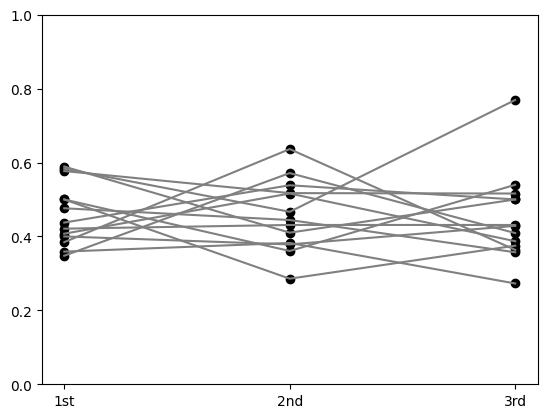

In [46]:
data = pd.concat([long_con_nostart,short_con_nostart])
data = data[(data.consective_type <=2)  & (data.task =='oadark')& (data.obstacle_cross ==True)& (data.linearity >.7)]
fig, ax = plt.subplots()
ax.set_xticks([0,1,2])
ax.set_xticklabels(['1st','2nd','3rd'])
ax.set_ylim(0,1)

for ani,ani_df in data.groupby(['animal']):
    first = ani_df[ani_df.consective_type ==0]
    first_porp = sum(first.turn_direction == 'up')/len(first)
    ax.scatter(0,first_porp,c = 'black')
    sec = ani_df[ani_df.consective_type ==1]
    sec_porp = sum(sec.turn_direction == 'up')/len(sec)
    ax.scatter(1,sec_porp,c = 'black')
    third = ani_df[ani_df.consective_type ==2]
    third_porp = sum(third.turn_direction == 'up')/len(third)
    ax.scatter(2,third_porp,c = 'black')
    ax.plot((0,1,2),(first_porp,sec_porp,third_porp),c = 'grey')


In [ ]:
create_color_dict()

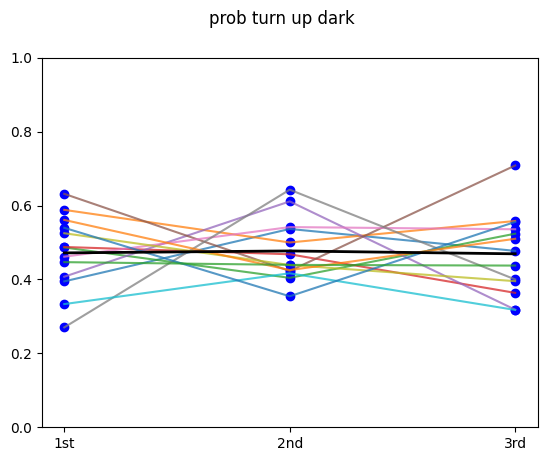

In [139]:
data = pd.concat([con_df])
data = data[(data.consective_type <=2)  & (data.task =='oadark')& (data.obstacle_cross ==True)& (data.linearity >.7)]
color_dict = create_color_dict(data,'animal','tab10')
fig, ax = plt.subplots()
ax.set_xticks([0,1,2])
ax.set_xticklabels(['1st','2nd','3rd'])
ax.set_ylim(0,1)
fig.suptitle('prob turn up dark')
animal_trace = []

for ani,ani_df in data.groupby(['animal']):
    
    first = ani_df[ani_df.consective_type ==0]
    first_porp = sum(first.turn_direction == 'up')/len(first)
    ax.scatter(0,first_porp,c = 'blue')
    sec = ani_df[ani_df.consective_type ==1]
    sec_porp = sum(sec.turn_direction == 'up')/len(sec)
    ax.scatter(1,sec_porp,c = 'blue')
    third = ani_df[ani_df.consective_type ==2]
    third_porp = sum(third.turn_direction == 'up')/len(third)
    ax.scatter(2,third_porp,c = 'blue')
    ax.plot((0,1,2),(first_porp,sec_porp,third_porp),c = color_dict.get(ani), alpha = .75)
    animal_trace.append(np.array([first_porp,sec_porp,third_porp]))
plt.plot((0,1,2),np.mean(np.asarray(animal_trace),axis=0),c = 'black',linewidth=2.0)

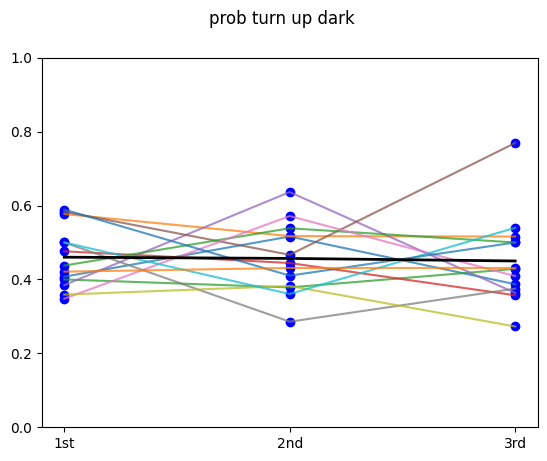

In [138]:
data = pd.concat([long_con_nostart,short_con_nostart])
data = data[(data.consective_type <=2)  & (data.task =='oadark')& (data.obstacle_cross ==True)& (data.linearity >.7)]
color_dict = create_color_dict(data,'animal','tab10')
fig, ax = plt.subplots()
ax.set_xticks([0,1,2])
ax.set_xticklabels(['1st','2nd','3rd'])
ax.set_ylim(0,1)
fig.suptitle('prob turn up dark')
animal_trace = []

for ani,ani_df in data.groupby(['animal']):
    
    first = ani_df[ani_df.consective_type ==0]
    first_porp = sum(first.turn_direction == 'up')/len(first)
    ax.scatter(0,first_porp,c = 'blue')
    sec = ani_df[ani_df.consective_type ==1]
    sec_porp = sum(sec.turn_direction == 'up')/len(sec)
    ax.scatter(1,sec_porp,c = 'blue')
    third = ani_df[ani_df.consective_type ==2]
    third_porp = sum(third.turn_direction == 'up')/len(third)
    ax.scatter(2,third_porp,c = 'blue')
    ax.plot((0,1,2),(first_porp,sec_porp,third_porp),c = color_dict.get(ani), alpha = .75)
    animal_trace.append(np.array([first_porp,sec_porp,third_porp]))
plt.plot((0,1,2),np.mean(np.asarray(animal_trace),axis=0),c = 'black',linewidth=2.0)

G8CK1LN 123
G8CK1LN 123 [0.39473684210526316, 0.5121951219512195, 0.29545454545454547]
G8CK1LT 119
G8CK1LT 119 [0.3235294117647059, 0.5476190476190477, 0.5116279069767442]
G8CK1RT 126
G8CK1RT 126 [0.4864864864864865, 0.574468085106383, 0.5476190476190477]
G8CK1TT 132
G8CK1TT 132 [0.4146341463414634, 0.5106382978723404, 0.4318181818181818]
G8CKLN 85
G8CKLN 85 [0.2962962962962963, 0.3611111111111111, 0.3181818181818182]
G8CKLT 69
G8CKLT 69 [0.3157894736842105, 0.5, 0.2916666666666667]
G8CKRN 78
G8CKRN 78 [0.15384615384615385, 0.3333333333333333, 0.17857142857142858]
G8CKRT 100
G8CKRT 100 [0.21621621621621623, 0.17857142857142858, 0.14285714285714285]
G8CKTT 124
G8CKTT 124 [0.275, 0.43902439024390244, 0.5813953488372093]
J704LN 165
J704LN 165 [0.4444444444444444, 0.5, 0.5714285714285714]
J704LT 223
J704LT 223 [0.4444444444444444, 0.6075949367088608, 0.4691358024691358]
J704NN 269
J704NN 269 [0.47560975609756095, 0.4942528735632184, 0.53]
J704RT 177
J704RT 177 [0.425531914893617, 0.5454545

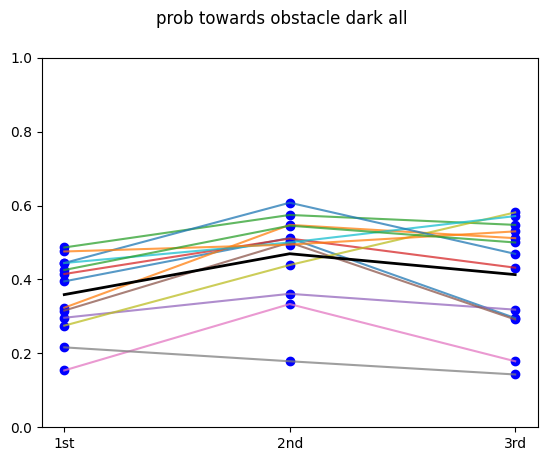

In [141]:
data = pd.concat([con_df])
data = data[(data.consective_type <=2)  & (data.task =='oadark')& (data.obstacle_cross ==True)& (data.linearity >.7)]
color_dict = create_color_dict(data,'animal','tab10')
fig, ax = plt.subplots()
ax.set_xticks([0,1,2])
ax.set_xticklabels(['1st','2nd','3rd'])
ax.set_ylim(0,1)
fig.suptitle('prob towards obstacle dark all')
animal_trace = []

for ani,ani_df in data.groupby(['animal']):
    print(ani,len(ani_df))
    
    first = ani_df[ani_df.consective_type ==0]
    first_porp = sum(first.turn_to_obstacle == 'torwards')/len(first)
    ax.scatter(0,first_porp,c = 'blue')
    sec = ani_df[ani_df.consective_type ==1]
    sec_porp = sum(sec.turn_to_obstacle == 'torwards')/len(sec)
    ax.scatter(1,sec_porp,c = 'blue')
    third = ani_df[ani_df.consective_type ==2]
    third_porp = sum(third.turn_to_obstacle == 'torwards')/len(third)
    ax.scatter(2,third_porp,c = 'blue')
    ax.plot((0,1,2),(first_porp,sec_porp,third_porp),c = color_dict.get(ani), alpha = .75)
    print(ani,len(ani_df),[first_porp,sec_porp,third_porp])
    animal_trace.append(np.array([first_porp,sec_porp,third_porp]))
plt.plot((0,1,2),np.mean(np.asarray(animal_trace),axis=0),c = 'black',linewidth=2.0)

G8CK1LN 89
G8CK1LN 89 [0.48148148148148145, 0.6774193548387096, 0.41935483870967744]
G8CK1LT 86
G8CK1LT 86 [0.38461538461538464, 0.7586206896551724, 0.7096774193548387]
G8CK1RT 90
G8CK1RT 90 [0.72, 0.6756756756756757, 0.7142857142857143]
G8CK1TT 76
G8CK1TT 76 [0.8095238095238095, 0.8148148148148148, 0.6785714285714286]
G8CKLN 46
G8CKLN 46 [0.6153846153846154, 0.5454545454545454, 0.5454545454545454]
G8CKLT 40
G8CKLT 40 [0.5, 0.8666666666666667, 0.5384615384615384]
G8CKRN 45
G8CKRN 45 [0.1875, 0.6153846153846154, 0.3125]
G8CKRT 59
G8CKRT 59 [0.34782608695652173, 0.35714285714285715, 0.22727272727272727]
G8CKTT 67
G8CKTT 67 [0.5, 0.8095238095238095, 0.9166666666666666]
J704LN 117
J704LN 117 [0.5897435897435898, 0.6176470588235294, 0.75]
J704LT 170
J704LT 170 [0.5869565217391305, 0.7868852459016393, 0.6031746031746031]
J704NN 237
J704NN 237 [0.5205479452054794, 0.5384615384615384, 0.5930232558139535]
J704RT 154
J704RT 154 [0.5263157894736842, 0.6206896551724138, 0.5517241379310345]


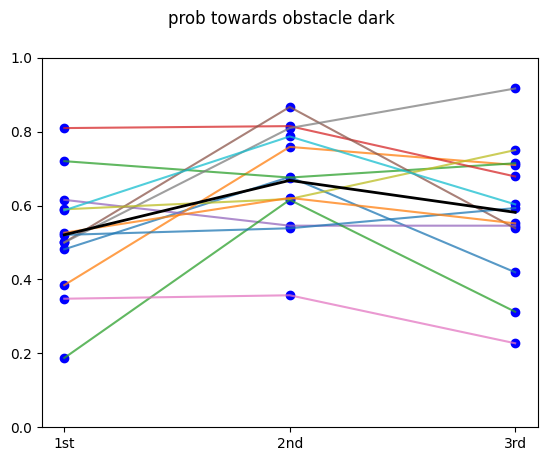

In [142]:
data = pd.concat([long_con_nostart,short_con_nostart])
data = data[(data.consective_type <=2)  & (data.task =='oadark')& (data.obstacle_cross ==True)& (data.linearity >.7)]
color_dict = create_color_dict(data,'animal','tab10')
fig, ax = plt.subplots()
ax.set_xticks([0,1,2])
ax.set_xticklabels(['1st','2nd','3rd'])
ax.set_ylim(0,1)
fig.suptitle('prob towards obstacle dark')
animal_trace = []

for ani,ani_df in data.groupby(['animal']):
    print(ani,len(ani_df))
    
    first = ani_df[ani_df.consective_type ==0]
    first_porp = sum(first.turn_to_obstacle == 'torwards')/len(first)
    ax.scatter(0,first_porp,c = 'blue')
    sec = ani_df[ani_df.consective_type ==1]
    sec_porp = sum(sec.turn_to_obstacle == 'torwards')/len(sec)
    ax.scatter(1,sec_porp,c = 'blue')
    third = ani_df[ani_df.consective_type ==2]
    third_porp = sum(third.turn_to_obstacle == 'torwards')/len(third)
    ax.scatter(2,third_porp,c = 'blue')
    ax.plot((0,1,2),(first_porp,sec_porp,third_porp),c = color_dict.get(ani), alpha = .75)
    print(ani,len(ani_df),[first_porp,sec_porp,third_porp])
    animal_trace.append(np.array([first_porp,sec_porp,third_porp]))
plt.plot((0,1,2),np.mean(np.asarray(animal_trace),axis=0),c = 'black',linewidth=2.0)

G8CK1LN 382
G8CK1LT 285
G8CK1RT 298
G8CK1TT 329
G8CKLN 362
G8CKLT 224
G8CKRN 337
G8CKRT 407
G8CKTT 475
J701LT 179
J701NN 274
J701RN 246
J701RT 209


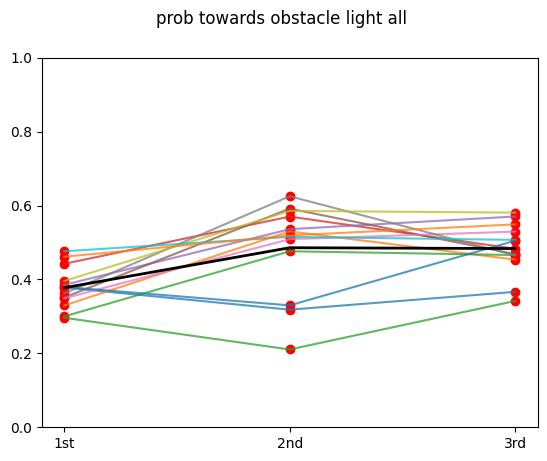

In [144]:
data = pd.concat([con_df])
data = data[(data.consective_type <=2)  & (data.task =='oa')& (data.obstacle_cross ==True)& (data.linearity >.7)]
color_dict = create_color_dict(data,'animal','tab10')
fig, ax = plt.subplots()
ax.set_xticks([0,1,2])
ax.set_xticklabels(['1st','2nd','3rd'])
ax.set_ylim(0,1)
fig.suptitle('prob towards obstacle light all')
animal_trace = []

for ani,ani_df in data.groupby(['animal']):
    print(ani,len(ani_df))
    
    first = ani_df[ani_df.consective_type ==0]
    first_porp = sum(first.turn_to_obstacle == 'torwards')/len(first)
    ax.scatter(0,first_porp,c = 'red')
    sec = ani_df[ani_df.consective_type ==1]
    sec_porp = sum(sec.turn_to_obstacle == 'torwards')/len(sec)
    ax.scatter(1,sec_porp,c = 'red')
    third = ani_df[ani_df.consective_type ==2]
    third_porp = sum(third.turn_to_obstacle == 'torwards')/len(third)
    ax.scatter(2,third_porp,c = 'red')
    ax.plot((0,1,2),(first_porp,sec_porp,third_porp),c = color_dict.get(ani), alpha = .75)
    animal_trace.append(np.array([first_porp,sec_porp,third_porp]))
plt.plot((0,1,2),np.mean(np.asarray(animal_trace),axis=0),c = 'black',linewidth=2.0)

G8CK1LN 229
G8CK1LT 174
G8CK1RT 167
G8CK1TT 190
G8CKLN 270
G8CKLT 190
G8CKRN 252
G8CKRT 296
G8CKTT 368
J701LT 124
J701NN 204
J701RN 190
J701RT 133


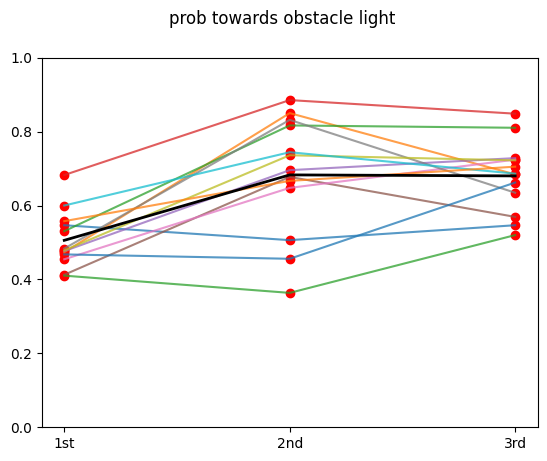

In [145]:
data = pd.concat([long_con_nostart,short_con_nostart])
data = data[(data.consective_type <=2)  & (data.task =='oa')& (data.obstacle_cross ==True)& (data.linearity >.7)]
color_dict = create_color_dict(data,'animal','tab10')
fig, ax = plt.subplots()
ax.set_xticks([0,1,2])
ax.set_xticklabels(['1st','2nd','3rd'])
ax.set_ylim(0,1)
fig.suptitle('prob towards obstacle light')
animal_trace = []

for ani,ani_df in data.groupby(['animal']):
    print(ani,len(ani_df))
    
    first = ani_df[ani_df.consective_type ==0]
    first_porp = sum(first.turn_to_obstacle == 'torwards')/len(first)
    ax.scatter(0,first_porp,c = 'red')
    sec = ani_df[ani_df.consective_type ==1]
    sec_porp = sum(sec.turn_to_obstacle == 'torwards')/len(sec)
    ax.scatter(1,sec_porp,c = 'red')
    third = ani_df[ani_df.consective_type ==2]
    third_porp = sum(third.turn_to_obstacle == 'torwards')/len(third)
    ax.scatter(2,third_porp,c = 'red')
    ax.plot((0,1,2),(first_porp,sec_porp,third_porp),c = color_dict.get(ani), alpha = .75)
    animal_trace.append(np.array([first_porp,sec_porp,third_porp]))
plt.plot((0,1,2),np.mean(np.asarray(animal_trace),axis=0),c = 'black',linewidth=2.0)

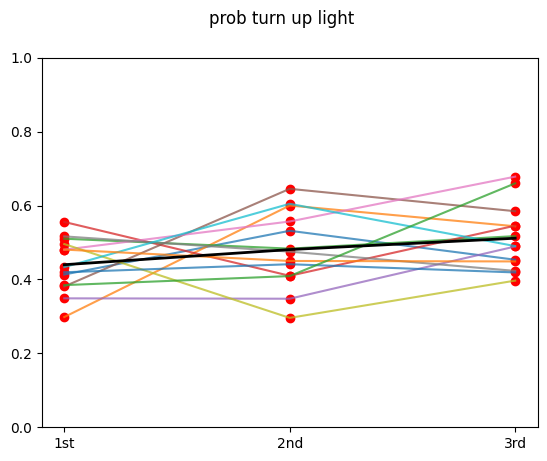

In [74]:
data = pd.concat([long_con_nostart,short_con_nostart])
data = data[(data.consective_type <=2)  & (data.task =='oa')& (data.obstacle_cross ==True)& (data.linearity >.7)]
color_dict = create_color_dict(data,'animal','tab10')
fig, ax = plt.subplots()
ax.set_xticks([0,1,2])
ax.set_xticklabels(['1st','2nd','3rd'])
ax.set_ylim(0,1)
fig.suptitle('prob turn up light')
animal_trace = []

for ani,ani_df in data.groupby(['animal']):
    
    first = ani_df[ani_df.consective_type ==0]
    first_porp = sum(first.turn_direction == 'up')/len(first)
    ax.scatter(0,first_porp,c = 'red')
    sec = ani_df[ani_df.consective_type ==1]
    sec_porp = sum(sec.turn_direction == 'up')/len(sec)
    ax.scatter(1,sec_porp,c = 'red')
    third = ani_df[ani_df.consective_type ==2]
    third_porp = sum(third.turn_direction == 'up')/len(third)
    ax.scatter(2,third_porp,c = 'red')
    ax.plot((0,1,2),(first_porp,sec_porp,third_porp),c = color_dict.get(ani), alpha = .75)
    animal_trace.append(np.array([first_porp,sec_porp,third_porp]))
plt.plot((0,1,2),np.mean(np.asarray(animal_trace),axis=0),c = 'black',linewidth=2.0)

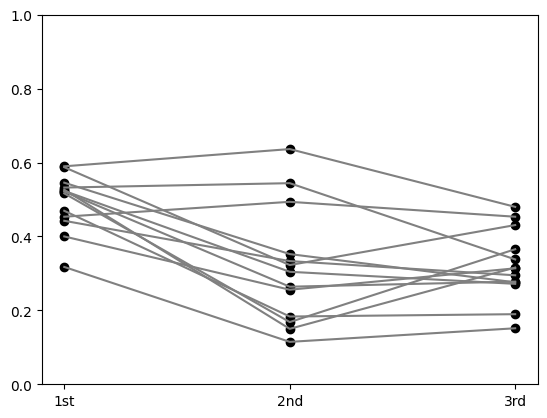

In [36]:
data = pd.concat([long_con_nostart,short_con_nostart])
data = data[(data.consective_type <=2)  & (data.task =='oa')& (data.obstacle_cross ==True)& (data.linearity >.7)]
fig, ax = plt.subplots()
ax.set_xticks([0,1,2])
ax.set_xticklabels(['1st','2nd','3rd'])
ax.set_ylim(0,1)

for ani,ani_df in data.groupby(['animal']):
    first = ani_df[ani_df.consective_type ==0]
    first_porp = sum(first.turn_to_obstacle == 'away')/len(first)
    ax.scatter(0,first_porp,c = 'black')
    sec = ani_df[ani_df.consective_type ==1]
    sec_porp = sum(sec.turn_to_obstacle == 'away')/len(sec)
    ax.scatter(1,sec_porp,c = 'black')
    third = ani_df[ani_df.consective_type ==2]
    third_porp = sum(third.turn_to_obstacle == 'away')/len(third)
    ax.scatter(2,third_porp,c = 'black')
    ax.plot((0,1,2),(first_porp,sec_porp,third_porp),c = 'grey')

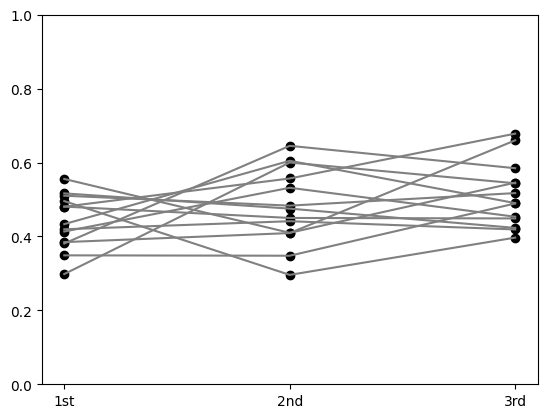

In [35]:
data = pd.concat([long_con_nostart,short_con_nostart])
data = data[(data.consective_type <=2)  & (data.task =='oa')& (data.obstacle_cross ==True)& (data.linearity >.7)]
fig, ax = plt.subplots()
ax.set_xticks([0,1,2])
ax.set_xticklabels(['1st','2nd','3rd'])
ax.set_ylim(0,1)

for ani,ani_df in data.groupby(['animal']):
    first = ani_df[ani_df.consective_type ==0]
    first_porp = sum(first.turn_direction == 'up')/len(first)
    ax.scatter(0,first_porp,c = 'black')
    sec = ani_df[ani_df.consective_type ==1]
    sec_porp = sum(sec.turn_direction == 'up')/len(sec)
    ax.scatter(1,sec_porp,c = 'black')
    third = ani_df[ani_df.consective_type ==2]
    third_porp = sum(third.turn_direction == 'up')/len(third)
    ax.scatter(2,third_porp,c = 'black')
    ax.plot((0,1,2),(first_porp,sec_porp,third_porp),c = 'grey')

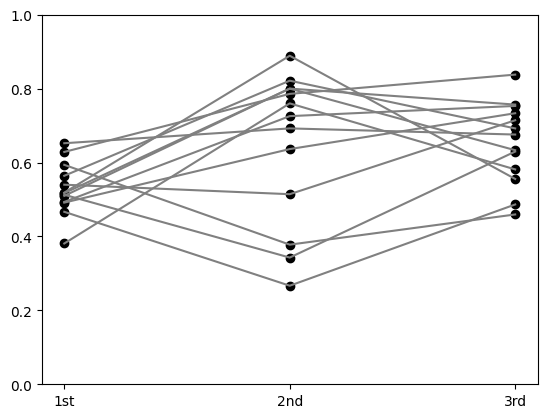

In [33]:
data = pd.concat([long_con_nostart])
data = data[(data.consective_type <=2)  & (data.task =='oa')& (data.obstacle_cross ==True)& (data.linearity >.7)]
fig, ax = plt.subplots()
ax.set_xticks([0,1,2])
ax.set_xticklabels(['1st','2nd','3rd'])
ax.set_ylim(0,1)

for ani,ani_df in data.groupby(['animal']):
    first = ani_df[ani_df.consective_type ==0]
    first_porp = sum(first.turn_to_obstacle == 'torwards')/len(first)
    ax.scatter(0,first_porp,c = 'black')
    sec = ani_df[ani_df.consective_type ==1]
    sec_porp = sum(sec.turn_to_obstacle == 'torwards')/len(sec)
    ax.scatter(1,sec_porp,c = 'black')
    third = ani_df[ani_df.consective_type ==2]
    third_porp = sum(third.turn_to_obstacle == 'torwards')/len(third)
    ax.scatter(2,third_porp,c = 'black')
    ax.plot((0,1,2),(first_porp,sec_porp,third_porp),c = 'grey')


(0.0, 0.8)

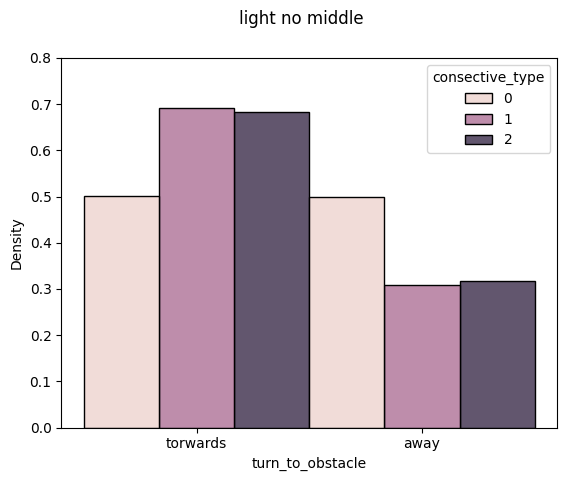

In [135]:
data = pd.concat([long_con_nostart,short_con_nostart])
data = data[(data.consective_type <=2) & (data.task =='oa')& (data.obstacle_cross ==True)& (data.linearity >=.7)]
sns.histplot(data=data,x='turn_to_obstacle',stat='density',hue ='consective_type',common_norm=False,multiple='dodge')
plt.suptitle('light no middle')
plt.ylim(0,.8)

(0.0, 0.8)

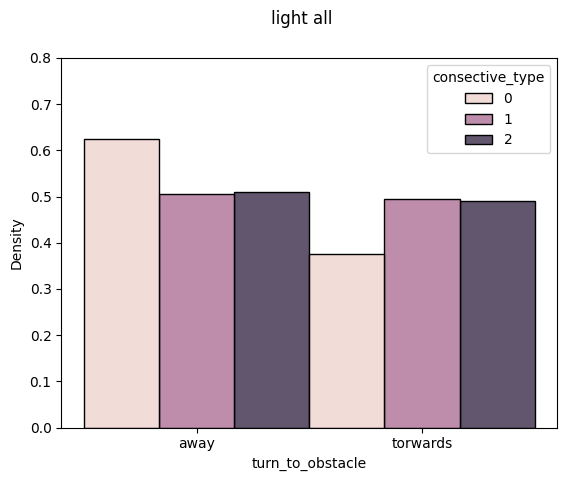

In [133]:
data = con_df
data = data[(data.consective_type <=2) & (data.task =='oa')& (data.obstacle_cross ==True)& (data.linearity >=.7)]
sns.histplot(data=data,x='turn_to_obstacle',stat='density',hue ='consective_type',common_norm=False,multiple='dodge')
plt.suptitle('light all')
plt.ylim(0,.8)

(0.0, 0.8)

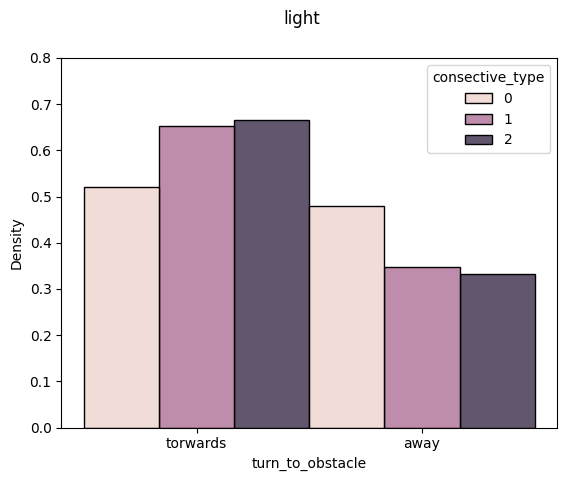

In [127]:
data = long_con_nostart
data = data[(data.consective_type <=2) & (data.task =='oa')& (data.obstacle_cross ==True)& (data.linearity >=.7)]
sns.histplot(data=data,x='turn_to_obstacle',stat='density',hue ='consective_type',common_norm=False,multiple='dodge')
plt.suptitle('light')
plt.ylim(0,.8)

(0.0, 0.8)

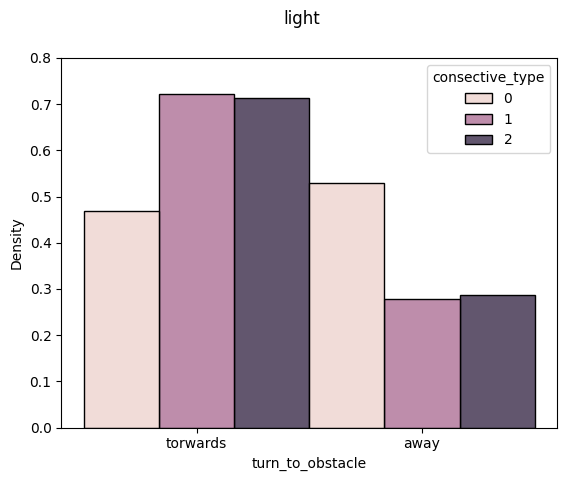

In [15]:
data = short_con_nostart
data = data[(data.consective_type <=2) & (data.task =='oa')& (data.obstacle_cross ==True)& (data.linearity >=.7)]
sns.histplot(data=data,x='turn_to_obstacle',stat='density',hue ='consective_type',common_norm=False,multiple='dodge')
plt.suptitle('light')
plt.ylim(0,.8)

(0.0, 0.8)

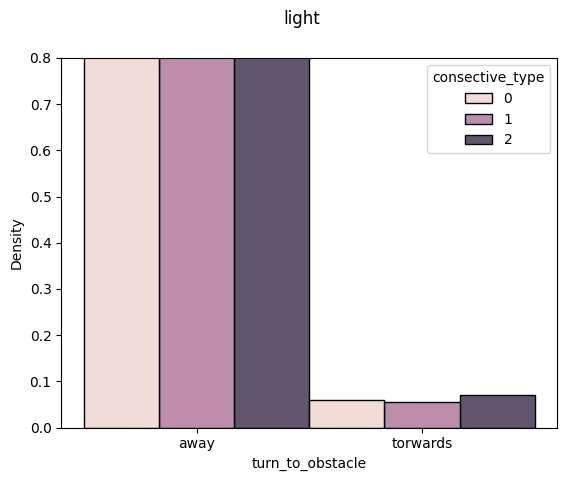

In [131]:
data = middle_con_nostart
data = data[(data.consective_type <=2) & (data.task =='oa')& (data.obstacle_cross ==True)& (data.linearity >=.7)]
sns.histplot(data=data,x='turn_to_obstacle',stat='density',hue ='consective_type',common_norm=False,multiple='dodge')
plt.suptitle('light')
plt.ylim(0,.8)

(0.0, 0.8)

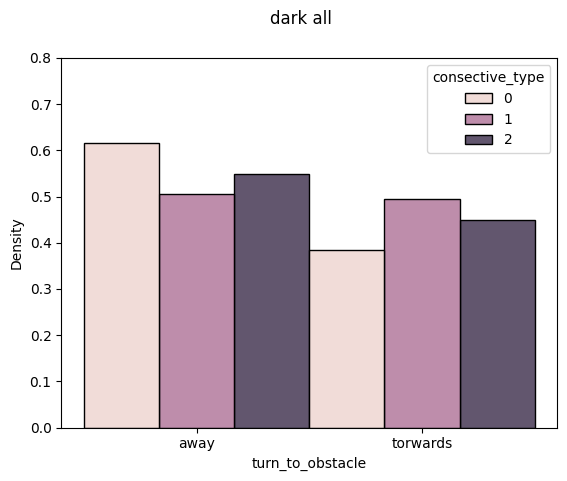

In [136]:
data = pd.concat([con_df])
data = data[(data.consective_type <=2) & (data.task =='oadark')& (data.obstacle_cross ==True)& (data.linearity >=.7)]
sns.histplot(data=data,x='turn_to_obstacle',stat='density',hue ='consective_type',common_norm=False,multiple='dodge')
plt.suptitle('dark all')
plt.ylim(0,.8)

(0.0, 0.8)

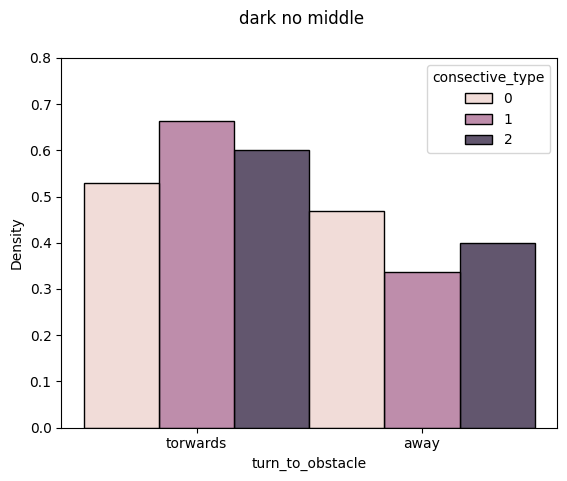

In [137]:
data = pd.concat([long_con_nostart,short_con_nostart])
data = data[(data.consective_type <=2) & (data.task =='oadark')& (data.obstacle_cross ==True)& (data.linearity >=.7)]
sns.histplot(data=data,x='turn_to_obstacle',stat='density',hue ='consective_type',common_norm=False,multiple='dodge')
plt.suptitle('dark no middle')
plt.ylim(0,.8)

In [ ]:
data = pd.concat([long_con_nostart,short_con_nostart])
data = data[(data.consective_type <=2) & (data.task =='oadark')& (data.obstacle_cross ==True)& (data.linearity >=.7)& (data.date_index == 0)]
sns.histplot(data=data,x='turn_to_obstacle',stat='density',hue ='consective_type',common_norm=False,multiple='dodge')
plt.suptitle('dark')
plt.ylim(0,.8)

(0.0, 0.8)

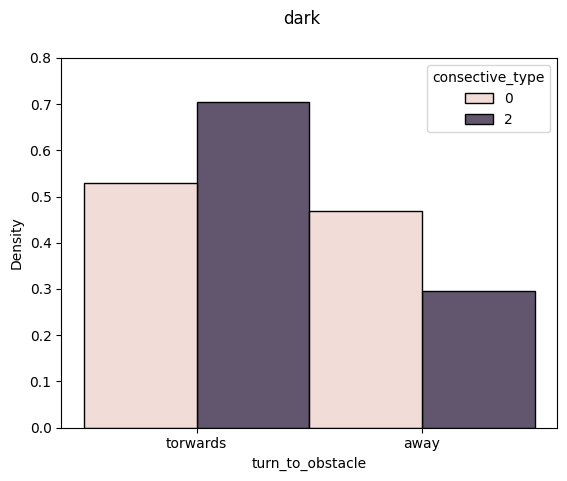

In [104]:
data = pd.concat([long_con_nostart,short_con_nostart])
data = data[(data.consective_type ==2) | (data.consective_type ==0) & (data.task =='oadark')& (data.obstacle_cross ==True)& (data.linearity >=.7)]
sns.histplot(data=data,x='turn_to_obstacle',stat='density',hue ='consective_type',common_norm=False,multiple='dodge')
plt.suptitle('dark')
plt.ylim(0,.8)

(0.0, 0.8)

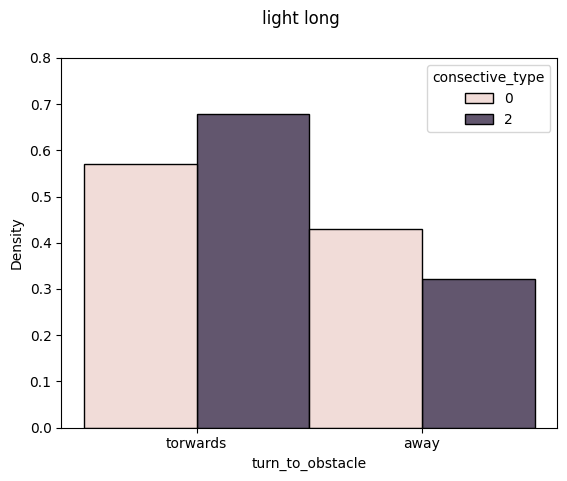

In [420]:
data = long_con_nostart
data = data[(data.consective_type ==2) | (data.consective_type ==0) & (data.task =='oadark')]

sns.histplot(data=data,x='turn_to_obstacle',stat='density',hue ='consective_type',common_norm=False,multiple='dodge')
plt.suptitle('light long')
plt.ylim(0,.8)


(0.0, 0.8)

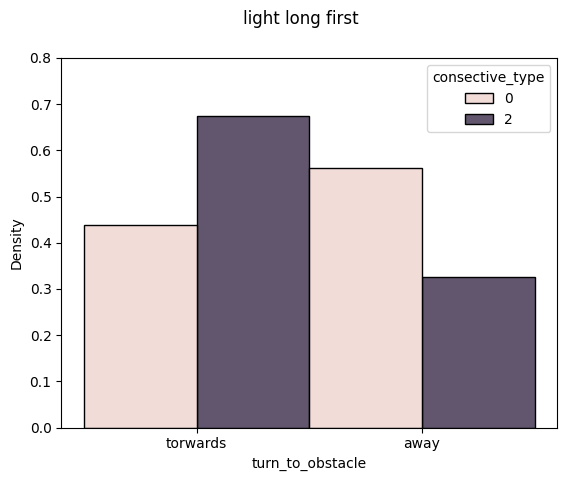

In [422]:
data = long_con_nostart[long_con_nostart.date_index == 0]
data = data[(data.consective_type ==2) | (data.consective_type ==0) & (data.task =='oa')]
sns.histplot(data=data,x='turn_to_obstacle',stat='density',hue ='consective_type',common_norm=False,multiple='dodge')
plt.suptitle('light long first')
plt.ylim(0,.8)

Text(0.5, 0.98, 'light long last')

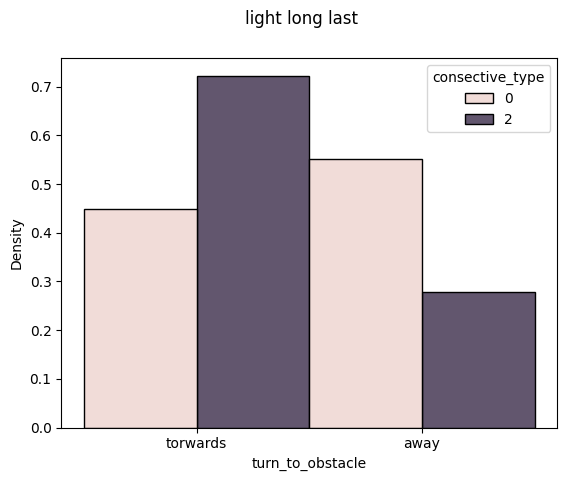

In [423]:
data = long_con_nostart[long_con_nostart.date_index == 6]
data = data[(data.consective_type ==2) | (data.consective_type ==0) & (data.task =='oa')]
sns.histplot(data=data,x='turn_to_obstacle',stat='density',hue ='consective_type',common_norm=False,multiple='dodge')
plt.suptitle('light long last')

Text(0.5, 0.98, 'light long')

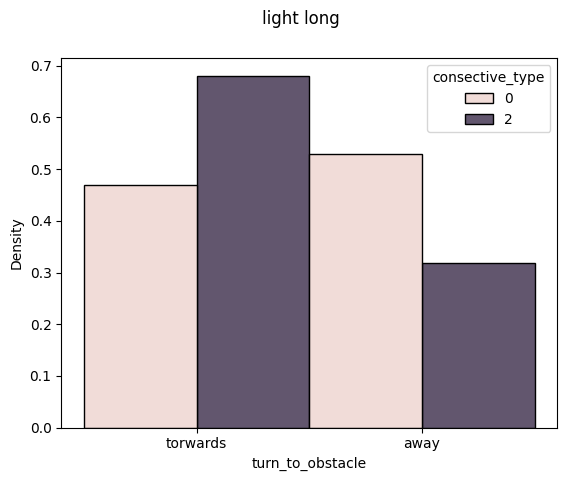

In [1091]:
data = long_con_nostart
data = data[(data.consective_type ==2) | (data.consective_type ==0) & (data.task =='oa')& (data.date_index ==6)]
sns.histplot(data=data,x='turn_to_obstacle',stat='density',hue ='consective_type',common_norm=False,multiple='dodge')
plt.suptitle('light long')


Text(0.5, 0.98, 'light short')

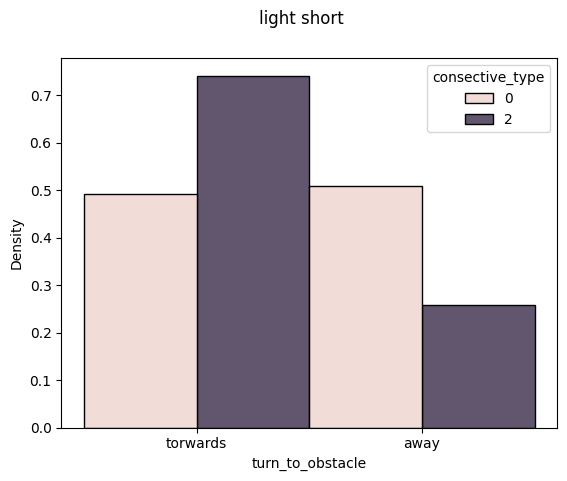

In [108]:
data = short_con_nostart
data = data[(data.consective_type ==2) | (data.consective_type ==0) & (data.task =='oa')&(data.linearity >.7) ]
sns.histplot(data=data,x='turn_to_obstacle',stat='density',hue ='consective_type',common_norm=False,multiple='dodge')
plt.suptitle('light short')

Text(0.5, 0.98, 'dark')

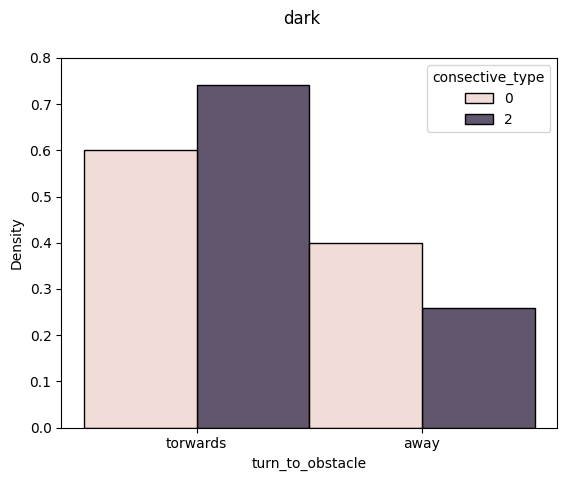

In [106]:
data = pd.concat([short_con_nostart])
data = data[(data.consective_type ==2) | (data.consective_type ==0) & (data.task =='oadark')&(data.linearity >.7) ]
sns.histplot(data=data,x='turn_to_obstacle',stat='density',hue ='consective_type',common_norm=False,multiple='dodge')
plt.ylim(0,.8)
plt.suptitle('dark')

Text(0.5, 0.98, 'dark')

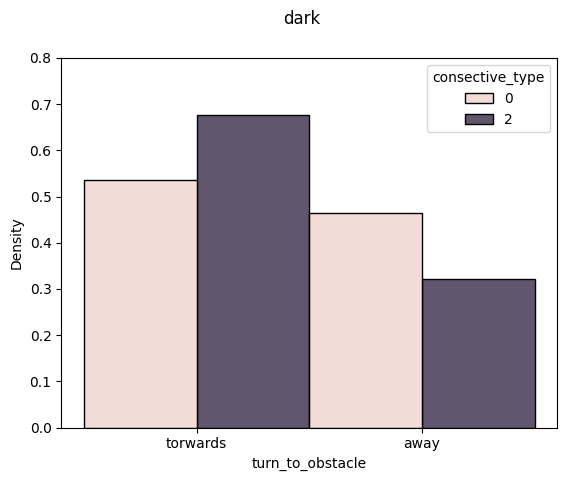

In [107]:
data = pd.concat([long_con_nostart])
data = data[(data.consective_type ==2) | (data.consective_type ==0) & (data.task =='oadark')&(data.linearity >.7) ]
sns.histplot(data=data,x='turn_to_obstacle',stat='density',hue ='consective_type',common_norm=False,multiple='dodge')
plt.ylim(0,.8)
plt.suptitle('dark')

Text(0.5, 0.98, 'dark')

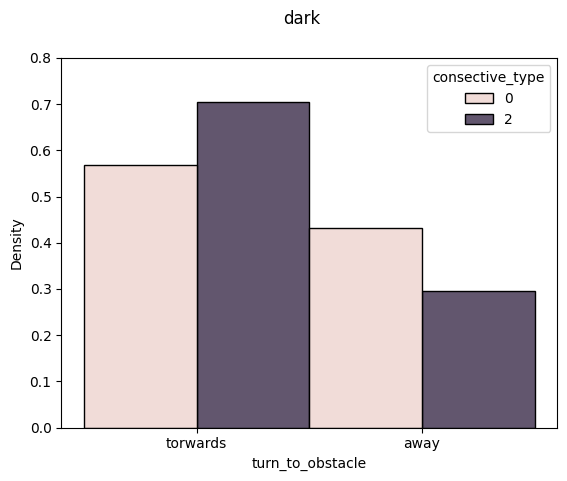

In [74]:
data = pd.concat([long_con_nostart,short_con_nostart])
data = data[(data.consective_type ==2) | (data.consective_type ==0) & (data.task =='oadark')&(data.linearity >.7) ]
sns.histplot(data=data,x='turn_to_obstacle',stat='density',hue ='consective_type',common_norm=False,multiple='dodge')
plt.ylim(0,.8)
plt.suptitle('dark')

Text(0.5, 0.98, 'dark')

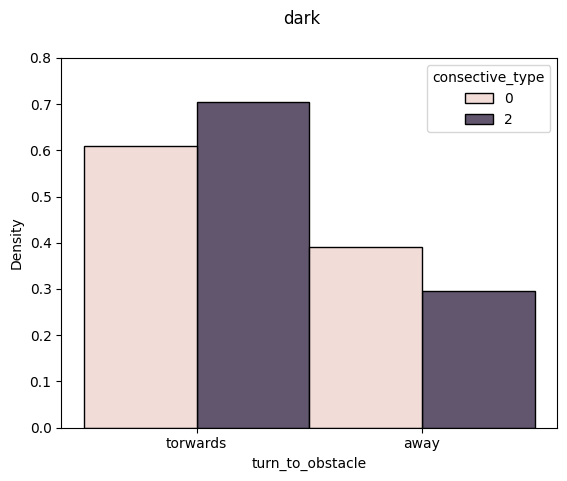

In [13]:
data = pd.concat([long_con_nostart,short_con_nostart])
data = data[(data.consective_type ==2) | (data.consective_type ==0) & (data.task =='oadark')&(data.linearity >.6) ]
sns.histplot(data=data,x='turn_to_obstacle',stat='density',hue ='consective_type',common_norm=False,multiple='dodge')
plt.ylim(0,.8)
plt.suptitle('dark')

Text(0.5, 0.98, 'dark')

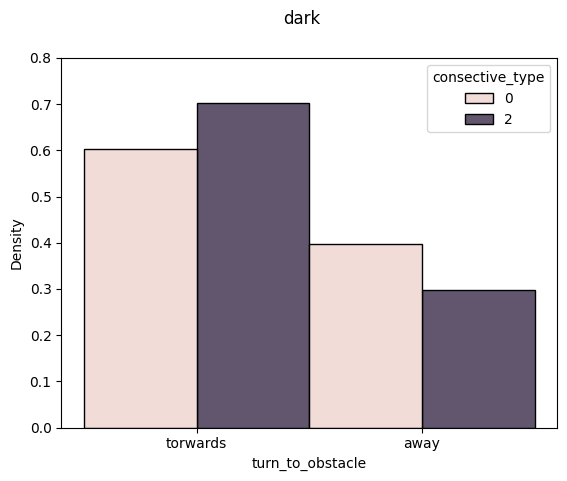

In [1098]:
data = pd.concat([long_con_nostart,short_con_nostart])
data = data[(data.consective_type ==2) | (data.consective_type ==0) & (data.task =='oadark')& (data.date_index ==1)]
sns.histplot(data=data,x='turn_to_obstacle',stat='density',hue ='consective_type',common_norm=False,multiple='dodge')
plt.ylim(0,.8)
plt.suptitle('dark')

Text(0.5, 0.98, 'dark')

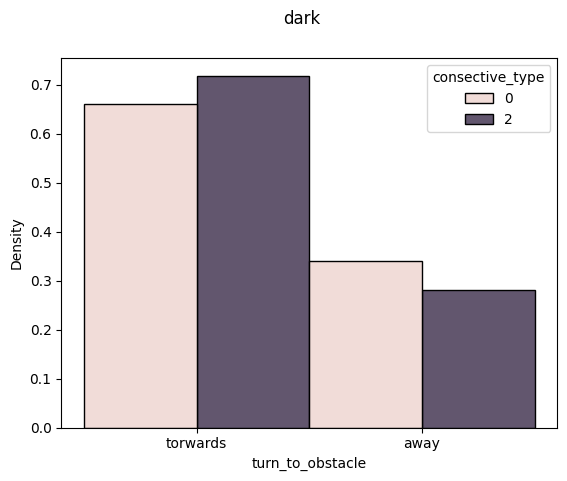

In [425]:
data = pd.concat([long_con_nostart,short_con_nostart])
data = data[(data.consective_type ==2) | (data.consective_type ==0) & (data.task =='oadark')]
torwards = data[(data.turn_to_obstacle == 'torwards') &(data.avg_lateral_error < -3) ]
away = data[(data.turn_to_obstacle == 'away') &(data.avg_lateral_error > 3)]
data = pd.concat([torwards,away])
sns.histplot(data=data,x='turn_to_obstacle',stat='density',hue ='consective_type',common_norm=False,multiple='dodge')
plt.suptitle('dark')

Text(0.5, 0.98, 'dark long')

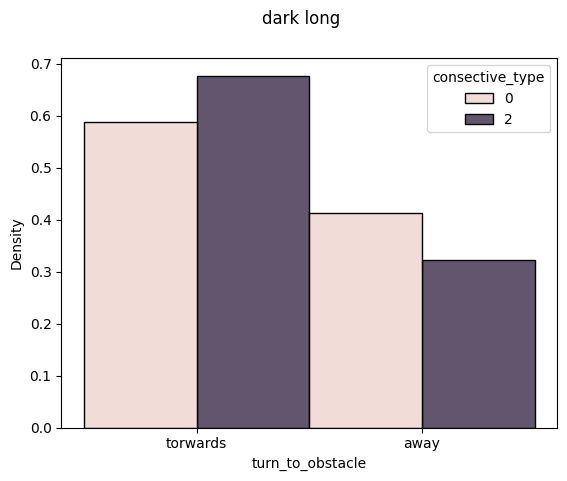

In [109]:
data = long_con_nostart
data = data[(data.consective_type ==2) | (data.consective_type ==0) & (data.task =='oadark')]
sns.histplot(data=data,x='turn_to_obstacle',stat='density',hue ='consective_type',common_norm=False,multiple='dodge')
plt.suptitle('dark long')


Text(0.5, 0.98, 'dark long first')

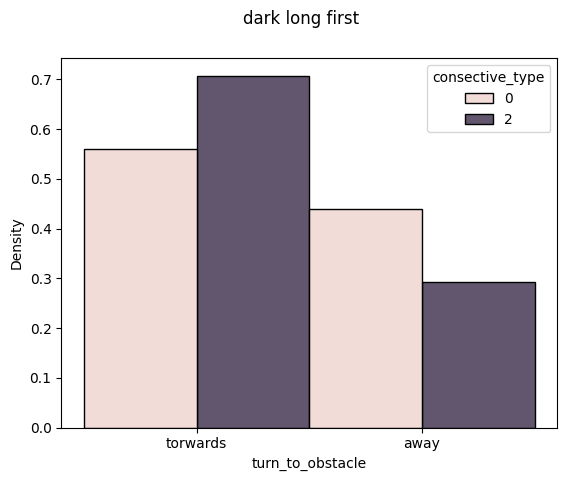

In [427]:
data = long_con_nostart[long_con_nostart.date_index == 0]
data = data[(data.consective_type ==2) | (data.consective_type ==0) ]
data = data[data.task =='oadark']

sns.histplot(data=data,x='turn_to_obstacle',stat='density',hue ='consective_type',common_norm=False,multiple='dodge')
plt.suptitle('dark long first')


Text(0.5, 0.98, 'dark long first')

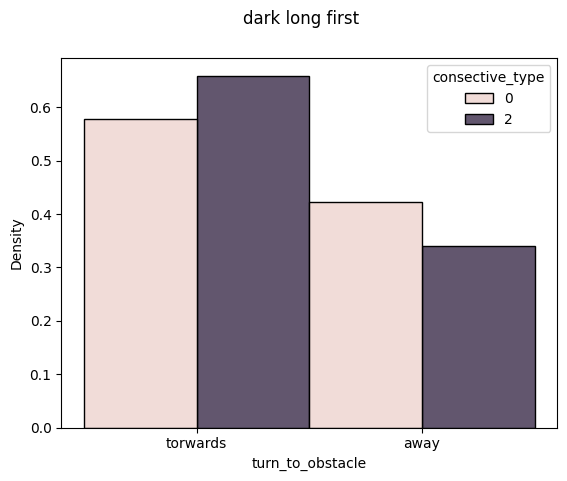

In [428]:
data = long_con_nostart[long_con_nostart.date_index == 5]
data = data[(data.consective_type ==2) | (data.consective_type ==0) ]
data = data[data.task =='oadark']

sns.histplot(data=data,x='turn_to_obstacle',stat='density',hue ='consective_type',common_norm=False,multiple='dodge')
plt.suptitle('dark long first')


Text(0.5, 0.98, 'dark short')

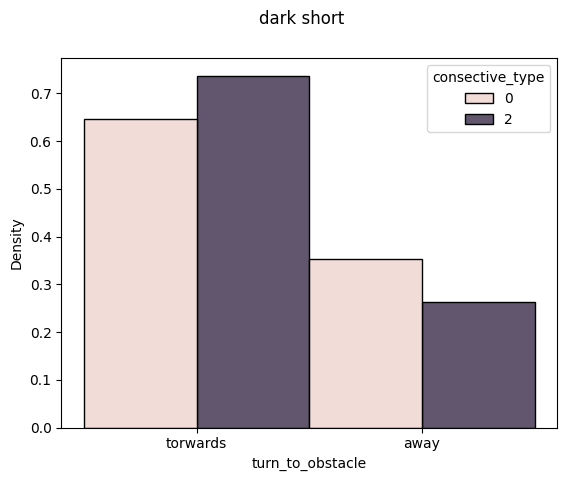

In [429]:
data = short_con_nostart
data = data[(data.consective_type ==2) | (data.consective_type ==0) & (data.task =='oadark')]
torwards = data[(data.turn_to_obstacle=='torwards')]
away = data[(data.turn_to_obstacle=='away')]
data = pd.concat([torwards,away])

sns.histplot(data=data,x='turn_to_obstacle',stat='density',hue ='consective_type',common_norm=False,multiple='dodge')
plt.suptitle('dark short')

687


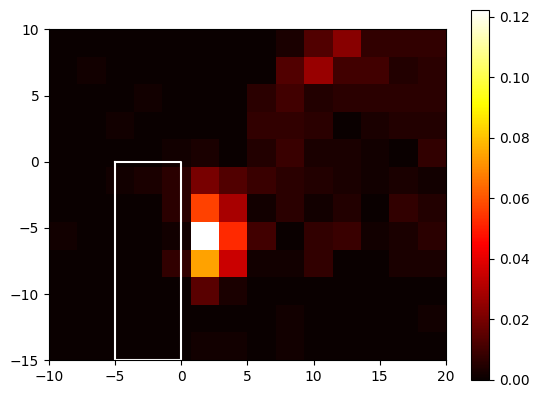

In [952]:
data = pd.concat([long_con_nostart])
first_trial = long_short[(long_short.task == 'oadark')&(long_short.consective_type == 0) ]
print(len(first_trial))
ymin,ymax = -10,20
xmin,xmax = -15,10

head_turn,lateral_error = first_trial.distance_at_head_turn.to_numpy(),first_trial.avg_lateral_error.to_numpy()

array ,xedges ,yedges   = np.histogram2d(lateral_error.astype(float), head_turn.astype(float), range = [[xmin,xmax],[ymin,ymax ]],bins=(list(range(xmin,xmax,2)), list(range(ymin,ymax,2)),))

plt.imshow(array[::-1]/len(first_trial),cmap='hot',extent=[ymin,ymax,xmin,xmax])

plt.plot( [-5,0,0,-5,-5], [0,0,-15,-15,0],c ='white')
plt.colorbar()

687


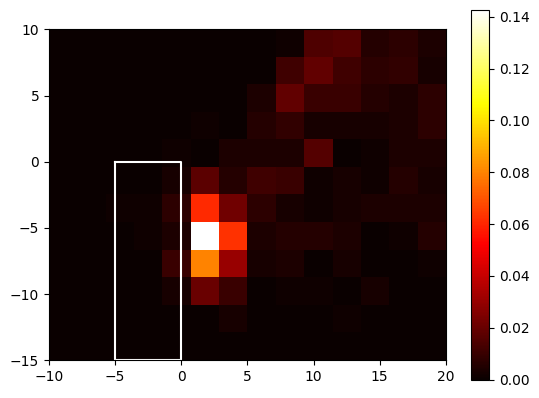

In [953]:
data = pd.concat([long_con_nostart])
first_trial = long_short[(long_short.task == 'oadark')&(long_short.consective_type == 2) ]
print(len(first_trial))
ymin,ymax = -10,20
xmin,xmax = -15,10

head_turn,lateral_error = first_trial.distance_at_head_turn.to_numpy(),first_trial.avg_lateral_error.to_numpy()

array ,xedges ,yedges   = np.histogram2d(lateral_error.astype(float), head_turn.astype(float), range = [[xmin,xmax],[ymin,ymax ]],bins=(list(range(xmin,xmax,2)), list(range(ymin,ymax,2)),))

plt.imshow(array[::-1]/len(first_trial),cmap='hot',extent=[ymin,ymax,xmin,xmax])

plt.plot( [-5,0,0,-5,-5], [0,0,-15,-15,0],c ='white')
plt.colorbar()

<AxesSubplot: xlabel='turn_to_obstacle', ylabel='Density'>

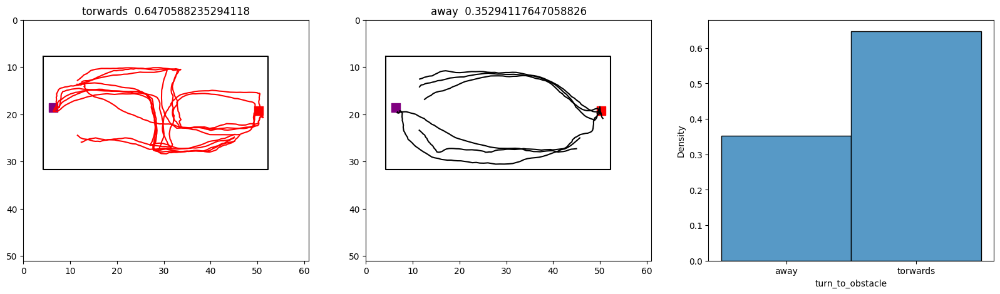

In [113]:
fig,ax = plt.subplots(1,3,figsize = (20,5))
data = long_con_nostart[(long_con_nostart.task == 'oadark')&(long_con_nostart.linearity >.7) &(long_con_nostart.consective_type ==2)&(long_con_nostart.animal =='G8CK1TT')]
plot_arena(data,ax[0])
ax[0].set_title('torwards  ' + str(sum(data.turn_to_obstacle == 'torwards')/len(data)))
ax[1].set_title('away  ' + str(sum(data.turn_to_obstacle == 'away')/len(data)))
plot_arena(data,ax[1])
for ind,row in data.iterrows():
    if row.turn_to_obstacle == 'torwards':
        ax[0].plot(row.ts_nose_x_cm,row.ts_nose_y_cm, c= 'red')
    else:
        ax[1].plot(row.ts_nose_x_cm,row.ts_nose_y_cm, c= 'black')

sns.histplot(ax =ax[2] ,data=data,x='turn_to_obstacle',stat='density',common_norm=False,multiple='dodge')

In [114]:
long_con_nostart[(long_con_nostart.task == 'oadark')&(long_con_nostart.linearity >.7)&(long_con_nostart.animal =='G8CK1TT')]

,level_0,first_poke,second_poke,trial_timestamps,trial_vidframes,nose_x,nose_y,leftear_x,leftear_y,rightear_x,...,distance,ts_distance,total_distance,ts_total_distance,intial_head_angle_velocity,turn_direction,turn_to_obstacle,obstacle_cross,consective_inds,consective_type
11958,3077,65636.409651,65638.826483,"[65636.411046, 65636.428364, 65636.444454, 656...","[[6684, 6685, 6686, 6687, 6688, 6689, 6690, 66...","[680.6180419921875, 681.5030517578125, 681.443...","[280.7645263671875, 280.52679443359375, 280.03...","[665.7070922851562, 666.2946166992188, 667.448...","[273.58660888671875, 272.9472961425781, 272.19...","[672.4884643554688, 671.9406127929688, 672.209...",...,"[0.08386608346863511, 0.04139505870363891, 0.1...","[0.5992219126093943, 0.7674829442208946, 0.736...",69.636757,54.753595,1.476034,down,away,True,"[11952, 11953, 11954, 11955, 11956, 11957, 119...",6
11960,3079,65641.652979,65643.918297,"[65641.66272, 65641.681177, 65641.696102, 6564...","[[6999, 7000, 7001, 7002, 7003, 7004, 7005, 70...","[680.2017822265625, 680.1605834960938, 680.970...","[280.2463684082031, 280.6188049316406, 281.060...","[668.2733764648438, 669.8080444335938, 670.662...","[270.7386474609375, 270.8243713378906, 271.263...","[670.0817260742188, 671.5828857421875, 672.651...",...,"[0.030897550838105303, 0.09349734747122085, 0....","[0.8439494814286093, 0.796636609387523, 0.7048...",69.528466,58.207375,1.109510,down,away,True,"[11952, 11953, 11954, 11955, 11956, 11957, 119...",8
12007,3126,65808.582886,65810.840012,"[65808.587161, 65808.605056, 65808.620467, 658...","[[17011, 17012, 17013, 17014, 17015, 17016, 17...","[679.4832153320312, 680.1227416992188, 680.068...","[278.8104248046875, 278.814453125, 278.8755798...","[669.4466552734375, 670.2052001953125, 670.511...","[267.9240417480469, 267.8575134277344, 268.357...","[669.4932250976562, 670.4647216796875, 670.614...",...,"[0.048071975215727036, 0.008582653010584806, 0...","[0.8359344461071636, 0.8493976994087724, 0.843...",67.270923,56.653629,1.450598,down,away,True,"[12005, 12006, 12007, 12008, 12009, 12010, 120...",2
12011,3130,65818.963020,65821.330752,"[65818.97399, 65818.991936, 65819.007424, 6581...","[[17634, 17635, 17636, 17637, 17638, 17639, 17...","[680.677001953125, 680.9158325195312, 680.8042...","[280.7526550292969, 281.2377014160156, 280.783...","[668.0975341796875, 669.357177734375, 669.2704...","[272.5606689453125, 272.32666015625, 271.92434...","[671.560302734375, 672.7471923828125, 673.1527...",...,"[0.05407185376124701, 0.042265861744823496, 0....","[0.9196204420358711, 0.651912335368138, 0.8175...",67.951196,55.727592,1.882120,down,away,True,"[12005, 12006, 12007, 12008, 12009, 12010, 120...",6
12013,3132,65824.632422,65826.878502,"[65824.642777, 65824.65975, 65824.676096, 6582...","[[17974, 17975, 17976, 17977, 17978, 17979, 17...","[680.3864135742188, 680.3386840820312, 679.952...","[280.37518310546875, 280.8460388183594, 279.88...","[665.5720825195312, 666.744140625, 666.8549194...","[272.8357849121094, 272.58343505859375, 271.88...","[671.4771118164062, 671.6416015625, 672.148437...",...,"[0.038737057797835206, 0.10057547166719516, 0....","[0.4257656974092825, 0.32097640526663795, 0.28...",63.835083,54.434440,-1.238643,up,torwards,True,"[12005, 12006, 12007, 12008, 12009, 12010, 120...",8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14012,5131,64588.880908,64590.937254,"[64588.884556, 64588.901184, 64588.919091, 645...","[22498, 22499, 22500, 22501, 22502, 22503, 225...","[90.3122329711914, 90.11852264404297, 90.02382...","[262.5616760253906, 263.02923583984375, 262.77...","[97.6994400024414, 96.83263397216797, 96.30661...","[258.57611083984375, 258.9121398925781, 258.62...","[97.99815368652344, 97.28605651855469, 96.9450...",...,"[0.049172117996843845, 0.02578140769144799, 0....","[0.8399471884504681, 1.0542805275714482, 0.923...",64.330368,51.986751,-2.085356,up,away,True,"[14012, 14013, 14014, 14015, 14016, 14017]",0
1

In [76]:
data.animal.unique()

array(['G8CK1LN', 'G8CK1LT', 'G8CK1RT', 'G8CK1TT', 'G8CKLN', 'G8CKLT',
       'G8CKRN', 'G8CKRT', 'G8CKTT', 'J704LN', 'J704LT', 'J704NN',
       'J704RT'], dtype=object)

<AxesSubplot: xlabel='turn_to_obstacle', ylabel='Density'>

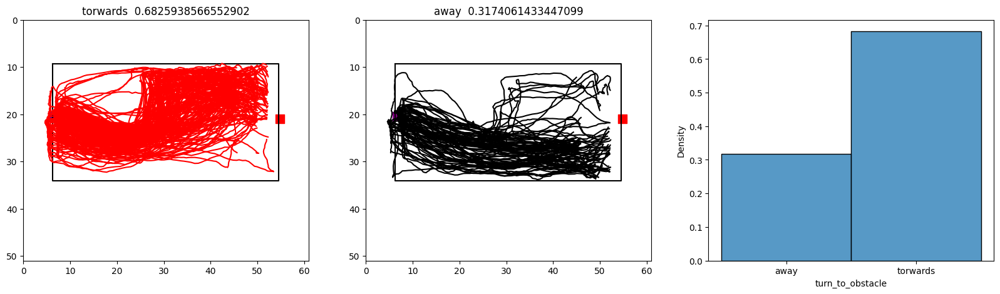

In [110]:
fig,ax = plt.subplots(1,3,figsize = (20,5))
data = long_nostart[(long_nostart.task == 'oadark')&(long_nostart.obstacle_cluster == 0)&(long_nostart.linearity >.7) ]
plot_arena(data,ax[0])
ax[0].set_title('torwards  ' + str(sum(data.turn_to_obstacle == 'torwards')/len(data)))
ax[1].set_title('away  ' + str(sum(data.turn_to_obstacle == 'away')/len(data)))
plot_arena(data,ax[1])
for ind,row in data.iterrows():
    if row.turn_to_obstacle == 'torwards':
        ax[0].plot(row.ts_nose_x_cm,row.ts_nose_y_cm, c= 'red')
    else:
        ax[1].plot(row.ts_nose_x_cm,row.ts_nose_y_cm, c= 'black')

sns.histplot(ax =ax[2] ,data=data,x='turn_to_obstacle',stat='density',common_norm=False,multiple='dodge')

<AxesSubplot: xlabel='turn_to_obstacle', ylabel='Density'>

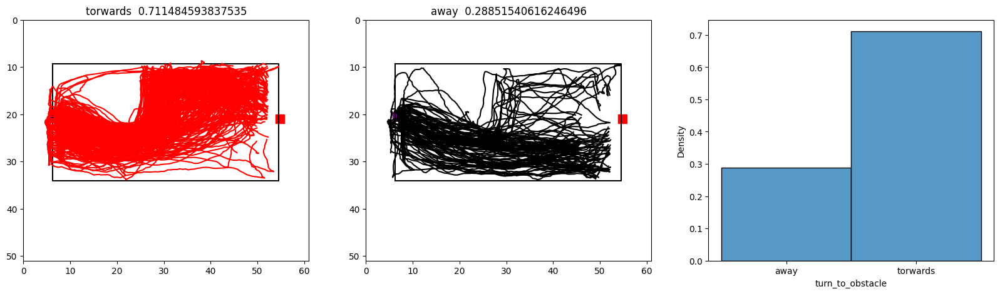

In [32]:
data = data[data.obstacle_cross == True]
fig,ax = plt.subplots(1,3,figsize = (20,5))
plot_arena(data,ax[0])
ax[0].set_title('torwards  ' + str(sum(data.turn_to_obstacle == 'torwards')/len(data)))
ax[1].set_title('away  ' + str(sum(data.turn_to_obstacle == 'away')/len(data)))
plot_arena(data,ax[1])
for ind,row in data.iterrows():
    if row.turn_to_obstacle == 'torwards':
        ax[0].plot(row.ts_nose_x_cm,row.ts_nose_y_cm, c= 'red')
    else:
        ax[1].plot(row.ts_nose_x_cm,row.ts_nose_y_cm, c= 'black')

sns.histplot(ax =ax[2] ,data=data,x='turn_to_obstacle',stat='density',common_norm=False,multiple='dodge')

<AxesSubplot: xlabel='turn_to_obstacle', ylabel='Density'>

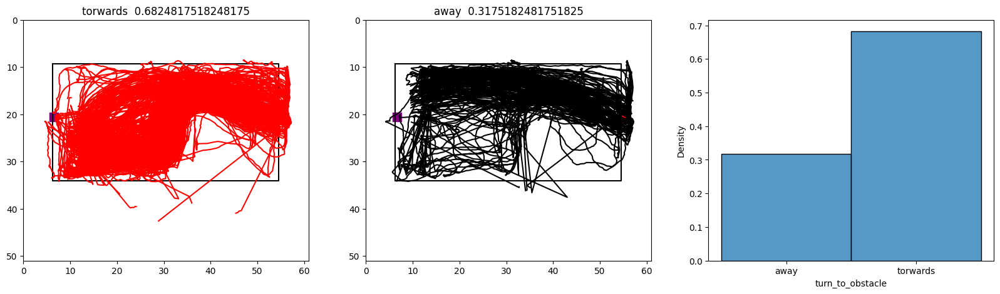

In [49]:
fig,ax = plt.subplots(1,3,figsize = (20,5))
data = long_nostart[(long_nostart.task == 'oadark')&(long_nostart.obstacle_cluster == 5)]
plot_arena(data,ax[0])
ax[0].set_title('torwards  ' + str(sum(data.turn_to_obstacle == 'torwards')/len(data)))
ax[1].set_title('away  ' + str(sum(data.turn_to_obstacle == 'away')/len(data)))
plot_arena(data,ax[1])
for ind,row in data.iterrows():
    if row.turn_to_obstacle == 'torwards':
        ax[0].plot(row.ts_nose_x_cm,row.ts_nose_y_cm, c= 'red')
    else:
        ax[1].plot(row.ts_nose_x_cm,row.ts_nose_y_cm, c= 'black')

sns.histplot(ax =ax[2] ,data=data,x='turn_to_obstacle',stat='density',common_norm=False,multiple='dodge')

<AxesSubplot: xlabel='turn_to_obstacle', ylabel='Density'>

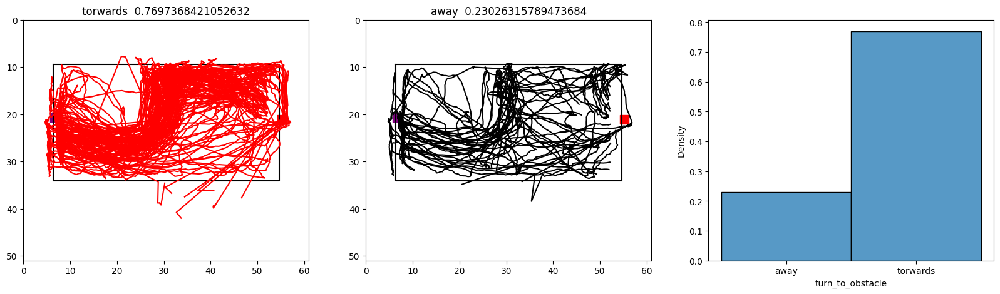

In [105]:
fig,ax = plt.subplots(1,3,figsize = (20,5))
data = long_nostart[(long_nostart.task == 'oadark')&(long_nostart.obstacle_cluster == 0)&(long_nostart.linearity < .7)]
plot_arena(data,ax[0])
ax[0].set_title('torwards  ' + str(sum(data.turn_to_obstacle == 'torwards')/len(data)))
ax[1].set_title('away  ' + str(sum(data.turn_to_obstacle == 'away')/len(data)))
plot_arena(data,ax[1])
for ind,row in data.iterrows():
    if row.turn_to_obstacle == 'torwards':
        ax[0].plot(row.ts_nose_x_cm,row.ts_nose_y_cm, c= 'red')
    else:
        ax[1].plot(row.ts_nose_x_cm,row.ts_nose_y_cm, c= 'black')

sns.histplot(ax =ax[2] ,data=data,x='turn_to_obstacle',stat='density',common_norm=False,multiple='dodge')

<AxesSubplot: xlabel='turn_direction', ylabel='Count'>

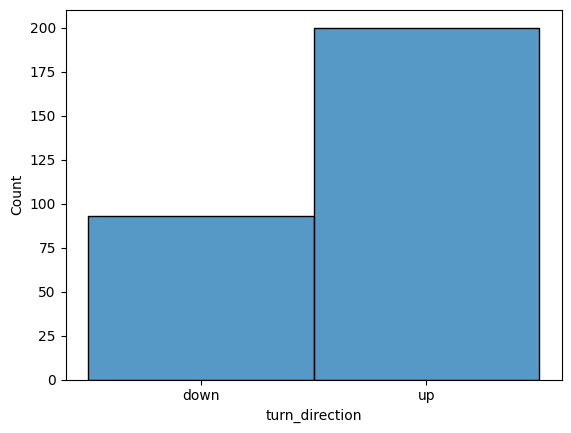

In [27]:
sns.histplot(data = data, x ='turn_direction')

<AxesSubplot: xlabel='turn_to_obstacle', ylabel='Density'>

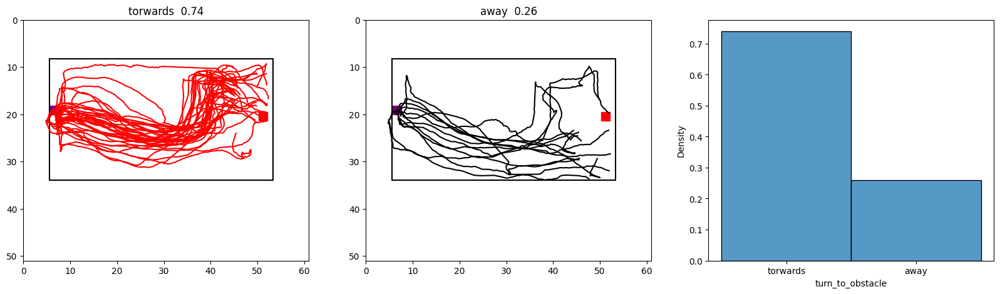

In [85]:
fig,ax = plt.subplots(1,3,figsize = (20,5))
data = short_con_nostart[(short_con_nostart.task == 'oadark')&(short_con_nostart.obstacle_cluster == 1)&(short_con_nostart.linearity > .6)& (short_con_nostart.consective_type ==0)]
plot_arena(data,ax[0])
ax[0].set_title('torwards  ' + str(sum(data.turn_to_obstacle == 'torwards')/len(data)))
ax[1].set_title('away  ' + str(sum(data.turn_to_obstacle == 'away')/len(data)))
plot_arena(data,ax[1])
for ind,row in data.iterrows():
    if row.turn_to_obstacle == 'torwards':
        ax[0].plot(row.ts_nose_x_cm,row.ts_nose_y_cm, c= 'red')
    else:
        ax[1].plot(row.ts_nose_x_cm,row.ts_nose_y_cm, c= 'black')

sns.histplot(ax =ax[2] ,data=data,x='turn_to_obstacle',stat='density',common_norm=False,multiple='dodge')

<AxesSubplot: xlabel='turn_to_obstacle', ylabel='Density'>

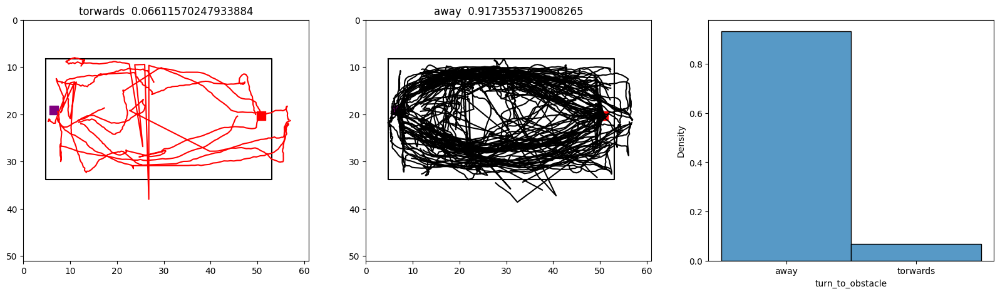

In [123]:
fig,ax = plt.subplots(1,3,figsize = (20,5))
data = con_df[(con_df.task == 'oadark')&(con_df.obstacle_cluster == 2)& (con_df.consective_type ==0)]
plot_arena(data,ax[0])
ax[0].set_title('torwards  ' + str(sum(data.turn_to_obstacle == 'torwards')/len(data)))
ax[1].set_title('away  ' + str(sum(data.turn_to_obstacle == 'away')/len(data)))
plot_arena(data,ax[1])
for ind,row in data.iterrows():
    if row.turn_to_obstacle == 'torwards':
        ax[0].plot(row.ts_nose_x_cm,row.ts_nose_y_cm, c= 'red')
    else:
        ax[1].plot(row.ts_nose_x_cm,row.ts_nose_y_cm, c= 'black')

sns.histplot(ax =ax[2] ,data=data,x='turn_to_obstacle',stat='density',common_norm=False,multiple='dodge')

<AxesSubplot: xlabel='turn_to_obstacle', ylabel='Density'>

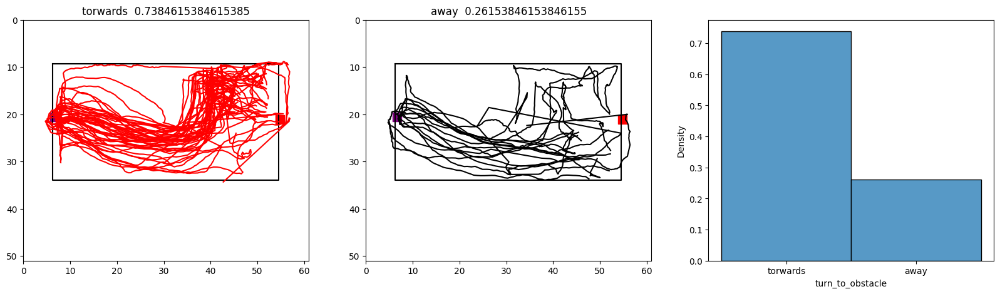

In [86]:
fig,ax = plt.subplots(1,3,figsize = (20,5))
data = short_con_nostart[(short_con_nostart.task == 'oadark')&(short_con_nostart.obstacle_cluster == 1)& (short_con_nostart.consective_type ==0)]
plot_arena(data,ax[0])
ax[0].set_title('torwards  ' + str(sum(data.turn_to_obstacle == 'torwards')/len(data)))
ax[1].set_title('away  ' + str(sum(data.turn_to_obstacle == 'away')/len(data)))
plot_arena(data,ax[1])
for ind,row in data.iterrows():
    if row.turn_to_obstacle == 'torwards':
        ax[0].plot(row.ts_nose_x_cm,row.ts_nose_y_cm, c= 'red')
    else:
        ax[1].plot(row.ts_nose_x_cm,row.ts_nose_y_cm, c= 'black')

sns.histplot(ax =ax[2] ,data=data,x='turn_to_obstacle',stat='density',common_norm=False,multiple='dodge')

<AxesSubplot: xlabel='turn_to_obstacle', ylabel='Density'>

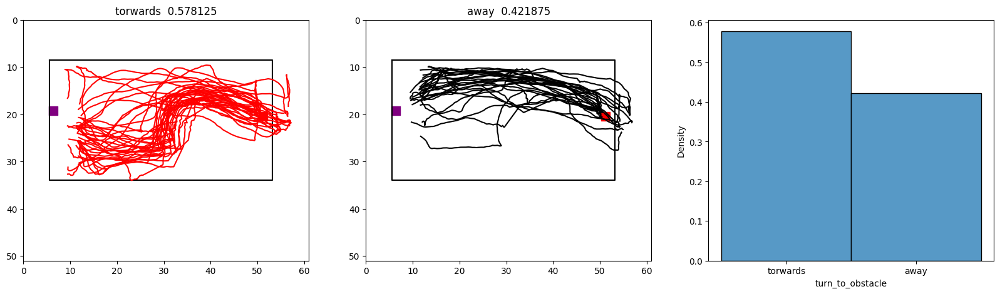

In [78]:
fig,ax = plt.subplots(1,3,figsize = (20,5))
data = long_con_nostart[(long_con_nostart.task == 'oadark')&(long_con_nostart.obstacle_cluster == 5)&(long_con_nostart.linearity > .7)& (long_con_nostart.consective_type ==0)]
plot_arena(data,ax[0])
ax[0].set_title('torwards  ' + str(sum(data.turn_to_obstacle == 'torwards')/len(data)))
ax[1].set_title('away  ' + str(sum(data.turn_to_obstacle == 'away')/len(data)))
plot_arena(data,ax[1])
for ind,row in data.iterrows():
    if row.turn_to_obstacle == 'torwards':
        ax[0].plot(row.ts_nose_x_cm,row.ts_nose_y_cm, c= 'red')
    else:
        ax[1].plot(row.ts_nose_x_cm,row.ts_nose_y_cm, c= 'black')

sns.histplot(ax =ax[2] ,data=data,x='turn_to_obstacle',stat='density',common_norm=False,multiple='dodge')

In [677]:
turn_direction(data)
turn_to_obstacle(data)

<AxesSubplot: xlabel='turn_to_obstacle', ylabel='Density'>

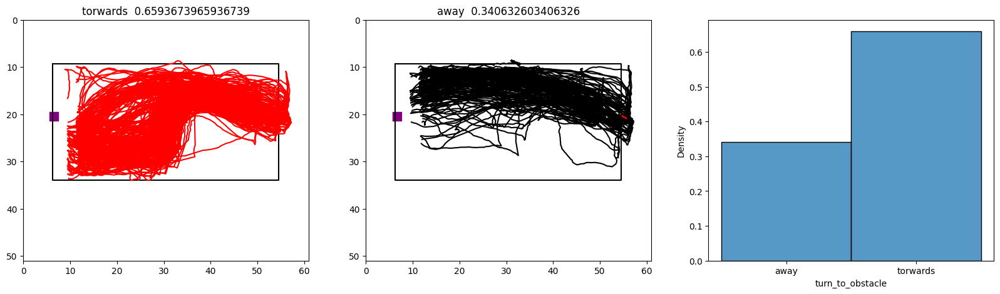

In [678]:
fig,ax = plt.subplots(1,3,figsize = (20,5))
plot_arena(data,ax[0])
ax[0].set_title('torwards  ' + str(sum(data.turn_to_obstacle == 'torwards')/len(data)))
ax[1].set_title('away  ' + str(sum(data.turn_to_obstacle == 'away')/len(data)))
plot_arena(data,ax[1])
for ind,row in data.iterrows():
    if row.turn_to_obstacle == 'torwards':
        ax[0].plot(row.ts_nose_x_cm,row.ts_nose_y_cm, c= 'red')
    else:
        ax[1].plot(row.ts_nose_x_cm,row.ts_nose_y_cm, c= 'black')

sns.histplot(ax =ax[2] ,data=data,x='turn_to_obstacle',stat='density',common_norm=False,multiple='dodge')


In [ ]:
turn_direction(data)
turn_to_obstacle(data)

<AxesSubplot: xlabel='turn_to_obstacle', ylabel='Density'>

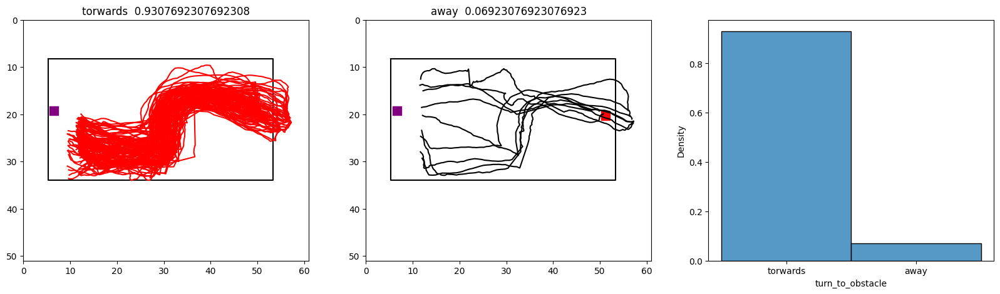

In [654]:
fig,ax = plt.subplots(1,3,figsize = (20,5))
data = long_nostart[(long_nostart.task == 'oadark')&(long_nostart.obstacle_cluster == 5)&(long_nostart.linearity > .7)&(long_nostart.distance_at_head_turn <8)]
plot_arena(data,ax[0])
ax[0].set_title('torwards  ' + str(sum(data.turn_to_obstacle == 'torwards')/len(data)))
ax[1].set_title('away  ' + str(sum(data.turn_to_obstacle == 'away')/len(data)))
plot_arena(data,ax[1])
for ind,row in data.iterrows():
    if row.turn_to_obstacle == 'torwards':
        ax[0].plot(row.ts_nose_x_cm,row.ts_nose_y_cm, c= 'red')
    else:
        ax[1].plot(row.ts_nose_x_cm,row.ts_nose_y_cm, c= 'black')

sns.histplot(ax =ax[2] ,data=data,x='turn_to_obstacle',stat='density',common_norm=False,multiple='dodge')


In [123]:
from scipy.signal import find_peaks

In [670]:

def turn_direction(df):
    for ind,row in df.iterrows():
        peaks, _ = find_peaks(np.abs(row.head_angle_velocity), height=(1,10))
        head_direction = row.head_angle_velocity[peaks[0]]
        
        if head_direction < 0:
            df.at[ind,'turn_direction'] = 'up'
        elif head_direction> 0:
            df.at[ind,'turn_direction'] = 'down'


In [665]:
row.head_angle_velocity[peaks[0]]

-1.3995253382529516

-5.047487727736993


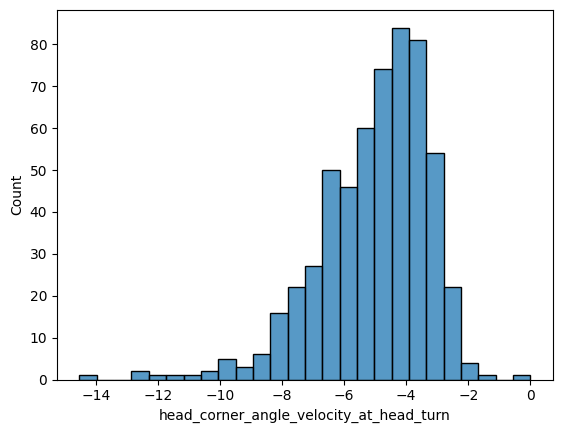

In [197]:
data = long_nostart[(long_nostart.obstacle_cluster == 5) & (long_nostart.task =='oa' )& (long_nostart.turn_to_obstacle =='towards' )]
sns.histplot(data = data,x = 'head_corner_angle_velocity_at_head_turn')
print(data.head_corner_angle_velocity_at_head_turn.mean())

-5.445732261619578


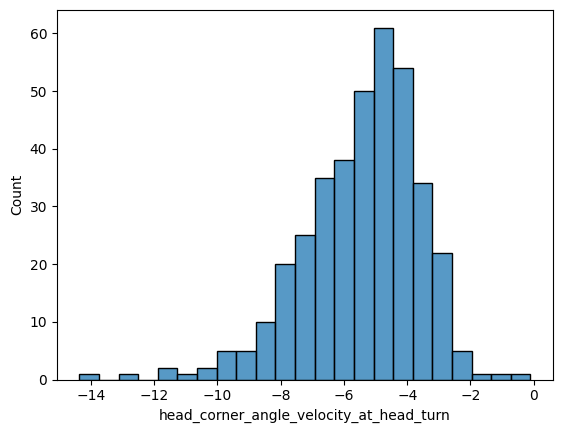

In [200]:
data = long_nostart[(long_nostart.obstacle_cluster == 5) & (long_nostart.task =='oadark' )& (long_nostart.turn_to_obstacle =='towards' )]
sns.histplot(data = data,x = 'head_corner_angle_velocity_at_head_turn')
print(data.head_corner_angle_velocity_at_head_turn.mean())

In [ ]:
data = long_nostart[(long_nostart.obstacle_cluster == 0)&(long_nostart.task == 'oadark')]
    
for ind,row in data.sample(20).iterrows():
    fig,ax = plt.subplots(1,3,figsize=(18,5))
    
    #ax[1].set_xlim(20,0)
    


    ax[0].set_xticks([])
    ax[0].set_yticks([])
    ax[1].invert_xaxis()
    ax[2].invert_xaxis()
    plot_arena(data,ax[0])
    plot_orginal_obstacle(data,ax[0],int(row.obstacle_cluster))


    trial_df = data.loc[[ind]]

    for ind,row in trial_df.iterrows():
        
        ax[1].set_title('head_corner_angle_velocity_at_head_turn head '+ str(row.head_corner_angle_velocity_at_head_turn) + ' '+row.task )

        #ax[1].set_ylim(-12,2)
        ax[1].set_xlabel('distance to obstacle')
        ob_ind = int(row.obstacle_ind)
  
        ax[0].plot(smooth(row.ts_nose_x_cm),smooth(row.ts_nose_y_cm),color = 'tab:blue')
        ax[1].plot(row.ts_distance_from_edge[:ob_ind],smooth(row.ts_zero_out_angle_to_corner[:ob_ind]),color = 'tab:blue')
        ax[2].plot(row.ts_distance_from_edge[:ob_ind],smooth(row.lateral_error[:ob_ind]),color = 'tab:blue')

In [223]:
long_nostart

,level_0,first_poke,second_poke,trial_timestamps,trial_vidframes,nose_x,nose_y,leftear_x,leftear_y,rightear_x,...,distance,ts_distance,total_distance,ts_total_distance,intial_head_angle_velocity,turn_direction,turn_to_obstacle,obstacle_cross,turn_direction_end,head_corner_angle_velocity_at_head_turn
8,8,48098.019340,48102.816128,"[48098.031385, 48098.048576, 48098.06464, 4809...","[[3308, 3309, 3310, 3311, 3312, 3313, 3314, 33...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[649.9629516601562, 650.8632202148438, 650.746...","[252.6468963623047, 251.91566467285156, 251.48...","[656.01318359375, 656.386474609375, 656.445373...",...,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[0.2513756099763498, 0.19898440343310853, 0.06...",96.548460,91.543341,-0.788911,up,towards,True,down,-4.804871
12,12,48241.539046,48248.838630,"[48241.547481, 48241.565235, 48241.580953, 482...","[[11916, 11917, 11918, 11919, 11920, 11921, 11...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[652.07373046875, 652.8219604492188, 653.89038...","[250.80914306640625, 250.58074951171875, 251.1...","[651.4325561523438, 654.0964965820312, 655.288...",...,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[0.35134222548062155, 0.26129782505547183, 0.0...",99.999324,94.972351,0.769610,down,away,True,down,-3.412342
17,17,48338.593881,48344.042022,"[48338.598041, 48338.614617, 48338.631424, 483...","[[17737, 17738, 17739, 17740, 17741, 17742, 17...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[650.9925537109375, 652.1788330078125, 652.823...","[254.21148681640625, 254.0948028564453, 254.07...","[656.2599487304688, 657.4254150390625, 658.723...",...,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[0.27332073111630706, 0.23855250387635962, 0.3...",96.098557,84.350043,-0.163803,down,away,True,down,-4.175209
22,22,48405.855897,48411.627596,"[48405.87136, 48405.887923, 48405.905356, 4840...","[[21772, 21773, 21774, 21775, 21776, 21777, 21...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[649.687255859375, 650.2926635742188, 650.7012...","[253.7032012939453, 253.50595092773438, 253.01...","[653.541748046875, 654.0216064453125, 654.7687...",...,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[0.7825611354660715, 0.28231269706202156, 0.26...",103.366108,96.751671,0.947124,down,away,True,down,-6.347282
24,24,48420.115289,48424.506713,"[48420.126092, 48420.143462, 48420.159539, 484...","[[22627, 22628, 22629, 22630, 22631, 22632, 22...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[647.6133422851562, 648.2860107421875, 648.863...","[258.9119873046875, 258.0534973144531, 257.625...","[656.2706298828125, 656.6029052734375, 656.868...",...,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[0.33576022073820155, 0.5436012328964797, 0.62...",88.389980,71.480402,-0.207297,up,towards,True,down,-3.941995
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14500,14500,55707.396288,55709.968704,"[55707.397785, 55707.413273, 55707.429952, 557...","[1699, 1700, 1701, 1702, 1703, 1704, 1705, 170...","[85.73371887207031, 85.64871215820312, 85.2961...","[265.4951477050781, 266.3911437988281, 267.019...","[101.66258239746094, 100.84394836425781, 100.1...","[263.1623229980469, 263.7874755859375, 264.255...","[95.14884185791016, 94.4954833984375, 94.34394...",...,"[0.07352345713537822, 0.07350401586410982, 0.1...","[0.644520455997835, 0.5482724399547223, 0.5772...",66.632390,49.172307,-1.479420,up,away,True,up,-4.879329
14515,14515,55791.531097,55794.455846,"[55791.542259, 55791.559129, 55791.576678, 557...","[6746, 6747, 6748, 6749, 6750, 6751, 6752, 675...","[87.90170288085938, 87.47258758544922, 86.7386...","[262.3829650878906, 262.2216796

In [278]:
long.columns.to_numpy()

array(['level_0', 'first_poke', 'second_poke', 'trial_timestamps',
       'trial_vidframes', 'nose_x', 'nose_y', 'leftear_x', 'leftear_y',
       'rightear_x', 'rightear_y', 'spine_x', 'spine_y', 'midspine_x',
       'midspine_y', 'tailbase_x', 'tailbase_y', 'midtail_x', 'midtail_y',
       'tailend_x', 'tailend_y', 'arenaTL_x', 'arenaTL_y', 'arenaTR_x',
       'arenaTR_y', 'arenaBL_x', 'arenaBL_y', 'arenaBR_x', 'arenaBR_y',
       'arenaTLouter_x', 'arenaTLouter_y', 'arenaTRouter_x',
       'arenaTRouter_y', 'arenaBLouter_x', 'arenaBLouter_y',
       'arenaBRouter_x', 'arenaBRouter_y', 'obstacleTL_x', 'obstacleTL_y',
       'obstacleTR_x', 'obstacleTR_y', 'obstacleBR_x', 'obstacleBR_y',
       'obstacleBL_x', 'obstacleBL_y', 'leftportT_x', 'leftportT_y',
       'leftportB_x', 'leftportB_y', 'rightportT_x', 'rightportT_y',
       'rightportB_x', 'rightportB_y', 'len', 'animal', 'date', 'task',
       'condition', 'nose_x_cm', 'nose_y_cm', 'leftear_x_cm',
       'leftear_y_cm', 'rightea

In [332]:
dark

,level_0,first_poke,second_poke,trial_timestamps,trial_vidframes,nose_x,nose_y,leftear_x,leftear_y,rightear_x,...,ts_distance,total_distance,ts_total_distance,intial_head_angle_velocity,turn_direction,turn_to_obstacle,obstacle_cross,turn_direction_end,consective_inds,consective_type
13557,13557,56266.953228,56269.192780,"[56266.967897, 56266.984217, 56267.001152, 562...","[6758, 6759, 6760, 6761, 6762, 6763, 6764, 676...","[83.8111801147461, 83.1069564819336, 82.816688...","[262.85260009765625, 262.681640625, 263.103271...","[101.1766357421875, 99.33380889892578, 98.7341...","[260.5023498535156, 261.5918884277344, 261.873...","[92.29588317871094, 91.58029174804688, 91.2165...",...,"[0.830841790620406, 0.7367409373397393, 0.8153...",80.272742,66.484889,-2.372149,up,towards,False,up,"[13557, 13558, 13559]",0
13296,13296,53997.266969,54000.216204,"[53997.283622, 53997.300224, 53997.316633, 539...","[10598, 10599, 10600, 10601, 10602, 10603, 106...","[84.95125579833984, 84.53311920166016, 84.2618...","[265.3648986816406, 264.4913330078125, 264.042...","[88.72734832763672, 88.75247192382812, 88.4277...","[265.0933532714844, 264.9820556640625, 264.923...","[92.6189193725586, 91.67707061767578, 92.40997...",...,"[1.0742000244461387, 0.9008291779068234, 0.862...",92.136798,79.056661,-1.787548,up,towards,True,down,"[13296, 13297, 13298, 13299]",0
14255,14255,54946.652262,54949.699712,"[54946.665267, 54946.681715, 54946.699276, 549...","[2192, 2193, 2194, 2195, 2196, 2197, 2198, 219...","[86.28535461425781, 86.48275756835938, 85.8253...","[264.4386901855469, 264.21881103515625, 265.70...","[89.41041564941406, 89.20413208007812, 89.4337...","[264.5402526855469, 263.9268798828125, 264.579...","[92.86599731445312, 92.81825256347656, 92.8508...",...,"[0.9732803327192876, 0.9941886214577949, 0.970...",79.101483,65.395795,-1.327162,up,towards,True,up,"[14255, 14256, 14257, 14258]",0
14280,14280,55025.232371,55027.681817,"[55025.242035, 55025.260326, 55025.275558, 550...","[6905, 6906, 6907, 6908, 6909, 6910, 6911, 691...","[89.71720886230469, 89.27144622802734, 88.2765...","[261.645263671875, 261.2644348144531, 261.5166...","[94.94011688232422, 93.6307601928711, 92.81883...","[266.3523254394531, 266.0227966308594, 266.280...","[102.93121337890625, 101.56925964355469, 99.15...",...,"[0.6868371157072133, 0.6606766341283006, 0.619...",82.671176,73.887457,-0.771573,up,towards,True,up,"[14280, 14281, 14282, 14283, 14284, 14285, 142...",0
12483,12483,47927.962304,47932.079001,"[47927.968537, 47927.985216, 47928.002944, 479...","[8782, 8783, 8784, 8785, 8786, 8787, 8788, 878...","[94.58734893798828, 94.02836608886719, 93.2737...","[262.4986572265625, 262.917724609375, 263.0374...","[109.66114807128906, 108.56788635253906, 106.2...","[258.1771545410156, 258.8851623535156, 259.723...","[102.47815704345703, 101.55778503417969, 100.4...",...,"[0.6914620551620274, 0.8623607104421467, 0.746...",92.378170,79.519873,-2.863863,up,towards,True,up,"[12483, 12484, 12485]",0
14186,14186,57392.025497,57394.872307,"[57392.033894, 57392.05056, 57392.068569, 5739...","[1430, 1431, 1432, 1433, 1434, 1435, 1436, 143...","[90.3443374633789, 90.94746398925781, 91.79848...","[263.2568054199219, 263.12200927734375, 262.77...","[94.48356628417969, 94.67569732666016, 95.4309...","[264.67822265625, 265.3460998535156, 264.62265...","[98.84793853759766, 99.05382537841797, 99.8365...",...,"[0.644730031293637, 0.7225033694251053, 0.5537...",75.350453,65.283255,-1.066484,up,towards,True,up,"[14186, 14187, 14188]",0
14400,14400,56981.706982,56986.077875,"[56981.719129, 56981.735219, 56981.751936, 569...","[27863, 27864, 27865, 27866, 27867, 27868, 278...","[89.45130920410156, 89.6420669555664, 90.14708...","[263.00665283203125, 263.5997619628906, 263.24...","[95.75299072265625, 95.8979263305664, 96.09545...","[257.9877624511719, 258.4393005371094, 258.556...","[96.43145751953125, 96.69805145263672, 96.9236...",...,"[0.44538275642943503, 0.4610358008030193, 0.49...",83.680759,66.98

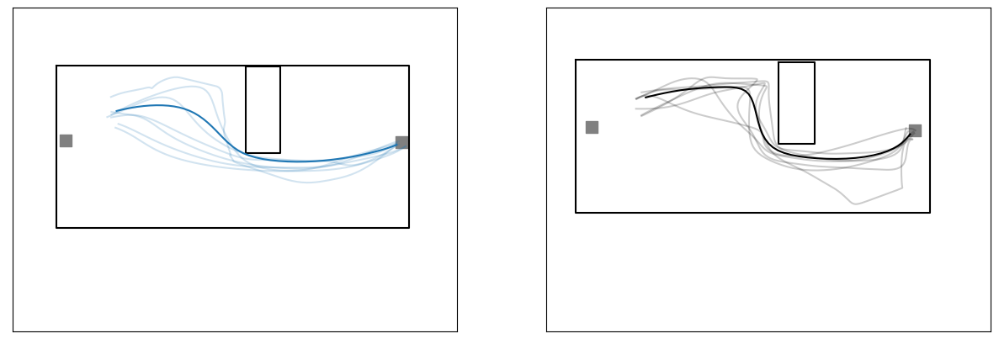

In [340]:
plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['ps.fonttype'] = 42
light = long_con_nostart[(long_con_nostart.obstacle_cluster == 1)&(long_con_nostart.task == 'oa')&(long_con_nostart.turn_to_obstacle == 'towards')&(long_con_nostart.consective_type==2)]
light = light[light['animal'].isin(['G8CKRT', 'G8CKLT', 'G8CKTT', 'G8CKRN', 'G8CKLN'])]

dark = long_con_nostart[(long_con_nostart.obstacle_cluster == 1)&(long_con_nostart.task == 'oadark')&(long_con_nostart.turn_to_obstacle == 'towards')&(long_con_nostart.consective_type==2)]

dark = dark[dark['animal'].isin(['G8CKRT', 'G8CKLT', 'G8CKTT', 'G8CKRN', 'G8CKLN'])]
fig,ax = plt.subplots(1,2,figsize=(15,5))
ax[0].set_xticks([])
ax[0].set_yticks([])
ax[1].set_xticks([])
ax[1].set_yticks([])

plot_arena(light,ax[0])
plot_arena(dark,ax[1])

plot_orginal_obstacle(light,ax[0],5)
plot_orginal_obstacle(dark,ax[1],5,correct=True,corect_y=0)

dark_nose_x = smooth(get_median_of_df(dark,'ts_nose_x_cm',50))
dark_nose_y = smooth(get_median_of_df(dark,'ts_nose_y_cm',50))

light_nose_x = smooth(get_median_of_df(light,'ts_nose_x_cm',50))
light_nose_y = smooth(get_median_of_df(light,'ts_nose_y_cm',50))

ax[1].plot(dark_nose_x,dark_nose_y,color = 'black')
ax[0].plot(light_nose_x,light_nose_y)

light_sample = light.sample(7)
for ind,row in light_sample.iterrows():
    ax[0].plot(smooth(row.ts_nose_x_cm),smooth(row.ts_nose_y_cm),alpha = .2 ,c = 'tab:blue')

dark_sample = dark.sample(7)
for ind,row in dark_sample.iterrows():
    ax[1].plot(smooth(row.ts_nose_x_cm),smooth(row.ts_nose_y_cm),alpha = .2 ,c = 'black')

#fig.savefig(r'd:\obstacle_avoidance\figures\SFN/light_dark_traces3.pdf')

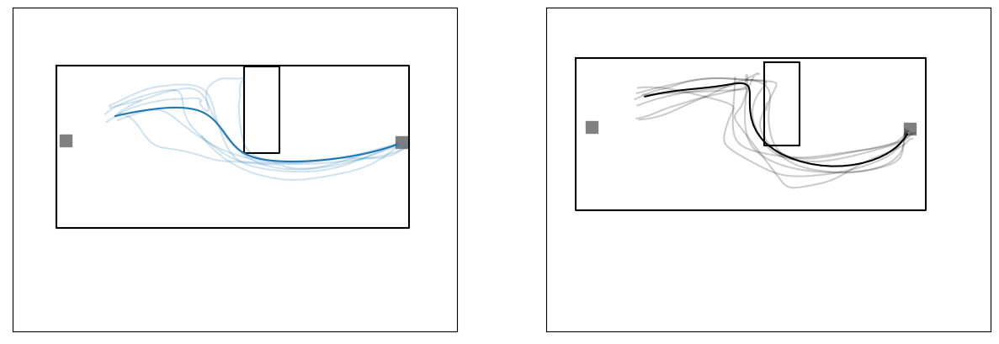

In [338]:
plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['ps.fonttype'] = 42
light = long_con_nostart[(long_con_nostart.obstacle_cluster == 1)&(long_con_nostart.task == 'oa')&(long_con_nostart.turn_to_obstacle == 'towards')&(long_con_nostart.consective_type==0)]
light = light[light['animal'].isin(['G8CKRT', 'G8CKLT', 'G8CKTT', 'G8CKRN', 'G8CKLN'])]

dark = long_con_nostart[(long_con_nostart.obstacle_cluster == 1)&(long_con_nostart.task == 'oadark')&(long_con_nostart.turn_to_obstacle == 'towards')&(long_con_nostart.consective_type==0)]

dark = dark[dark['animal'].isin(['G8CKRT', 'G8CKLT', 'G8CKTT', 'G8CKRN', 'G8CKLN'])]
fig,ax = plt.subplots(1,2,figsize=(15,5))
ax[0].set_xticks([])
ax[0].set_yticks([])
ax[1].set_xticks([])
ax[1].set_yticks([])

plot_arena(light,ax[0])
plot_arena(dark,ax[1])

plot_orginal_obstacle(light,ax[0],5)
plot_orginal_obstacle(dark,ax[1],5,correct=True,corect_y=0)

dark_nose_x = smooth(get_median_of_df(dark,'ts_nose_x_cm',50))
dark_nose_y = smooth(get_median_of_df(dark,'ts_nose_y_cm',50))

light_nose_x = smooth(get_median_of_df(light,'ts_nose_x_cm',50))
light_nose_y = smooth(get_median_of_df(light,'ts_nose_y_cm',50))

ax[1].plot(dark_nose_x,dark_nose_y,color = 'black')
ax[0].plot(light_nose_x,light_nose_y)

light_sample = light.sample(7)
for ind,row in light_sample.iterrows():
    ax[0].plot(smooth(row.ts_nose_x_cm),smooth(row.ts_nose_y_cm),alpha = .2 ,c = 'tab:blue')

dark_sample = dark.sample(7)
for ind,row in dark_sample.iterrows():
    ax[1].plot(smooth(row.ts_nose_x_cm),smooth(row.ts_nose_y_cm),alpha = .2 ,c = 'black')

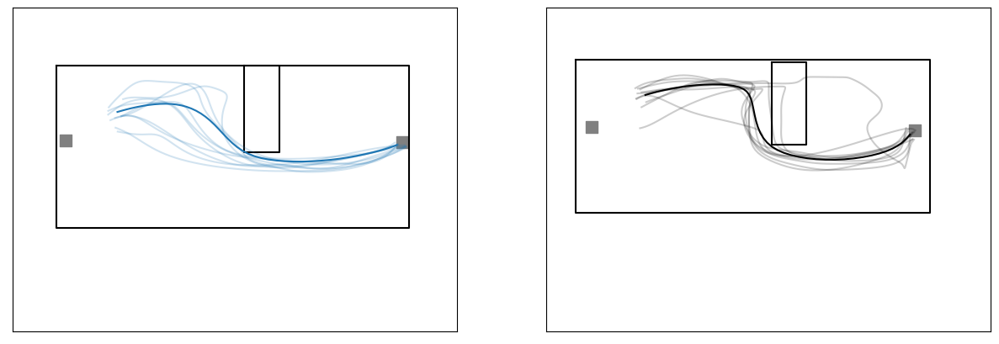

In [688]:
plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['ps.fonttype'] = 42
light = long[(long.obstacle_cluster == 1)&(long.task == 'oa')&(long.turn_to_obstacle == 'towards')]
light = light[light['animal'].isin(['G8CKRT', 'G8CKLT', 'G8CKTT', 'G8CKRN', 'G8CKLN'])]

dark = long[(long.obstacle_cluster == 1)&(long.task == 'oadark')&(long.turn_to_obstacle == 'towards')]

dark = dark[dark['animal'].isin(['G8CKRT', 'G8CKLT', 'G8CKTT', 'G8CKRN', 'G8CKLN'])]
fig,ax = plt.subplots(1,2,figsize=(15,5))
ax[0].set_xticks([])
ax[0].set_yticks([])
ax[1].set_xticks([])
ax[1].set_yticks([])

plot_arena(light,ax[0])
plot_arena(dark,ax[1])

plot_orginal_obstacle(light,ax[0],5)
plot_orginal_obstacle(dark,ax[1],5,correct=True,corect_y=0)

dark_nose_x = smooth(get_median_of_df(dark,'ts_nose_x_cm',50))
dark_nose_y = smooth(get_median_of_df(dark,'ts_nose_y_cm',50))

light_nose_x = smooth(get_median_of_df(light,'ts_nose_x_cm',50))
light_nose_y = smooth(get_median_of_df(light,'ts_nose_y_cm',50))

ax[1].plot(dark_nose_x,dark_nose_y,color = 'black')
ax[0].plot(light_nose_x,light_nose_y)

light_sample = light.sample(10)
for ind,row in light_sample.iterrows():
    ax[0].plot(smooth(row.ts_nose_x_cm),smooth(row.ts_nose_y_cm),alpha = .2 ,c = 'tab:blue')

dark_sample = dark.sample(10)
for ind,row in dark_sample.iterrows():
    ax[1].plot(smooth(row.ts_nose_x_cm),smooth(row.ts_nose_y_cm),alpha = .2 ,c = 'black')

#fig.savefig(r'd:\obstacle_avoidance\figures\SFN/light_dark_traces3.pdf')


In [703]:
long[long.turn_to_obstacle == 'towards']

,level_0,first_poke,second_poke,trial_timestamps,trial_vidframes,nose_x,nose_y,leftear_x,leftear_y,rightear_x,...,distance,ts_distance,total_distance,ts_total_distance,intial_head_angle_velocity,turn_direction,turn_to_obstacle,obstacle_cross,turn_direction_end,head_corner_angle_velocity_at_head_turn
8,8,48098.019340,48102.816128,"[48098.031385, 48098.048576, 48098.06464, 4809...","[[3308, 3309, 3310, 3311, 3312, 3313, 3314, 33...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[649.9629516601562, 650.8632202148438, 650.746...","[252.6468963623047, 251.91566467285156, 251.48...","[656.01318359375, 656.386474609375, 656.445373...",...,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[0.2513756099763498, 0.19898440343310853, 0.06...",96.548460,91.543341,-0.788911,up,towards,True,down,-4.804871
24,24,48420.115289,48424.506713,"[48420.126092, 48420.143462, 48420.159539, 484...","[[22627, 22628, 22629, 22630, 22631, 22632, 22...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[647.6133422851562, 648.2860107421875, 648.863...","[258.9119873046875, 258.0534973144531, 257.625...","[656.2706298828125, 656.6029052734375, 656.868...",...,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[0.33576022073820155, 0.5436012328964797, 0.62...",88.389980,71.480402,-0.207297,up,towards,True,down,-3.941995
27,27,48451.833305,48459.674124,"[48451.837196, 48451.85399, 48451.870681, 4845...","[[24529, 24530, 24531, 24532, 24533, 24534, 24...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[647.6234741210938, 647.111083984375, 647.8052...","[258.09979248046875, 256.70001220703125, 256.1...","[653.6805419921875, 654.243408203125, 654.8812...",...,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[0.05833232690023138, 0.08215387068589308, 0.0...",102.215734,88.411867,-0.160381,up,towards,True,down,-5.014465
49,49,48679.844134,48684.862156,"[48679.849856, 48679.865958, 48679.882649, 486...","[[38205, 38206, 38207, 38208, 38209, 38210, 38...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[650.8657836914062, 650.9302978515625, 651.648...","[253.11341857910156, 252.92771911621094, 252.8...","[654.2478637695312, 655.6620483398438, 656.662...",...,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[0.5980413761900394, 0.29551135309745646, 0.54...",80.158969,65.216280,-0.433031,up,towards,True,up,-3.233771
103,103,48994.402675,49001.014246,"[48994.408371, 48994.425011, 48994.441971, 489...","[[57072, 57073, 57074, 57075, 57076, 57077, 57...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[649.601806640625, 650.2275390625, 650.9002075...","[249.01614379882812, 248.92355346679688, 249.2...","[649.50830078125, 650.3995361328125, 651.19824...",...,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[0.7457187578758937, 0.4944745240253834, 0.776...",92.264250,82.131035,-0.723706,up,towards,True,up,-2.836947
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14456,14456,58284.241510,58286.769433,"[58284.250803, 58284.267686, 58284.284518, 582...","[10663, 10664, 10665, 10666, 10667, 10668, 106...","[87.75959014892578, 86.99541473388672, 86.5253...","[260.9606018066406, 261.192138671875, 260.8676...","[101.29974365234375, 99.75284576416016, 98.431...","[256.0437316894531, 256.8573913574219, 257.122...","[94.1467056274414, 93.94309997558594, 93.60278...",...,"[0.07370879706571642, 0.05882019612903555, 0.0...","[0.9817462807765356, 1.027153068505367, 1.1204...",74.684710,62.618490,1.676589,down,towards,True,up,-7.609932
14459,14459,58310.359923,58312.854592,"[58310.360256, 58310.376601, 58310.39406, 5831...","[12229, 12230, 12231, 12232, 12233, 12234, 122...","[86.841064453125, 86.9388427734375, 86.4898529...","[257.9836730957031, 258.

In [718]:
np.arange(0,1,.2)

array([0. , 0.2, 0.4, 0.6, 0.8])

<AxesSubplot: xlabel='task', ylabel='linearity'>

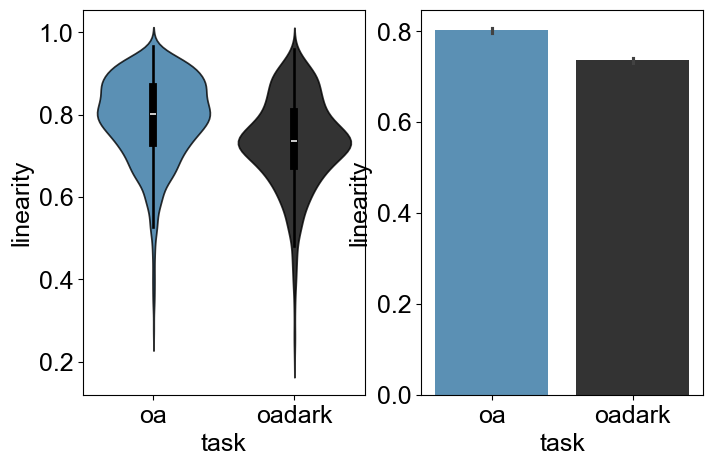

In [101]:
light_dark = long[long.turn_to_obstacle == 'towards']
fig,ax = plt.subplots(1,2, figsize= (8,5))
color =['tab:blue','black']
ax[1].set_yticks(np.arange(0,1,.2))
sns.violinplot(data = light_dark, x ='task', y = 'linearity', hue = 'task',ax = ax[0],palette = color,alpha = .8)
sns.barplot(data = light_dark, x ='task', y = 'linearity', hue = 'task',ax = ax[1],estimator='median',palette = color,alpha = .8)

Text(0, 0.5, 'path efficiency')

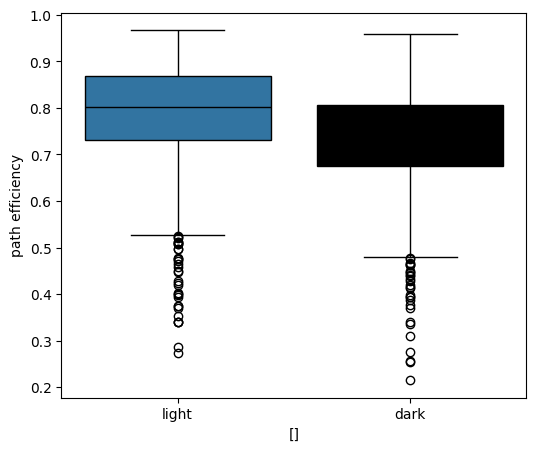

In [729]:
fig,ax = plt.subplots( figsize= (6,5))
sns.boxplot(data = light_dark, x ='task', y = 'linearity', hue = 'task',ax = ax,palette = color)
ax.set_xticks([0,1],['light','dark'])
ax.set_xlabel([])
ax.set_ylabel('path efficiency')

Text(0, 0.5, 'path efficiency')

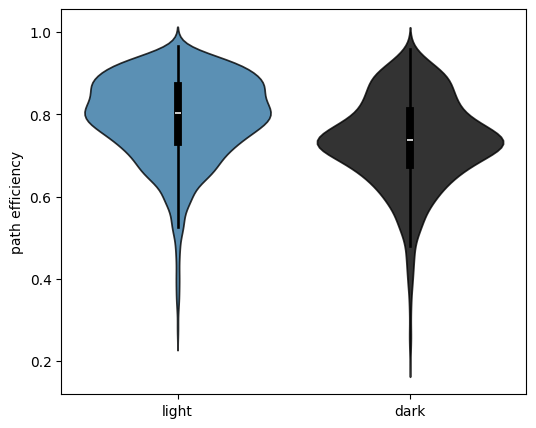

In [731]:
fig,ax = plt.subplots( figsize= (6,5))
sns.violinplot(data = light_dark, x ='task', y = 'linearity', hue = 'task',ax = ax,palette = color,alpha = .8)
ax.set_xticks([0,1],['light','dark'])
ax.set_xlabel('')
ax.set_ylabel('path efficiency')



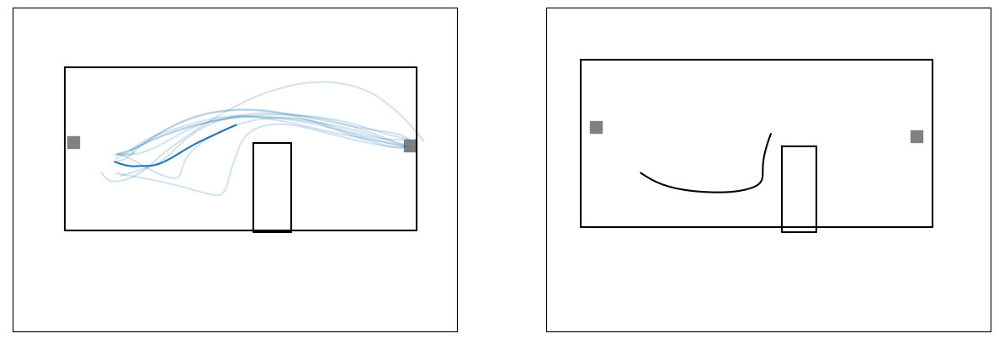

In [293]:
plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['ps.fonttype'] = 42
light = long[(long.obstacle_cluster == 5)&(long.task == 'oa')&(long.date_index == 6)&(long.turn_to_obstacle == 'towards')]

dark = long[(long.obstacle_cluster == 5)&(long.task == 'oadark')&(long.date_index == 0)&(long.turn_to_obstacle == 'towards')]
fig,ax = plt.subplots(1,2,figsize=(15,5))
ax[0].set_xticks([])
ax[0].set_yticks([])
ax[1].set_xticks([])
ax[1].set_yticks([])

plot_arena(light,ax[0])
plot_arena(dark,ax[1])

plot_orginal_obstacle(light,ax[0],5)
plot_orginal_obstacle(dark,ax[1],5,correct=True)

dark_nose_x = smooth(get_median_of_df(dark,'obstacle_nose_x',50))
dark_nose_y = smooth(get_median_of_df(dark,'obstacle_nose_y',50))

light_nose_x = smooth(get_median_of_df(light,'obstacle_nose_x',50))
light_nose_y = smooth(get_median_of_df(light,'obstacle_nose_y',50))

ax[1].plot(dark_nose_x,dark_nose_y,color = 'black')
ax[0].plot(light_nose_x,light_nose_y)

light_sample = light.sample(10)
for ind,row in light_sample.iterrows():
    ax[0].plot(smooth(row.ts_nose_x_cm),smooth(row.ts_nose_y_cm),alpha = .2 ,c = 'tab:blue')




In [398]:
np.arange(-1,25,4)

array([-1,  3,  7, 11, 15, 19, 23])

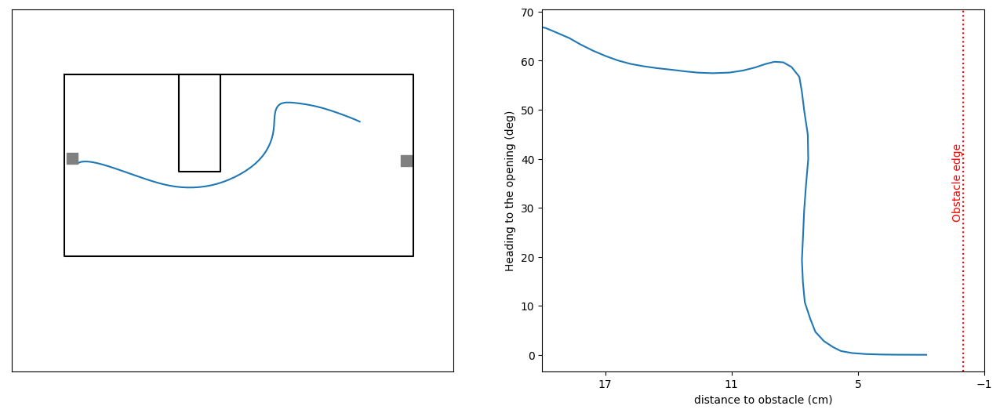

In [407]:
#data = long[(long.obstacle_cluster == 0)&(long.task == 'oa')&(long.head_corner_angle_velocity_at_head_turn <= -5)]
#sample = data.sample(1)
plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['ps.fonttype'] = 42  
for ind,row in sample.iterrows():
    fig,ax = plt.subplots(1,2,figsize=(16,6))
    
    #ax[1].set_xlim(20,0)
    


    ax[0].set_xticks([])
    ax[0].set_yticks([])
    ax[1].set_xticks(np.arange(-1,20,6))
    ax[1].set_xlim(-1,20)
    ax[1].invert_xaxis()
    ax[1].set_ylabel('Heading to the opening (deg)')
    ax[1].set_xlabel('Distance to obstacle')
    #ax[2].invert_xaxis()
    plot_arena(data,ax[0])
    plot_orginal_obstacle(data,ax[0],int(row.obstacle_cluster))


    trial_df = data.loc[[ind]]

    for ind,row in trial_df.iterrows():
        
        #ax[1].set_title('head_corner_angle_velocity_at_head_turn head '+ str(row.head_corner_angle_velocity_at_head_turn) + ' '+row.task )

        #ax[1].set_ylim(-12,2)
        ax[1].set_xlabel('distance to obstacle (cm)')
        ob_ind = int(row.obstacle_ind)
  
        ax[0].plot(smooth(row.ts_nose_x_cm),smooth(row.ts_nose_y_cm),color = 'tab:blue')
        ax[1].plot(row.ts_distance_from_edge[:ob_ind],smooth(row.ts_zero_out_angle_to_corner[:ob_ind]),color = 'tab:blue')
        ax[1].axvline(0, color='r', ls=':')
        ax[1].text(0, ax[1].get_ylim()[1]/2,'Obstacle edge', color='r', ha='right', va='center', rotation=90)
        #ax[2].plot(row.ts_distance_from_edge[:ob_ind],smooth(row.lateral_error[:ob_ind]),color = 'tab:blue')
fig.savefig(r'd:\obstacle_avoidance\figures\SFN/heading_to_opening_light.pdf')
     

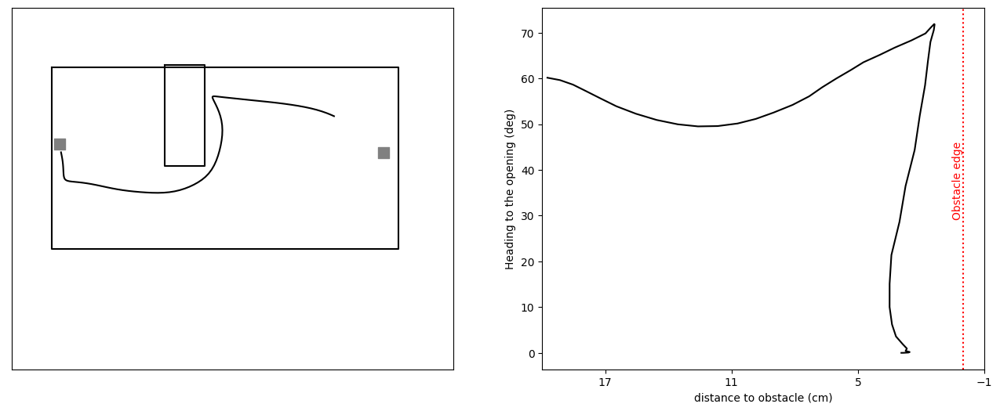

In [433]:
#data = long[(long.obstacle_cluster == 0)&(long.task == 'oadark')&(long.head_corner_angle_velocity_at_head_turn <= -5)]
#sample = data.sample(1)
plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['ps.fonttype'] = 42  
for ind,row in sample.iterrows():
    fig,ax = plt.subplots(1,2,figsize=(16,6))
    
    #ax[1].set_xlim(20,0)
    


    ax[0].set_xticks([])
    ax[0].set_yticks([])
    ax[1].set_xticks(np.arange(-1,20,6))
    ax[1].set_xlim(-1,20)
    ax[1].invert_xaxis()
    ax[1].set_ylabel('Heading to the opening (deg)')
    ax[1].set_xlabel('distance to obstacle (cm)')
    #ax[1].set_xlabel('distance to obstacle')
    #ax[2].invert_xaxis()
    plot_arena(data,ax[0])
    plot_orginal_obstacle(data,ax[0],int(row.obstacle_cluster))


    trial_df = data.loc[[ind]]

    for ind,row in trial_df.iterrows():
        
        #ax[1].set_title('head_corner_angle_velocity_at_head_turn head '+ str(row.head_corner_angle_velocity_at_head_turn) + ' '+row.task )

        #ax[1].set_ylim(-12,2)
        ob_ind = int(row.obstacle_ind)
  
        ax[0].plot(smooth(row.ts_nose_x_cm),smooth(row.ts_nose_y_cm),color = 'black')
        ax[1].plot(row.ts_distance_from_edge[:ob_ind],smooth(row.ts_zero_out_angle_to_corner[:ob_ind]),color = 'black')
        ax[1].axvline(0, color='r', ls=':')
        ax[1].text(0, ax[1].get_ylim()[1]/2,'Obstacle edge', color='r', ha='right', va='center', rotation=90)
        #ax[2].plot(row.ts_distance_from_edge[:ob_ind],smooth(row.lateral_error[:ob_ind]),color = 'black)
fig.savefig(r'd:\obstacle_avoidance\figures\SFN/heading_to_opening_dark.pdf')

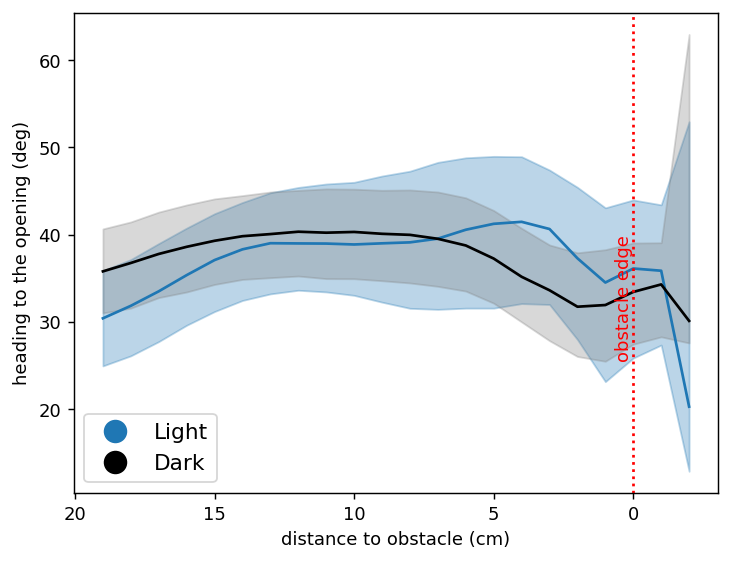

In [10]:

xnew =  np.arange(-2, 20, 1)
xnew= np.flip(xnew)
fig,ax = plt.subplots(dpi = 130)
#fig.suptitle('Heading to the Opening')
ax.invert_xaxis()
data = pd.concat([long_nostart])
data = drop_nans_in_columns(data,'obstacle_ind')
data = data[data.turn_to_obstacle == 'towards']

for date,date_df in  data.groupby(['task']):
  
   
    rows = date_df.shape[0]
    angle_array = np.empty([rows,len(xnew)])
    angle_array[:] =np.nan 
    for i,row in enumerate(date_df.iterrows()):
        x = row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float)
        y = row[1]['ts_speed'][:int(row[1]['obstacle_ind'])].astype(float)
        if sum(y) == 0:
            continue
        else:
            #x = resample(x,20)
            #y = resample(np.flip(np.unique(y)),len(x))
            #y = resample(y,len(x))
            interpolater = interp1d(x,y,bounds_error=False)
            #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['ts_zero_out_angle_to_corner'])
            ynew = interpolater(xnew)
            angle_array[i] = ynew

    date_angle_mean = np.nanmean(angle_array,axis = 0)
    date_angle_median= np.nanmedian(angle_array,axis = 0)

        

    median, q1, q3, iqr = calculate_quartiles(angle_array)
 
    if date == 'oa':
        light_array = angle_array
        ax.fill_between(xnew, q1, q3, color='tab:blue', alpha=0.3, label='IQR')
        #ax.plot(xnew,date_angle_mean,c = 'tab:orange',alpha = 1)
        ax.plot(xnew,date_angle_median,c = 'tab:blue',alpha = 1)
    else:
        ax.fill_between(xnew, q1, q3, color='grey', alpha=0.3, label='IQR')
        #ax.plot(xnew,date_angle_mean,c = 'tab:blue',alpha = 1)
        ax.plot(xnew,date_angle_median,c = 'black',alpha = 1)



        
ax.set_ylabel('heading to the opening (deg)')
ax.set_xlabel('distance to obstacle (cm)')
ax.axvline(0, color='r', ls=':')
ax.text(0, ax.get_ylim()[1]/2,'obstacle edge', color='r', ha='right', va='center', rotation=90)
   
markers = [plt.Line2D([0,0],[0,0],color=color, marker='o', linestyle='',markersize=12) for color in ['tab:blue','black']]
ax.legend(markers, ['Light','Dark'], numpoints=1,loc = 'lower left',fontsize=12)

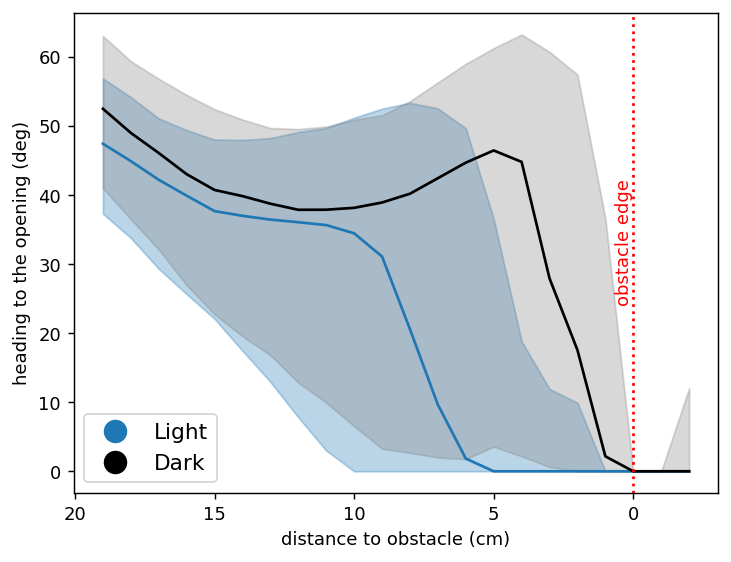

In [9]:

xnew =  np.arange(-2, 20, 1)
xnew= np.flip(xnew)
fig,ax = plt.subplots(dpi = 130)
#fig.suptitle('Heading to the Opening')
ax.invert_xaxis()
data = pd.concat([long_nostart])
data = drop_nans_in_columns(data,'obstacle_ind')
data = data[data.turn_to_obstacle == 'towards']

for date,date_df in  data.groupby(['task']):
  
   
    rows = date_df.shape[0]
    angle_array = np.empty([rows,len(xnew)])
    angle_array[:] =np.nan 
    for i,row in enumerate(date_df.iterrows()):
        x = row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float)
        y = row[1]['ts_zero_out_angle_to_corner'][:int(row[1]['obstacle_ind'])].astype(float)
        if sum(y) == 0:
            continue
        else:
            #x = resample(x,20)
            #y = resample(np.flip(np.unique(y)),len(x))
            #y = resample(y,len(x))
            interpolater = interp1d(x,y,bounds_error=False)
            #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['ts_zero_out_angle_to_corner'])
            ynew = interpolater(xnew)
            angle_array[i] = ynew

    date_angle_mean = np.nanmean(angle_array,axis = 0)
    date_angle_median= np.nanmedian(angle_array,axis = 0)

        

    median, q1, q3, iqr = calculate_quartiles(angle_array)
 
    if date == 'oa':
        light_array = angle_array
        ax.fill_between(xnew, q1, q3, color='tab:blue', alpha=0.3, label='IQR')
        #ax.plot(xnew,date_angle_mean,c = 'tab:orange',alpha = 1)
        ax.plot(xnew,date_angle_median,c = 'tab:blue',alpha = 1)
    else:
        ax.fill_between(xnew, q1, q3, color='grey', alpha=0.3, label='IQR')
        #ax.plot(xnew,date_angle_mean,c = 'tab:blue',alpha = 1)
        ax.plot(xnew,date_angle_median,c = 'black',alpha = 1)



        
ax.set_ylabel('heading to the opening (deg)')
ax.set_xlabel('distance to obstacle (cm)')
ax.axvline(0, color='r', ls=':')
ax.text(0, ax.get_ylim()[1]/2,'obstacle edge', color='r', ha='right', va='center', rotation=90)
   
markers = [plt.Line2D([0,0],[0,0],color=color, marker='o', linestyle='',markersize=12) for color in ['tab:blue','black']]
ax.legend(markers, ['Light','Dark'], numpoints=1,loc = 'lower left',fontsize=12)
fig.savefig(r'd:\obstacle_avoidance\figures\SFN/heading_to_opening_dark_median.png')

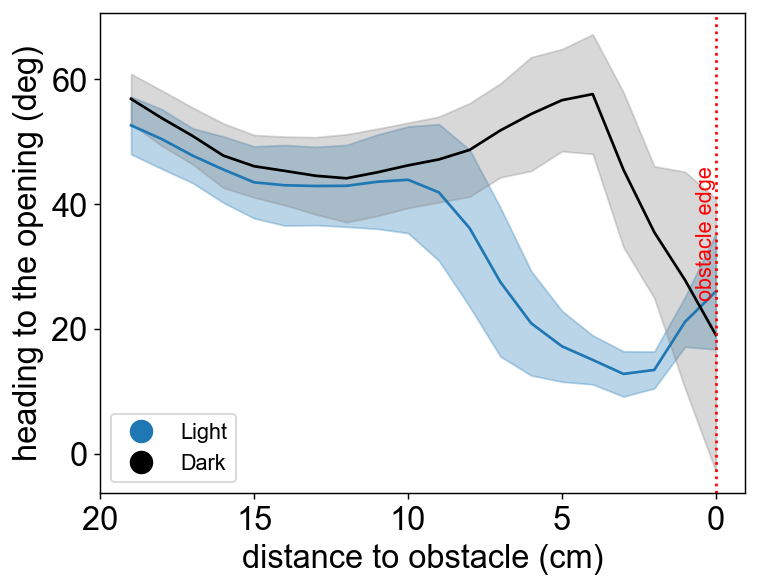

In [76]:
xnew =  np.arange(0, 20, 1)
xnew= np.flip(xnew)
fig,ax = plt.subplots(dpi = 130)

ax.invert_xaxis()
data = pd.concat([long_nostart])
data = drop_nans_in_columns(data,'obstacle_ind')
data = data[data.turn_to_obstacle == 'towards']
ts_angle_to_open_corner(data)

light_medians = []
dark_medians = []
light_sd = []
dark_sd = []
for task,task_df in  data.groupby(['task']):
  
    rows = task_df.shape[0]
    angle_array = np.empty([rows,len(xnew)])
    angle_array[:] =np.nan 
    for i,row in enumerate(task_df.iterrows()):
        x = row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float)
        y = row[1]['ts_angle_to_corner'][:int(row[1]['obstacle_ind'])].astype(float)
        if sum(y) == 0:
            continue
        else:
            interpolater = interp1d(x,y,bounds_error=False)
            ynew = interpolater(xnew)
            angle_array[i] = ynew

    
    task_angle_median= np.nanmedian(angle_array,axis = 0)

 
    if task == 'oa':
        light_array = angle_array
        light_angle_median= np.nanmedian(angle_array,axis = 0)
        ax.plot(xnew,task_angle_median,c = 'tab:blue',alpha = 1)
    else:
        dark_array = angle_array
        dark_angle_median= np.nanmedian(angle_array,axis = 0)
        ax.plot(xnew,dark_angle_median,c = 'black',alpha = 1)

    for animal,animal_df in task_df.groupby(['animal']):
        rows = animal_df.shape[0]
        angle_array = np.empty([rows,len(xnew)])
        angle_array[:] =np.nan 
        for i,row in enumerate(animal_df.iterrows()):
            x = row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float)
            y = row[1]['ts_angle_to_corner'][:int(row[1]['obstacle_ind'])].astype(float)
            if sum(y) == 0:
                continue
            else:
                interpolater = interp1d(x,y,bounds_error=False)
                ynew = interpolater(xnew)
                angle_array[i] = ynew
        animal_angle_median= np.nanmedian(angle_array,axis = 0)
        if animal_df.task.unique() == 'oa':
            light_medians.append(animal_angle_median)
        else:
            dark_medians.append(animal_angle_median)

light_medians = np.asarray(light_medians)
dark_medians = np.asarray(dark_medians)

for i in list(range(light_medians.shape[1])):
    sd = np.nanstd(light_medians[:,i])
    light_sd.append(sd)
light_sd = np.asarray(light_sd)

for i in list(range(dark_medians.shape[1])):
    sd = np.nanstd(dark_medians[:,i])
    dark_sd.append(sd)
dark_sd = np.asarray(dark_sd)

            






ax.fill_between(xnew, light_angle_median-light_sd, light_angle_median+light_sd, color='tab:blue', alpha=0.3, label='IQR')   
ax.fill_between(xnew, dark_angle_median-dark_sd, dark_angle_median+dark_sd, color='tab:grey', alpha=0.3, label='IQR')  
ax.set_xticks([20,15,10,5,0])    
ax.set_ylabel('heading to the opening (deg)')
ax.set_xlabel('distance to obstacle (cm)')
ax.axvline(0, color='r', ls=':')
ax.text(0, ax.get_ylim()[1]/2,'obstacle edge', color='r', ha='right', va='center', rotation=90,fontsize=12)
   
markers = [plt.Line2D([0,0],[0,0],color=color, marker='o', linestyle='',markersize=12) for color in ['tab:blue','black']]
ax.legend(markers, ['Light','Dark'], numpoints=1,loc = 'lower left',fontsize=12)

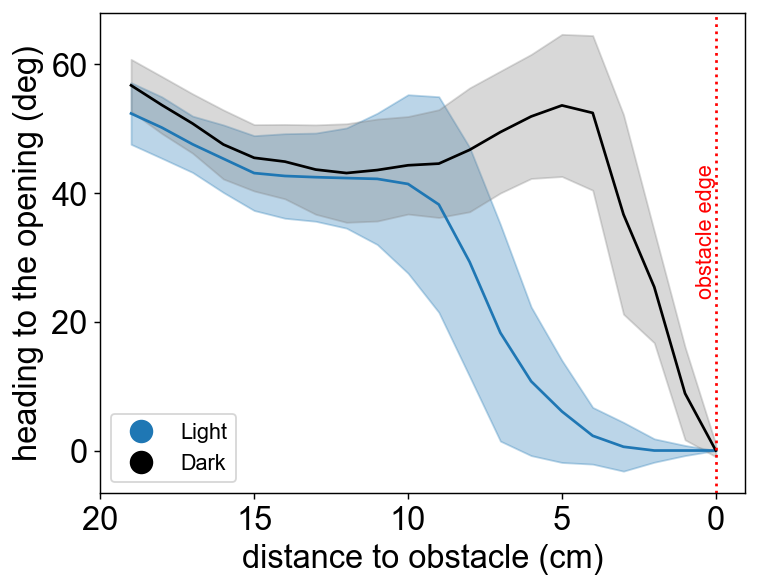

In [78]:
xnew =  np.arange(0, 20, 1)
xnew= np.flip(xnew)
fig,ax = plt.subplots(dpi = 130)

ax.invert_xaxis()
data = pd.concat([long_nostart])
data = drop_nans_in_columns(data,'obstacle_ind')
data = data[data.turn_to_obstacle == 'towards']
ts_angle_to_open_corner(data)
zero_out_angle(data)
light_medians = []
dark_medians = []
light_sd = []
dark_sd = []
for task,task_df in  data.groupby(['task']):
  
    rows = task_df.shape[0]
    angle_array = np.empty([rows,len(xnew)])
    angle_array[:] =np.nan 
    for i,row in enumerate(task_df.iterrows()):
        x = row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float)
        y = row[1]['ts_zero_out_angle_to_corner'][:int(row[1]['obstacle_ind'])].astype(float)
        if sum(y) == 0:
            continue
        else:
            interpolater = interp1d(x,y,bounds_error=False)
            ynew = interpolater(xnew)
            angle_array[i] = ynew

    
    task_angle_median= np.nanmedian(angle_array,axis = 0)

 
    if task == 'oa':
        light_array = angle_array
        light_angle_median= np.nanmedian(angle_array,axis = 0)
        ax.plot(xnew,task_angle_median,c = 'tab:blue',alpha = 1)
    else:
        dark_array = angle_array
        dark_angle_median= np.nanmedian(angle_array,axis = 0)
        ax.plot(xnew,dark_angle_median,c = 'black',alpha = 1)

    for animal,animal_df in task_df.groupby(['animal']):
        rows = animal_df.shape[0]
        angle_array = np.empty([rows,len(xnew)])
        angle_array[:] =np.nan 
        for i,row in enumerate(animal_df.iterrows()):
            x = row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float)
            y = row[1]['ts_zero_out_angle_to_corner'][:int(row[1]['obstacle_ind'])].astype(float)
            if sum(y) == 0:
                continue
            else:
                interpolater = interp1d(x,y,bounds_error=False)
                ynew = interpolater(xnew)
                angle_array[i] = ynew
        animal_angle_median= np.nanmedian(angle_array,axis = 0)
        if animal_df.task.unique() == 'oa':
            light_medians.append(animal_angle_median)
        else:
            dark_medians.append(animal_angle_median)

light_medians = np.asarray(light_medians)
dark_medians = np.asarray(dark_medians)

for i in list(range(light_medians.shape[1])):
    sd = np.nanstd(light_medians[:,i])
    light_sd.append(sd)
light_sd = np.asarray(light_sd)

for i in list(range(dark_medians.shape[1])):
    sd = np.nanstd(dark_medians[:,i])
    dark_sd.append(sd)
dark_sd = np.asarray(dark_sd)

            






ax.fill_between(xnew, light_angle_median-light_sd, light_angle_median+light_sd, color='tab:blue', alpha=0.3, label='IQR')   
ax.fill_between(xnew, dark_angle_median-dark_sd, dark_angle_median+dark_sd, color='tab:grey', alpha=0.3, label='IQR')  
ax.set_xticks([20,15,10,5,0])    
ax.set_ylabel('heading to the opening (deg)')
ax.set_xlabel('distance to obstacle (cm)')
ax.axvline(0, color='r', ls=':')
ax.text(0, ax.get_ylim()[1]/2,'obstacle edge', color='r', ha='right', va='center', rotation=90,fontsize=12)
   
markers = [plt.Line2D([0,0],[0,0],color=color, marker='o', linestyle='',markersize=12) for color in ['tab:blue','black']]
ax.legend(markers, ['Light','Dark'], numpoints=1,loc = 'lower left',fontsize=12)

In [61]:
light_sd

array([ 4.57200423,  4.64462463,  4.33761738,  5.28937398,  5.80052147,
        6.5868657 ,  6.98792469,  8.2427002 , 10.25323342, 13.89958868,
       16.77469162, 17.46633408, 16.39705161, 10.35631134,  6.21292777,
        1.30275261,  0.49345962,  0.        ,  0.        ,  0.        ,
        0.        ,  4.58360977])

In [62]:
dark_sd

array([ 3.92682181,  4.35483313,  4.35586137,  5.54671764,  5.11029112,
        5.82723272,  7.24555198,  8.05464985,  8.01910906,  8.51350633,
        9.9545292 , 11.357464  , 11.66553738, 12.24916825, 13.38490326,
       13.67296624, 15.17822042, 10.9998826 ,  4.93589243,  0.        ,
        0.        , 13.11051606])

In [57]:
light_medians.shape[1]

22

In [56]:
np.asarray(light_means)[:,0]

array([52.62725472, 44.76809173, 51.64826631, 45.02750056, 47.33540862,
       49.31287675, 51.34668953, 52.40496831, 36.96070051, 47.34277804,
       44.06997709, 43.08572449, 53.00501008])

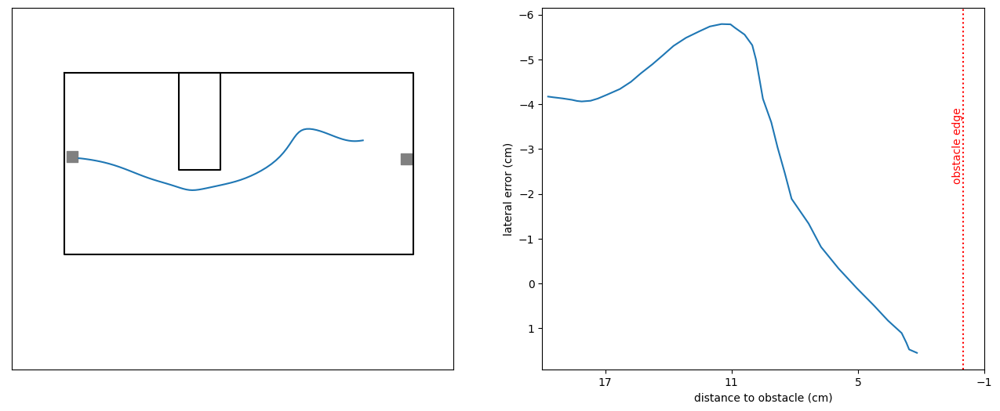

In [506]:
#data = long[(long.obstacle_cluster == 0)&(long.task == 'oa')&(long.head_corner_angle_velocity_at_head_turn <= -5)]
#sample = data.sample(1)
plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['ps.fonttype'] = 42  
for ind,row in sample.iterrows():
    fig,ax = plt.subplots(1,2,figsize=(16,6))
    
    #ax[1].set_xlim(20,0)
    


    ax[0].set_xticks([])
    ax[0].set_yticks([])
    ax[1].set_xticks(np.arange(-1,20,6))
    ax[1].set_xlim(-1,20)
    ax[1].invert_xaxis()
    ax[1].set_ylabel('lateral error (cm)')
    ax[1].set_xlabel('distance to obstacle')
    ax[1].invert_yaxis()
    plot_arena(data,ax[0])
    plot_orginal_obstacle(data,ax[0],int(row.obstacle_cluster))


    trial_df = data.loc[[ind]]

    for ind,row in trial_df.iterrows():
        
        #ax[1].set_title('head_corner_angle_velocity_at_head_turn head '+ str(row.head_corner_angle_velocity_at_head_turn) + ' '+row.task )

        #ax[1].set_ylim(-12,2)
        ax[1].set_xlabel('distance to obstacle (cm)')
        ob_ind = int(row.obstacle_ind)
  
        ax[0].plot(smooth(row.ts_nose_x_cm),smooth(row.ts_nose_y_cm),color = 'tab:blue')
        ax[1].plot(row.ts_distance_from_edge[:ob_ind],smooth(row.lateral_error[:ob_ind]),color = 'tab:blue')
        ax[1].axvline(0, color='r', ls=':')
        ax[1].text(0, ax[1].get_ylim()[1]/2,'obstacle edge', color='r', ha='right', va='center', rotation=90)
        #ax[2].plot(row.ts_distance_from_edge[:ob_ind],smooth(row.lateral_error[:ob_ind]),color = 'tab:blue')
fig.savefig(r'd:\obstacle_avoidance\figures\SFN/lateral_error_light.pdf')

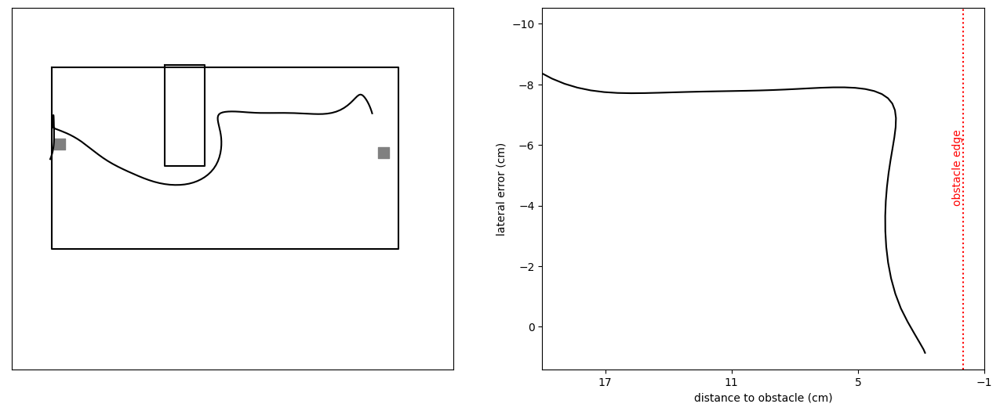

In [513]:
data = long[(long.obstacle_cluster == 0)&(long.task == 'oadark')&(long.head_corner_angle_velocity_at_head_turn <= -5)]
sample = data.sample(1)
plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['ps.fonttype'] = 42  
for ind,row in sample.iterrows():
    fig,ax = plt.subplots(1,2,figsize=(16,6))
    
    #ax[1].set_xlim(20,0)
    


    ax[0].set_xticks([])
    ax[0].set_yticks([])
    ax[1].set_xticks(np.arange(-1,20,6))
    ax[1].set_xlim(-1,20)
    ax[1].invert_xaxis()
    ax[1].set_ylabel('lateral error (cm)')
    ax[1].set_xlabel('distance to obstacle')
    ax[1].invert_yaxis()
    plot_arena(data,ax[0])
    plot_orginal_obstacle(data,ax[0],int(row.obstacle_cluster))


    trial_df = data.loc[[ind]]

    for ind,row in trial_df.iterrows():
        
        #ax[1].set_title('head_corner_angle_velocity_at_head_turn head '+ str(row.head_corner_angle_velocity_at_head_turn) + ' '+row.task )

        #ax[1].set_ylim(-12,2)
        ax[1].set_xlabel('distance to obstacle (cm)')
        ob_ind = int(row.obstacle_ind)
  
        ax[0].plot(smooth(row.ts_nose_x_cm),smooth(row.ts_nose_y_cm),color = 'black')
        ax[1].plot(row.ts_distance_from_edge[:ob_ind],smooth(row.lateral_error[:ob_ind]),color = 'black')
        ax[1].axvline(0, color='r', ls=':')
        ax[1].text(0, ax[1].get_ylim()[1]/2,'obstacle edge', color='r', ha='right', va='center', rotation=90)
        #ax[2].plot(row.ts_distance_from_edge[:ob_ind],smooth(row.lateral_error[:ob_ind]),color = 'black')
fig.savefig(r'd:\obstacle_avoidance\figures\SFN/lateral_error_dark.pdf')

In [795]:
row[1].ts_distance_from_edge

array([18.241314049028063, 17.783870084848537, 17.230807086931733,
       16.690404931029303, 16.32000868716481, 15.704939469934567,
       15.12164758239932, 14.58440863569314, 14.137548728314535,
       13.735736533679855, 13.343762765912633, 12.877738339477318,
       12.436742834397485, 11.905812008416738, 11.406919253886858,
       10.883941051460255, 10.32059476464514, 9.80323737682432,
       9.2535297136081, 8.909618199236043, 8.415286138225564,
       7.891522279718764, 7.4110026701444305, 6.788451994287325,
       6.192357457817849, 5.727169006047202, 5.290666721839415,
       4.882251356597656, 4.484622466098877, 4.097581063213596,
       3.763520555355111, 3.2966418565880566, 2.8230204675024453,
       2.4397735433276395, 2.345163168488085, 2.194129650002523,
       1.9498823437024235, 1.612893130121545, 1.786295107975869,
       2.08943645393669, 2.4392166561153044, 3.0060717370475656,
       -3.463729478267954, -4.01944690099144, -4.30196979577501,
       -4.6706119640748

In [797]:
thresh

31

In [798]:
np.where(row[1].ts_distance_from_edge<=5)

(array([27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43,
        44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60,
        61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77],
       dtype=int64),)

In [799]:
np.where((row[1].ts_distance_from_edge>=0)&(row[1].ts_distance_from_edge<=5))[0][0],np.where((row[1].ts_distance_from_edge>=0)&(row[1].ts_distance_from_edge<=5))[0][-1]

(27, 41)

In [789]:
def avg_lateral_error_thresh(df,thresh = 5):
    for ind,row in df.iterrows():
        if type(row.lateral_error)==float:
            df.at[ind,'avg_lateral_error_thresh'+ '_' + str(thresh)] = np.nan
        else:
            first_dist_start,first_dist_end = np.where((row.ts_distance_from_edge>=0)&(row.ts_distance_from_edge<=thresh))[0][0],np.where((row.ts_distance_from_edge>=0)&(row.ts_distance_from_edge<=thresh))[0][-1]
            df.at[ind,'avg_lateral_error_thresh'+ '_' + str(thresh)] = np.nanmean(row.lateral_error[int(first_dist_start):int(first_dist_end)])


In [ ]:
def avg_lateral_error_thresh(df,thresh = 5):
    for ind,row in df.iterrows():
        if type(row.lateral_error)==float:
            df.at[ind,'avg_lateral_error_thresh'+ '_' + str(thresh)] = np.nan
        else:
            first_dist_start,first_dist_end = np.where((row.ts_distance_from_edge>=0)&(row.ts_distance_from_edge<=thresh))[0][0],np.where((row.ts_distance_from_edge>=0)&(row.ts_distance_from_edge<=thresh))[0][-1]
            df.at[ind,'avg_lateral_error_thresh'+ '_' + str(thresh)] = np.nanmean(row.lateral_error[int(first_dist_start):int(first_dist_end)])

In [801]:
long_nostart.ts_distance_from_edge.tolist()

[array([25.32478958735699, 25.11036782562303, 24.965264885190813,
        24.944202240047595, 24.898902690236042, 24.896126540183147,
        24.843836188039532, 24.834308101337903, 24.826754637618443,
        24.926558028239114, 25.071979456249103, 25.154711912701273,
        25.148665956849925, 25.102490566199506, 24.995324804406046,
        24.822720461633352, 24.74803512464618, 24.88823866450703,
        25.007480413624286, 25.1564742106316, 25.331355739585355,
        25.4178675819604, 25.469292709517738, 25.434099832174105,
        25.48120945305265, 25.384314915642285, 25.26272166657582,
        25.196789429851044, 25.12810227557855, 24.851410884264176,
        24.717269224633554, 24.502810306015526, 24.171025871873162,
        23.750739047994685, 23.362555771955464, 22.922788124570026,
        22.5192165903982, 22.13732344401995, 21.790081746103127,
        21.570781816302983, 21.30224901510583, 20.946148054400687,
        20.65903150304063, 20.511635452048466, 20.2695105791747

In [810]:
light>0

array([ True,  True,  True, ..., False, False, False])

<AxesSubplot: ylabel='Probability'>

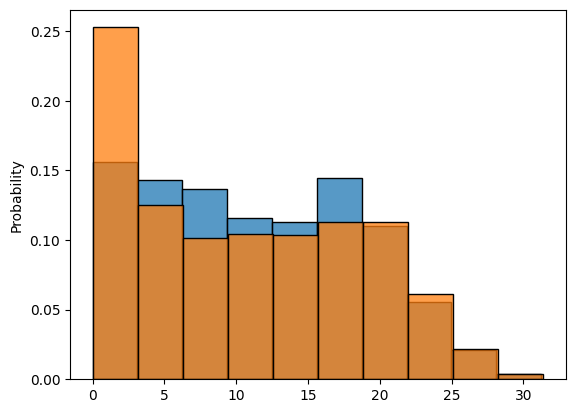

In [814]:
light = flatten_list_of_arrays(long_nostart[long_nostart.task == 'oa'].ts_distance_from_edge.tolist())
dark = flatten_list_of_arrays(long_nostart[long_nostart.task == 'oadark'].ts_distance_from_edge.tolist())
sns.histplot(light[light>=0],bins = 10,stat = 'probability',multiple = 'dodge')
sns.histplot(dark[dark>=0],bins = 10,stat = 'probability',multiple = 'dodge')

(array([  882., 36926., 96881., 64080., 57167., 99121., 82991., 82557.,
        61981.,  9204.]),
 array([-33.95692293, -27.42152199, -20.88612106, -14.35072012,
         -7.81531919,  -1.27991825,   5.25548268,  11.79088362,
         18.32628455,  24.86168549,  31.39708642]),
 <BarContainer object of 10 artists>)

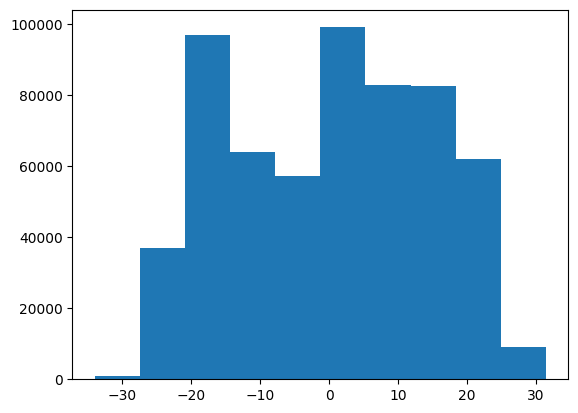

In [802]:
plt.hist(flatten_list_of_arrays(long_nostart.ts_distance_from_edge.tolist()))

In [800]:
avg_lateral_error_thresh(long_nostart)

IndexError: index 0 is out of bounds for axis 0 with size 0

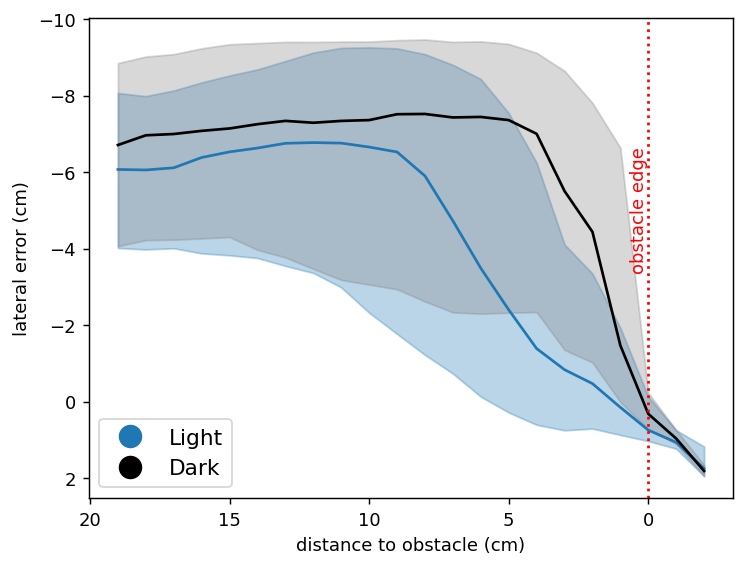

In [517]:

xnew =  np.arange(-2, 20, 1)
xnew= np.flip(xnew)
fig,ax = plt.subplots(dpi = 130)
#fig.suptitle('Heading to the Opening')
ax.invert_xaxis()
ax.invert_yaxis()
data = pd.concat([long_nostart])
data = drop_nans_in_columns(data,'obstacle_ind')
data = data[data.turn_to_obstacle == 'towards']

for date,date_df in  data.groupby(['task']):
  
   
    rows = date_df.shape[0]
    angle_array = np.empty([rows,len(xnew)])
    angle_array[:] =np.nan 
    for i,row in enumerate(date_df.iterrows()):
        x = row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float)
        y = row[1]['lateral_error'][:int(row[1]['obstacle_ind'])].astype(float)
        if sum(y) == 0:
            continue
        else:
            #x = resample(x,20)
            #y = resample(np.flip(np.unique(y)),len(x))
            #y = resample(y,len(x))
            interpolater = interp1d(x,y,bounds_error=False)
            #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['ts_zero_out_angle_to_corner'])
            ynew = interpolater(xnew)
            angle_array[i] = ynew

    date_angle_mean = np.nanmean(angle_array,axis = 0)
    date_angle_median= np.nanmedian(angle_array,axis = 0)

        

    median, q1, q3, iqr = calculate_quartiles(angle_array)
 
    if date == 'oa':
        light_array = angle_array
        ax.fill_between(xnew, q1, q3, color='tab:blue', alpha=0.3, label='IQR')
        #ax.plot(xnew,date_angle_mean,c = 'tab:orange',alpha = 1)
        ax.plot(xnew,date_angle_median,c = 'tab:blue',alpha = 1)
    else:
        ax.fill_between(xnew, q1, q3, color='grey', alpha=0.3, label='IQR')
        #ax.plot(xnew,date_angle_mean,c = 'tab:blue',alpha = 1)
        ax.plot(xnew,date_angle_median,c = 'black',alpha = 1)

#light_sample =  data[data.task == 'oa'].sample(5)
#for ind,row in light_sample.iterrows():
#    l_ob_ind = int(row.obstacle_ind)
#    y = smooth(row.ts_zero_out_angle_to_corner[:l_ob_ind])
#    x = smooth(row.ts_distance_from_edge[:l_ob_ind])
#    interpolater = interp1d(x,y,bounds_error=False)
#    ynew = interpolater(xnew)
#    ax.plot(xnew,ynew,c = 'tab:blue',alpha = .3)
#    
#dark_sample =  data[data.task == 'oadark'].sample(5)
#for ind,row in dark_sample.iterrows():
#    l_ob_ind = int(row.obstacle_ind)
#    y = smooth(row.ts_zero_out_angle_to_corner[:l_ob_ind])
#    x = smooth(row.ts_distance_from_edge[:l_ob_ind])
#    interpolater = interp1d(x,y,bounds_error=False)
#    ynew = interpolater(xnew)
#    ax.plot(xnew,ynew,c = 'black',alpha = .3)



        
ax.set_ylabel('lateral error (cm)')
ax.set_xlabel('distance to obstacle (cm)')
ax.axvline(0, color='r', ls=':')
ax.text(0, ax.get_ylim()[1]/2,'obstacle edge', color='r', ha='right', va='center', rotation=90)
   
markers = [plt.Line2D([0,0],[0,0],color=color, marker='o', linestyle='',markersize=12) for color in ['tab:blue','black']]
ax.legend(markers, ['Light','Dark'], numpoints=1,loc = 'lower left',fontsize=12)
fig.savefig(r'd:\obstacle_avoidance\figures\SFN/lateral_error_dark_median.png')

In [543]:
data.animal

8       J701LT
24      J701LT
27      J701LT
49      J701LT
103     J701LT
         ...  
8809    G8CKLN
8827    G8CKLN
8866    G8CKLN
8874    G8CKLN
8875    G8CKLN
Name: animal, Length: 1966, dtype: object

,level_0,first_poke,second_poke,trial_timestamps,trial_vidframes,nose_x,nose_y,leftear_x,leftear_y,rightear_x,...,distance,ts_distance,total_distance,ts_total_distance,intial_head_angle_velocity,turn_direction,turn_to_obstacle,obstacle_cross,turn_direction_end,head_corner_angle_velocity_at_head_turn
8,8,48098.019340,48102.816128,"[48098.031385, 48098.048576, 48098.06464, 4809...","[[3308, 3309, 3310, 3311, 3312, 3313, 3314, 33...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[649.9629516601562, 650.8632202148438, 650.746...","[252.6468963623047, 251.91566467285156, 251.48...","[656.01318359375, 656.386474609375, 656.445373...",...,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[0.2513756099763498, 0.19898440343310853, 0.06...",96.548460,91.543341,-0.788911,up,towards,True,down,-4.804871
24,24,48420.115289,48424.506713,"[48420.126092, 48420.143462, 48420.159539, 484...","[[22627, 22628, 22629, 22630, 22631, 22632, 22...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[647.6133422851562, 648.2860107421875, 648.863...","[258.9119873046875, 258.0534973144531, 257.625...","[656.2706298828125, 656.6029052734375, 656.868...",...,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[0.33576022073820155, 0.5436012328964797, 0.62...",88.389980,71.480402,-0.207297,up,towards,True,down,-3.941995
27,27,48451.833305,48459.674124,"[48451.837196, 48451.85399, 48451.870681, 4845...","[[24529, 24530, 24531, 24532, 24533, 24534, 24...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[647.6234741210938, 647.111083984375, 647.8052...","[258.09979248046875, 256.70001220703125, 256.1...","[653.6805419921875, 654.243408203125, 654.8812...",...,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[0.05833232690023138, 0.08215387068589308, 0.0...",102.215734,88.411867,-0.160381,up,towards,True,down,-5.014465
49,49,48679.844134,48684.862156,"[48679.849856, 48679.865958, 48679.882649, 486...","[[38205, 38206, 38207, 38208, 38209, 38210, 38...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[650.8657836914062, 650.9302978515625, 651.648...","[253.11341857910156, 252.92771911621094, 252.8...","[654.2478637695312, 655.6620483398438, 656.662...",...,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[0.5980413761900394, 0.29551135309745646, 0.54...",80.158969,65.216280,-0.433031,up,towards,True,up,-3.233771
81,81,48853.373670,48858.653836,"[48853.376499, 48853.392832, 48853.409497, 488...","[[48613, 48614, 48615, 48616, 48617, 48618, 48...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[649.47607421875, 650.6023559570312, 651.13494...","[251.5926971435547, 251.31021118164062, 251.25...","[653.1865844726562, 654.6475219726562, 655.731...",...,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[20.088966247490866, 20.088966247490863, 1.246...",156.948069,156.948069,14.869831,up,towards,False,down,-5.652274
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8809,8809,53682.691097,53684.452428,"[53682.695372, 53682.713523, 53682.728844, 536...","[9889, 9890, 9891, 9892, 9893, 9894, 9895, 989...","[112.17072296142578, 112.42405700683594, 112.5...","[277.1304931640625, 277.2672119140625, 277.129...","[129.66957092285156, 127.5576400756836, 125.69...","[274.0078125, 274.1982116699219, 272.819396972...","[119.23519897460938, 117.94373321533203, 119.5...",...,"[0.030902484935323216, 0.01813771863969116, 0....","[0.4199425567488433, 0.2878255935751888, 0.456...",60.430062,52.882901,0.958228,down,towards,True,down,-3.141509
8827,8827,53737.922483,53740.560204,"[53737.931635, 53737.948006, 53737.964556, 537...","[13202, 13203, 13204, 13205, 13206, 13207, 132...","[112.039794921875, 112.21412658691406, 112.549...","[276.7937316894531, 276

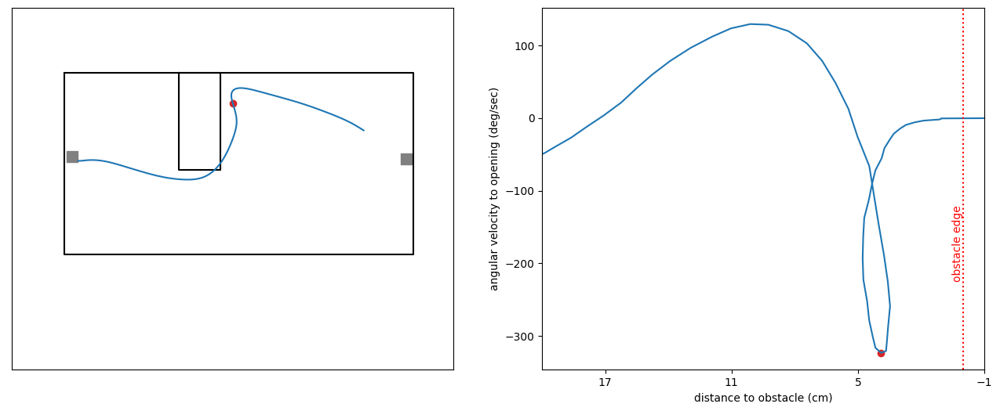

In [36]:
data = long[(long.obstacle_cluster == 0)&(long.task == 'oa')&(long.head_corner_angle_velocity_at_head_turn <= -5)]
sample = data.sample(1)
plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['ps.fonttype'] = 42  
for ind,row in sample.iterrows():
    fig,ax = plt.subplots(1,2,figsize=(16,6))
    
    #ax[1].set_xlim(20,0)
    


    ax[0].set_xticks([])
    ax[0].set_yticks([])
    ax[1].set_xticks(np.arange(-1,20,6))
    ax[1].set_xlim(-1,20)
    ax[1].invert_xaxis()
    ax[1].set_ylabel('angular velocity to opening (deg/sec)')
    ax[1].set_xlabel('distance to obstacle')
    #ax[1].invert_yaxis()
    plot_arena(data,ax[0])
    plot_orginal_obstacle(data,ax[0],int(row.obstacle_cluster))


    trial_df = data.loc[[ind]]
    

    for ind,row in trial_df.iterrows():
        
        #ax[1].set_title('head_corner_angle_velocity_at_head_turn head '+ str(row.head_corner_angle_velocity_at_head_turn) + ' '+row.task )

        #ax[1].set_ylim(-12,2)
        ax[1].set_xlabel('distance to obstacle (cm)')
        ob_ind = int(row.obstacle_ind)
        thresh = row.head_corner_angle_velocity[:ob_ind].argmin()
        ax[0].plot(smooth(row.ts_nose_x_cm),smooth(row.ts_nose_y_cm),color = 'tab:blue')
        ax[0].scatter(smooth(row.ts_nose_x_cm)[thresh],smooth(row.ts_nose_y_cm)[thresh],color = 'tab:red')
        ax[1].plot(row.ts_distance_from_edge[:ob_ind],smooth(row.head_corner_angle_velocity[:ob_ind])*60,color = 'tab:blue')
        ax[1].scatter(row.ts_distance_from_edge[:ob_ind][thresh],smooth(row.head_corner_angle_velocity)[thresh]*60,color = 'tab:red')
        ax[1].axvline(0, color='r', ls=':')
        ax[1].text(0, ax[1].get_ylim()[0]/2,'obstacle edge', color='r', ha='right', va='center', rotation=90)
        #ax[2].plot(row.ts_distance_from_edge[:ob_ind],smooth(row.lateral_error[:ob_ind]),color = 'tab:blue')
#fig.savefig(r'd:\obstacle_avoidance\figures\SFN/angular_velocity_light.pdf')

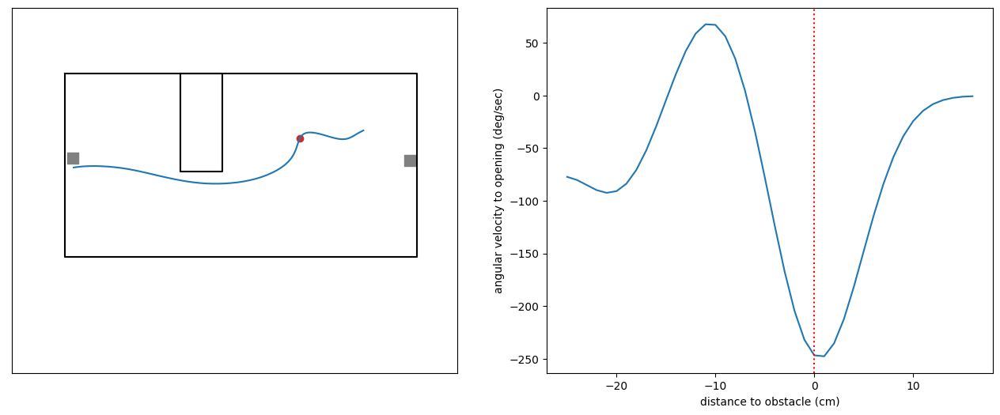

In [52]:
data = long[(long.obstacle_cluster == 0)&(long.task == 'oa')&(long.head_corner_angle_velocity_at_head_turn <= -5)]
sample = data.sample(1)
plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['ps.fonttype'] = 42  
for ind,row in sample.iterrows():
    fig,ax = plt.subplots(1,2,figsize=(16,6))
    
    #ax[1].set_xlim(20,0)
    


    ax[0].set_xticks([])
    ax[0].set_yticks([])

    #ax[1].set_xlim(-1,20)
    #ax[1].invert_xaxis()
    ax[1].set_ylabel('angular velocity to opening (deg/sec)')
    ax[1].set_xlabel('distance to obstacle')
    #ax[1].invert_yaxis()
    plot_arena(data,ax[0])
    plot_orginal_obstacle(data,ax[0],int(row.obstacle_cluster))


    trial_df = data.loc[[ind]]
    

    for ind,row in trial_df.iterrows():
        
        #ax[1].set_title('head_corner_angle_velocity_at_head_turn head '+ str(row.head_corner_angle_velocity_at_head_turn) + ' '+row.task )

        #ax[1].set_ylim(-12,2)
        ax[1].set_xlabel('distance to obstacle (cm)')
        ob_ind = int(row.obstacle_ind)
        thresh = row.head_corner_angle_velocity[:ob_ind].argmin()
        ax[0].plot(smooth(row.ts_nose_x_cm),smooth(row.ts_nose_y_cm),color = 'tab:blue')
        ax[0].scatter(smooth(row.ts_nose_x_cm)[thresh],smooth(row.ts_nose_y_cm)[thresh],color = 'tab:red')
        ax[1].plot(create_monotonic_array(len(row.head_corner_angle_velocity[:ob_ind]),thresh),smooth(row.head_corner_angle_velocity[:ob_ind])*60,color = 'tab:blue')
        #ax[1].scatter(row.ts_distance_from_edge[:ob_ind][thresh],smooth(row.head_corner_angle_velocity)[thresh]*60,color = 'tab:red')
        ax[1].axvline(0, color='r', ls=':')
        #ax[1].text(0, ax[1].get_ylim()[0]/2,'obstacle edge', color='r', ha='right', va='center', rotation=90)
        #ax[2].plot(row.ts_distance_from_edge[:ob_ind],smooth(row.lateral_error[:ob_ind]),color = 'tab:blue')
#fig.savefig(r'd:\obstacle_avoidance\figures\SFN/angular_velocity_light.pdf')

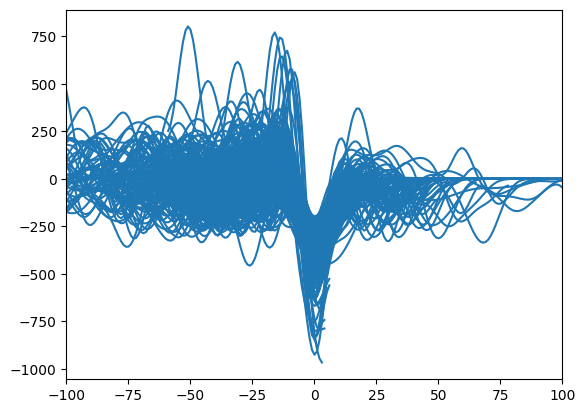

In [57]:
fig,ax = plt.subplots()
ax.set_xlim(-100,100)
data = long[(long.task == 'oadark')&(long.head_corner_angle_velocity_at_head_turn <= -5)]
for ind,row in data.iterrows():
    ob_ind = int(row.obstacle_ind)
    thresh = row.head_corner_angle_velocity[:ob_ind].argmin()
    ax.plot(create_monotonic_array(len(row.head_corner_angle_velocity[:ob_ind]),thresh),smooth(row.head_corner_angle_velocity[:ob_ind])*60,color = 'tab:blue')

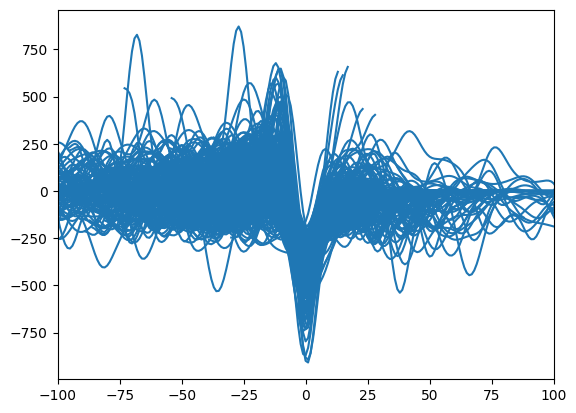

In [58]:
fig,ax = plt.subplots()
ax.set_xlim(-100,100)
data = long[(long.task == 'oa')&(long.head_corner_angle_velocity_at_head_turn <= -5)]
for ind,row in data.iterrows():
    ob_ind = int(row.obstacle_ind)
    thresh = row.head_corner_angle_velocity[:ob_ind].argmin()
    ax.plot(create_monotonic_array(len(row.head_corner_angle_velocity[:ob_ind]),thresh),smooth(row.head_corner_angle_velocity[:ob_ind])*60,color = 'tab:blue')

In [21]:
def create_monotonic_array(size, zero_index):
    # Create an array of range values that monotonically increases
    array = np.arange(size)
    
    # Subtract the value at zero_index from all elements to make that index zero
    array = array - array[zero_index]
    
    return array

In [20]:
len(row.head_corner_angle_velocity)

89

In [31]:
thresh

38

In [25]:
create_monotonic_array(len(row.head_corner_angle_velocity[:ob_ind]),thresh)

array([-38, -37, -36, -35, -34, -33, -32, -31, -30, -29, -28, -27, -26,
       -25, -24, -23, -22, -21, -20, -19, -18, -17, -16, -15, -14, -13,
       -12, -11, -10,  -9,  -8,  -7,  -6,  -5,  -4,  -3,  -2,  -1,   0,
         1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,  13,
        14,  15,  16,  17,  18])

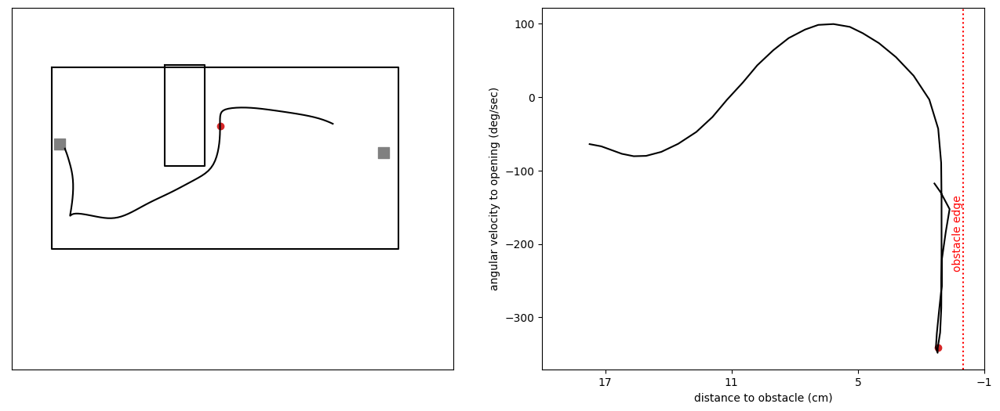

In [585]:
data = long[(long.obstacle_cluster == 0)&(long.task == 'oadark')&(long.head_corner_angle_velocity_at_head_turn <= -5)]
sample = data.sample(1)
plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['ps.fonttype'] = 42  
for ind,row in sample.iterrows():
    fig,ax = plt.subplots(1,2,figsize=(16,6))
    
    #ax[1].set_xlim(20,0)
    


    ax[0].set_xticks([])
    ax[0].set_yticks([])
    ax[1].set_xticks(np.arange(-1,20,6))
    ax[1].set_xlim(-1,20)
    ax[1].invert_xaxis()
    ax[1].set_ylabel('angular velocity to opening (deg/sec)')
    ax[1].set_xlabel('distance to obstacle')
    #ax[1].invert_yaxis()
    plot_arena(data,ax[0])
    plot_orginal_obstacle(data,ax[0],int(row.obstacle_cluster))


    trial_df = data.loc[[ind]]
    

    for ind,row in trial_df.iterrows():
        
        #ax[1].set_title('head_corner_angle_velocity_at_head_turn head '+ str(row.head_corner_angle_velocity_at_head_turn) + ' '+row.task )

        #ax[1].set_ylim(-12,2)
        ax[1].set_xlabel('distance to obstacle (cm)')
        ob_ind = int(row.obstacle_ind)
        thresh = row.head_corner_angle_velocity[:ob_ind].argmin()-1
        ax[0].plot(smooth(row.ts_nose_x_cm),smooth(row.ts_nose_y_cm),color = 'black')
        ax[0].scatter(smooth(row.ts_nose_x_cm)[thresh],smooth(row.ts_nose_y_cm)[thresh],color = 'tab:red')
        ax[1].plot(row.ts_distance_from_edge[:ob_ind],smooth(row.head_corner_angle_velocity[:ob_ind])*60,color = 'black')
        ax[1].scatter(row.ts_distance_from_edge[:ob_ind][thresh],smooth(row.head_corner_angle_velocity)[thresh]*60,color = 'tab:red')
        ax[1].axvline(0, color='r', ls=':')
        ax[1].text(0, ax[1].get_ylim()[0]/2,'obstacle edge', color='r', ha='right', va='center', rotation=90)
        #ax[2].plot(row.ts_distance_from_edge[:ob_ind],smooth(row.lateral_error[:ob_ind]),color = 'black')
fig.savefig(r'd:\obstacle_avoidance\figures\SFN/angular_velocity_dark.pdf')

In [ ]:
data = pd.concat([long])
data = data[data.turn_to_obstacle == 'towards']
data = data[(data.distance_at_head_turn >= 0) ]
data = data[(data.obstacle_cross == True) ]
sns.violinplot(data = data ,x= 'task', y = 'distance_at_head_turn' )

<AxesSubplot: xlabel='task', ylabel='distance_at_head_turn'>

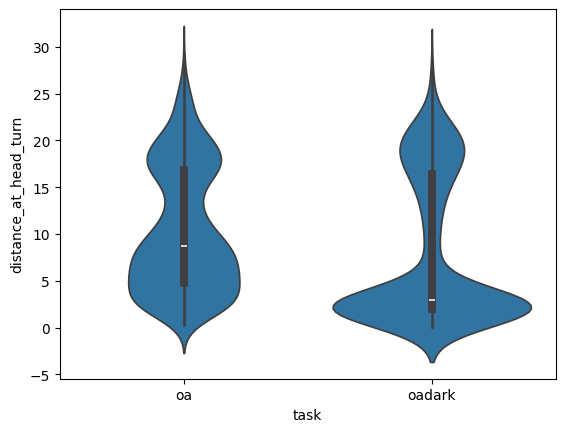

In [821]:
data = pd.concat([long])
data = data[data.turn_to_obstacle == 'towards']
data = data[(data.distance_at_head_turn >= 0) ]
data = data[(data.obstacle_cross == True) ]
sns.violinplot(data = data ,x= 'task', y = 'distance_at_head_turn' )


<AxesSubplot: xlabel='task', ylabel='distance_at_head_turn'>

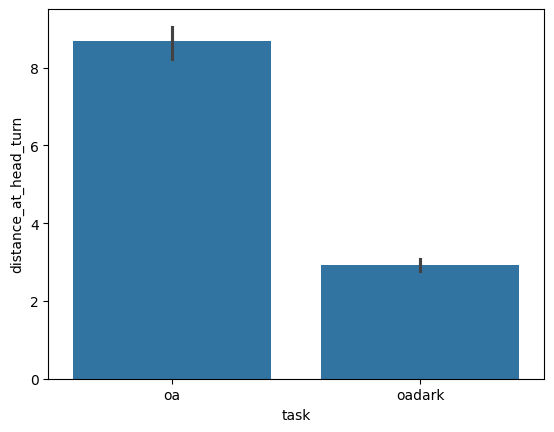

In [820]:
data = pd.concat([long])
data = data[data.turn_to_obstacle == 'towards']
data = data[(data.distance_at_head_turn >= 0) ]
data = data[(data.obstacle_cross == True) ]
sns.barplot(data = data ,x= 'task', y = 'distance_at_head_turn', estimator= 'median' )

<AxesSubplot: xlabel='task', ylabel='avg_lateral_error'>

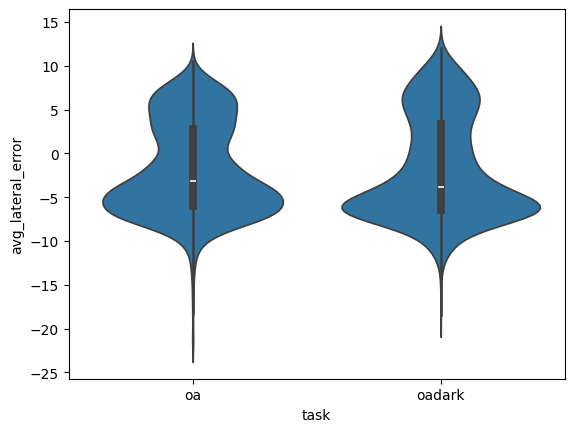

In [823]:
data = pd.concat([long_nostart])
data = drop_nans_in_columns(data,'obstacle_ind')
data[data.turn_to_obstacle == 'towards']
sns.violinplot(data = data ,x= 'task', y = 'avg_lateral_error' )

In [86]:
angle_array.shape

(1299, 200)

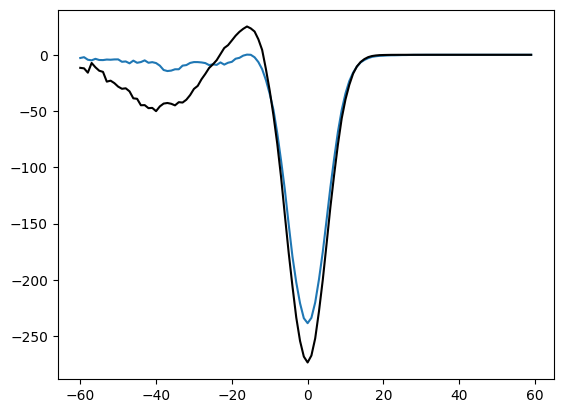

In [102]:
fig,ax = plt.subplots()
#ax.set_xlim(-100,100)
xnew = np.arange(-60, 60, 1)
data = long_nostart
for date,date_df in  data.groupby(['task']):
    rows = date_df.shape[0]
    angle_array = np.empty([rows,len(xnew)])
    angle_array[:] =np.nan
    for i,row in enumerate(date_df.iterrows()):
        ob_ind = int(row[1].obstacle_ind)
        thresh = row[1].head_corner_angle_velocity[:ob_ind].argmin()
        x =create_monotonic_array(len(row[1].head_corner_angle_velocity[:ob_ind]),thresh)
        y = smooth(row[1].head_corner_angle_velocity[:ob_ind])*60
        if sum(y) == 0:
            continue
        else:
            interpolater = interp1d(x,y,bounds_error=False)
            ynew = interpolater(xnew)
            angle_array[i] = ynew
    date_angle_median= np.nanmedian(angle_array,axis = 0)
    if date == 'oa':
        light_array = angle_array
        #ax.fill_between(xnew, q1, q3, color='tab:blue', alpha=0.3, label='IQR')
        #ax.plot(xnew,date_angle_mean,c = 'tab:orange',alpha = 1)
        ax.plot(xnew,date_angle_median,c = 'tab:blue',alpha = 1)
    else:
        #ax.fill_between(xnew, q1, q3, color='grey', alpha=0.3, label='IQR')
        #ax.plot(xnew,date_angle_mean,c = 'tab:blue',alpha = 1)
        ax.plot(xnew,date_angle_median,c = 'black',alpha = 1)


    #ax.plot(create_monotonic_array(len(row[1].head_corner_angle_velocity[:ob_ind]),thresh),smooth(row[1].head_corner_angle_velocity[:ob_ind])*60,color = 'tab:blue')

In [ ]:
angle_array

In [ ]:
data = pd.concat([long])
data = drop_nans_in_columns(data,'obstacle_ind')
data = data[data.head_corner_angle_velocity_at_head_turn<= -5]

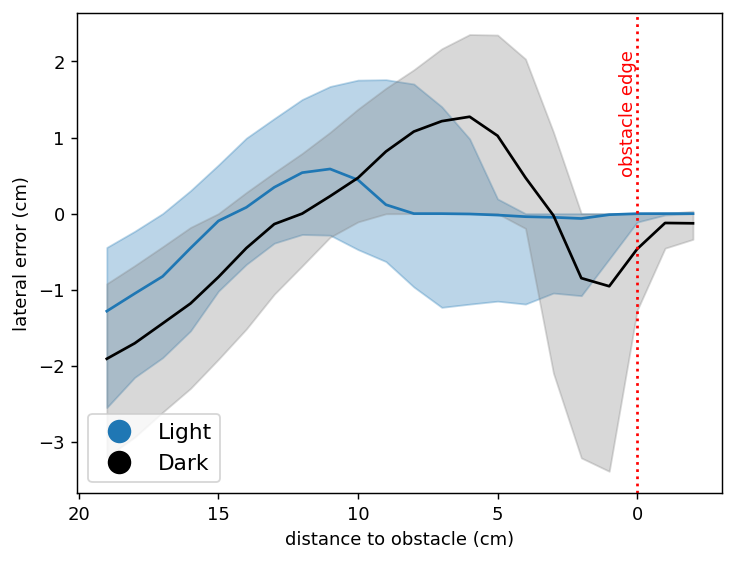

In [66]:

xnew =  np.arange(-2, 20, 1)
xnew= np.flip(xnew)
fig,ax = plt.subplots(dpi = 130)
#fig.suptitle('Heading to the Opening')
ax.invert_xaxis()
#ax.invert_yaxis()
data = pd.concat([long])
data = drop_nans_in_columns(data,'obstacle_ind')
data = data[data.head_corner_angle_velocity_at_head_turn<= -5]

for date,date_df in  data.groupby(['task']):
  
   
    rows = date_df.shape[0]
    angle_array = np.empty([rows,len(xnew)])
    angle_array[:] =np.nan 
    for i,row in enumerate(date_df.iterrows()):
        x = row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float)
        y = row[1]['head_corner_angle_velocity'][:int(row[1]['obstacle_ind'])].astype(float)
        if sum(y) == 0:
            continue
        else:
            #x = resample(x,20)
            #y = resample(np.flip(np.unique(y)),len(x))
            #y = resample(y,len(x))
            interpolater = interp1d(x,y,bounds_error=False)
            #interpolater = splrep(row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])],row[1]['ts_zero_out_angle_to_corner'])
            ynew = interpolater(xnew)
            angle_array[i] = ynew

    date_angle_mean = np.nanmean(angle_array,axis = 0)
    date_angle_median= np.nanmedian(angle_array,axis = 0)

        

    median, q1, q3, iqr = calculate_quartiles(angle_array)
 
    if date == 'oa':
        light_array = angle_array
        ax.fill_between(xnew, q1, q3, color='tab:blue', alpha=0.3, label='IQR')
        #ax.plot(xnew,date_angle_mean,c = 'tab:orange',alpha = 1)
        ax.plot(xnew,date_angle_median,c = 'tab:blue',alpha = 1)
    else:
        ax.fill_between(xnew, q1, q3, color='grey', alpha=0.3, label='IQR')
        #ax.plot(xnew,date_angle_mean,c = 'tab:blue',alpha = 1)
        ax.plot(xnew,date_angle_median,c = 'black',alpha = 1)





        
ax.set_ylabel('lateral error (cm)')
ax.set_xlabel('distance to obstacle (cm)')
ax.axvline(0, color='r', ls=':')
ax.text(0, ax.get_ylim()[1]/2,'obstacle edge', color='r', ha='right', va='center', rotation=90)
   
markers = [plt.Line2D([0,0],[0,0],color=color, marker='o', linestyle='',markersize=12) for color in ['tab:blue','black']]
ax.legend(markers, ['Light','Dark'], numpoints=1,loc = 'lower left',fontsize=12)

In [ ]:
row.head_corner_angle_velocity[:ob_ind].argmin()

In [593]:
data

,level_0,first_poke,second_poke,trial_timestamps,trial_vidframes,nose_x,nose_y,leftear_x,leftear_y,rightear_x,...,distance,ts_distance,total_distance,ts_total_distance,intial_head_angle_velocity,turn_direction,turn_to_obstacle,obstacle_cross,turn_direction_end,head_corner_angle_velocity_at_head_turn
8,8,48098.019340,48102.816128,"[48098.031385, 48098.048576, 48098.06464, 4809...","[[3308, 3309, 3310, 3311, 3312, 3313, 3314, 33...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[649.9629516601562, 650.8632202148438, 650.746...","[252.6468963623047, 251.91566467285156, 251.48...","[656.01318359375, 656.386474609375, 656.445373...",...,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[0.2513756099763498, 0.19898440343310853, 0.06...",96.548460,91.543341,-0.788911,up,towards,True,down,-4.804871
24,24,48420.115289,48424.506713,"[48420.126092, 48420.143462, 48420.159539, 484...","[[22627, 22628, 22629, 22630, 22631, 22632, 22...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[647.6133422851562, 648.2860107421875, 648.863...","[258.9119873046875, 258.0534973144531, 257.625...","[656.2706298828125, 656.6029052734375, 656.868...",...,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[0.33576022073820155, 0.5436012328964797, 0.62...",88.389980,71.480402,-0.207297,up,towards,True,down,-3.941995
27,27,48451.833305,48459.674124,"[48451.837196, 48451.85399, 48451.870681, 4845...","[[24529, 24530, 24531, 24532, 24533, 24534, 24...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[647.6234741210938, 647.111083984375, 647.8052...","[258.09979248046875, 256.70001220703125, 256.1...","[653.6805419921875, 654.243408203125, 654.8812...",...,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[0.05833232690023138, 0.08215387068589308, 0.0...",102.215734,88.411867,-0.160381,up,towards,True,down,-5.014465
49,49,48679.844134,48684.862156,"[48679.849856, 48679.865958, 48679.882649, 486...","[[38205, 38206, 38207, 38208, 38209, 38210, 38...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[650.8657836914062, 650.9302978515625, 651.648...","[253.11341857910156, 252.92771911621094, 252.8...","[654.2478637695312, 655.6620483398438, 656.662...",...,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[0.5980413761900394, 0.29551135309745646, 0.54...",80.158969,65.216280,-0.433031,up,towards,True,up,-3.233771
103,103,48994.402675,49001.014246,"[48994.408371, 48994.425011, 48994.441971, 489...","[[57072, 57073, 57074, 57075, 57076, 57077, 57...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[649.601806640625, 650.2275390625, 650.9002075...","[249.01614379882812, 248.92355346679688, 249.2...","[649.50830078125, 650.3995361328125, 651.19824...",...,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[0.7457187578758937, 0.4944745240253834, 0.776...",92.264250,82.131035,-0.723706,up,towards,True,up,-2.836947
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8809,8809,53682.691097,53684.452428,"[53682.695372, 53682.713523, 53682.728844, 536...","[9889, 9890, 9891, 9892, 9893, 9894, 9895, 989...","[112.17072296142578, 112.42405700683594, 112.5...","[277.1304931640625, 277.2672119140625, 277.129...","[129.66957092285156, 127.5576400756836, 125.69...","[274.0078125, 274.1982116699219, 272.819396972...","[119.23519897460938, 117.94373321533203, 119.5...",...,"[0.030902484935323216, 0.01813771863969116, 0....","[0.4199425567488433, 0.2878255935751888, 0.456...",60.430062,52.882901,0.958228,down,towards,True,down,-3.141509
8827,8827,53737.922483,53740.560204,"[53737.931635, 53737.948006, 53737.964556, 537...","[13202, 13203, 13204, 13205, 13206, 13207, 132...","[112.039794921875, 112.21412658691406, 112.549...","[276.7937316894531, 276.24

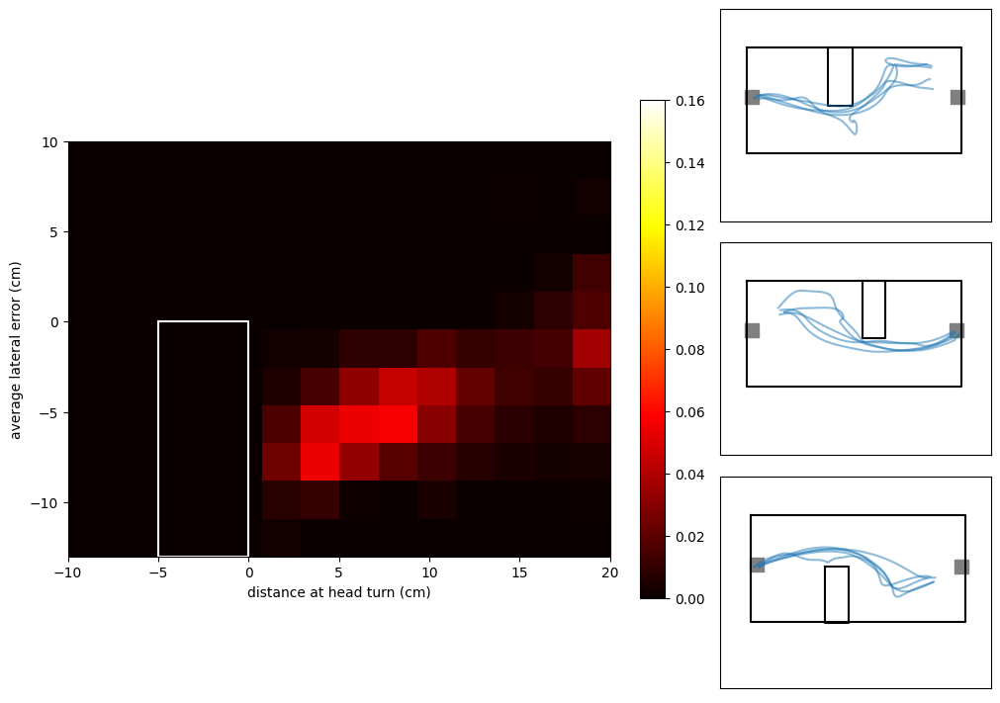

In [675]:


fig = plt.figure(layout = 'constrained',figsize=(10,7))
#fig.suptitle('Light')

gs = GridSpec(ncols=6, nrows=6,figure=fig)

ax1 = fig.add_subplot(gs[:, :4])
ax1.set_xlabel('distance at head turn (cm)')
ax1.set_ylabel('average lateral error (cm)')

data = long_nostart[long_nostart.task == 'oa']
data = data[data.turn_to_obstacle == 'towards']
data = data[(data.distance_at_head_turn >= 0) ]
data = data[(data.obstacle_cross == True) ]
ymin,ymax = -10,20
xmin,xmax = -13,10

head_turn,lateral_error = data.distance_at_head_turn.to_numpy(),data.avg_lateral_error.to_numpy()

array ,xedges ,yedges   = np.histogram2d(lateral_error.astype(float), head_turn.astype(float), range = [[xmin,xmax],[ymin,ymax ]],bins=(list(range(xmin,xmax,2)), list(range(ymin,ymax,2)),))

#ax1.imshow(array[::-1]/len(data),vmax = .18,cmap='hot',extent=[ymin,ymax,xmin,xmax])

ax1.plot( [-5,0,0,-5,-5], [0,0,-13,-13,0],c ='white')
fig.colorbar(ax1.imshow(array[::-1]/len(data),vmax = .16,cmap='hot',extent=[ymin,ymax,xmin,xmax]),fraction=0.046, pad=0.04)


ax2 = fig.add_subplot(gs[0:2, 4:])
ax2.set_xticks([])
ax2.set_yticks([])
trace_ax2 = data[(data.animal == 'G8CKLN') &(data.obstacle_cluster == 0)&(data.odd == 'right')].sample(5)     
plot_arena(trace_ax2,ax2,0)
plot_orginal_obstacle(trace_ax2,ax2,0)
for ind,row in trace_ax2.iterrows():
    x = gaussian_filter(row.ts_nose_x_cm.astype(float),3)
    y = gaussian_filter(row.ts_nose_y_cm.astype(float),3)
    ax2.plot(x,y, c = 'tab:blue', alpha =.5)




ax3 = fig.add_subplot(gs[2:4, 4:])
ax3.set_xticks([])
ax3.set_yticks([])
trace_ax3 = data[(data.animal == 'G8CKRT') &(data.obstacle_cluster == 1)&(data.odd == 'left')].sample(5)                
plot_arena(trace_ax3,ax3)
plot_orginal_obstacle(trace_ax3,ax3,1)
for ind,row in trace_ax3.iterrows():
    x = gaussian_filter(row.ts_nose_x_cm.astype(float),3)
    y = gaussian_filter(row.ts_nose_y_cm.astype(float),3)
    ax3.plot(x,y, c = 'tab:blue', alpha =.5)

             

ax4 = fig.add_subplot(gs[4:6, 4:])
ax4.set_xticks([])
ax4.set_yticks([])
trace_ax4 = data[(data.animal == 'G8CKRN') &(data.obstacle_cluster == 4)&(data.odd == 'right')].sample(5)
plot_arena(trace_ax4,ax4)
plot_orginal_obstacle(trace_ax4,ax4,4)
for ind,row in trace_ax4.iterrows():
    x = gaussian_filter(row.ts_nose_x_cm.astype(float),3)
    y = gaussian_filter(row.ts_nose_y_cm.astype(float),3)
    ax4.plot(x,y, c = 'tab:blue', alpha =.5)
#fig.savefig(r'd:\obstacle_avoidance\figures\SFN/distance_at_head_turn_light.pdf')

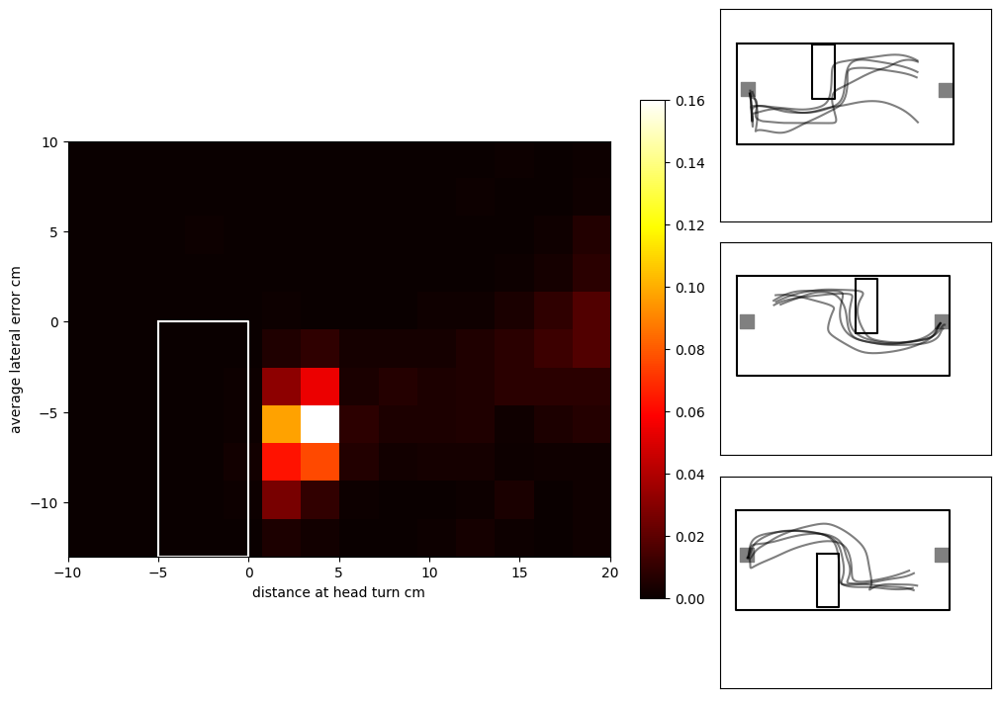

In [8]:


fig = plt.figure(layout = 'constrained',figsize=(10,7))


gs = GridSpec(ncols=6, nrows=6,figure=fig)

ax1 = fig.add_subplot(gs[:, :4])
ax1.set_xlabel('distance at head turn cm')
ax1.set_ylabel('average lateral error cm')

data = long_nostart[long_nostart.task == 'oadark']
data = data[data.turn_to_obstacle == 'towards']

#data = data[(data.head_corner_angle_velocity_at_head_turn >= -5) ]
ymin,ymax = -10,20
xmin,xmax = -13,10

head_turn,lateral_error = data.distance_at_head_turn.to_numpy(),data.avg_lateral_error.to_numpy()

array ,xedges ,yedges   = np.histogram2d(lateral_error.astype(float), head_turn.astype(float), range = [[xmin,xmax],[ymin,ymax ]],bins=(list(range(xmin,xmax,2)), list(range(ymin,ymax,2)),))

#ax1.imshow(array[::-1]/len(data),vmax = .18,cmap='hot',extent=[ymin,ymax,xmin,xmax])

ax1.plot( [-5,0,0,-5,-5], [0,0,-13,-13,0],c ='white')
fig.colorbar(ax1.imshow(array[::-1]/len(data),vmax = .16,cmap='hot',extent=[ymin,ymax,xmin,xmax]),fraction=0.046, pad=0.04)


ax2 = fig.add_subplot(gs[0:2, 4:])
ax2.set_xticks([])
ax2.set_yticks([])
trace_ax2 = data[(data.animal == 'G8CKRT') &(data.obstacle_cluster == 0)&(data.odd == 'right')].sample(5)     
plot_arena(trace_ax2,ax2,0)
plot_orginal_obstacle(trace_ax2,ax2,0)
for ind,row in trace_ax2.iterrows():
    x = gaussian_filter(row.ts_nose_x_cm.astype(float),3)
    y = gaussian_filter(row.ts_nose_y_cm.astype(float),3)
    ax2.plot(x,y,c ='black', alpha =.5 )




ax3 = fig.add_subplot(gs[2:4, 4:])
ax3.set_xticks([])
ax3.set_yticks([])
trace_ax3 = data[(data.animal == 'G8CKLN') &(data.obstacle_cluster == 1)&(data.odd == 'left')].sample(5)                
plot_arena(trace_ax3,ax3)
plot_orginal_obstacle(trace_ax3,ax3,1)
for ind,row in trace_ax3.iterrows():
    x = gaussian_filter(row.ts_nose_x_cm.astype(float),3)
    y = gaussian_filter(row.ts_nose_y_cm.astype(float),3)
    ax3.plot(x,y,c ='black', alpha =.5 )

             

ax4 = fig.add_subplot(gs[4:6, 4:])
ax4.set_xticks([])
ax4.set_yticks([])
trace_ax4 = data[(data.animal == 'G8CKLT') &(data.obstacle_cluster == 4)&(data.odd == 'right')].sample(5)
plot_arena(trace_ax4,ax4)
plot_orginal_obstacle(trace_ax4,ax4,4)
for ind,row in trace_ax4.iterrows():
    x = gaussian_filter(row.ts_nose_x_cm.astype(float),3)
    y = gaussian_filter(row.ts_nose_y_cm.astype(float),3)
    ax4.plot(x,y,c ='black', alpha =.5 )
#fig.savefig(r'd:\obstacle_avoidance\figures\SFN/distance_at_head_turn_dark.pdf')

In [604]:
data.animal.unique()

array(['J704RT', 'J704NN', 'J704LT', 'J704LN', 'G8CK1RT', 'G8CK1LT',
       'G8CK1TT', 'G8CK1LN', 'G8CKRT', 'G8CKLT', 'G8CKTT', 'G8CKRN',
       'G8CKLN'], dtype=object)

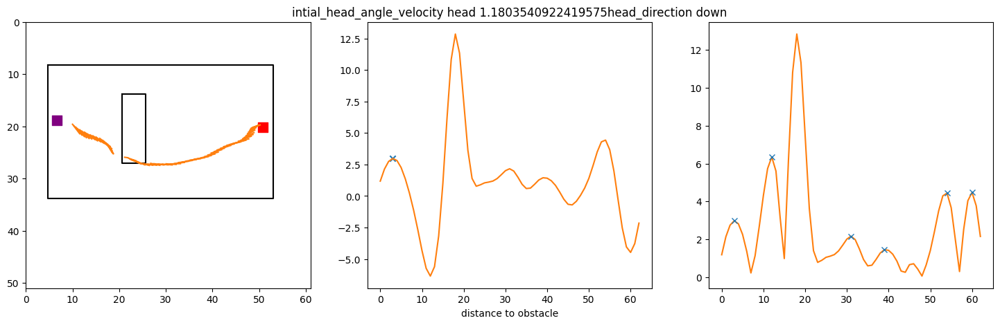

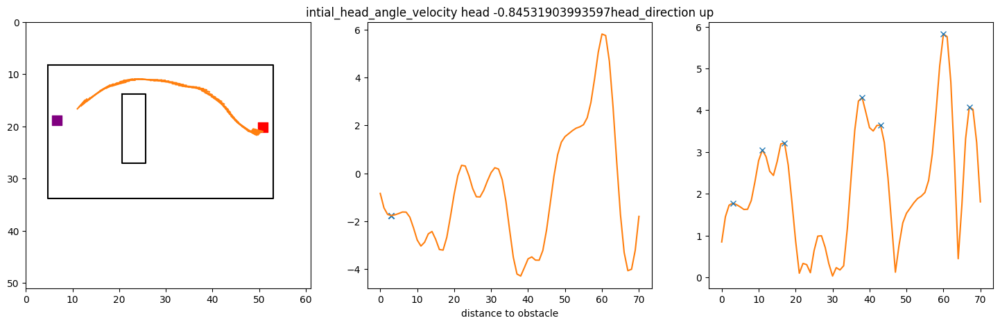

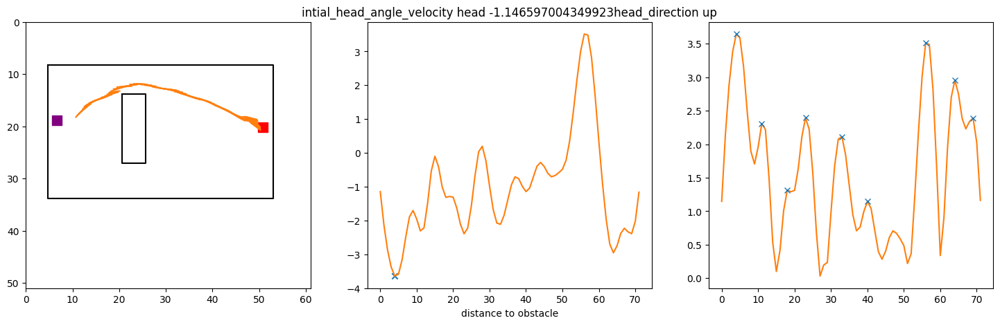

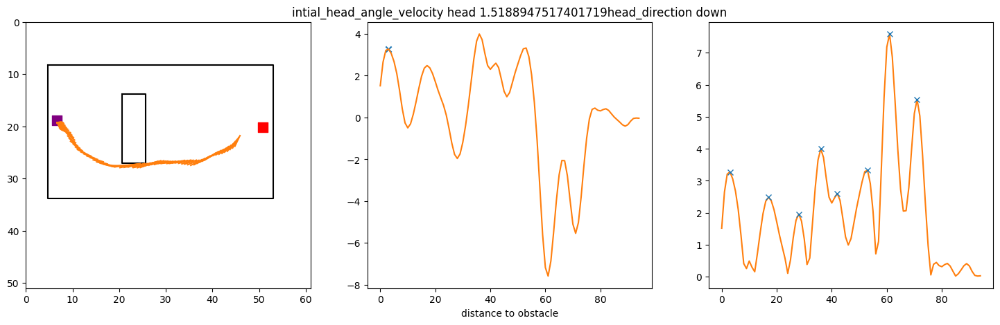

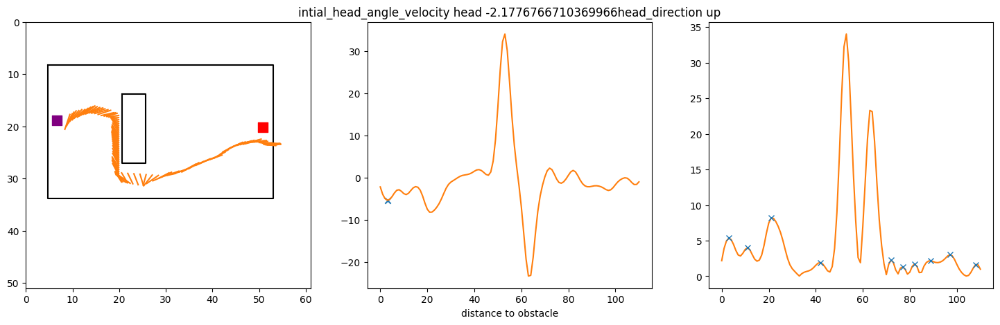

...

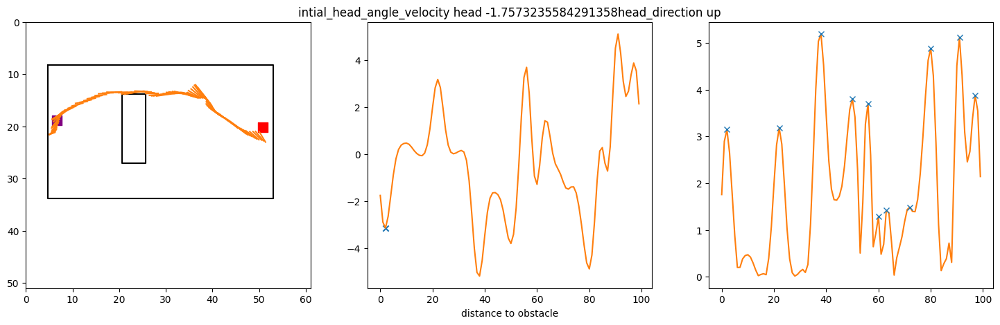

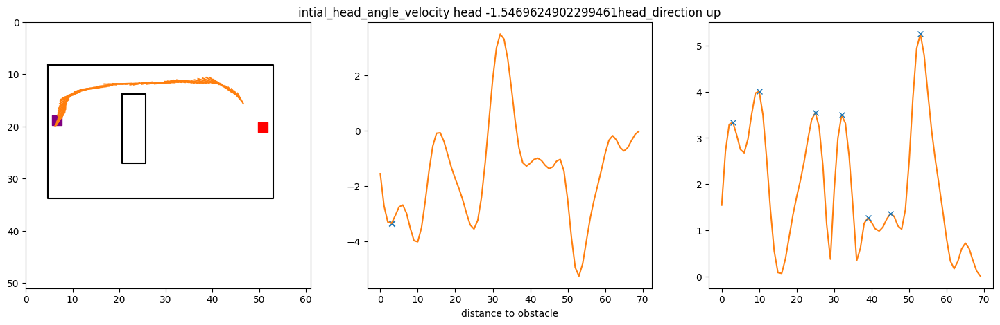

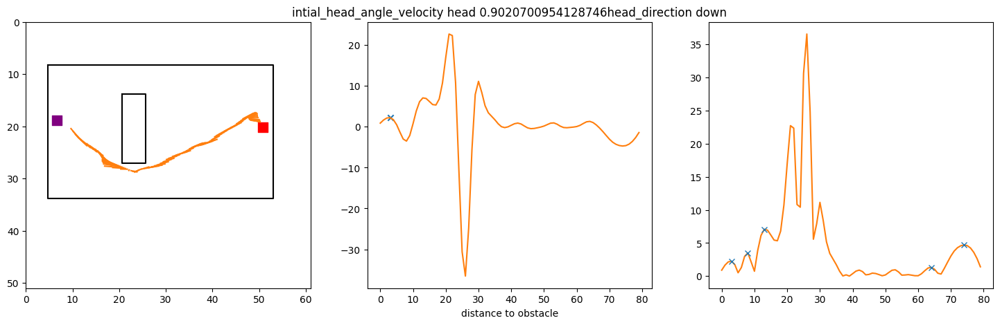

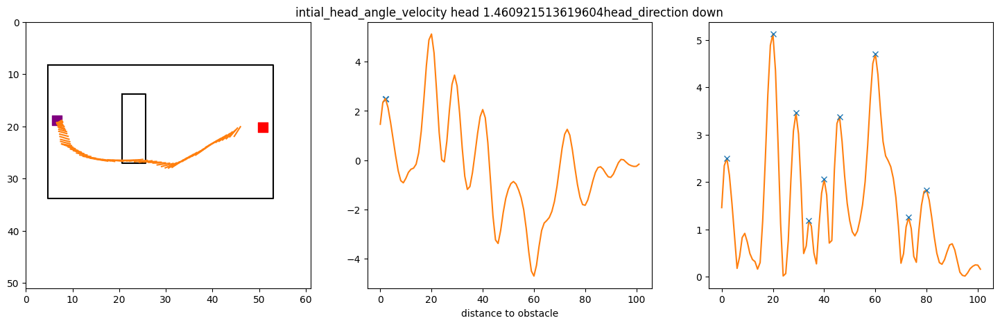

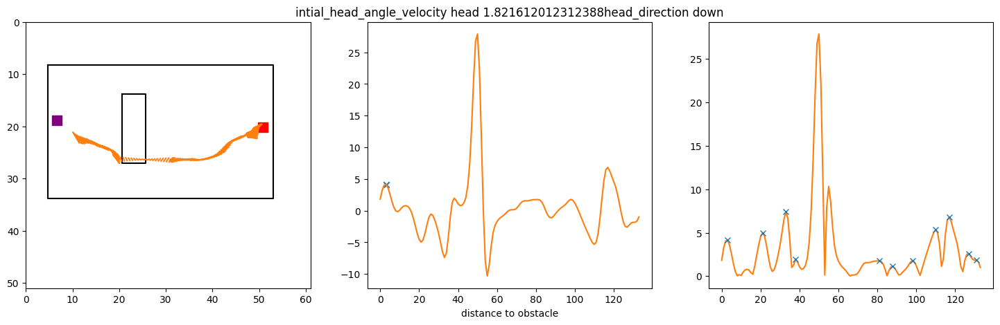

In [124]:
data = middle_nostart[(middle_nostart.task == 'oadark')&(middle_nostart.obstacle_cluster == 2)]
    
for ind,row in data.sample(20).iterrows():
    fig,ax = plt.subplots(1,3,figsize=(18,5))
    
    #ax[1].set_xlim(20,0)
    

    if row.turn_to_obstacle == 'torwards':
        ax[0].set_facecolor('grey') 
        ax[0].patch.set_alpha(.4)
    else:
        None


    plot_arena(data,ax[0])
    plot_orginal_obstacle(data,ax[0],int(row.obstacle_cluster))

    trial_df = data.loc[[ind]]

    for ind,row in trial_df.iterrows():
        peaks, _ = find_peaks(np.abs(row.head_angle_velocity), height=(1,10))
        ax[1].set_title('intial_head_angle_velocity head '+ str(row.intial_head_angle_velocity)+ 'head_direction ' + str(row.turn_direction))

        #ax[1].set_ylim(-12,2)
        ax[1].set_xlabel('distance to obstacle')
  
        ax[0].plot((row.ts_nose_x_cm,row.ts_spine_x_cm),(row.ts_nose_y_cm,row.ts_spine_y_cm),color = 'tab:orange')
        ax[1].plot(row.head_angle_velocity,color = 'tab:orange')
        ax[2].plot(np.abs(row.head_angle_velocity),color = 'tab:orange')
        ax[2].plot(peaks, np.abs(row.head_angle_velocity)[peaks], "x")
        ax[1].scatter(peaks[0], row.head_angle_velocity[peaks[0]], marker = "x")


In [660]:
from scipy.signal import find_peaks

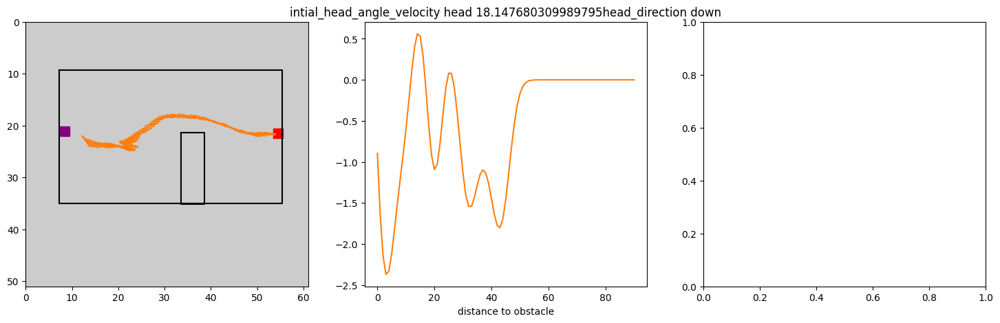

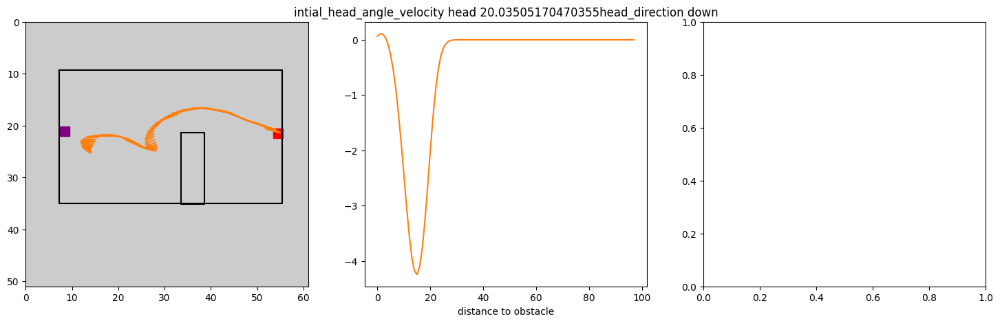

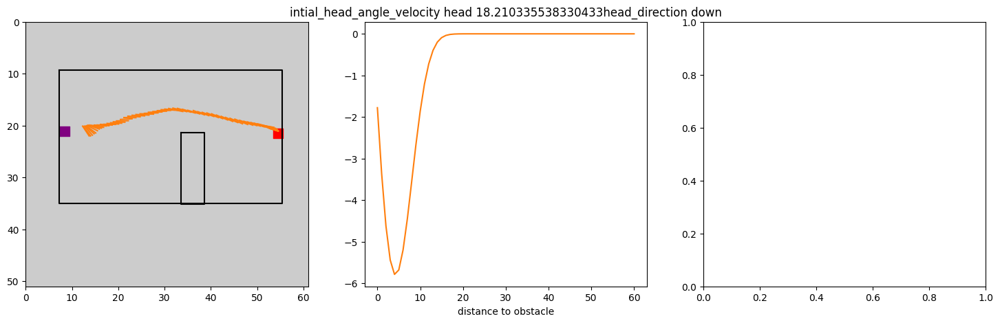

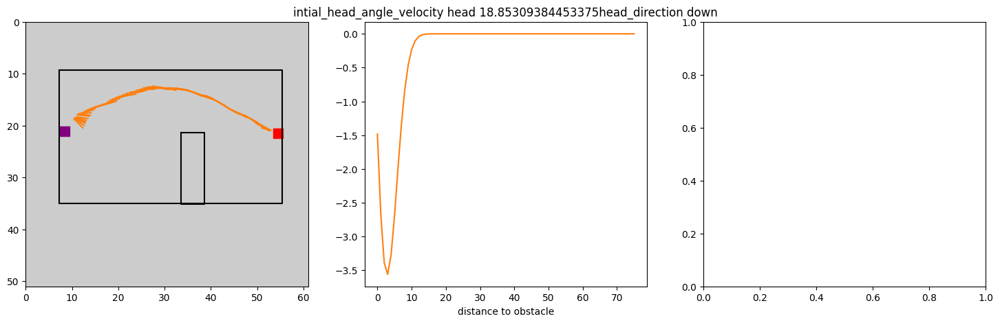

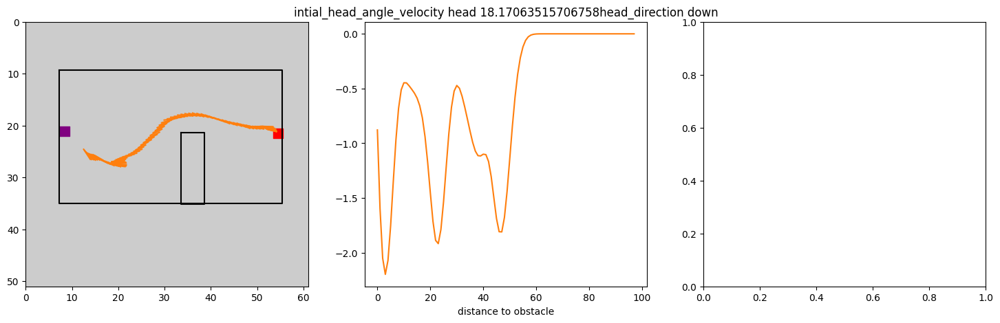

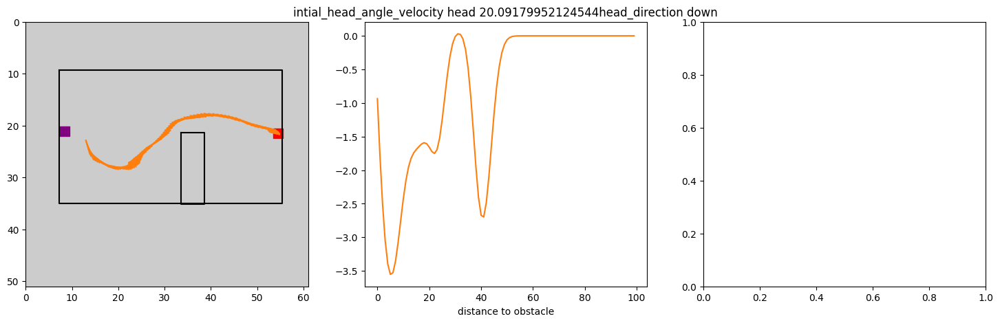

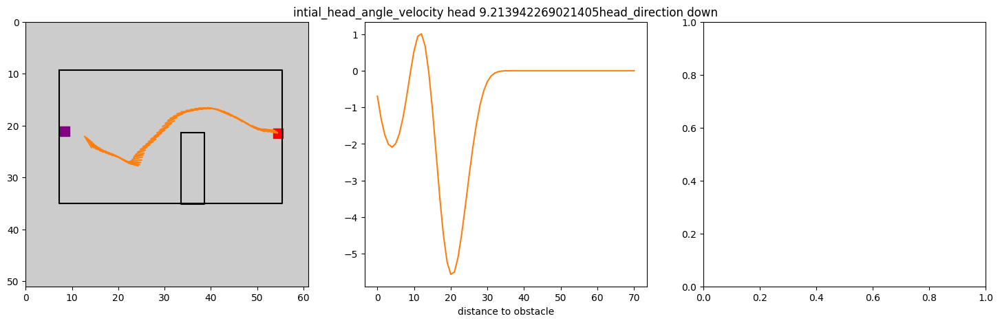

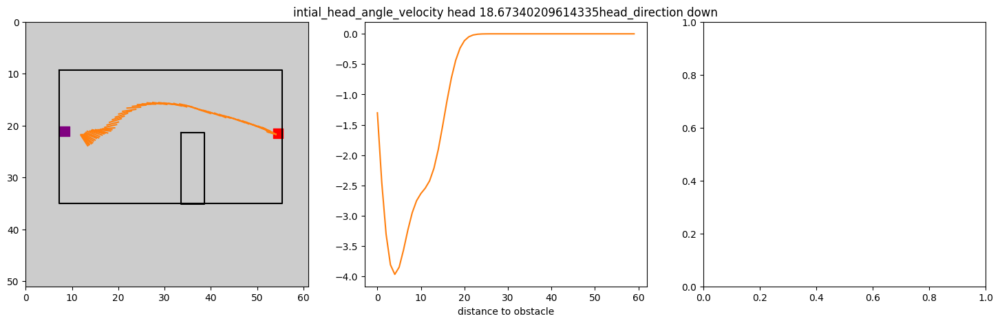

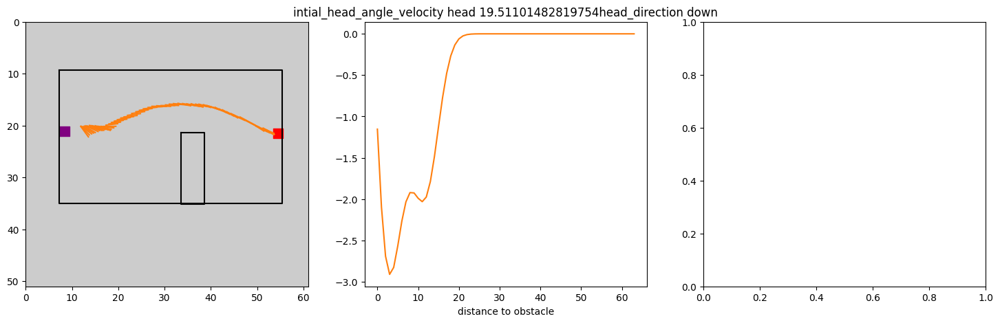

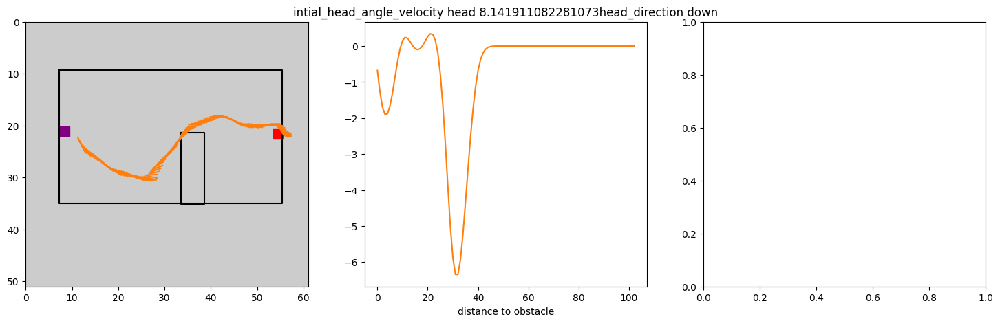

In [62]:
data = long_nostart[(long_nostart.task == 'oa')&(long_nostart.obstacle_cluster == 5)&(long_nostart.linearity > .6)&(long_nostart.turn_to_obstacle =='torwards')&(long_nostart.distance_at_head_turn >8)].sample(10)
    
for ind,row in data.iterrows():
    fig,ax = plt.subplots(1,3,figsize=(18,5))
    
    #ax[1].set_xlim(20,0)
    

    if row.turn_to_obstacle == 'torwards':
        ax[0].set_facecolor('grey') 
        ax[0].patch.set_alpha(.4)
    else:
        None


    plot_arena(data,ax[0])
    plot_orginal_obstacle(data,ax[0],int(row.obstacle_cluster))

    trial_df = data.loc[[ind]]

    for ind,row in trial_df.iterrows():
        ax[1].set_title('intial_head_angle_velocity head '+ str(row.distance_at_head_turn)+ 'head_direction ' + str(row.turn_direction))

        #ax[1].set_ylim(-12,2)
        ax[1].set_xlabel('distance to obstacle')
  
        ax[0].plot((row.ts_nose_x_cm,row.ts_spine_x_cm),(row.ts_nose_y_cm,row.ts_spine_y_cm),color = 'tab:orange')
        ax[1].plot(row.head_corner_angle_velocity,color = 'tab:orange')
       

In [66]:
row.obstacle_ind

54.0

In [63]:
row.head_corner_angle_velocity[:int(row.obstacle_ind)].argmin()

31

In [65]:
row.ts_distance_from_edge[:int(row.obstacle_ind)][31]

8.141911082281073

In [603]:
redo_ts_trace(data)

corner
port


<AxesSubplot: xlabel='turn_to_obstacle', ylabel='Density'>

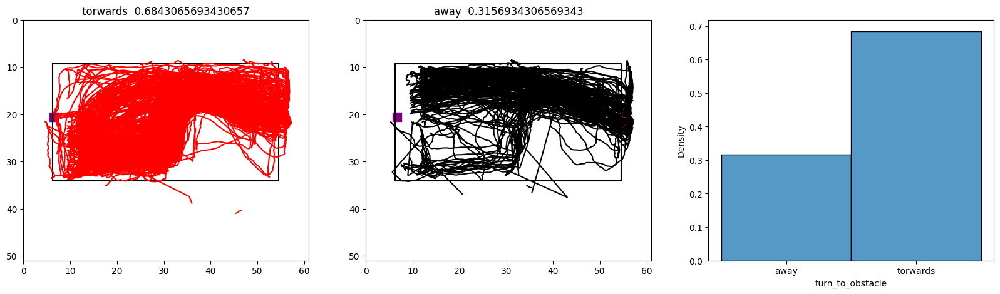

In [604]:
fig,ax = plt.subplots(1,3,figsize = (20,5))

plot_arena(data,ax[0])
ax[0].set_title('torwards  ' + str(sum(data.turn_to_obstacle == 'torwards')/len(data)))
ax[1].set_title('away  ' + str(sum(data.turn_to_obstacle == 'away')/len(data)))
plot_arena(data,ax[1])
for ind,row in data.iterrows():
    if row.turn_to_obstacle == 'torwards':
        ax[0].plot(row.ts_nose_x_cm,row.ts_nose_y_cm, c= 'red')
    else:
        ax[1].plot(row.ts_nose_x_cm,row.ts_nose_y_cm, c= 'black')

sns.histplot(ax =ax[2] ,data=data,x='turn_to_obstacle',stat='density',common_norm=False,multiple='dodge')

In [573]:
thresh = 1 
points = ['ts_nose_x','ts_nose_y','ts_nose_x_cm','ts_nose_y_cm','ts_leftear_x','ts_leftear_y','ts_leftear_x_cm','ts_leftear_y_cm','ts_rightear_x',
                  'ts_rightear_y','ts_rightear_x_cm','ts_rightear_y_cm','ts_spine_x','ts_spine_y','ts_midspine_x','ts_midspine_y','ts_spine_x_cm','ts_spine_y_cm','ts_midspine_x_cm',
                 'ts_midspine_y_cm','ts_midspine_x','ts_midspine_y','ts_midspine_x_cm','ts_midspine_y_cm','ts_tailbase_x','ts_tailbase_y','ts_tailbase_x_cm','ts_tailbase_y_cm',]

for ind, row in test_1.iterrows():
    diff_array = np.round(np.abs(np.diff(np.diff(row.ts_nose_y_cm).astype(float))))
    
    drop_inds = np.argwhere(np.round(np.abs(np.diff(np.diff(row.ts_nose_y_cm).astype(float)))) > 1).flatten()
    
 
    if len(drop_inds) <=thresh:
        continue
    else:
        if row.odd == 'left':
            nose =  row['ts_nose_x_cm'][drop_inds[-1]+1:]
            odd_ind = np.argmax(nose>(row.leftportT_x_cm+5))
            for point in points:
                test_1.at[ind,point] = row[point][drop_inds[-1]+1:][odd_ind:].astype(object)
        elif row.odd == 'right':
            nose =  row['ts_nose_x_cm'][drop_inds[-1]+1:]
            even_ind = np.argmax(nose<(row.rightportT_x_cm-5))
            for point in points:
                test_1.at[ind,point] = row[point][drop_inds[-1]+1:][even_ind:].astype(object)
heading_calcs(test_1)
distance_calcs(test_1)
deveation(test_1)
lateral_error(test_1)
df_tortuosity(test_1)
head_angle_velocity(test_1)
turn_direction(test_1)

corner
port


In [ ]:
thresh = 1 
points = ['ts_nose_x','ts_nose_y','ts_nose_x_cm','ts_nose_y_cm','ts_leftear_x','ts_leftear_y','ts_leftear_x_cm','ts_leftear_y_cm','ts_rightear_x',
                  'ts_rightear_y','ts_rightear_x_cm','ts_rightear_y_cm','ts_spine_x','ts_spine_y','ts_midspine_x','ts_midspine_y','ts_spine_x_cm','ts_spine_y_cm','ts_midspine_x_cm',
                 'ts_midspine_y_cm','ts_midspine_x','ts_midspine_y','ts_midspine_x_cm','ts_midspine_y_cm','ts_tailbase_x','ts_tailbase_y','ts_tailbase_x_cm','ts_tailbase_y_cm',]

for ind, row in df.iterrows():
    diff_array = np.round(np.abs(np.diff(np.diff(row.ts_nose_y_cm).astype(float))))
    
    drop_inds = np.argwhere(np.round(np.abs(np.diff(np.diff(row.ts_nose_y_cm).astype(float)))) > 1).flatten()
    
 
    if len(drop_inds) <=thresh:
        continue
    else:
        if row.odd == 'left':
            nose =  row['ts_nose_x_cm'][drop_inds[-1]+1:]
            odd_ind = np.argmax(nose>(row.leftportT_x_cm+5))
            for point in points:
                df.at[ind,point] = row[point][drop_inds[-1]+1:][odd_ind:].astype(object)
        elif row.odd == 'right':
            nose =  row['ts_nose_x_cm'][drop_inds[-1]+1:]
            even_ind = np.argmax(nose<(row.rightportT_x_cm-5))
            for point in points:
                df.at[ind,point] = row[point][drop_inds[-1]+1:][even_ind:].astype(object)
heading_calcs(df)
distance_calcs(df)
deveation(df)
lateral_error(df)
df_tortuosity(df)
head_angle_velocity(df)
turn_direction(df)

In [ ]:
thresh = 1 
points = ['ts_nose_x','ts_nose_y','ts_nose_x_cm','ts_nose_y_cm','ts_leftear_x','ts_leftear_y','ts_leftear_x_cm','ts_leftear_y_cm','ts_rightear_x',
                  'ts_rightear_y','ts_rightear_x_cm','ts_rightear_y_cm','ts_spine_x','ts_spine_y','ts_midspine_x','ts_midspine_y','ts_spine_x_cm','ts_spine_y_cm','ts_midspine_x_cm',
                 'ts_midspine_y_cm','ts_midspine_x','ts_midspine_y','ts_midspine_x_cm','ts_midspine_y_cm','ts_tailbase_x','ts_tailbase_y','ts_tailbase_x_cm','ts_tailbase_y_cm',]

for ind, row in test_1.iterrows():
    diff_array = np.round(np.abs(np.diff(np.diff(row.ts_nose_y_cm).astype(float))))
    
    drop_inds = np.argwhere(np.round(np.abs(np.diff(np.diff(row.ts_nose_y_cm).astype(float)))) > 1).flatten()
    mask = np.round(np.abs(np.diff(np.diff(row.ts_nose_y_cm).astype(float)))) > 1
    mask = np.invert(np.insert(mask,[0],0))
    mask = np.insert(mask,[0],-1)
 
    if len(drop_inds) <=thresh:
        continue
    else:
        nose =  row['ts_nose_x_cm'][mask]
        mask2 = np.diff(nose) > 1
        drop_ind = mask2.argmax()
        if np.abs(0 - drop_ind)<  np.abs(len(nose) - drop_ind):
            nose = nose[drop_ind:]
            if row.odd == 'left':
                odd_ind = np.argmax(nose>(row.leftportT_x_cm+5))
                for point in points:
                    test_1.at[ind,point] = row[point][mask][drop_ind:][odd_ind:].astype(object)
            elif row.odd == 'right':
                even_ind = np.argmax(nose<(row.rightportT_x_cm-5))
                for point in points:
                    test_1.at[ind,point] = row[point][mask][drop_ind:][even_ind:].astype(object)


        elif np.abs(0 - drop_ind)>  np.abs(len(nose) - drop_ind):
            nose = nose[:drop_ind]
            if row.odd == 'left':
                odd_ind = np.argmax(nose>(row.leftportT_x_cm+5))
                for point in points:
                    test_1.at[ind,point] = row[point][mask][:drop_ind][odd_ind:].astype(object)
            elif row.odd == 'right':
                even_ind = np.argmax(nose<(row.rightportT_x_cm-5))
                for point in points:
                    test_1.at[ind,point] = row[point][mask][drop_ind][even_ind:].astype(object)
heading_calcs(test_1)
distance_calcs(test_1)
deveation(test_1)
lateral_error(test_1)
df_tortuosity(test_1)
head_angle_velocity(test_1)
turn_direction(test_1)

In [2]:
light = pd.read_hdf(r'd:\obstacle_avoidance\metadata\SFN\data\G8CK_train_df.h5')
dark = pd.read_hdf(r'd:\obstacle_avoidance\metadata\SFN\data\G8CK_train_df.h5')
joint = pd.concat([light,dark])

In [633]:
def redo_ts_trace2(df,thresh == 5):
    "correct for tracking jitter"
    
    points = ['ts_nose_x','ts_nose_y','ts_nose_x_cm','ts_nose_y_cm','ts_leftear_x','ts_leftear_y','ts_leftear_x_cm','ts_leftear_y_cm','ts_rightear_x',
                  'ts_rightear_y','ts_rightear_x_cm','ts_rightear_y_cm','ts_spine_x','ts_spine_y','ts_midspine_x','ts_midspine_y','ts_spine_x_cm','ts_spine_y_cm','ts_midspine_x_cm',
                 'ts_midspine_y_cm','ts_midspine_x','ts_midspine_y','ts_midspine_x_cm','ts_midspine_y_cm','ts_tailbase_x','ts_tailbase_y','ts_tailbase_x_cm','ts_tailbase_y_cm',]
    for ind, row in df.iterrows():
        diff_array = np.diff(np.round(np.diff(row.ts_nose_y_cm).astype(float),5))
        zero_inds = np.argwhere(diff_array == 0).flatten()
        drop_inds = largest_sequentially_increasing_by_one_subarray(zero_inds)

     

        if len(drop_inds) >=thresh:
            continue
        else:
            for point in points:
                df.at[ind,point] = row[point][drop_inds[-1]:].astype(object)
    

In [685]:
redo_ts_trace2(trial_df)

In [624]:
diff_array = np.diff(np.round(np.diff(row.ts_nose_y_cm).astype(float),5))
zero_inds = np.argwhere(diff_array == 0).flatten()
zero_inds_diff = np.diff(zero_inds)



In [602]:
def largest_sequentially_increasing_by_one_subarray(arr):
    max_len = 1  # To store the length of the largest sequential segment
    max_start = 0  # To store the start index of the largest segment
    start = 0  # Start index of the current sequential segment

    # Iterate over the array to find sequentially increasing by 1 segments
    for i in range(1, len(arr)):
        # If the current element is not exactly 1 greater than the previous one
        if arr[i] != arr[i - 1] + 1:
            # Calculate the length of the current segment
            length = i - start
            if length > max_len:
                max_len = length
                max_start = start
            # Start a new segment from the current element
            start = i

    # Handle the case if the largest segment is at the end of the array
    if len(arr) - start > max_len:
        max_start = start
        max_len = len(arr) - start

    # Return the largest sequentially increasing by 1 subarray
    return arr[max_start:max_start + max_len]

In [102]:
keys = ['nose','leftear','rightear','spine','midspine','tailbase']
keys_list = list_columns(joint,keys)
keys_list= [col for col in keys_list if 'likelihood' not in col]
keys_list= [col for col in keys_list if 'lind' not in col]
keys_list= [col for col in keys_list if 'ts_'  in col]

In [104]:
points = ['ts_nose_x','ts_nose_y',
'ts_nose_x_cm',
'ts_nose_y_cm',
'ts_leftear_x',
'ts_leftear_y',
'ts_leftear_x_cm',
'ts_leftear_y_cm',
'ts_rightear_x',
'ts_rightear_y',
'ts_rightear_x_cm',
'ts_rightear_y_cm',
'ts_spine_x',
'ts_spine_y',
'ts_midspine_x',
'ts_midspine_y',
'ts_spine_x_cm',
'ts_spine_y_cm',
'ts_midspine_x_cm',
'ts_midspine_y_cm',
'ts_midspine_x',
'ts_midspine_y',
'ts_midspine_x_cm',
'ts_midspine_y_cm',
'ts_tailbase_x',
'ts_tailbase_y',
'ts_tailbase_x_cm',
'ts_tailbase_y_cm',]

In [113]:
def redo_ts_trace(df):
    "correct for tracking jitter"
    points = ['ts_nose_x','ts_nose_y','ts_nose_x_cm','ts_nose_y_cm','ts_leftear_x','ts_leftear_y','ts_leftear_x_cm','ts_leftear_y_cm','ts_rightear_x',
              'ts_rightear_y','ts_rightear_x_cm','ts_rightear_y_cm','ts_spine_x','ts_spine_y','ts_midspine_x','ts_midspine_y','ts_spine_x_cm','ts_spine_y_cm','ts_midspine_x_cm',
             'ts_midspine_y_cm','ts_midspine_x','ts_midspine_y','ts_midspine_x_cm','ts_midspine_y_cm','ts_tailbase_x','ts_tailbase_y','ts_tailbase_x_cm','ts_tailbase_y_cm',]
    for ind, row in df.iterrows():
        if np.argwhere(row.ts_speed>100).flatten().tolist() ==0:
            continue
        else:
            inds_to_drop = np.argwhere(row.ts_speed>100).flatten().tolist()[-1]
            for point in points:
                df.at[ind,points] = row[key][inds_to_drop:]
    heading_calcs(df)
    distance_calcs(df)
    deveation(df)
    lateral_error(df)
    df_tortuosity(df)
    head_angle_velocity(df)

             
        

(-5.0, 5.0)

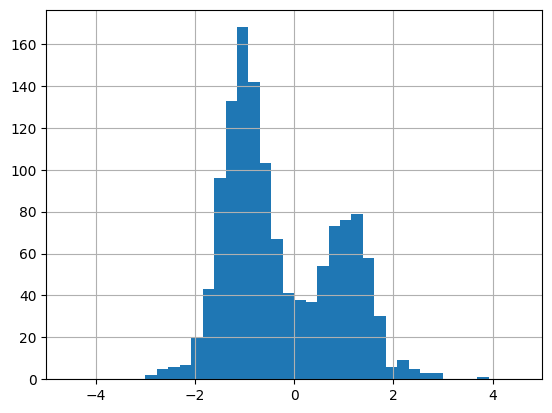

In [733]:
long_nostart[(long_nostart.odd =='left')&(long_nostart.obstacle_cluster ==1)].intial_head_angle_velocity.hist(bins=100)
plt.xlim(-5,5)

(-5.0, 5.0)

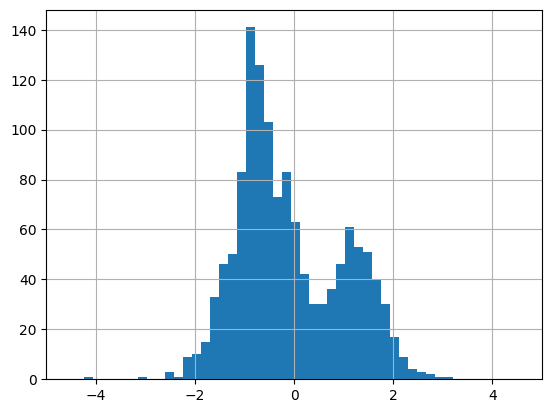

In [734]:
long_nostart[(long_nostart.odd =='right')&(long_nostart.obstacle_cluster ==0)].intial_head_angle_velocity.hist(bins=100)
plt.xlim(-5,5)

(-5.0, 5.0)

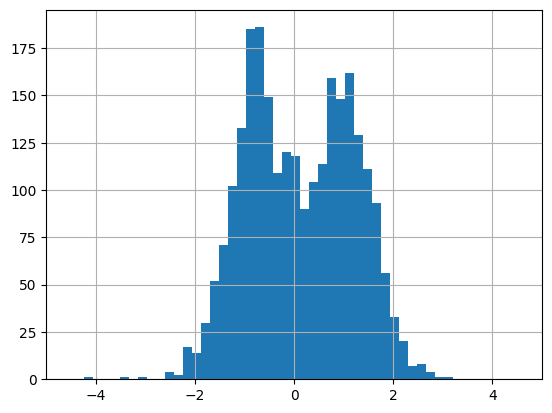

In [767]:
long_nostart[long_nostart.odd =='right'].intial_head_angle_velocity.hist(bins=100)
plt.xlim(-5,5)

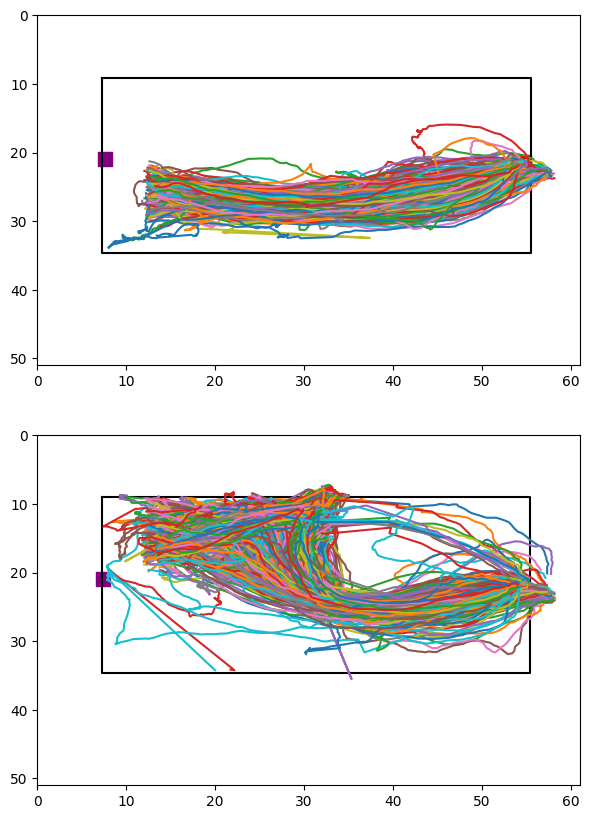

In [711]:
fig,ax = plt.subplots(2,1,figsize = (7,10))
date = 0
cluster = 1
inway = long_nostart[(long_nostart.task=='oa')&(long_nostart.obstacle_cluster==cluster)&(long_nostart.intial_head_angle_velocity>0)&(long_nostart.avg_lateral_error>2)]
outway = long_nostart[(long_nostart.task=='oa')&(long_nostart.obstacle_cluster==cluster)&(long_nostart.intial_head_angle_velocity<0)&(long_nostart.avg_lateral_error<-2)]
plot_arena(inway,ax[0])
plot_arena(outway,ax[1])
for ind,row in inway.iterrows():
    ax[0].plot(row.ts_nose_x_cm,row.ts_nose_y_cm)
for ind,row in outway.iterrows():
    ax[1].plot(row.ts_nose_x_cm,row.ts_nose_y_cm)

In [147]:
joint.head_angle.to_numpy()[0].size

242

In [149]:
joint.ts_distance_from_target_port.to_numpy()[0].size

242

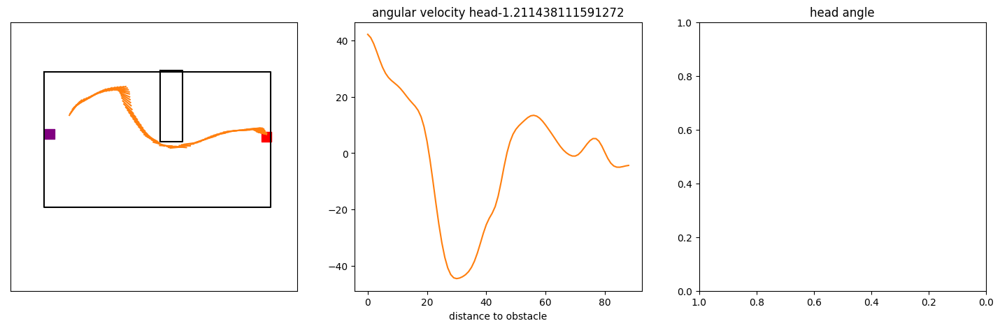

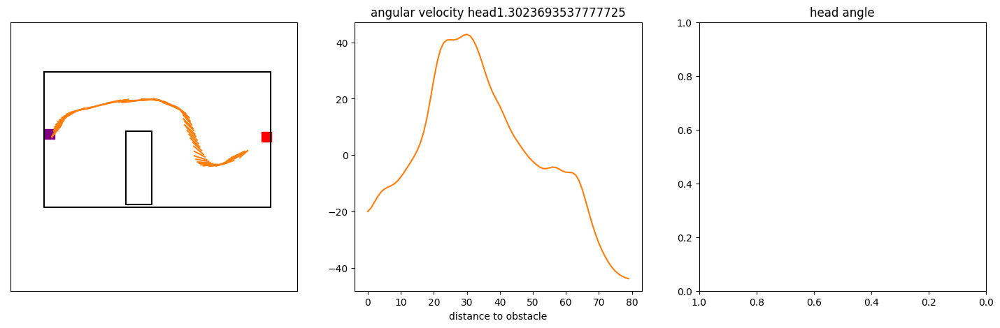

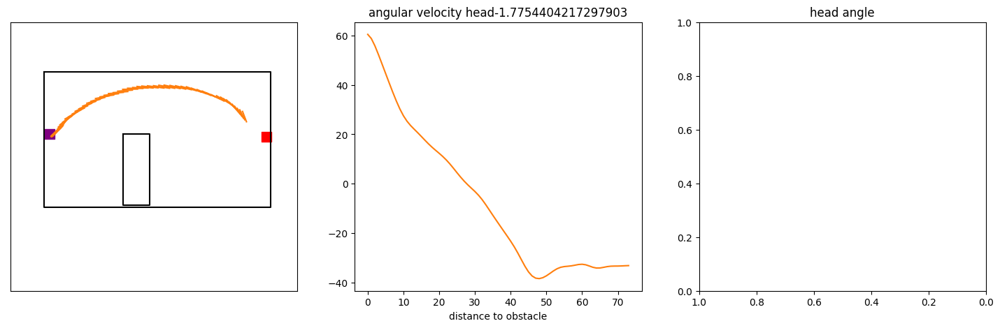

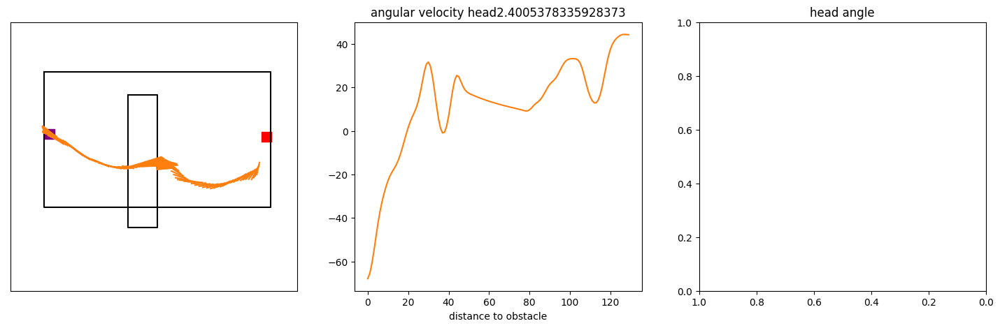

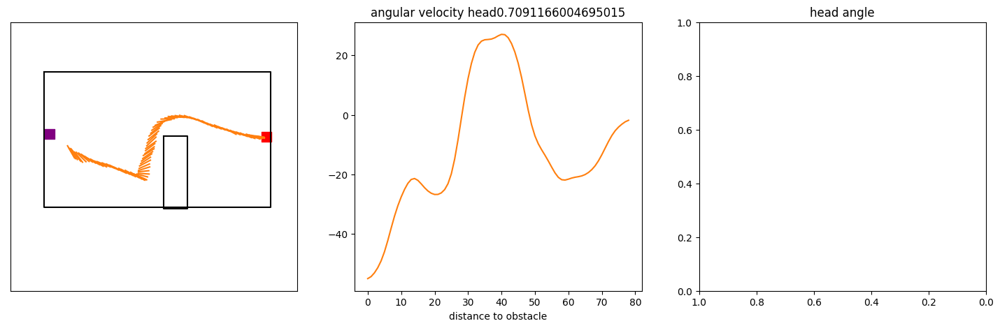

...

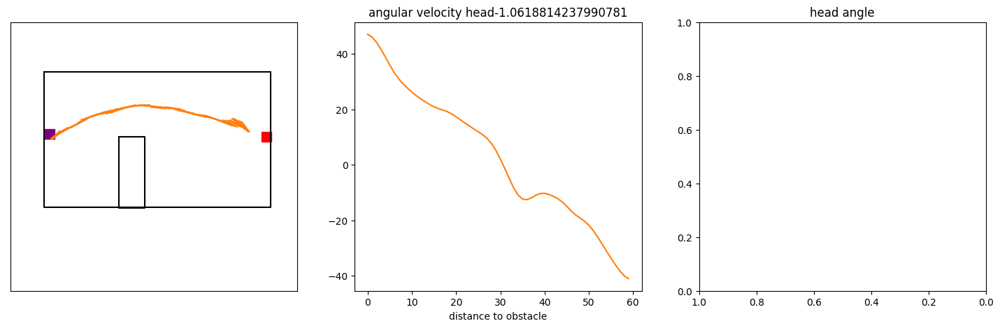

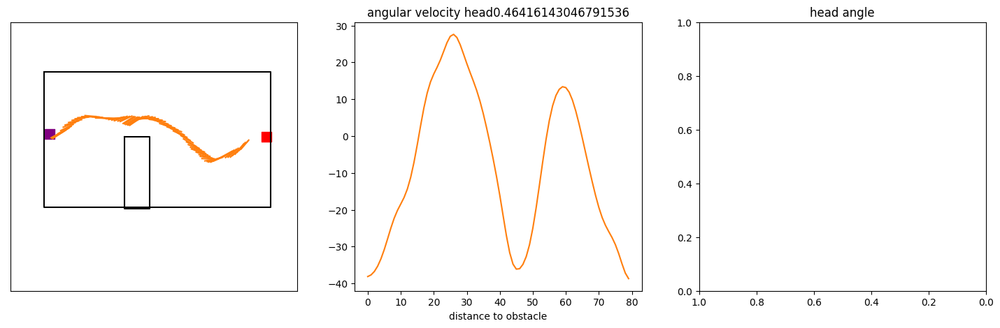

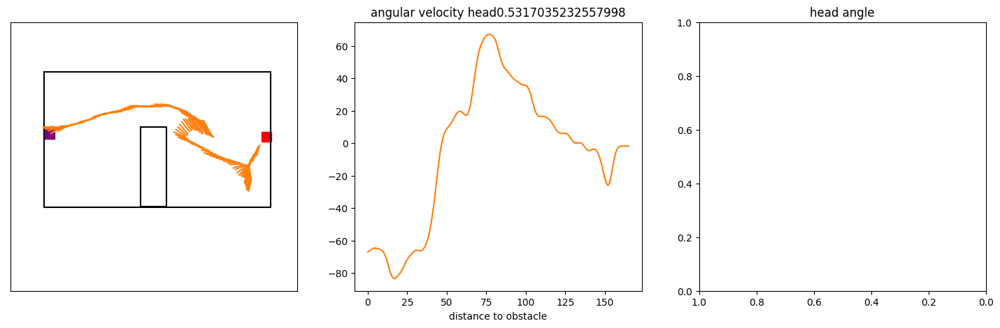

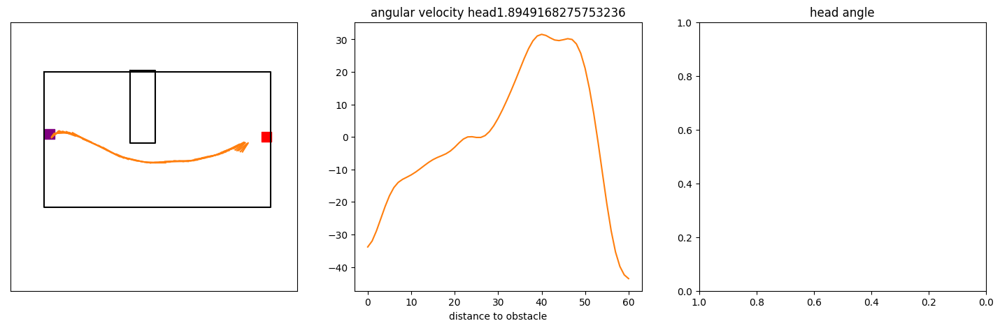

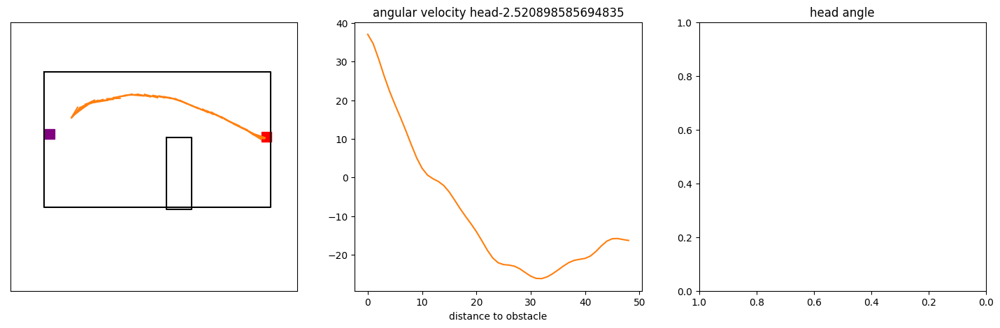

In [138]:
test = long_nostart[long_nostart.date_index == 6.0].sample(15)
for ind,row in test.iterrows():
    
        
    fig,ax = plt.subplots(1,3,figsize=(18,5))
    ax[0].set_xticks([])
    ax[0].set_yticks([])
   
    #ax[1].set_xlim(20,0)
    ax[2].invert_xaxis()
   # ax[2].set_xlim(20,0)
    if row.task == 'oadark':
        ax[0].set_facecolor('grey') 
        ax[0].patch.set_alpha(.4)
    else:
        None


    trial_df = test.loc[[ind]]
    plot_arena(test,ax[0])
    plot_orginal_obstacle(trial_df,ax[0],int(row.obstacle_cluster))



    #ax[0].set_title()
   
    ax[1].set_title('angular velocity head'+ str(row.intial_head_angle_velocity))
    ax[2].set_title('head angle')
   
    #ax[1].set_ylim(-12,2)
    ax[1].set_xlabel('distance to obstacle')
    

  
    ax[0].plot((row.ts_nose_x_cm,row.ts_spine_x_cm),(row.ts_nose_y_cm,row.ts_spine_y_cm),color = 'tab:orange')
    ax[1].plot(row.head_angle,color = 'tab:orange')
    max = np.nanargmax(row.head_angle_velocity)
    min = np.nanargmin(row.head_angle_velocity)


In [732]:
light_trial_permin = pd.read_hdf(r"D:\obstacle_avoidance\metadata\SFN\data\light_trial_permin.h5")

<AxesSubplot: xlabel='Days', ylabel=' '>

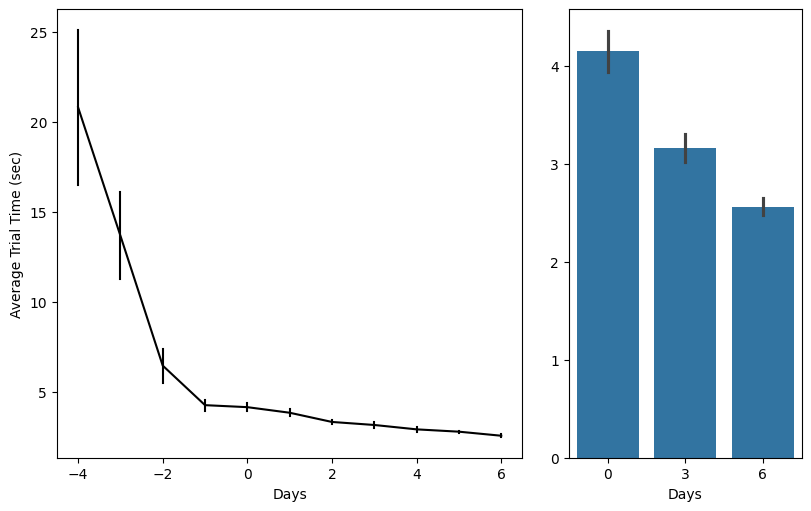

In [733]:

line = light_trial_permin[(light_trial_permin.date_index >=-4) & (light_trial_permin.date_index <=6)]
plt.rc('axes',edgecolor='black')
fig = plt.figure(layout="constrained",figsize = (8,5))

gs = GridSpec(1, 6, figure=fig)
ax1 = fig.add_subplot(gs[0, 0:4])
ax1.set_xlabel('days')
ax1.set_ylabel('trial Time (sec)')
ax2 = fig.add_subplot(gs[0, 4:])
ax2.set_xlabel('Days')
ax2.set_ylabel(' ')


sns.lineplot(ax = ax1, data =line,x = 'date_index',y='trial_time' ,errorbar='se',err_style='bars',color = 'black')

bar =  light_trial_permin[(light_trial_permin.date_index == 0.0 ) | (light_trial_permin.date_index ==6.0)| (light_trial_permin.date_index ==3.0)]
sns.barplot(ax = ax2, data =bar,x = bar.date_index.astype(int),y='trial_time',errorbar = 'se')
